In [1]:
import gym
import Antonio_FlexEnv_Charge_Discharge as flex

import Antonio_auxfunctions_Charge_Discharge as fun

import stable_baselines3

from stable_baselines3 import DQN, A2C
from stable_baselines3.a2c.policies import MlpPolicy

from stable_baselines3.common.evaluation import evaluate_policy
from stable_baselines3.common.monitor import Monitor
from stable_baselines3.common.env_checker import check_env

from stable_baselines3 import SAC
from stable_baselines3 import DDPG

from stable_baselines3 import PPO
from stable_baselines3.common.env_util import make_vec_env

from stable_baselines3.ddpg.policies import MlpPolicy


import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import numpy.random as rnd
import time
import random as rnd

from time import perf_counter

# Data and Environment preparation

In [2]:
#Data
cwd=os.getcwd()
datafolder=cwd + '/Data'

#impor the data csv
env_data=pd.read_csv(datafolder + '/env_data.csv', header = None)

#make and check the environment
# Select the number of timesteps to consider
# timesteps=141
timesteps=47

#Create environment. Based on the aux functions code.
env=fun.make_env(env_data, load_num=4, timestep=timesteps, soc_max=2, eta=0.95, charge_lim=2, min_charge_step=0.5)

In [3]:
env.observation_space

Box([   0.    0.    0.    0.    0.    0. -100.    0. -100.], [ 47.  10.  10.   2.   2.   1. 100.   1. 100.], (9,), float32)

In [4]:
env.observation_space.high[3]

2.0

In [5]:
env.action_space

Discrete(25)

# Stable Baselines ALGORITHMS

In [6]:
##DQN
## parameters
gamma=0.99
learning_rate=1e-3
buffer_size=1e6

exploration_fraction=0.01
exploration_final_eps=0.02 
exploration_initial_eps=1.0
train_freq=1
batch_size=32
double_q=True
learning_starts=1000
target_network_update_freq=500

prioritized_replay=False
prioritized_replay_alpha=0.6
prioritized_replay_beta0=0.4
prioritized_replay_beta_iters=None
prioritized_replay_eps=1e-06
param_noise=True
n_cpu_tf_sess=None
verbose=0 
tensorboard_log=None
_init_setup_model=True
policy_kwargs=None
full_tensorboard_log=False
seed=None
# Policy='LnMlpPolicy'

t1_start = perf_counter()

## Train model
model = DQN('MlpPolicy', env, learning_rate=learning_rate, verbose=1,batch_size=batch_size,exploration_fraction=exploration_fraction,)
model.learn(total_timesteps=int(5e6))

t1_stop = perf_counter()
print("\nElapsed time:", t1_stop, t1_start)
print("Elapsed time during the whole program in seconds:", t1_stop-t1_start)

##Proximal Policy Optimization
# model = PPO("MlpPolicy", env, verbose=1)
# model.learn(total_timesteps=4e5)


## Other algorithms
#SAC
# model = SAC('MlpPolicy', env, verbose=2).learn(total_timesteps=1e5)

#A2C
# model = A2C(MlpPolicy, env, verbose=1)
# model.learn(total_timesteps=25000)



Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
-108667.29999999996
-139808.19999999998
-146966.94999999998
-117033.05000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.28e+05 |
|    exploration_rate | 0.996     |
| time/               |           |
|    episodes         | 4         |
|    fps              | 2803      |
|    time_elapsed     | 0         |
|    total_timesteps  | 188       |
-----------------------------------
-161860.0
-122163.49999999996
-149096.15
-111806.50000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.32e+05 |
|    exploration_rate | 0.993     |
| time/               |           |
|    episodes         | 8         |
|    fps              | 2966      |
|    time_elapsed     | 0         |
|    total_timesteps  | 376       |
---------

/home/acr/anaconda3/lib/python3.9/site-packages/torch/cuda/__init__.py:80: UserWarning: CUDA initialization: CUDA unknown error - this may be due to an incorrectly set up environment, e.g. changing env variable CUDA_VISIBLE_DEVICES after program start. Setting the available devices to be zero. (Triggered internally at  ../c10/cuda/CUDAFunctions.cpp:112.)
  return torch._C._cuda_getDeviceCount() > 0


-125235.25000000001
-133978.05000000002
-113005.90000000002
-114737.49999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.3e+05 |
|    exploration_rate | 0.986    |
| time/               |          |
|    episodes         | 16       |
|    fps              | 2780     |
|    time_elapsed     | 0        |
|    total_timesteps  | 752      |
----------------------------------
-126617.15000000001
-172829.60000000003
-115142.95000000003
-135470.19999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.31e+05 |
|    exploration_rate | 0.982     |
| time/               |           |
|    episodes         | 20        |
|    fps              | 2827      |
|    time_elapsed     | 0         |
|    total_timesteps  | 940       |
-----------------------------------
-136817.65000000002
-135221.95
-95680.79999999999
-63357.54

-151905.69999999998
-148814.65000000002
-148225.55000000002
-118206.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+05 |
|    exploration_rate | 0.921     |
| time/               |           |
|    episodes         | 88        |
|    fps              | 2887      |
|    time_elapsed     | 1         |
|    total_timesteps  | 4136      |
-----------------------------------
-116155.60000000002
-115801.80000000002
-139887.40000000002
-141347.90000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+05 |
|    exploration_rate | 0.918     |
| time/               |           |
|    episodes         | 92        |
|    fps              | 2910      |
|    time_elapsed     | 1         |
|    total_timesteps  | 4324      |
-----------------------------------
-142881.95
-174222.6
-123397.9
-162336.449999999

-136873.05000000002
-161739.35000000003
-150388.90000000002
-105398.39999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.28e+05 |
|    exploration_rate | 0.857     |
| time/               |           |
|    episodes         | 160       |
|    fps              | 2956      |
|    time_elapsed     | 2         |
|    total_timesteps  | 7520      |
-----------------------------------
-85522.30000000002
-119127.00000000001
-95719.74999999997
-146997.25000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.27e+05 |
|    exploration_rate | 0.854     |
| time/               |           |
|    episodes         | 164       |
|    fps              | 2945      |
|    time_elapsed     | 2         |
|    total_timesteps  | 7708      |
-----------------------------------
-95542.99999999999
-125510.54999999997
-81014.8499

-104620.35000000002
-137449.94999999998
-103043.40000000001
-111014.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.25e+05 |
|    exploration_rate | 0.793     |
| time/               |           |
|    episodes         | 232       |
|    fps              | 2941      |
|    time_elapsed     | 3         |
|    total_timesteps  | 10904     |
-----------------------------------
-142692.95
-135678.15
-67236.04999999999
-89995.35
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.25e+05 |
|    exploration_rate | 0.789     |
| time/               |           |
|    episodes         | 236       |
|    fps              | 2942      |
|    time_elapsed     | 3         |
|    total_timesteps  | 11092     |
-----------------------------------
-102883.34999999999
-128556.45
-142006.99999999997
-124483.49999999997
----------------

-154605.45
-135103.4
-157406.25
-142154.80000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.26e+05 |
|    exploration_rate | 0.729     |
| time/               |           |
|    episodes         | 304       |
|    fps              | 2841      |
|    time_elapsed     | 5         |
|    total_timesteps  | 14288     |
-----------------------------------
-144113.35000000003
-127570.30000000002
-125539.65000000001
-98253.34999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.26e+05 |
|    exploration_rate | 0.725     |
| time/               |           |
|    episodes         | 308       |
|    fps              | 2842      |
|    time_elapsed     | 5         |
|    total_timesteps  | 14476     |
-----------------------------------
-93944.09999999996
-122478.95
-122228.45000000004
-91985.15000000001
--------

-135704.05
-89520.05000000002
-127903.40000000001
-119335.50000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.26e+05 |
|    exploration_rate | 0.664     |
| time/               |           |
|    episodes         | 376       |
|    fps              | 2845      |
|    time_elapsed     | 6         |
|    total_timesteps  | 17672     |
-----------------------------------
-123017.10000000002
-117185.75
-104186.05000000002
-164380.40000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.26e+05 |
|    exploration_rate | 0.661     |
| time/               |           |
|    episodes         | 380       |
|    fps              | 2849      |
|    time_elapsed     | 6         |
|    total_timesteps  | 17860     |
-----------------------------------
-122594.6
-115216.15000000004
-101273.25000000001
-131368.05
------

-108098.74999999999
-157589.70000000004
-90053.84999999998
-138997.65
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.3e+05 |
|    exploration_rate | 0.6      |
| time/               |          |
|    episodes         | 448      |
|    fps              | 2851     |
|    time_elapsed     | 7        |
|    total_timesteps  | 21056    |
----------------------------------
-94175.50000000001
-118728.39999999998
-106344.84999999999
-148152.40000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.3e+05 |
|    exploration_rate | 0.596    |
| time/               |          |
|    episodes         | 452      |
|    fps              | 2852     |
|    time_elapsed     | 7        |
|    total_timesteps  | 21244    |
----------------------------------
-132326.25
-150846.4
-122538.95
-140140.24999999997
-----------------------------

-96328.84999999999
-78952.45
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.26e+05 |
|    exploration_rate | 0.536     |
| time/               |           |
|    episodes         | 520       |
|    fps              | 2874      |
|    time_elapsed     | 8         |
|    total_timesteps  | 24440     |
-----------------------------------
-159958.10000000003
-143511.84999999998
-173940.65
-160673.15
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.27e+05 |
|    exploration_rate | 0.532     |
| time/               |           |
|    episodes         | 524       |
|    fps              | 2877      |
|    time_elapsed     | 8         |
|    total_timesteps  | 24628     |
-----------------------------------
-156310.54999999996
-150759.14999999997
-100230.69999999998
-104772.2
-----------------------------------
| rollout/ 

-143625.69999999995
-112722.40000000001
-117336.95
-114510.75000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.28e+05 |
|    exploration_rate | 0.471     |
| time/               |           |
|    episodes         | 592       |
|    fps              | 2921      |
|    time_elapsed     | 9         |
|    total_timesteps  | 27824     |
-----------------------------------
-123019.75
-110052.3
-146635.0
-141564.49999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+05 |
|    exploration_rate | 0.468     |
| time/               |           |
|    episodes         | 596       |
|    fps              | 2919      |
|    time_elapsed     | 9         |
|    total_timesteps  | 28012     |
-----------------------------------
-115760.00000000001
-130419.65000000001
-178018.0
-70047.09999999999
-----------------

-117019.74999999999
-107538.7
-125148.50000000001
-120866.49999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.28e+05 |
|    exploration_rate | 0.407     |
| time/               |           |
|    episodes         | 664       |
|    fps              | 2981      |
|    time_elapsed     | 10        |
|    total_timesteps  | 31208     |
-----------------------------------
-114147.85000000002
-124899.19999999997
-131731.65000000002
-119944.95000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.27e+05 |
|    exploration_rate | 0.403     |
| time/               |           |
|    episodes         | 668       |
|    fps              | 2986      |
|    time_elapsed     | 10        |
|    total_timesteps  | 31396     |
-----------------------------------
-104845.04999999994
-106736.85000000005
-157461.0500000000

-118198.14999999998
-150683.6
-165332.15000000008
-126667.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.26e+05 |
|    exploration_rate | 0.343     |
| time/               |           |
|    episodes         | 736       |
|    fps              | 3026      |
|    time_elapsed     | 11        |
|    total_timesteps  | 34592     |
-----------------------------------
-148324.75
-88822.35
-121469.25000000003
-144604.85
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.26e+05 |
|    exploration_rate | 0.339     |
| time/               |           |
|    episodes         | 740       |
|    fps              | 3022      |
|    time_elapsed     | 11        |
|    total_timesteps  | 34780     |
-----------------------------------
-129391.10000000002
-137522.90000000002
-69653.19999999998
-149885.35000000003
-----------------

-115096.59999999996
-119114.8
-139084.4
-85605.09999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.28e+05 |
|    exploration_rate | 0.278     |
| time/               |           |
|    episodes         | 808       |
|    fps              | 3029      |
|    time_elapsed     | 12        |
|    total_timesteps  | 37976     |
-----------------------------------
-149325.74999999997
-169586.8
-129969.79999999999
-128332.35000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+05 |
|    exploration_rate | 0.275     |
| time/               |           |
|    episodes         | 812       |
|    fps              | 3030      |
|    time_elapsed     | 12        |
|    total_timesteps  | 38164     |
-----------------------------------
-123906.59999999998
-149685.85000000003
-125907.8
-93033.55
-------------------

-99457.29999999997
-144735.64999999997
-145703.85
-166921.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.26e+05 |
|    exploration_rate | 0.214     |
| time/               |           |
|    episodes         | 880       |
|    fps              | 3023      |
|    time_elapsed     | 13        |
|    total_timesteps  | 41360     |
-----------------------------------
-91295.50000000001
-104388.40000000002
-107455.54999999997
-89886.39999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.26e+05 |
|    exploration_rate | 0.211     |
| time/               |           |
|    episodes         | 884       |
|    fps              | 3021      |
|    time_elapsed     | 13        |
|    total_timesteps  | 41548     |
-----------------------------------
-95998.34999999999
-94855.35
-107621.30000000002
-105538.64999999998
-

-107008.35000000002
-142567.55000000002
-127541.84999999996
-141499.95
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.25e+05 |
|    exploration_rate | 0.15      |
| time/               |           |
|    episodes         | 952       |
|    fps              | 3029      |
|    time_elapsed     | 14        |
|    total_timesteps  | 44744     |
-----------------------------------
-118846.10000000002
-146355.80000000002
-112590.6
-156617.09999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.25e+05 |
|    exploration_rate | 0.146     |
| time/               |           |
|    episodes         | 956       |
|    fps              | 3032      |
|    time_elapsed     | 14        |
|    total_timesteps  | 44932     |
-----------------------------------
-165116.6
-91752.75
-140317.45
-123906.0
--------------------------

-123233.8
-117388.04999999999
-147091.89999999997
-134916.80000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.27e+05 |
|    exploration_rate | 0.0856    |
| time/               |           |
|    episodes         | 1024      |
|    fps              | 3070      |
|    time_elapsed     | 15        |
|    total_timesteps  | 48128     |
-----------------------------------
-152824.55000000002
-132386.55
-121277.74999999997
-95492.39999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.27e+05 |
|    exploration_rate | 0.082     |
| time/               |           |
|    episodes         | 1028      |
|    fps              | 3072      |
|    time_elapsed     | 15        |
|    total_timesteps  | 48316     |
-----------------------------------
-77188.30000000002
-143280.4
-165933.55000000002
-154289.84999999998

18734.8
-7891.600000000006
32446.199999999997
-15910.85
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.04e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1088      |
|    fps              | 2566      |
|    time_elapsed     | 19        |
|    total_timesteps  | 51136     |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.3e+03   |
|    n_updates        | 283       |
-----------------------------------
-3230.949999999999
-46371.70000000001
2835.55
-15679.15
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1e+05   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1092     |
|    fps              | 2506     |
|    time_elapsed     | 20       |
|    total_timesteps  | 51324    

32446.199999999997
4348.700000000001
32446.199999999997
32446.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.81e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1144      |
|    fps              | 1925      |
|    time_elapsed     | 27        |
|    total_timesteps  | 53768     |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 843       |
|    n_updates        | 941       |
-----------------------------------
20877.699999999997
32446.199999999997
-6653.850000000002
-33111.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.26e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1148      |
|    fps              | 1879      |
|    time_elapsed     | 28    

16333.699999999997
7945.399999999994
-27612.7
32446.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 5.58e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1200     |
|    fps              | 1550     |
|    time_elapsed     | 36       |
|    total_timesteps  | 56400    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 970      |
|    n_updates        | 1599     |
----------------------------------
32446.199999999997
-38320.50000000001
32446.199999999997
-9539.65
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 5.84e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1204     |
|    fps              | 1526     |
|    time_elapsed     | 37       |
|    total_timesteps  | 56588

-35110.649999999994
-5027.9
20908.5
32446.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 402      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1256     |
|    fps              | 1312     |
|    time_elapsed     | 44       |
|    total_timesteps  | 59032    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.4e+03  |
|    n_updates        | 2257     |
----------------------------------
21365.199999999997
-10114.849999999997
-7556.549999999997
-40649.15
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.04e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1260     |
|    fps              | 1306     |
|    time_elapsed     | 45       |
|    total_timesteps  | 59220    |
| 

1272.7499999999955
6598.749999999997
19298.5
70.54999999999848
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.22e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1312     |
|    fps              | 1175     |
|    time_elapsed     | 52       |
|    total_timesteps  | 61664    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.16e+03 |
|    n_updates        | 2915     |
----------------------------------
8355.999999999996
31028.5
-20186.65
-1288.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.94e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1316     |
|    fps              | 1171     |
|    time_elapsed     | 52       |
|    total_timesteps  | 61852    |
| train

-31079.499999999996
16971.350000000002
18013.699999999997
-52583.15
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 6.57e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1368     |
|    fps              | 1071     |
|    time_elapsed     | 59       |
|    total_timesteps  | 64296    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.22e+03 |
|    n_updates        | 3573     |
----------------------------------
7277.399999999992
30998.199999999997
32446.199999999997
13155.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 6.47e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1372     |
|    fps              | 1064     |
|    time_elapsed     | 60       |
|    total_timest

11630.850000000002
13784.699999999997
-17015.399999999998
7014.149999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.31e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1424     |
|    fps              | 987      |
|    time_elapsed     | 67       |
|    total_timesteps  | 66928    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.43e+03 |
|    n_updates        | 4231     |
----------------------------------
11934.5
-13789.05
5671.199999999999
21444.699999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.07e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1428     |
|    fps              | 981      |
|    time_elapsed     | 68       |
|    total_timesteps  | 67116

4934.999999999992
4146.949999999997
3681.349999999996
10744.499999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.58e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1480     |
|    fps              | 897      |
|    time_elapsed     | 77       |
|    total_timesteps  | 69560    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.23e+03 |
|    n_updates        | 4889     |
----------------------------------
-18348.45
12411.8
3125.749999999993
5122.499999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.09e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1484     |
|    fps              | 891      |
|    time_elapsed     | 78       |
|    total_timesteps  | 69748    

20120.2
-13291.05
10135.849999999993
14526.500000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 6.84e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1536     |
|    fps              | 851      |
|    time_elapsed     | 84       |
|    total_timesteps  | 72192    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.19e+03 |
|    n_updates        | 5547     |
----------------------------------
-7623.300000000003
1150.4499999999957
-8513.4
2775.6499999999924
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 5.72e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1540     |
|    fps              | 849      |
|    time_elapsed     | 85       |
|    total_timesteps  | 72380    |
| tr

2946.7999999999934
32446.199999999997
-5840.450000000003
6192.349999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 5.97e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1592     |
|    fps              | 810      |
|    time_elapsed     | 92       |
|    total_timesteps  | 74824    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.12e+03 |
|    n_updates        | 6205     |
----------------------------------
10463.949999999993
-5043.6
-12457.35
12975.300000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 5.62e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1596     |
|    fps              | 807      |
|    time_elapsed     | 92       |
|    total_timesteps  | 75012

12757.849999999999
7514.049999999991
10263.849999999995
25708.399999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.7e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1648     |
|    fps              | 771      |
|    time_elapsed     | 100      |
|    total_timesteps  | 77456    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.84e+03 |
|    n_updates        | 6863     |
----------------------------------
-19769.550000000003
1115.9
32446.199999999997
19702.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8e+03    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1652     |
|    fps              | 770      |
|    time_elapsed     | 100      |
|    total_timesteps

11396.849999999995
21983.649999999994
-2742.6000000000063
2747.6499999999937
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.79e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1704     |
|    fps              | 748      |
|    time_elapsed     | 106      |
|    total_timesteps  | 80088    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.03e+03 |
|    n_updates        | 7521     |
----------------------------------
11350.949999999997
6624.6999999999925
-3361.250000000001
-3034.6000000000054
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.65e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1708     |
|    fps              | 747      |
|    time_elapsed     | 107      |
|    t

10258.399999999998
-1836.000000000001
-7444.25
-556.3000000000047
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.61e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1760     |
|    fps              | 730      |
|    time_elapsed     | 113      |
|    total_timesteps  | 82720    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.11e+03 |
|    n_updates        | 8179     |
----------------------------------
32446.199999999997
-4804.000000000002
18833.100000000002
14611.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.58e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1764     |
|    fps              | 728      |
|    time_elapsed     | 113      |
|    total_timeste

-11466.900000000001
2672.299999999994
-15339.049999999997
25469.899999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.93e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1816     |
|    fps              | 713      |
|    time_elapsed     | 119      |
|    total_timesteps  | 85352    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.07e+03 |
|    n_updates        | 8837     |
----------------------------------
7374.49999999999
21116.199999999997
-11479.75
12005.099999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.07e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1820     |
|    fps              | 711      |
|    time_elapsed     | 120      |
|    total_timeste

11101.399999999996
-15041.400000000001
6627.449999999992
-17278.249999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.53e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1872     |
|    fps              | 694      |
|    time_elapsed     | 126      |
|    total_timesteps  | 87984    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.48e+03 |
|    n_updates        | 9495     |
----------------------------------
19180.199999999997
-1783.2000000000016
29297.499999999996
21012.449999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.48e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1876     |
|    fps              | 693      |
|    time_elapsed     | 127      |
|    t

-18784.400000000005
15429.2
15914.099999999999
-4387.149999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.02e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1928     |
|    fps              | 669      |
|    time_elapsed     | 135      |
|    total_timesteps  | 90616    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.13e+03 |
|    n_updates        | 10153    |
----------------------------------
-5240.599999999997
-4055.050000000002
17153.45
-39698.05000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.45e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1932     |
|    fps              | 668      |
|    time_elapsed     | 135      |
|    total_timesteps  | 9080

-16584.949999999997
15746.849999999999
6032.399999999998
13788.399999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.7e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1984     |
|    fps              | 651      |
|    time_elapsed     | 143      |
|    total_timesteps  | 93248    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.08e+03 |
|    n_updates        | 10811    |
----------------------------------
32446.199999999997
11206.199999999995
-11615.800000000003
23657.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.76e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1988     |
|    fps              | 650      |
|    time_elapsed     | 143      |
|    to

21989.249999999996
20846.949999999997
15330.899999999994
-2435.8500000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.12e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2040     |
|    fps              | 635      |
|    time_elapsed     | 150      |
|    total_timesteps  | 95880    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.09e+03 |
|    n_updates        | 11469    |
----------------------------------
12163.649999999992
19313.949999999997
13805.449999999997
17367.699999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.59e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2044     |
|    fps              | 634      |
|    time_elapsed     | 151      |
|    to

10156.549999999992
18567.7
17878.399999999998
-7861.850000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.47e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2096     |
|    fps              | 618      |
|    time_elapsed     | 159      |
|    total_timesteps  | 98512    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.5e+03  |
|    n_updates        | 12127    |
----------------------------------
11632.999999999996
-1131.3000000000002
4549.149999999993
13289.550000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.39e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2100     |
|    fps              | 617      |
|    time_elapsed     | 159      |
|    total_timestep

8511.649999999992
18142.899999999998
-4160.450000000001
21594.449999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.11e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2152     |
|    fps              | 605      |
|    time_elapsed     | 167      |
|    total_timesteps  | 101144   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.18e+03 |
|    n_updates        | 12785    |
----------------------------------
-5247.100000000004
16759.0
18079.7
8407.749999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.29e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2156     |
|    fps              | 605      |
|    time_elapsed     | 167      |
|    total_timesteps  | 101332  

14958.400000000001
4942.6
21724.949999999997
20349.45
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.47e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2208     |
|    fps              | 596      |
|    time_elapsed     | 173      |
|    total_timesteps  | 103776   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.72e+03 |
|    n_updates        | 13443    |
----------------------------------
-19876.65
3354.0999999999954
-22642.050000000003
-8707.149999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.74e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2212     |
|    fps              | 596      |
|    time_elapsed     | 174      |
|    total_timesteps  | 103964   |
| t

9317.750000000004
5327.149999999994
11828.849999999995
22193.14999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.14e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2264     |
|    fps              | 587      |
|    time_elapsed     | 181      |
|    total_timesteps  | 106408   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.05e+03 |
|    n_updates        | 14101    |
----------------------------------
3014.399999999994
9192.949999999997
12213.699999999993
10958.249999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.07e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2268     |
|    fps              | 587      |
|    time_elapsed     | 181      |
|    total_ti

10488.64999999999
1146.000000000001
7831.049999999994
16767.75
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.12e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2320     |
|    fps              | 579      |
|    time_elapsed     | 188      |
|    total_timesteps  | 109040   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 708      |
|    n_updates        | 14759    |
----------------------------------
14152.7
5921.649999999993
-5725.600000000008
5423.949999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.12e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2324     |
|    fps              | 578      |
|    time_elapsed     | 188      |
|    total_timesteps  | 109228   |

10516.7
9043.849999999995
18781.899999999998
16074.99999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.45e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2376     |
|    fps              | 568      |
|    time_elapsed     | 196      |
|    total_timesteps  | 111672   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.22e+03 |
|    n_updates        | 15417    |
----------------------------------
-10803.650000000005
9449.899999999996
20674.549999999992
9060.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.32e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2380     |
|    fps              | 568      |
|    time_elapsed     | 196      |
|    total_timesteps  | 111860   

13465.25
7002.399999999993
-6718.599999999992
16199.199999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.08e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2432     |
|    fps              | 561      |
|    time_elapsed     | 203      |
|    total_timesteps  | 114304   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.59e+03 |
|    n_updates        | 16075    |
----------------------------------
1246.899999999996
9521.050000000003
-21709.15
2495.549999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.58e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2436     |
|    fps              | 561      |
|    time_elapsed     | 203      |
|    total_timesteps  | 114492 

2214.1499999999946
-1048.7000000000044
14798.69999999999
17957.69999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.36e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2488     |
|    fps              | 555      |
|    time_elapsed     | 210      |
|    total_timesteps  | 116936   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.04e+03 |
|    n_updates        | 16733    |
----------------------------------
-12939.200000000004
9288.999999999996
12253.699999999993
15460.849999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.12e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2492     |
|    fps              | 555      |
|    time_elapsed     | 210      |
|    tota

17798.449999999997
5641.949999999994
7690.849999999997
15507.650000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.05e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2544     |
|    fps              | 549      |
|    time_elapsed     | 217      |
|    total_timesteps  | 119568   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 731      |
|    n_updates        | 17391    |
----------------------------------
13512.899999999996
13362.099999999999
3610.499999999993
10551.799999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.03e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2548     |
|    fps              | 548      |
|    time_elapsed     | 218      |
|    total_

-19253.5
10864.299999999996
4609.149999999996
12917.749999999989
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.02e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2600     |
|    fps              | 547      |
|    time_elapsed     | 223      |
|    total_timesteps  | 122200   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 738      |
|    n_updates        | 18049    |
----------------------------------
15288.999999999993
10858.8
15297.199999999995
-10304.650000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.92e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2604     |
|    fps              | 546      |
|    time_elapsed     | 223      |
|    total_timesteps  | 12238

11124.599999999995
12782.99999999999
7181.899999999997
19887.649999999987
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.94e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2656     |
|    fps              | 544      |
|    time_elapsed     | 229      |
|    total_timesteps  | 124832   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.03e+03 |
|    n_updates        | 18707    |
----------------------------------
15466.699999999988
-5673.950000000004
5714.349999999995
2044.8999999999933
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.71e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2660     |
|    fps              | 544      |
|    time_elapsed     | 229      |
|    total_

16503.699999999997
13936.899999999998
18435.95
5816.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.52e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2712     |
|    fps              | 538      |
|    time_elapsed     | 236      |
|    total_timesteps  | 127464   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 968      |
|    n_updates        | 19365    |
----------------------------------
-19951.449999999997
-7742.0999999999985
11442.249999999989
17919.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.07e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2716     |
|    fps              | 538      |
|    time_elapsed     | 237      |
|    total_timesteps  | 127652   |
| tr

15822.949999999988
4273.699999999992
-51.25000000000091
12977.149999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.02e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2768     |
|    fps              | 535      |
|    time_elapsed     | 243      |
|    total_timesteps  | 130096   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.1e+03  |
|    n_updates        | 20023    |
----------------------------------
16911.69999999999
14068.300000000003
15207.449999999995
9848.149999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.03e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2772     |
|    fps              | 534      |
|    time_elapsed     | 243      |
|    total_

-8720.650000000009
-12231.350000000002
5837.599999999997
14151.699999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.88e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2824     |
|    fps              | 530      |
|    time_elapsed     | 250      |
|    total_timesteps  | 132728   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 764      |
|    n_updates        | 20681    |
----------------------------------
2604.7499999999986
18530.35
-28260.85000000001
8511.599999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.18e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2828     |
|    fps              | 529      |
|    time_elapsed     | 250      |
|    total_timestep

-930.2500000000064
-7711.8500000000095
3347.849999999995
15658.149999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.57e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2880     |
|    fps              | 525      |
|    time_elapsed     | 257      |
|    total_timesteps  | 135360   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.06e+03 |
|    n_updates        | 21339    |
----------------------------------
68.44999999999288
13143.049999999994
14147.749999999998
13831.74999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.53e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2884     |
|    fps              | 525      |
|    time_elapsed     | 257      |
|    total

9784.699999999992
14791.699999999992
16449.649999999994
2919.3499999999926
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.6e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2936     |
|    fps              | 523      |
|    time_elapsed     | 263      |
|    total_timesteps  | 137992   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.07e+03 |
|    n_updates        | 21997    |
----------------------------------
22081.199999999997
-90130.45
21843.199999999997
7863.74999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.79e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2940     |
|    fps              | 523      |
|    time_elapsed     | 264      |
|    total_timesteps

12411.349999999995
15135.249999999987
12176.7
7396.249999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.02e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2992     |
|    fps              | 519      |
|    time_elapsed     | 270      |
|    total_timesteps  | 140624   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.14e+03 |
|    n_updates        | 22655    |
----------------------------------
13275.299999999996
-16065.250000000004
-13043.700000000006
2370.949999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 6.57e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2996     |
|    fps              | 519      |
|    time_elapsed     | 271      |
|    total_timestep

-16797.40000000001
13427.15
8302.749999999995
15130.699999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.29e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3048     |
|    fps              | 514      |
|    time_elapsed     | 278      |
|    total_timesteps  | 143256   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 860      |
|    n_updates        | 23313    |
----------------------------------
8367.649999999994
16682.5
-2547.4000000000083
-55795.55
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.65e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3052     |
|    fps              | 514      |
|    time_elapsed     | 278      |
|    total_timesteps  | 143444   |
| tr

15762.199999999988
-2705.3000000000075
15117.149999999989
14878.699999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.64e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3104     |
|    fps              | 509      |
|    time_elapsed     | 286      |
|    total_timesteps  | 145888   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.07e+03 |
|    n_updates        | 23971    |
----------------------------------
22690.799999999996
16555.699999999997
12545.2
7106.349999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.93e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3108     |
|    fps              | 509      |
|    time_elapsed     | 286      |
|    total_timestep

17725.75
9784.4
14136.5
3513.699999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.01e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3160     |
|    fps              | 505      |
|    time_elapsed     | 293      |
|    total_timesteps  | 148520   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 890      |
|    n_updates        | 24629    |
----------------------------------
13005.85
15552.699999999995
5236.299999999996
4573.899999999991
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3164     |
|    fps              | 505      |
|    time_elapsed     | 294      |
|    total_timesteps  | 148708   |
| train/           

12607.999999999998
-1271.9000000000083
18435.949999999997
19524.99999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.5e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3216     |
|    fps              | 503      |
|    time_elapsed     | 300      |
|    total_timesteps  | 151152   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 711      |
|    n_updates        | 25287    |
----------------------------------
15822.949999999988
18206.649999999983
18079.699999999997
1286.199999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.88e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3220     |
|    fps              | 503      |
|    time_elapsed     | 300      |
|    tota

18435.949999999997
15466.699999999988
14137.5
18559.24999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.09e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3272     |
|    fps              | 501      |
|    time_elapsed     | 306      |
|    total_timesteps  | 153784   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.18e+03 |
|    n_updates        | 25945    |
----------------------------------
-20285.200000000004
16274.899999999987
15096.449999999988
9452.899999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3276     |
|    fps              | 501      |
|    time_elapsed     | 307      |
|    total_timesteps

18127.45
11836.049999999996
9704.599999999993
22687.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.11e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3328     |
|    fps              | 497      |
|    time_elapsed     | 314      |
|    total_timesteps  | 156416   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 615      |
|    n_updates        | 26603    |
----------------------------------
5464.249999999993
938.1999999999944
21074.649999999994
-10363.950000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3332     |
|    fps              | 496      |
|    time_elapsed     | 315      |
|    total_timesteps  | 156604 

22081.199999999997
18079.699999999997
14777.449999999993
15879.899999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.09e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3384     |
|    fps              | 492      |
|    time_elapsed     | 322      |
|    total_timesteps  | 159048   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.03e+03 |
|    n_updates        | 27261    |
----------------------------------
12205.199999999997
5066.699999999994
-23243.800000000007
11012.499999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.05e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3388     |
|    fps              | 492      |
|    time_elapsed     | 323      |
|    tot

5388.099999999993
18149.699999999997
9420.24999999999
-7353.650000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.03e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3440     |
|    fps              | 488      |
|    time_elapsed     | 330      |
|    total_timesteps  | 161680   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.11e+03 |
|    n_updates        | 27919    |
----------------------------------
3737.0499999999947
15967.25
12451.899999999994
6577.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.07e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3444     |
|    fps              | 488      |
|    time_elapsed     | 331      |
|    total_timesteps  

682.9999999999948
14042.800000000003
21804.049999999992
22081.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3496     |
|    fps              | 487      |
|    time_elapsed     | 337      |
|    total_timesteps  | 164312   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 774      |
|    n_updates        | 28577    |
----------------------------------
11977.949999999999
12221.299999999992
8652.399999999994
9418.549999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3500     |
|    fps              | 487      |
|    time_elapsed     | 337      |
|    total_

4752.749999999997
11567.349999999995
15525.649999999994
929.6999999999939
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.17e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3552     |
|    fps              | 485      |
|    time_elapsed     | 344      |
|    total_timesteps  | 166944   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 562      |
|    n_updates        | 29235    |
----------------------------------
21642.44999999999
18366.55
21189.899999999994
20758.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.21e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3556     |
|    fps              | 485      |
|    time_elapsed     | 344      |
|    total_timesteps  | 167132  

11331.599999999995
2650.099999999994
22081.199999999997
20803.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.05e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3608     |
|    fps              | 482      |
|    time_elapsed     | 351      |
|    total_timesteps  | 169576   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 804      |
|    n_updates        | 29893    |
----------------------------------
18161.199999999993
18212.149999999983
14104.1
7484.899999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3612     |
|    fps              | 483      |
|    time_elapsed     | 351      |
|    total_timesteps  | 169764  

-5453.849999999999
-15658.350000000002
625.5999999999933
5136.3999999999905
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.05e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3664     |
|    fps              | 480      |
|    time_elapsed     | 358      |
|    total_timesteps  | 172208   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 971      |
|    n_updates        | 30551    |
----------------------------------
8074.999999999996
-6868.900000000004
-1946.950000000009
10339.499999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.03e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3668     |
|    fps              | 481      |
|    time_elapsed     | 358      |
|    tota

15822.949999999988
21925.199999999997
9308.499999999998
-1216.0000000000055
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.17e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3720     |
|    fps              | 480      |
|    time_elapsed     | 364      |
|    total_timesteps  | 174840   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 877      |
|    n_updates        | 31209    |
----------------------------------
16792.8
22953.449999999983
18079.699999999997
12813.699999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.18e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3724     |
|    fps              | 480      |
|    time_elapsed     | 364      |
|    total_timestep

16019.849999999997
-14382.35000000001
15142.299999999992
680.2999999999937
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.2e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3776     |
|    fps              | 478      |
|    time_elapsed     | 371      |
|    total_timesteps  | 177472   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 794      |
|    n_updates        | 31867    |
----------------------------------
13847.300000000001
8827.399999999996
14893.85
8190.949999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.18e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3780     |
|    fps              | 478      |
|    time_elapsed     | 371      |
|    total_timesteps 

17167.899999999998
18196.95
2372.449999999994
-4560.8000000000075
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.15e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3832     |
|    fps              | 476      |
|    time_elapsed     | 378      |
|    total_timesteps  | 180104   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.68e+03 |
|    n_updates        | 32525    |
----------------------------------
7979.7499999999945
14931.649999999985
22081.199999999997
13588.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.15e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3836     |
|    fps              | 476      |
|    time_elapsed     | 378      |
|    total_timeste

16069.199999999995
22345.25
14254.550000000001
302.849999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.1e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3888     |
|    fps              | 474      |
|    time_elapsed     | 384      |
|    total_timesteps  | 182736   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 458      |
|    n_updates        | 33183    |
----------------------------------
1117.0499999999936
22081.199999999997
-4099.350000000004
18435.949999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.09e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3892     |
|    fps              | 474      |
|    time_elapsed     | 385      |
|    total_timesteps

20001.5
7618.54999999999
16449.649999999994
14723.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.41e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3944     |
|    fps              | 472      |
|    time_elapsed     | 392      |
|    total_timesteps  | 185368   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1e+03    |
|    n_updates        | 33841    |
----------------------------------
13804.400000000001
3262.0999999999954
-19220.4
-14465.800000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.76e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3948     |
|    fps              | 471      |
|    time_elapsed     | 393      |
|    total_timesteps  | 185556   |
| trai

11016.849999999997
22081.199999999997
-18989.200000000004
19477.899999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.27e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4000     |
|    fps              | 469      |
|    time_elapsed     | 400      |
|    total_timesteps  | 188000   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 664      |
|    n_updates        | 34499    |
----------------------------------
-3202.4000000000055
17705.7
-8866.149999999998
8073.949999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.17e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4004     |
|    fps              | 468      |
|    time_elapsed     | 401      |
|    total_timeste

13143.199999999997
22018.649999999994
16629.549999999996
1139.3499999999963
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4056     |
|    fps              | 466      |
|    time_elapsed     | 408      |
|    total_timesteps  | 190632   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.26e+03 |
|    n_updates        | 35157    |
----------------------------------
21161.699999999997
9596.099999999991
12789.599999999995
22776.399999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4060     |
|    fps              | 465      |
|    time_elapsed     | 409      |
|    tota

1784.5499999999956
18985.449999999993
14022.949999999997
9780.04999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.18e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4112     |
|    fps              | 464      |
|    time_elapsed     | 415      |
|    total_timesteps  | 193264   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 750      |
|    n_updates        | 35815    |
----------------------------------
15655.149999999989
23122.74999999999
32446.199999999997
12309.05
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.24e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4116     |
|    fps              | 464      |
|    time_elapsed     | 416      |
|    total_timesteps 

7075.799999999993
-7012.200000000003
5248.999999999992
13529.549999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.11e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4168     |
|    fps              | 462      |
|    time_elapsed     | 423      |
|    total_timesteps  | 195896   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 771      |
|    n_updates        | 36473    |
----------------------------------
19244.599999999988
-3322.8500000000067
1869.1999999999962
17120.199999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.07e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4172     |
|    fps              | 462      |
|    time_elapsed     | 424      |
|    tota

-448.85000000000446
4311.749999999992
13497.349999999999
16359.3
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.32e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4224     |
|    fps              | 460      |
|    time_elapsed     | 431      |
|    total_timesteps  | 198528   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 696      |
|    n_updates        | 37131    |
----------------------------------
19160.899999999998
2815.25
22607.5
6545.949999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.48e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4228     |
|    fps              | 460      |
|    time_elapsed     | 431      |
|    total_timesteps  | 198716   |
| train

-10150.600000000002
1260.1999999999975
-6679.650000000006
10140.649999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.53e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4280     |
|    fps              | 457      |
|    time_elapsed     | 439      |
|    total_timesteps  | 201160   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.07e+03 |
|    n_updates        | 37789    |
----------------------------------
18971.64999999999
-7759.100000000002
15748.449999999997
1997.5999999999963
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.15e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4284     |
|    fps              | 457      |
|    time_elapsed     | 440      |
|    tot

16080.149999999998
12329.099999999995
-5880.300000000004
22081.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.88e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4336     |
|    fps              | 454      |
|    time_elapsed     | 447      |
|    total_timesteps  | 203792   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 918      |
|    n_updates        | 38447    |
----------------------------------
19200.949999999993
21094.649999999994
22295.7
19321.34999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.45e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4340     |
|    fps              | 454      |
|    time_elapsed     | 448      |
|    total_timesteps

22480.84999999999
23469.699999999986
-9460.950000000004
18771.949999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.18e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4392     |
|    fps              | 452      |
|    time_elapsed     | 455      |
|    total_timesteps  | 206424   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.03e+03 |
|    n_updates        | 39105    |
----------------------------------
-10171.45
-5207.200000000007
9117.599999999999
-16625.949999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.11e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4396     |
|    fps              | 452      |
|    time_elapsed     | 456      |
|    total_timeste

22081.199999999997
14948.150000000001
22967.549999999985
12524.200000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.87e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4448     |
|    fps              | 452      |
|    time_elapsed     | 462      |
|    total_timesteps  | 209056   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.23e+03 |
|    n_updates        | 39763    |
----------------------------------
-5413.850000000004
12409.0
2337.349999999992
-4817.700000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.58e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4452     |
|    fps              | 452      |
|    time_elapsed     | 462      |
|    total_timesteps

16651.5
8017.299999999992
22918.299999999985
7550.449999999991
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.01e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4504     |
|    fps              | 452      |
|    time_elapsed     | 468      |
|    total_timesteps  | 211688   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.89e+03 |
|    n_updates        | 40421    |
----------------------------------
18154.699999999997
22792.199999999997
10454.499999999993
22081.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.07e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4508     |
|    fps              | 452      |
|    time_elapsed     | 468      |
|    total_timesteps 

9851.250000000002
-3011.3500000000067
22652.899999999987
6188.649999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.08e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4560     |
|    fps              | 450      |
|    time_elapsed     | 475      |
|    total_timesteps  | 214320   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 997      |
|    n_updates        | 41079    |
----------------------------------
20379.35
-2219.4000000000033
2444.349999999996
-4337.300000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.97e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4564     |
|    fps              | 450      |
|    time_elapsed     | 476      |
|    total_timestep

-15870.6
18436.149999999994
15914.049999999987
13221.050000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.99e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4616     |
|    fps              | 449      |
|    time_elapsed     | 482      |
|    total_timesteps  | 216952   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 741      |
|    n_updates        | 41737    |
----------------------------------
19330.850000000002
15137.0
9039.499999999995
20245.949999999986
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.02e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4620     |
|    fps              | 449      |
|    time_elapsed     | 483      |
|    total_timesteps  | 217140

19262.64999999999
20858.79999999999
12972.450000000003
8088.299999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.18e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4672     |
|    fps              | 447      |
|    time_elapsed     | 491      |
|    total_timesteps  | 219584   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 709      |
|    n_updates        | 42395    |
----------------------------------
22544.7
1456.3999999999946
22154.699999999997
18292.249999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.18e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4676     |
|    fps              | 446      |
|    time_elapsed     | 491      |
|    total_timesteps  

1680.7999999999952
14975.000000000002
2295.299999999994
-16981.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.19e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4728     |
|    fps              | 444      |
|    time_elapsed     | 499      |
|    total_timesteps  | 222216   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 946      |
|    n_updates        | 43053    |
----------------------------------
23469.699999999986
-15277.15
11314.700000000004
16871.449999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.2e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4732     |
|    fps              | 444      |
|    time_elapsed     | 500      |
|    total_timest

21128.099999999995
2252.349999999998
13152.899999999998
1349.749999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.07e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4784     |
|    fps              | 442      |
|    time_elapsed     | 508      |
|    total_timesteps  | 224848   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.27e+03 |
|    n_updates        | 43711    |
----------------------------------
10421.099999999988
22773.449999999997
-2514.7000000000066
-3997.600000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.02e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4788     |
|    fps              | 442      |
|    time_elapsed     | 508      |
|    tota

5302.59999999999
2099.7499999999964
21944.55
14076.349999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.21e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4840     |
|    fps              | 440      |
|    time_elapsed     | 516      |
|    total_timesteps  | 227480   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 741      |
|    n_updates        | 44369    |
----------------------------------
22344.399999999994
8695.699999999993
5255.549999999994
32446.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.23e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4844     |
|    fps              | 440      |
|    time_elapsed     | 517      |
|    total_timesteps  

14705.100000000002
4854.599999999994
12967.649999999994
15392.75
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.2e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4896     |
|    fps              | 438      |
|    time_elapsed     | 524      |
|    total_timesteps  | 230112   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.12e+03 |
|    n_updates        | 45027    |
----------------------------------
23569.949999999993
22773.449999999997
4828.4499999999925
32446.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.25e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4900     |
|    fps              | 438      |
|    time_elapsed     | 524      |
|    total_timestep

18642.449999999997
21263.449999999997
-16578.500000000004
5463.649999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.11e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4952     |
|    fps              | 437      |
|    time_elapsed     | 531      |
|    total_timesteps  | 232744   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.13e+03 |
|    n_updates        | 45685    |
----------------------------------
15734.650000000001
8299.699999999995
6946.599999999993
15820.89999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.09e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4956     |
|    fps              | 437      |
|    time_elapsed     | 532      |
|    total_

16000.1
12710.599999999999
-4145.900000000002
18346.85
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.08e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5008     |
|    fps              | 435      |
|    time_elapsed     | 540      |
|    total_timesteps  | 235376   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.16e+03 |
|    n_updates        | 46343    |
----------------------------------
19072.649999999998
19958.59999999999
3210.8499999999926
-310.3000000000061
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.04e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5012     |
|    fps              | 435      |
|    time_elapsed     | 541      |
|    total_timesteps  | 235564

24293.1
17661.849999999995
13652.049999999988
17424.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.13e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5064     |
|    fps              | 433      |
|    time_elapsed     | 549      |
|    total_timesteps  | 238008   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.2e+03  |
|    n_updates        | 47001    |
----------------------------------
21874.199999999993
-1379.6500000000096
-2517.650000000001
5535.299999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.13e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5068     |
|    fps              | 433      |
|    time_elapsed     | 549      |
|    total_timestep

12917.749999999996
23148.449999999993
-7147.450000000004
-17302.85
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.14e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5120     |
|    fps              | 431      |
|    time_elapsed     | 558      |
|    total_timesteps  | 240640   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.38e+03 |
|    n_updates        | 47659    |
----------------------------------
23046.699999999997
-16205.450000000008
12424.6
22918.049999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.11e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5124     |
|    fps              | 431      |
|    time_elapsed     | 558      |
|    total_timesteps  | 240

8144.749999999992
-1463.350000000008
22712.3
15482.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.11e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5176     |
|    fps              | 429      |
|    time_elapsed     | 566      |
|    total_timesteps  | 243272   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 716      |
|    n_updates        | 48317    |
----------------------------------
-736.4000000000079
-3970.350000000004
7719.649999999994
12845.949999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.05e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5180     |
|    fps              | 429      |
|    time_elapsed     | 566      |
|    total_timesteps  | 243460  

17284.34999999999
-16975.000000000004
3414.4000000000015
20213.949999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.64e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5232     |
|    fps              | 429      |
|    time_elapsed     | 573      |
|    total_timesteps  | 245904   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.28e+03 |
|    n_updates        | 48975    |
----------------------------------
16214.2
23644.449999999993
12108.05
-1066.3000000000056
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.66e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5236     |
|    fps              | 429      |
|    time_elapsed     | 573      |
|    total_timesteps  | 2460

21115.249999999993
-7633.300000000007
14786.050000000003
15541.45
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.43e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5288     |
|    fps              | 428      |
|    time_elapsed     | 579      |
|    total_timesteps  | 248536   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 904      |
|    n_updates        | 49633    |
----------------------------------
14240.049999999997
1894.3499999999976
18201.25
10864.05
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.41e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5292     |
|    fps              | 428      |
|    time_elapsed     | 580      |
|    total_timesteps  | 248724   |
| t

7258.899999999994
11336.449999999997
4450.799999999993
-2588.6500000000115
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.05e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5344     |
|    fps              | 428      |
|    time_elapsed     | 586      |
|    total_timesteps  | 251168   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.2e+03  |
|    n_updates        | 50291    |
----------------------------------
11275.249999999995
107.44999999999288
1310.749999999994
9665.599999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5348     |
|    fps              | 428      |
|    time_elapsed     | 586      |
|    total_

-5532.699999999996
11379.899999999992
18541.599999999988
19055.39999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.11e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5400     |
|    fps              | 427      |
|    time_elapsed     | 593      |
|    total_timesteps  | 253800   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 933      |
|    n_updates        | 50949    |
----------------------------------
22793.699999999993
-2269.05
16295.450000000003
12629.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.09e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5404     |
|    fps              | 427      |
|    time_elapsed     | 593      |
|    total_timestep

23222.949999999993
18183.0
13658.099999999999
-4919.900000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.1e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5456     |
|    fps              | 427      |
|    time_elapsed     | 599      |
|    total_timesteps  | 256432   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.2e+03  |
|    n_updates        | 51607    |
----------------------------------
-5009.400000000003
32446.199999999997
18188.75
9415.9
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.12e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5460     |
|    fps              | 427      |
|    time_elapsed     | 600      |
|    total_timesteps  | 256620   |
| trai

14985.350000000002
-10136.250000000005
-14752.250000000005
17452.79999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.15e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5512     |
|    fps              | 427      |
|    time_elapsed     | 606      |
|    total_timesteps  | 259064   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 833      |
|    n_updates        | 52265    |
----------------------------------
12310.749999999996
-1105.7500000000045
17458.0
5141.549999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.14e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5516     |
|    fps              | 427      |
|    time_elapsed     | 606      |
|    total_timeste

20069.199999999997
1197.1999999999957
874.9499999999985
23222.949999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.1e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5568     |
|    fps              | 426      |
|    time_elapsed     | 613      |
|    total_timesteps  | 261696   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.06e+03 |
|    n_updates        | 52923    |
----------------------------------
14171.199999999997
14906.65
1331.699999999992
6596.550000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5572     |
|    fps              | 426      |
|    time_elapsed     | 613      |
|    total_timesteps 

-7485.050000000003
20027.0
8018.1499999999905
17119.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.05e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5624     |
|    fps              | 425      |
|    time_elapsed     | 621      |
|    total_timesteps  | 264328   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.39e+03 |
|    n_updates        | 53581    |
----------------------------------
4441.449999999993
14111.600000000004
4063.299999999994
23222.949999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.09e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5628     |
|    fps              | 425      |
|    time_elapsed     | 622      |
|    total_timesteps  | 264516  

13608.499999999996
2544.6499999999965
19084.949999999993
129.44999999999288
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.34e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5680     |
|    fps              | 424      |
|    time_elapsed     | 629      |
|    total_timesteps  | 266960   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 562      |
|    n_updates        | 54239    |
----------------------------------
32446.199999999997
23222.949999999993
23631.199999999993
10692.699999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.79e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5684     |
|    fps              | 424      |
|    time_elapsed     | 630      |
|    tot

8202.799999999992
7531.849999999995
9094.099999999997
22703.75
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.05e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5736     |
|    fps              | 422      |
|    time_elapsed     | 637      |
|    total_timesteps  | 269592   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.11e+03 |
|    n_updates        | 54897    |
----------------------------------
21304.299999999996
21339.199999999997
1888.1499999999933
4807.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.08e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5740     |
|    fps              | 422      |
|    time_elapsed     | 638      |
|    total_timesteps  | 269780   

-9093.650000000003
-1941.3500000000022
32446.199999999997
21176.949999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.17e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5792     |
|    fps              | 422      |
|    time_elapsed     | 644      |
|    total_timesteps  | 272224   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.52e+03 |
|    n_updates        | 55555    |
----------------------------------
20166.699999999997
19783.449999999997
-1472.0500000000093
10145.649999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.15e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5796     |
|    fps              | 422      |
|    time_elapsed     | 645      |
|    t

10910.049999999997
21152.199999999997
17856.899999999998
21149.949999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.12e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5848     |
|    fps              | 422      |
|    time_elapsed     | 651      |
|    total_timesteps  | 274856   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.26e+03 |
|    n_updates        | 56213    |
----------------------------------
5634.699999999995
-7822.850000000006
-4752.35
-15943.40000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5852     |
|    fps              | 421      |
|    time_elapsed     | 651      |
|    total_timestep

2905.949999999993
21661.899999999994
-22219.050000000003
18856.750000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.25e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5904     |
|    fps              | 420      |
|    time_elapsed     | 659      |
|    total_timesteps  | 277488   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.55e+03 |
|    n_updates        | 56871    |
----------------------------------
5449.649999999994
21149.949999999993
12503.499999999995
-474.9500000000039
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.09e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5908     |
|    fps              | 420      |
|    time_elapsed     | 659      |
|    tota

10547.149999999994
8203.100000000002
4214.999999999993
11120.049999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.86e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5960     |
|    fps              | 420      |
|    time_elapsed     | 666      |
|    total_timesteps  | 280120   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 700      |
|    n_updates        | 57529    |
----------------------------------
8074.799999999993
13086.449999999997
9427.149999999994
5753.299999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.83e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5964     |
|    fps              | 419      |
|    time_elapsed     | 667      |
|    total_ti

4628.899999999998
22387.199999999997
32446.199999999997
19408.449999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.14e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6016     |
|    fps              | 419      |
|    time_elapsed     | 674      |
|    total_timesteps  | 282752   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 893      |
|    n_updates        | 58187    |
----------------------------------
17279.05
1275.3999999999955
23644.449999999993
2362.4499999999916
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.14e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6020     |
|    fps              | 419      |
|    time_elapsed     | 675      |
|    total_timestep

22450.699999999997
16310.449999999992
1242.999999999994
19314.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.53e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6072     |
|    fps              | 418      |
|    time_elapsed     | 682      |
|    total_timesteps  | 285384   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.26e+03 |
|    n_updates        | 58845    |
----------------------------------
-782.0000000000041
18150.449999999986
16321.25
12041.399999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.53e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6076     |
|    fps              | 417      |
|    time_elapsed     | 683      |
|    total_timesteps  | 285572

12241.650000000001
3083.7499999999923
7727.95
13617.549999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.49e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6128     |
|    fps              | 417      |
|    time_elapsed     | 689      |
|    total_timesteps  | 288016   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.25e+03 |
|    n_updates        | 59503    |
----------------------------------
-2424.6500000000024
13349.849999999997
-35.800000000003934
23482.449999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.43e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6132     |
|    fps              | 417      |
|    time_elapsed     | 690      |
|    total_timest

23222.949999999993
17804.899999999987
22262.699999999993
-13770.65
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.24e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6184     |
|    fps              | 417      |
|    time_elapsed     | 696      |
|    total_timesteps  | 290648   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 548      |
|    n_updates        | 60161    |
----------------------------------
20277.55
-15210.950000000013
7980.299999999994
11545.549999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.21e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6188     |
|    fps              | 417      |
|    time_elapsed     | 697      |
|    total_timesteps  | 290

17306.75
15542.45
21061.74999999999
16903.35
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.02e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6240     |
|    fps              | 417      |
|    time_elapsed     | 703      |
|    total_timesteps  | 293280   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.52e+03 |
|    n_updates        | 60819    |
----------------------------------
16985.84999999999
23254.24999999999
21076.049999999992
4604.349999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.03e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6244     |
|    fps              | 417      |
|    time_elapsed     | 703      |
|    total_timesteps  | 293468   |
| train

-3423.0000000000027
12260.699999999995
-173.25000000000637
8968.399999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.05e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6296     |
|    fps              | 417      |
|    time_elapsed     | 709      |
|    total_timesteps  | 295912   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 912      |
|    n_updates        | 61477    |
----------------------------------
19286.75
10891.899999999994
9483.999999999993
-16806.550000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.01e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6300     |
|    fps              | 417      |
|    time_elapsed     | 709      |
|    total_timest

9136.449999999992
16647.899999999998
-10146.9
-12072.700000000008
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.97e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6352     |
|    fps              | 417      |
|    time_elapsed     | 715      |
|    total_timesteps  | 298544   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.07e+03 |
|    n_updates        | 62135    |
----------------------------------
-18528.600000000002
3909.5499999999997
7778.89999999999
20564.449999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.55e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6356     |
|    fps              | 417      |
|    time_elapsed     | 715      |
|    total_timestep

21823.399999999994
15192.15
10603.5
2953.1999999999966
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.3e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6408     |
|    fps              | 417      |
|    time_elapsed     | 722      |
|    total_timesteps  | 301176   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.59e+03 |
|    n_updates        | 62793    |
----------------------------------
17265.799999999996
18599.099999999995
13183.599999999995
2929.449999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.14e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6412     |
|    fps              | 416      |
|    time_elapsed     | 722      |
|    total_timesteps  | 301364

17658.95
-17616.800000000007
-18463.29999999998
12012.099999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.61e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6464     |
|    fps              | 416      |
|    time_elapsed     | 729      |
|    total_timesteps  | 303808   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 560      |
|    n_updates        | 63451    |
----------------------------------
23288.14999999999
-2252.749999999998
17022.64999999999
11732.249999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.53e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6468     |
|    fps              | 416      |
|    time_elapsed     | 729      |
|    total_timestep

5782.599999999993
6215.799999999996
8609.399999999992
16419.85
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.02e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6520     |
|    fps              | 415      |
|    time_elapsed     | 738      |
|    total_timesteps  | 306440   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 921      |
|    n_updates        | 64109    |
----------------------------------
23222.949999999993
8725.249999999996
17242.449999999993
-15773.900000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.85e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6524     |
|    fps              | 415      |
|    time_elapsed     | 738      |
|    total_timesteps 

-1499.7500000000082
3476.8499999999954
9531.899999999994
255.24999999999307
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.16e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6576     |
|    fps              | 413      |
|    time_elapsed     | 746      |
|    total_timesteps  | 309072   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.3e+03  |
|    n_updates        | 64767    |
----------------------------------
21603.999999999993
7873.449999999995
15804.65
3107.7499999999945
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.16e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6580     |
|    fps              | 413      |
|    time_elapsed     | 747      |
|    total_timestep

-4790.450000000001
25653.5
10206.249999999993
9275.799999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.09e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6632     |
|    fps              | 413      |
|    time_elapsed     | 753      |
|    total_timesteps  | 311704   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 979      |
|    n_updates        | 65425    |
----------------------------------
8192.049999999992
23222.949999999993
-3857.5
-3188.9000000000033
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.08e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6636     |
|    fps              | 413      |
|    time_elapsed     | 754      |
|    total_timesteps  | 311892 

10752.899999999994
14434.299999999997
8530.699999999993
7500.449999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.82e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6688     |
|    fps              | 413      |
|    time_elapsed     | 760      |
|    total_timesteps  | 314336   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.06e+03 |
|    n_updates        | 66083    |
----------------------------------
15108.25
11639.0
14366.300000000001
12380.7
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.73e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6692     |
|    fps              | 413      |
|    time_elapsed     | 760      |
|    total_timesteps  | 314524   |
| train

22658.89999999999
10503.099999999991
-2447.900000000006
1974.0499999999988
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.13e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6744     |
|    fps              | 412      |
|    time_elapsed     | 769      |
|    total_timesteps  | 316968   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 992      |
|    n_updates        | 66741    |
----------------------------------
9097.999999999995
-16521.999999999993
6982.449999999992
23079.749999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.13e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6748     |
|    fps              | 412      |
|    time_elapsed     | 769      |
|    total

16110.64999999999
7317.749999999993
23222.949999999993
-21999.800000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.78e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6800     |
|    fps              | 411      |
|    time_elapsed     | 777      |
|    total_timesteps  | 319600   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.09e+03 |
|    n_updates        | 67399    |
----------------------------------
20183.399999999998
16368.499999999996
-16899.799999999996
-9996.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.14e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6804     |
|    fps              | 411      |
|    time_elapsed     | 777      |
|    total_timestep

14940.999999999996
15931.149999999994
32446.199999999997
20736.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.19e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6856     |
|    fps              | 410      |
|    time_elapsed     | 784      |
|    total_timesteps  | 322232   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.43e+03 |
|    n_updates        | 68057    |
----------------------------------
4752.549999999991
32446.199999999997
25007.399999999994
3877.799999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.23e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6860     |
|    fps              | 410      |
|    time_elapsed     | 785      |
|    total_timesteps 

20632.899999999998
7229.849999999993
1506.3999999999946
32446.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.44e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6912     |
|    fps              | 410      |
|    time_elapsed     | 791      |
|    total_timesteps  | 324864   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 996      |
|    n_updates        | 68715    |
----------------------------------
25673.199999999997
8486.049999999997
32446.199999999997
20882.949999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.48e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6916     |
|    fps              | 410      |
|    time_elapsed     | 791      |
|    total

21783.499999999993
19236.699999999997
221.59999999999434
11289.799999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.27e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6968     |
|    fps              | 410      |
|    time_elapsed     | 798      |
|    total_timesteps  | 327496   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 639      |
|    n_updates        | 69373    |
----------------------------------
-17929.099999999995
16891.6
5959.899999999993
-23428.749999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.17e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6972     |
|    fps              | 410      |
|    time_elapsed     | 799      |
|    total_timeste

-7285.70000000001
32446.199999999997
11724.199999999997
-2354.350000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.18e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7024     |
|    fps              | 409      |
|    time_elapsed     | 807      |
|    total_timesteps  | 330128   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.65e+03 |
|    n_updates        | 70031    |
----------------------------------
-3495.9000000000033
11680.799999999994
24773.399999999994
9888.9
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.18e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7028     |
|    fps              | 408      |
|    time_elapsed     | 807      |
|    total_timesteps

-1926.100000000004
10558.349999999993
10573.599999999999
32446.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.17e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7080     |
|    fps              | 408      |
|    time_elapsed     | 814      |
|    total_timesteps  | 332760   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.5e+03  |
|    n_updates        | 70689    |
----------------------------------
13758.299999999997
15170.649999999998
32446.199999999997
8257.550000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.19e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7084     |
|    fps              | 408      |
|    time_elapsed     | 814      |
|    tota

-31526.899999999998
11153.3
7902.999999999993
15919.899999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.08e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7136     |
|    fps              | 408      |
|    time_elapsed     | 821      |
|    total_timesteps  | 335392   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 827      |
|    n_updates        | 71347    |
----------------------------------
5636.499999999993
12316.249999999996
19417.899999999994
-6054.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.09e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7140     |
|    fps              | 408      |
|    time_elapsed     | 821      |
|    total_timesteps

1754.799999999996
1142.800000000001
16042.999999999996
26165.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.07e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7192     |
|    fps              | 408      |
|    time_elapsed     | 827      |
|    total_timesteps  | 338024   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.54e+03 |
|    n_updates        | 72005    |
----------------------------------
15893.749999999993
14456.949999999997
32446.199999999997
15892.799999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.1e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7196     |
|    fps              | 408      |
|    time_elapsed     | 828      |
|    total

5752.849999999991
32446.199999999997
12145.699999999999
32446.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.17e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7248     |
|    fps              | 408      |
|    time_elapsed     | 834      |
|    total_timesteps  | 340656   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.08e+03 |
|    n_updates        | 72663    |
----------------------------------
22191.250000000004
12288.549999999996
18560.849999999995
32446.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.21e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7252     |
|    fps              | 408      |
|    time_elapsed     | 835      |
|    tota

21142.499999999996
4024.4499999999953
9433.049999999994
18035.3
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.79e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7304     |
|    fps              | 407      |
|    time_elapsed     | 841      |
|    total_timesteps  | 343288   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.71e+03 |
|    n_updates        | 73321    |
----------------------------------
21632.699999999997
542.8000000000018
20774.349999999995
4894.449999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.8e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7308     |
|    fps              | 407      |
|    time_elapsed     | 842      |
|    total_timesteps  

6377.499999999997
16489.09999999999
8025.999999999996
619.049999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.09e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7360     |
|    fps              | 407      |
|    time_elapsed     | 849      |
|    total_timesteps  | 345920   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 960      |
|    n_updates        | 73979    |
----------------------------------
16772.850000000002
32446.199999999997
32446.199999999997
17228.149999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.16e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7364     |
|    fps              | 407      |
|    time_elapsed     | 849      |
|    total_ti

-19415.400000000005
32446.199999999997
-3577.000000000004
-24460.600000000013
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.26e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7416     |
|    fps              | 406      |
|    time_elapsed     | 856      |
|    total_timesteps  | 348552   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.13e+03 |
|    n_updates        | 74637    |
----------------------------------
27965.699999999997
13470.349999999999
21039.85
-16582.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.26e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7420     |
|    fps              | 406      |
|    time_elapsed     | 857      |
|    total_timesteps  | 34

-2676.650000000006
515.1999999999991
5897.049999999996
-4634.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.21e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7472     |
|    fps              | 405      |
|    time_elapsed     | 865      |
|    total_timesteps  | 351184   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.25e+03 |
|    n_updates        | 75295    |
----------------------------------
18920.649999999998
-276.4000000000033
18226.6
4510.3499999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.18e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7476     |
|    fps              | 405      |
|    time_elapsed     | 865      |
|    total_timesteps 

-12963.750000000015
14359.500000000002
11498.849999999995
4033.0499999999984
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.22e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7528     |
|    fps              | 404      |
|    time_elapsed     | 874      |
|    total_timesteps  | 353816   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.37e+03 |
|    n_updates        | 75953    |
----------------------------------
4385.149999999996
-19645.750000000004
8340.0
7292.949999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.18e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7532     |
|    fps              | 404      |
|    time_elapsed     | 874      |
|    total_timesteps

23223.449999999993
21481.34999999999
21949.5
-4756.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.02e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7584     |
|    fps              | 404      |
|    time_elapsed     | 881      |
|    total_timesteps  | 356448   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.36e+03 |
|    n_updates        | 76611    |
----------------------------------
13276.949999999995
19129.350000000002
5039.399999999998
19424.649999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.03e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7588     |
|    fps              | 404      |
|    time_elapsed     | 881      |
|    total_timesteps  | 356636  

-3386.600000000006
32446.199999999997
16635.8
18719.999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.1e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7640     |
|    fps              | 403      |
|    time_elapsed     | 889      |
|    total_timesteps  | 359080   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.02e+03 |
|    n_updates        | 77269    |
----------------------------------
-1238.950000000007
15949.999999999998
18579.399999999994
-21454.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7644     |
|    fps              | 403      |
|    time_elapsed     | 889      |
|    total_timesteps  | 35926

-17437.0
25522.399999999994
16862.149999999994
23250.449999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.03e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7696     |
|    fps              | 403      |
|    time_elapsed     | 896      |
|    total_timesteps  | 361712   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.09e+03 |
|    n_updates        | 77927    |
----------------------------------
15702.299999999994
13277.899999999994
-14376.800000000003
7526.449999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.94e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7700     |
|    fps              | 403      |
|    time_elapsed     | 897      |
|    total_timeste

15274.549999999992
-9608.35
3946.799999999994
345.44999999999186
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.87e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7752     |
|    fps              | 402      |
|    time_elapsed     | 904      |
|    total_timesteps  | 364344   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.04e+03 |
|    n_updates        | 78585    |
----------------------------------
17961.59999999999
-4413.700000000003
17013.79999999999
18109.749999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.04e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7756     |
|    fps              | 402      |
|    time_elapsed     | 905      |
|    total_timesteps 

2450.700000000001
4859.099999999995
21199.14999999999
-22949.599999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.88e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7808     |
|    fps              | 402      |
|    time_elapsed     | 912      |
|    total_timesteps  | 366976   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.73e+03 |
|    n_updates        | 79243    |
----------------------------------
20907.749999999993
21105.649999999994
32446.199999999997
13258.750000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.05e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7812     |
|    fps              | 402      |
|    time_elapsed     | 913      |
|    total

13317.199999999992
-159.50000000000614
6239.349999999998
10427.349999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.02e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7864     |
|    fps              | 401      |
|    time_elapsed     | 920      |
|    total_timesteps  | 369608   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.09e+03 |
|    n_updates        | 79901    |
----------------------------------
920.649999999999
15086.8
17686.549999999992
1470.1499999999976
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.01e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7868     |
|    fps              | 401      |
|    time_elapsed     | 920      |
|    total_timesteps 

23297.449999999993
22692.900000000005
17953.299999999992
9990.149999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.04e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7920     |
|    fps              | 401      |
|    time_elapsed     | 928      |
|    total_timesteps  | 372240   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.86e+03 |
|    n_updates        | 80559    |
----------------------------------
16439.299999999996
6660.749999999995
17269.399999999998
11398.099999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.04e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7924     |
|    fps              | 401      |
|    time_elapsed     | 928      |
|    total

11241.69999999999
4299.4999999999945
15730.299999999992
7840.449999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.22e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7976     |
|    fps              | 400      |
|    time_elapsed     | 935      |
|    total_timesteps  | 374872   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.76e+03 |
|    n_updates        | 81217    |
----------------------------------
-5103.100000000008
3454.3499999999913
338.4499999999964
19161.599999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.19e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7980     |
|    fps              | 400      |
|    time_elapsed     | 935      |
|    total_

11035.1
12458.299999999997
14770.399999999998
-1510.4000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.93e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8032     |
|    fps              | 400      |
|    time_elapsed     | 942      |
|    total_timesteps  | 377504   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.17e+03 |
|    n_updates        | 81875    |
----------------------------------
-11626.950000000004
20848.899999999998
-365.3000000000022
13873.750000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.55e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8036     |
|    fps              | 400      |
|    time_elapsed     | 942      |
|    total_timest

15399.500000000004
12115.299999999994
16950.59999999999
-5844.700000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.43e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8088     |
|    fps              | 400      |
|    time_elapsed     | 948      |
|    total_timesteps  | 380136   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.56e+03 |
|    n_updates        | 82533    |
----------------------------------
16298.549999999997
2980.5000000000014
2783.449999999995
18889.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.57e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8092     |
|    fps              | 400      |
|    time_elapsed     | 948      |
|    total_timesteps 

13308.9
-3446.850000000007
19825.74999999999
26357.899999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.08e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8144     |
|    fps              | 400      |
|    time_elapsed     | 954      |
|    total_timesteps  | 382768   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.21e+03 |
|    n_updates        | 83191    |
----------------------------------
11230.55
8153.899999999993
19481.999999999993
2930.7499999999936
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.11e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8148     |
|    fps              | 400      |
|    time_elapsed     | 955      |
|    total_timesteps  | 382956 

26447.699999999997
18516.499999999993
-3142.150000000002
28434.399999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.21e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8200     |
|    fps              | 401      |
|    time_elapsed     | 961      |
|    total_timesteps  | 385400   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.24e+03 |
|    n_updates        | 83849    |
----------------------------------
3135.199999999995
-3488.400000000007
8580.349999999995
13586.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.2e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8204     |
|    fps              | 401      |
|    time_elapsed     | 961      |
|    total

18600.499999999993
13675.749999999993
15880.699999999999
17956.399999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.21e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8256     |
|    fps              | 400      |
|    time_elapsed     | 968      |
|    total_timesteps  | 388032   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 906      |
|    n_updates        | 84507    |
----------------------------------
2217.299999999995
12148.75
15222.299999999992
-17578.7
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.18e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8260     |
|    fps              | 400      |
|    time_elapsed     | 969      |
|    total_timesteps  | 38822

19604.2
21791.749999999993
12388.449999999995
10806.1
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.35e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8312     |
|    fps              | 399      |
|    time_elapsed     | 977      |
|    total_timesteps  | 390664   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.03e+03 |
|    n_updates        | 85165    |
----------------------------------
-1623.0000000000077
19885.9
14880.8
21318.449999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.11e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8316     |
|    fps              | 399      |
|    time_elapsed     | 977      |
|    total_timesteps  | 390852   |
| train/        

16615.449999999993
510.2999999999936
5514.4
8529.099999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.01e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8368     |
|    fps              | 398      |
|    time_elapsed     | 985      |
|    total_timesteps  | 393296   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.2e+03  |
|    n_updates        | 85823    |
----------------------------------
9457.999999999998
18144.949999999993
4671.299999999995
-5550.050000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.01e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8372     |
|    fps              | 398      |
|    time_elapsed     | 986      |
|    total_timesteps  | 

18748.75
15261.399999999994
2565.54999999999
3612.54999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.01e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8424     |
|    fps              | 397      |
|    time_elapsed     | 995      |
|    total_timesteps  | 395928   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 799      |
|    n_updates        | 86481    |
----------------------------------
2826.650000000005
17889.099999999995
13556.899999999998
32446.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.05e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8428     |
|    fps              | 397      |
|    time_elapsed     | 995      |
|    total_timesteps  |

7390.399999999995
12991.65
2267.5499999999984
32446.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.03e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8480     |
|    fps              | 397      |
|    time_elapsed     | 1003     |
|    total_timesteps  | 398560   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.12e+03 |
|    n_updates        | 87139    |
----------------------------------
14238.249999999998
13070.249999999993
17605.699999999997
4772.449999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.04e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8484     |
|    fps              | 397      |
|    time_elapsed     | 1004     |
|    total_timesteps

13660.3
-1810.3000000000052
-35796.44999999999
12274.9
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.83e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8536     |
|    fps              | 396      |
|    time_elapsed     | 1011     |
|    total_timesteps  | 401192   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.71e+03 |
|    n_updates        | 87797    |
----------------------------------
-24761.950000000004
18872.649999999994
13147.099999999995
14386.949999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.8e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8540     |
|    fps              | 396      |
|    time_elapsed     | 1012     |
|    total_timesteps  | 4013

21019.59999999999
-34648.649999999994
10497.85
19223.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 5.85e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8592     |
|    fps              | 395      |
|    time_elapsed     | 1020     |
|    total_timesteps  | 403824   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.4e+03  |
|    n_updates        | 88455    |
----------------------------------
32446.199999999997
7953.049999999997
-23508.100000000006
13170.900000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 5.56e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8596     |
|    fps              | 395      |
|    time_elapsed     | 1020     |
|    total_timesteps  | 40401

15635.899999999994
3861.5999999999963
10145.649999999998
2070.8999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 4.78e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8648     |
|    fps              | 395      |
|    time_elapsed     | 1028     |
|    total_timesteps  | 406456   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.35e+03 |
|    n_updates        | 89113    |
----------------------------------
-6326.200000000005
18255.65
22953.699999999997
9491.199999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 4.88e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8652     |
|    fps              | 395      |
|    time_elapsed     | 1029     |
|    total_timestep

23250.699999999997
-12830.899999999998
18886.949999999993
18065.549999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.01e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8704     |
|    fps              | 394      |
|    time_elapsed     | 1036     |
|    total_timesteps  | 409088   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.79e+03 |
|    n_updates        | 89771    |
----------------------------------
-4987.850000000004
-12448.050000000001
15519.349999999991
18751.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.08e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8708     |
|    fps              | 394      |
|    time_elapsed     | 1037     |
|    t

-3900.3000000000056
-2207.400000000004
16964.449999999993
20297.09999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.58e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8760     |
|    fps              | 394      |
|    time_elapsed     | 1044     |
|    total_timesteps  | 411720   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.5e+03  |
|    n_updates        | 90429    |
----------------------------------
1801.8999999999942
16594.2
11813.749999999998
-4161.600000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.47e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8764     |
|    fps              | 393      |
|    time_elapsed     | 1045     |
|    total_timestep

17347.449999999993
6594.3499999999985
16073.099999999997
12679.449999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.05e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8816     |
|    fps              | 394      |
|    time_elapsed     | 1051     |
|    total_timesteps  | 414352   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.14e+03 |
|    n_updates        | 91087    |
----------------------------------
-5783.500000000002
21426.999999999993
8060.049999999995
20146.65
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.1e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8820     |
|    fps              | 393      |
|    time_elapsed     | 1052     |
|    total_timestep

-630.0000000000026
15987.399999999996
7944.199999999995
11767.749999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.1e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8872     |
|    fps              | 394      |
|    time_elapsed     | 1058     |
|    total_timesteps  | 416984   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.02e+03 |
|    n_updates        | 91745    |
----------------------------------
17504.999999999996
-4019.7000000000025
20004.849999999995
-3514.700000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.08e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8876     |
|    fps              | 394      |
|    time_elapsed     | 1058     |
|    tot

18380.649999999998
21934.299999999996
16947.249999999993
14173.55
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.03e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8928     |
|    fps              | 394      |
|    time_elapsed     | 1064     |
|    total_timesteps  | 419616   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.88e+03 |
|    n_updates        | 92403    |
----------------------------------
12660.549999999996
16391.899999999998
-14115.100000000002
2510.4499999999925
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.01e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8932     |
|    fps              | 394      |
|    time_elapsed     | 1065     |
|    total_timest

5360.900000000001
15894.199999999995
18624.299999999992
-20292.150000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1e+04    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8984     |
|    fps              | 394      |
|    time_elapsed     | 1071     |
|    total_timesteps  | 422248   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.52e+03 |
|    n_updates        | 93061    |
----------------------------------
-2996.6500000000065
19173.5
-19854.2
12293.449999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.02e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8988     |
|    fps              | 394      |
|    time_elapsed     | 1071     |
|    total_timesteps  | 4224

20846.149999999998
9337.050000000003
2326.8999999999974
-15997.150000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.48e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9040     |
|    fps              | 394      |
|    time_elapsed     | 1078     |
|    total_timesteps  | 424880   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.7e+03  |
|    n_updates        | 93719    |
----------------------------------
12912.749999999996
-3730.8500000000045
7263.149999999995
8366.89999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.03e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9044     |
|    fps              | 394      |
|    time_elapsed     | 1078     |
|    total

22069.549999999996
14978.399999999996
6839.249999999991
12416.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.93e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9096     |
|    fps              | 393      |
|    time_elapsed     | 1085     |
|    total_timesteps  | 427512   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 996      |
|    n_updates        | 94377    |
----------------------------------
8596.849999999999
12248.400000000003
13681.149999999994
18091.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.02e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9100     |
|    fps              | 393      |
|    time_elapsed     | 1085     |
|    total

18316.549999999985
-104.15000000000589
20385.34999999999
-14658.75
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.62e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9152     |
|    fps              | 393      |
|    time_elapsed     | 1094     |
|    total_timesteps  | 430144   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.24e+03 |
|    n_updates        | 95035    |
----------------------------------
-2244.0000000000064
-13782.899999999998
-17230.4
4545.349999999991
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.94e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9156     |
|    fps              | 393      |
|    time_elapsed     | 1094     |
|    total_timesteps  | 43

2123.8999999999987
23442.5
10140.799999999996
15291.649999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.85e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9208     |
|    fps              | 392      |
|    time_elapsed     | 1102     |
|    total_timesteps  | 432776   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 743      |
|    n_updates        | 95693    |
----------------------------------
21973.249999999993
7850.299999999994
6727.4
20817.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.94e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9212     |
|    fps              | 392      |
|    time_elapsed     | 1103     |
|    total_timesteps  | 432964   |
| train/

5313.749999999996
6924.849999999995
2557.4999999999927
22144.399999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.9e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9264     |
|    fps              | 391      |
|    time_elapsed     | 1111     |
|    total_timesteps  | 435408   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 660      |
|    n_updates        | 96351    |
----------------------------------
6092.550000000003
3312.9999999999945
19547.24999999999
5260.699999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.01e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9268     |
|    fps              | 391      |
|    time_elapsed     | 1112     |
|    total_ti

185.09999999999854
12626.499999999998
20553.849999999995
-735.500000000009
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.13e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9320     |
|    fps              | 390      |
|    time_elapsed     | 1121     |
|    total_timesteps  | 438040   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 567      |
|    n_updates        | 97009    |
----------------------------------
-26650.45
24391.85
7518.849999999997
17375.149999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.12e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9324     |
|    fps              | 390      |
|    time_elapsed     | 1121     |
|    total_timesteps  | 43822

13552.3
20757.09999999999
-4426.700000000003
102.84999999999661
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.03e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9376     |
|    fps              | 390      |
|    time_elapsed     | 1129     |
|    total_timesteps  | 440672   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 886      |
|    n_updates        | 97667    |
----------------------------------
3177.9499999999953
8840.449999999993
8889.499999999996
3187.7999999999947
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.89e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9380     |
|    fps              | 390      |
|    time_elapsed     | 1129     |
|    total_timesteps  

20922.75
18955.349999999995
16760.249999999996
16266.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.95e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9432     |
|    fps              | 389      |
|    time_elapsed     | 1137     |
|    total_timesteps  | 443304   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 869      |
|    n_updates        | 98325    |
----------------------------------
6656.149999999996
21162.300000000003
8638.999999999996
-2981.550000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.8e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9436     |
|    fps              | 389      |
|    time_elapsed     | 1137     |
|    total_timesteps

15531.39999999999
21098.999999999996
21407.449999999997
18423.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.82e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9488     |
|    fps              | 389      |
|    time_elapsed     | 1145     |
|    total_timesteps  | 445936   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.72e+03 |
|    n_updates        | 98983    |
----------------------------------
12826.099999999991
-5643.2500000000055
9247.699999999997
1059.499999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.71e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9492     |
|    fps              | 389      |
|    time_elapsed     | 1146     |
|    total

10494.949999999997
13834.449999999999
18338.64999999999
-12309.100000000008
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.41e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9544     |
|    fps              | 388      |
|    time_elapsed     | 1154     |
|    total_timesteps  | 448568   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.54e+03 |
|    n_updates        | 99641    |
----------------------------------
12963.299999999997
1277.0999999999958
6928.349999999997
32446.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.42e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9548     |
|    fps              | 388      |
|    time_elapsed     | 1154     |
|    tota

27045.699999999997
13343.849999999995
19254.299999999996
10756.549999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.12e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9600     |
|    fps              | 387      |
|    time_elapsed     | 1163     |
|    total_timesteps  | 451200   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.26e+03 |
|    n_updates        | 100299   |
----------------------------------
24383.300000000003
9584.649999999994
14037.250000000002
19560.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.14e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9604     |
|    fps              | 387      |
|    time_elapsed     | 1163     |
|    total_timesteps

13351.350000000002
16866.699999999997
11386.35
13030.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.3e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9656     |
|    fps              | 387      |
|    time_elapsed     | 1171     |
|    total_timesteps  | 453832   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.44e+03 |
|    n_updates        | 100957   |
----------------------------------
20930.699999999997
24420.1
3699.999999999992
23502.549999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.29e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9660     |
|    fps              | 387      |
|    time_elapsed     | 1171     |
|    total_timesteps  | 454020   |
| trai

2798.049999999993
16238.099999999997
3869.8499999999954
-1239.1000000000017
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.28e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9712     |
|    fps              | 387      |
|    time_elapsed     | 1179     |
|    total_timesteps  | 456464   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.64e+03 |
|    n_updates        | 101615   |
----------------------------------
-10765.000000000004
15191.349999999999
17207.299999999992
-5987.749999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.21e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9716     |
|    fps              | 387      |
|    time_elapsed     | 1179     |
|    to

32446.199999999997
32446.199999999997
2698.499999999995
9576.649999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.28e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9768     |
|    fps              | 387      |
|    time_elapsed     | 1185     |
|    total_timesteps  | 459096   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.41e+03 |
|    n_updates        | 102273   |
----------------------------------
16913.849999999995
3037.2499999999964
8842.049999999992
-21828.650000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.24e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9772     |
|    fps              | 387      |
|    time_elapsed     | 1186     |
|    total

-30265.45000000003
2039.6499999999942
10492.649999999992
1969.6499999999942
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.3e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9824     |
|    fps              | 386      |
|    time_elapsed     | 1193     |
|    total_timesteps  | 461728   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 950      |
|    n_updates        | 102931   |
----------------------------------
16407.1
14177.950000000004
5978.049999999999
32446.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.29e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9828     |
|    fps              | 386      |
|    time_elapsed     | 1194     |
|    total_timesteps

1243.5499999999975
4597.849999999991
2787.699999999995
-741.2500000000045
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.29e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9880     |
|    fps              | 386      |
|    time_elapsed     | 1201     |
|    total_timesteps  | 464360   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.24e+03 |
|    n_updates        | 103589   |
----------------------------------
5433.499999999997
-15343.349999999997
150.94999999999163
7143.399999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.23e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9884     |
|    fps              | 386      |
|    time_elapsed     | 1202     |
|    total_

27119.199999999997
8833.049999999994
-1481.700000000003
-15607.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9936     |
|    fps              | 385      |
|    time_elapsed     | 1211     |
|    total_timesteps  | 466992   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.98e+03 |
|    n_updates        | 104247   |
----------------------------------
19788.149999999994
-17732.350000000006
32446.199999999997
2906.3499999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.03e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9940     |
|    fps              | 385      |
|    time_elapsed     | 1211     |
|    total_timeste

5655.55
6339.3499999999985
20206.599999999995
15969.05
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.05e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9992     |
|    fps              | 385      |
|    time_elapsed     | 1217     |
|    total_timesteps  | 469624   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 991      |
|    n_updates        | 104905   |
----------------------------------
15510.95
5692.349999999999
-9328.2
8768.549999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.01e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9996     |
|    fps              | 385      |
|    time_elapsed     | 1218     |
|    total_timesteps  | 469812   |
| train/         

13039.799999999996
11349.099999999999
-15116.450000000012
-17386.850000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.2e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10048    |
|    fps              | 384      |
|    time_elapsed     | 1226     |
|    total_timesteps  | 472256   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.1e+03  |
|    n_updates        | 105563   |
----------------------------------
-7117.350000000006
22615.550000000003
550.7499999999927
12250.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.13e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10052    |
|    fps              | 384      |
|    time_elapsed     | 1227     |
|    to

-7915.550000000003
16722.149999999994
7312.099999999996
-3569.5500000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.11e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10104    |
|    fps              | 384      |
|    time_elapsed     | 1235     |
|    total_timesteps  | 474888   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.89e+03 |
|    n_updates        | 106221   |
----------------------------------
19365.299999999996
22149.949999999997
6417.999999999999
17010.9
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.11e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10108    |
|    fps              | 384      |
|    time_elapsed     | 1236     |
|    total_timesteps

15341.949999999999
5930.7499999999945
3519.2499999999955
14929.900000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.04e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10160    |
|    fps              | 384      |
|    time_elapsed     | 1243     |
|    total_timesteps  | 477520   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.38e+03 |
|    n_updates        | 106879   |
----------------------------------
16044.899999999998
32446.199999999997
10471.499999999996
5555.199999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.08e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10164    |
|    fps              | 383      |
|    time_elapsed     | 1244     |
|    tota

21958.199999999997
7635.999999999993
23912.000000000004
819.0999999999926
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.32e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10216    |
|    fps              | 383      |
|    time_elapsed     | 1252     |
|    total_timesteps  | 480152   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.42e+03 |
|    n_updates        | 107537   |
----------------------------------
6430.950000000001
5110.599999999996
7663.949999999995
18181.149999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.36e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10220    |
|    fps              | 383      |
|    time_elapsed     | 1252     |
|    total_ti

1092.3499999999929
15780.899999999998
18871.199999999997
17556.749999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.27e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10272    |
|    fps              | 382      |
|    time_elapsed     | 1261     |
|    total_timesteps  | 482784   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 806      |
|    n_updates        | 108195   |
----------------------------------
12385.649999999998
23046.699999999997
6725.5
7256.550000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.28e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10276    |
|    fps              | 382      |
|    time_elapsed     | 1261     |
|    total_timesteps 

22859.249999999993
10125.899999999992
11938.349999999999
32446.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.31e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10328    |
|    fps              | 382      |
|    time_elapsed     | 1270     |
|    total_timesteps  | 485416   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.05e+03 |
|    n_updates        | 108853   |
----------------------------------
16832.2
1715.8999999999896
18412.799999999996
32446.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.34e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10332    |
|    fps              | 382      |
|    time_elapsed     | 1270     |
|    total_timestep

32446.199999999997
30783.199999999997
-1443.500000000009
14951.75
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.2e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10384    |
|    fps              | 382      |
|    time_elapsed     | 1276     |
|    total_timesteps  | 488048   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 922      |
|    n_updates        | 109511   |
----------------------------------
2806.699999999994
13155.899999999996
22472.14999999999
8178.149999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.2e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10388    |
|    fps              | 382      |
|    time_elapsed     | 1277     |
|    total_timesteps 

27625.499999999996
-1876.6000000000067
10686.349999999999
-3612.7499999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.09e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10440    |
|    fps              | 382      |
|    time_elapsed     | 1281     |
|    total_timesteps  | 490680   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.34e+03 |
|    n_updates        | 110169   |
----------------------------------
23389.199999999997
7236.899999999994
1799.1499999999955
22414.399999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.13e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10444    |
|    fps              | 382      |
|    time_elapsed     | 1282     |
|    to

859.8499999999935
24461.94999999999
32446.199999999997
-6620.650000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.24e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10496    |
|    fps              | 383      |
|    time_elapsed     | 1286     |
|    total_timesteps  | 493312   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.01e+03 |
|    n_updates        | 110827   |
----------------------------------
11101.650000000001
23389.199999999997
32446.199999999997
32446.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.27e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10500    |
|    fps              | 383      |
|    time_elapsed     | 1287     |
|    total

-9265.65
358.04999999999495
3524.9999999999927
-11271.700000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.26e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10552    |
|    fps              | 383      |
|    time_elapsed     | 1292     |
|    total_timesteps  | 495944   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.53e+03 |
|    n_updates        | 111485   |
----------------------------------
-192.55000000000518
21290.199999999997
13806.249999999998
15865.749999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.23e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10556    |
|    fps              | 383      |
|    time_elapsed     | 1292     |
|    total_times

17233.550000000003
1521.9499999999925
22293.699999999997
15741.1
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.21e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10608    |
|    fps              | 384      |
|    time_elapsed     | 1297     |
|    total_timesteps  | 498576   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.99e+03 |
|    n_updates        | 112143   |
----------------------------------
20519.649999999998
21329.249999999996
18873.649999999998
1630.0999999999945
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.21e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10612    |
|    fps              | 384      |
|    time_elapsed     | 1297     |
|    total_timestep

8825.699999999995
4364.749999999996
13518.499999999996
21211.549999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.19e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10664    |
|    fps              | 384      |
|    time_elapsed     | 1302     |
|    total_timesteps  | 501208   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 698      |
|    n_updates        | 112801   |
----------------------------------
6345.299999999999
-7739.900000000007
9055.349999999999
20238.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.19e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10668    |
|    fps              | 384      |
|    time_elapsed     | 1303     |
|    total_timesteps  |

5534.4
6261.349999999995
8030.2999999999965
15221.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.13e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10720    |
|    fps              | 385      |
|    time_elapsed     | 1308     |
|    total_timesteps  | 503840   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.74e+03 |
|    n_updates        | 113459   |
----------------------------------
13334.6
13954.799999999997
13602.199999999997
-1407.1500000000096
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.11e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10724    |
|    fps              | 385      |
|    time_elapsed     | 1308     |
|    total_timesteps  | 504028   |
| train

4887.199999999994
-2457.4500000000016
16145.849999999999
-6553.300000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.1e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10776    |
|    fps              | 385      |
|    time_elapsed     | 1314     |
|    total_timesteps  | 506472   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.67e+03 |
|    n_updates        | 114117   |
----------------------------------
-2513.200000000007
13976.949999999993
19037.649999999994
5531.649999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.09e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10780    |
|    fps              | 385      |
|    time_elapsed     | 1314     |
|    tota

23597.299999999996
22096.999999999996
4586.049999999992
22690.799999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10832    |
|    fps              | 385      |
|    time_elapsed     | 1320     |
|    total_timesteps  | 509104   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.08e+03 |
|    n_updates        | 114775   |
----------------------------------
6556.199999999996
25465.09999999999
18396.449999999993
32446.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.1e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10836    |
|    fps              | 385      |
|    time_elapsed     | 1320     |
|    total_

1187.9999999999939
18613.399999999994
5674.9
20332.649999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.21e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10888    |
|    fps              | 386      |
|    time_elapsed     | 1325     |
|    total_timesteps  | 511736   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.51e+03 |
|    n_updates        | 115433   |
----------------------------------
6451.449999999999
17003.25
2098.899999999993
22126.449999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.21e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10892    |
|    fps              | 386      |
|    time_elapsed     | 1326     |
|    total_timesteps  | 511924  

23636.699999999986
823.7499999999936
6613.149999999999
20245.449999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.2e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10944    |
|    fps              | 386      |
|    time_elapsed     | 1331     |
|    total_timesteps  | 514368   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.43e+03 |
|    n_updates        | 116091   |
----------------------------------
6935.449999999997
7704.299999999994
21725.89999999999
12831.800000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.16e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10948    |
|    fps              | 386      |
|    time_elapsed     | 1331     |
|    total_ti

-113.40000000000748
7653.699999999997
7865.849999999997
-2513.6000000000067
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.17e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11000    |
|    fps              | 386      |
|    time_elapsed     | 1337     |
|    total_timesteps  | 517000   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.4e+03  |
|    n_updates        | 116749   |
----------------------------------
9275.79999999999
8789.349999999999
32446.199999999997
9898.099999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.24e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11004    |
|    fps              | 386      |
|    time_elapsed     | 1338     |
|    total_t

11551.799999999994
19059.45
19060.04999999999
16736.350000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.07e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11056    |
|    fps              | 386      |
|    time_elapsed     | 1343     |
|    total_timesteps  | 519632   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.11e+03 |
|    n_updates        | 117407   |
----------------------------------
12142.249999999996
8930.099999999999
13992.349999999997
17709.499999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.04e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11060    |
|    fps              | 386      |
|    time_elapsed     | 1344     |
|    total_timesteps

7883.199999999996
12302.849999999995
-97.5000000000083
19244.899999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.09e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11112    |
|    fps              | 386      |
|    time_elapsed     | 1349     |
|    total_timesteps  | 522264   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.16e+03 |
|    n_updates        | 118065   |
----------------------------------
11723.550000000001
11561.849999999997
14751.849999999991
14764.099999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.1e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11116    |
|    fps              | 387      |
|    time_elapsed     | 1349     |
|    total

21338.449999999993
9713.149999999994
3794.7999999999984
10383.099999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.14e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11168    |
|    fps              | 387      |
|    time_elapsed     | 1355     |
|    total_timesteps  | 524896   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.18e+03 |
|    n_updates        | 118723   |
----------------------------------
9314.3
-769.750000000005
22994.599999999988
1227.499999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.13e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11172    |
|    fps              | 387      |
|    time_elapsed     | 1355     |
|    total_timesteps  |

-2544.2000000000025
17263.200000000004
10261.3
13675.449999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.09e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11224    |
|    fps              | 387      |
|    time_elapsed     | 1360     |
|    total_timesteps  | 527528   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.32e+03 |
|    n_updates        | 119381   |
----------------------------------
3378.850000000002
12928.8
7481.199999999997
20400.899999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.11e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11228    |
|    fps              | 387      |
|    time_elapsed     | 1361     |
|    total_timesteps  | 527716 

22046.399999999994
21724.949999999997
21606.500000000004
20386.449999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.22e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11280    |
|    fps              | 387      |
|    time_elapsed     | 1366     |
|    total_timesteps  | 530160   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.33e+03 |
|    n_updates        | 120039   |
----------------------------------
18796.25
16973.149999999998
17891.2
1832.3499999999963
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.24e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11284    |
|    fps              | 387      |
|    time_elapsed     | 1367     |
|    total_timesteps  | 53034

213.04999999999927
-2846.6000000000035
11802.249999999993
227.6999999999988
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.24e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11336    |
|    fps              | 388      |
|    time_elapsed     | 1373     |
|    total_timesteps  | 532792   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.58e+03 |
|    n_updates        | 120697   |
----------------------------------
-961.0000000000036
7671.149999999996
12084.199999999997
1883.2999999999925
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.21e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11340    |
|    fps              | 388      |
|    time_elapsed     | 1373     |
|    tota

21584.4
-6686.650000000002
18762.549999999996
-1911.900000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.17e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11392    |
|    fps              | 388      |
|    time_elapsed     | 1379     |
|    total_timesteps  | 535424   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.38e+03 |
|    n_updates        | 121355   |
----------------------------------
13803.550000000001
18901.299999999992
15553.8
10415.549999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.14e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11396    |
|    fps              | 388      |
|    time_elapsed     | 1379     |
|    total_timesteps  | 535612

17846.2
5098.699999999999
8888.649999999998
-7261.750000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.29e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11448    |
|    fps              | 388      |
|    time_elapsed     | 1384     |
|    total_timesteps  | 538056   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.21e+03 |
|    n_updates        | 122013   |
----------------------------------
21967.64999999999
8040.0499999999965
13105.799999999994
9630.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.27e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11452    |
|    fps              | 388      |
|    time_elapsed     | 1384     |
|    total_timesteps  | 538244   |

11191.749999999996
-3277.6000000000095
17376.150000000005
2510.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.2e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11504    |
|    fps              | 388      |
|    time_elapsed     | 1390     |
|    total_timesteps  | 540688   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 685      |
|    n_updates        | 122671   |
----------------------------------
23696.799999999996
15414.349999999997
11856.849999999991
18268.449999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.22e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11508    |
|    fps              | 388      |
|    time_elapsed     | 1390     |
|    tot

-5405.600000000007
11788.449999999993
12287.449999999999
4385.699999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.04e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11560    |
|    fps              | 389      |
|    time_elapsed     | 1395     |
|    total_timesteps  | 543320   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 811      |
|    n_updates        | 123329   |
----------------------------------
15556.549999999996
21478.299999999985
-5221.450000000009
18599.999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.03e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11564    |
|    fps              | 389      |
|    time_elapsed     | 1395     |
|    tota

14359.65
10730.699999999997
978.149999999998
-358.700000000008
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.09e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11616    |
|    fps              | 389      |
|    time_elapsed     | 1400     |
|    total_timesteps  | 545952   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.53e+03 |
|    n_updates        | 123987   |
----------------------------------
7132.199999999994
7168.799999999994
20478.44999999999
7858.849999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.09e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11620    |
|    fps              | 389      |
|    time_elapsed     | 1401     |
|    total_timesteps  | 5

21412.849999999995
18491.59999999999
19882.29999999999
13921.349999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.21e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11672    |
|    fps              | 390      |
|    time_elapsed     | 1405     |
|    total_timesteps  | 548584   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.38e+03 |
|    n_updates        | 124645   |
----------------------------------
12046.0
20259.049999999992
6321.8499999999985
9292.799999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.24e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11676    |
|    fps              | 390      |
|    time_elapsed     | 1405     |
|    total_timesteps  

10803.899999999994
9669.750000000002
15846.399999999996
18091.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.37e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11728    |
|    fps              | 390      |
|    time_elapsed     | 1411     |
|    total_timesteps  | 551216   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 800      |
|    n_updates        | 125303   |
----------------------------------
8908.599999999995
11191.949999999997
20685.75
-1343.100000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.36e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11732    |
|    fps              | 390      |
|    time_elapsed     | 1411     |
|    total_timesteps

25486.800000000003
-95.2499999999983
17675.85
17560.9
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.29e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11784    |
|    fps              | 391      |
|    time_elapsed     | 1416     |
|    total_timesteps  | 553848   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.71e+03 |
|    n_updates        | 125961   |
----------------------------------
20363.449999999993
8901.049999999994
-2187.9500000000053
32446.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.3e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11788    |
|    fps              | 391      |
|    time_elapsed     | 1416     |
|    total_timesteps  | 554036

17059.0
13623.0
21033.75
8126.949999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.28e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11840    |
|    fps              | 391      |
|    time_elapsed     | 1422     |
|    total_timesteps  | 556480   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.93e+03 |
|    n_updates        | 126619   |
----------------------------------
433.99999999999204
22790.049999999996
32446.199999999997
2490.6499999999955
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.31e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11844    |
|    fps              | 391      |
|    time_elapsed     | 1422     |
|    total_timesteps  | 556668   |
| trai

32446.199999999997
9515.549999999996
22057.649999999987
-911.9500000000048
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.22e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11896    |
|    fps              | 391      |
|    time_elapsed     | 1428     |
|    total_timesteps  | 559112   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.2e+03  |
|    n_updates        | 127277   |
----------------------------------
8493.799999999997
10155.849999999999
4283.599999999999
-846.4000000000024
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.19e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11900    |
|    fps              | 391      |
|    time_elapsed     | 1428     |
|    total_

14393.55
17412.549999999996
18427.850000000002
20428.899999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.11e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11952    |
|    fps              | 391      |
|    time_elapsed     | 1433     |
|    total_timesteps  | 561744   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.21e+03 |
|    n_updates        | 127935   |
----------------------------------
21333.84999999999
5520.500000000004
24539.099999999988
-424.1500000000035
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.13e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11956    |
|    fps              | 391      |
|    time_elapsed     | 1434     |
|    total_timesteps

-17696.350000000013
23942.699999999997
1486.599999999991
7205.299999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.08e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12008    |
|    fps              | 391      |
|    time_elapsed     | 1439     |
|    total_timesteps  | 564376   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.22e+03 |
|    n_updates        | 128593   |
----------------------------------
134.2499999999933
9384.749999999995
15662.2
913.8499999999976
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.03e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12012    |
|    fps              | 392      |
|    time_elapsed     | 1440     |
|    total_timesteps  |

12307.050000000003
9914.049999999997
14117.349999999991
20815.099999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.07e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12064    |
|    fps              | 392      |
|    time_elapsed     | 1445     |
|    total_timesteps  | 567008   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.6e+03  |
|    n_updates        | 129251   |
----------------------------------
10157.199999999995
19874.299999999996
9912.95
20635.549999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.07e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12068    |
|    fps              | 392      |
|    time_elapsed     | 1446     |
|    total_timesteps

22209.550000000007
7744.849999999999
14856.250000000004
5853.749999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.09e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12120    |
|    fps              | 392      |
|    time_elapsed     | 1451     |
|    total_timesteps  | 569640   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 968      |
|    n_updates        | 129909   |
----------------------------------
12075.249999999996
2259.349999999998
5256.849999999996
23701.299999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12124    |
|    fps              | 392      |
|    time_elapsed     | 1451     |
|    total_t

9681.349999999997
18277.799999999996
-4120.050000000003
11286.699999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.09e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12176    |
|    fps              | 392      |
|    time_elapsed     | 1456     |
|    total_timesteps  | 572272   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.13e+03 |
|    n_updates        | 130567   |
----------------------------------
20479.949999999997
18371.749999999996
11332.299999999997
1774.1499999999937
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.12e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12180    |
|    fps              | 392      |
|    time_elapsed     | 1457     |
|    tota

3162.1499999999983
19799.799999999992
9426.749999999996
7117.099999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.07e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12232    |
|    fps              | 393      |
|    time_elapsed     | 1462     |
|    total_timesteps  | 574904   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.12e+03 |
|    n_updates        | 131225   |
----------------------------------
24224.79999999999
18826.999999999993
5525.299999999999
6594.249999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.08e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12236    |
|    fps              | 393      |
|    time_elapsed     | 1462     |
|    total_ti

9964.749999999998
14274.149999999994
9995.04999999999
21901.499999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.12e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12288    |
|    fps              | 393      |
|    time_elapsed     | 1467     |
|    total_timesteps  | 577536   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 888      |
|    n_updates        | 131883   |
----------------------------------
5128.950000000001
22481.199999999993
23280.74999999999
18956.05
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.17e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12292    |
|    fps              | 393      |
|    time_elapsed     | 1467     |
|    total_timesteps  |

19420.449999999997
2964.2999999999984
22054.299999999992
23495.64999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.24e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12344    |
|    fps              | 393      |
|    time_elapsed     | 1474     |
|    total_timesteps  | 580168   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.49e+03 |
|    n_updates        | 132541   |
----------------------------------
6722.099999999998
722.5999999999942
12742.39999999999
9180.549999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.23e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12348    |
|    fps              | 393      |
|    time_elapsed     | 1474     |
|    total_ti

18306.75
-902.100000000004
15072.699999999993
4194.5499999999965
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.11e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12400    |
|    fps              | 393      |
|    time_elapsed     | 1480     |
|    total_timesteps  | 582800   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.32e+03 |
|    n_updates        | 133199   |
----------------------------------
2003.0999999999926
24452.74999999999
17839.749999999993
-5377.500000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.15e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12404    |
|    fps              | 393      |
|    time_elapsed     | 1481     |
|    total_timesteps

21500.399999999987
1984.7499999999918
1643.4499999999962
21976.500000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12456    |
|    fps              | 393      |
|    time_elapsed     | 1486     |
|    total_timesteps  | 585432   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.07e+03 |
|    n_updates        | 133857   |
----------------------------------
19705.25
21220.099999999995
11789.74999999999
-43057.20000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.02e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12460    |
|    fps              | 393      |
|    time_elapsed     | 1487     |
|    total_timestep

7786.749999999993
5948.949999999996
19112.199999999993
18476.249999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.24e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12512    |
|    fps              | 393      |
|    time_elapsed     | 1493     |
|    total_timesteps  | 588064   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.28e+03 |
|    n_updates        | 134515   |
----------------------------------
5064.599999999997
6098.849999999998
18731.749999999993
-7574.600000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.23e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12516    |
|    fps              | 393      |
|    time_elapsed     | 1493     |
|    total_t

22195.149999999994
4389.599999999994
18758.299999999992
20893.049999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.23e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12568    |
|    fps              | 393      |
|    time_elapsed     | 1499     |
|    total_timesteps  | 590696   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 973      |
|    n_updates        | 135173   |
----------------------------------
15802.049999999996
20715.099999999988
20730.849999999988
4237.049999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.25e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12572    |
|    fps              | 393      |
|    time_elapsed     | 1499     |
|    total

12919.550000000001
10907.799999999994
17665.6
2866.8999999999974
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.16e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12624    |
|    fps              | 394      |
|    time_elapsed     | 1505     |
|    total_timesteps  | 593328   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.51e+03 |
|    n_updates        | 135831   |
----------------------------------
1380.249999999994
11129.35
-6728.650000000003
9591.349999999991
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.15e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12628    |
|    fps              | 394      |
|    time_elapsed     | 1505     |
|    total_timesteps  | 593516 

-5060.850000000003
22356.799999999992
20255.799999999992
21801.299999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.2e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12680    |
|    fps              | 394      |
|    time_elapsed     | 1510     |
|    total_timesteps  | 595960   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.19e+03 |
|    n_updates        | 136489   |
----------------------------------
15670.399999999998
23783.649999999987
11098.249999999993
22965.14999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.25e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12684    |
|    fps              | 394      |
|    time_elapsed     | 1510     |
|    tota

1220.2499999999945
23600.099999999988
15529.299999999996
5574.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.27e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12736    |
|    fps              | 394      |
|    time_elapsed     | 1515     |
|    total_timesteps  | 598592   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.64e+03 |
|    n_updates        | 137147   |
----------------------------------
21462.350000000002
21274.5
9764.649999999989
-1128.850000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.26e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12740    |
|    fps              | 394      |
|    time_elapsed     | 1515     |
|    total_timesteps  | 598780  

21838.449999999986
22394.199999999997
18444.199999999993
-4253.800000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.18e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12792    |
|    fps              | 395      |
|    time_elapsed     | 1521     |
|    total_timesteps  | 601224   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.29e+03 |
|    n_updates        | 137805   |
----------------------------------
12686.7
16812.8
6540.699999999992
21011.949999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.18e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12796    |
|    fps              | 395      |
|    time_elapsed     | 1522     |
|    total_timesteps  | 601412 

23560.800000000003
5296.399999999996
22747.849999999995
13833.299999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.19e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12848    |
|    fps              | 395      |
|    time_elapsed     | 1527     |
|    total_timesteps  | 603856   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.2e+03  |
|    n_updates        | 138463   |
----------------------------------
4201.299999999995
9555.099999999995
21028.1
15414.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.16e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12852    |
|    fps              | 395      |
|    time_elapsed     | 1528     |
|    total_timesteps  

5301.249999999996
15437.449999999997
-8386.15
20847.299999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.21e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12904    |
|    fps              | 395      |
|    time_elapsed     | 1533     |
|    total_timesteps  | 606488   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.45e+03 |
|    n_updates        | 139121   |
----------------------------------
14068.949999999993
8006.3499999999985
11579.899999999998
16271.999999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.21e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12908    |
|    fps              | 395      |
|    time_elapsed     | 1534     |
|    total_timestep

15887.999999999993
12580.249999999998
32446.199999999997
22402.749999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.47e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12960    |
|    fps              | 395      |
|    time_elapsed     | 1539     |
|    total_timesteps  | 609120   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.21e+03 |
|    n_updates        | 139779   |
----------------------------------
-1682.9500000000069
-7125.900000000003
1515.499999999995
-84.100000000009
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.39e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12964    |
|    fps              | 395      |
|    time_elapsed     | 1540     |
|    total

15148.799999999994
21715.599999999995
17438.949999999997
32446.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.35e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13016    |
|    fps              | 395      |
|    time_elapsed     | 1545     |
|    total_timesteps  | 611752   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.15e+03 |
|    n_updates        | 140437   |
----------------------------------
11759.05
11830.949999999993
17654.0
20741.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.36e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13020    |
|    fps              | 395      |
|    time_elapsed     | 1546     |
|    total_timesteps  | 611940   |
| tra

2487.199999999995
12053.499999999995
12903.299999999996
19247.299999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.18e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13072    |
|    fps              | 396      |
|    time_elapsed     | 1550     |
|    total_timesteps  | 614384   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.37e+03 |
|    n_updates        | 141095   |
----------------------------------
3034.7499999999927
7951.149999999997
9234.249999999998
227.09999999999536
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.16e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13076    |
|    fps              | 396      |
|    time_elapsed     | 1551     |
|    total_

5887.799999999996
17843.249999999996
-2993.000000000006
4714.999999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.07e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13128    |
|    fps              | 396      |
|    time_elapsed     | 1556     |
|    total_timesteps  | 617016   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.31e+03 |
|    n_updates        | 141753   |
----------------------------------
21763.249999999993
23001.149999999994
-3874.500000000009
21923.899999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.08e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13132    |
|    fps              | 396      |
|    time_elapsed     | 1557     |
|    total

-3819.950000000003
15772.599999999999
6360.549999999997
16819.55
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.29e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13184    |
|    fps              | 396      |
|    time_elapsed     | 1562     |
|    total_timesteps  | 619648   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.56e+03 |
|    n_updates        | 142411   |
----------------------------------
6237.749999999996
14930.449999999997
20742.29999999999
-3400.3500000000013
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.26e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13188    |
|    fps              | 396      |
|    time_elapsed     | 1562     |
|    total_timesteps

13120.949999999993
22804.799999999996
587.0999999999974
-4662.250000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.18e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13240    |
|    fps              | 396      |
|    time_elapsed     | 1568     |
|    total_timesteps  | 622280   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.22e+03 |
|    n_updates        | 143069   |
----------------------------------
16905.499999999996
6995.099999999997
4014.8999999999937
-3097.8500000000035
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.14e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13244    |
|    fps              | 396      |
|    time_elapsed     | 1569     |
|    tota

15004.949999999995
9841.199999999997
7180.999999999991
22626.849999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.18e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13296    |
|    fps              | 396      |
|    time_elapsed     | 1574     |
|    total_timesteps  | 624912   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.1e+03  |
|    n_updates        | 143727   |
----------------------------------
21465.699999999993
10826.149999999994
18370.19999999999
17021.85
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.2e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13300    |
|    fps              | 396      |
|    time_elapsed     | 1574     |
|    total_timesteps 

32446.199999999997
16918.299999999996
2734.349999999997
17748.299999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.27e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13352    |
|    fps              | 396      |
|    time_elapsed     | 1581     |
|    total_timesteps  | 627544   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.58e+03 |
|    n_updates        | 144385   |
----------------------------------
5449.449999999997
24195.949999999986
21502.349999999984
9267.399999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.26e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13356    |
|    fps              | 396      |
|    time_elapsed     | 1581     |
|    total_

-1362.3500000000054
1998.0999999999995
453.1999999999955
13657.049999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.17e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13408    |
|    fps              | 397      |
|    time_elapsed     | 1587     |
|    total_timesteps  | 630176   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 997      |
|    n_updates        | 145043   |
----------------------------------
-18055.05000000001
8066.599999999998
14294.5
32446.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.15e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13412    |
|    fps              | 397      |
|    time_elapsed     | 1587     |
|    total_timesteps

3296.399999999996
9797.349999999997
10905.299999999996
8982.599999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.13e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13464    |
|    fps              | 396      |
|    time_elapsed     | 1594     |
|    total_timesteps  | 632808   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 745      |
|    n_updates        | 145701   |
----------------------------------
2563.299999999992
-4011.4000000000033
1486.2999999999965
16712.89999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.08e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13468    |
|    fps              | 396      |
|    time_elapsed     | 1595     |
|    total_t

-12547.300000000003
21668.59999999999
274.9499999999956
9262.099999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.11e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13520    |
|    fps              | 397      |
|    time_elapsed     | 1600     |
|    total_timesteps  | 635440   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.58e+03 |
|    n_updates        | 146359   |
----------------------------------
110.24999999999807
715.2999999999993
-4122.699999999999
22784.249999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.08e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13524    |
|    fps              | 397      |
|    time_elapsed     | 1600     |
|    total_

22885.649999999983
553.4499999999952
32446.199999999997
-1465.3500000000104
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.08e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13576    |
|    fps              | 397      |
|    time_elapsed     | 1605     |
|    total_timesteps  | 638072   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 687      |
|    n_updates        | 147017   |
----------------------------------
12234.549999999996
12783.750000000004
14690.850000000002
17178.249999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.08e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13580    |
|    fps              | 397      |
|    time_elapsed     | 1606     |
|    tot

5911.6500000000015
3324.1499999999946
22415.949999999997
9784.399999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.14e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13632    |
|    fps              | 397      |
|    time_elapsed     | 1612     |
|    total_timesteps  | 640704   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.33e+03 |
|    n_updates        | 147675   |
----------------------------------
9089.149999999998
17544.94999999999
16551.749999999993
18210.549999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.16e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13636    |
|    fps              | 397      |
|    time_elapsed     | 1612     |
|    total_

32446.199999999997
4399.800000000001
19252.149999999998
8869.149999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.18e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13688    |
|    fps              | 397      |
|    time_elapsed     | 1617     |
|    total_timesteps  | 643336   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.39e+03 |
|    n_updates        | 148333   |
----------------------------------
-10120.650000000003
23222.949999999993
22793.699999999993
15738.75
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.18e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13692    |
|    fps              | 397      |
|    time_elapsed     | 1617     |
|    total_timestep

8193.599999999995
12866.749999999996
-5751.100000000011
10637.599999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.17e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13744    |
|    fps              | 397      |
|    time_elapsed     | 1624     |
|    total_timesteps  | 645968   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.34e+03 |
|    n_updates        | 148991   |
----------------------------------
18714.549999999992
-11281.15000000001
15071.200000000003
10978.45
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.15e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13748    |
|    fps              | 397      |
|    time_elapsed     | 1625     |
|    total_timestep

6032.499999999995
6622.9999999999945
23037.19999999999
-5897.200000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.66e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13800    |
|    fps              | 397      |
|    time_elapsed     | 1632     |
|    total_timesteps  | 648600   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.67e+03 |
|    n_updates        | 149649   |
----------------------------------
18321.199999999997
12623.249999999998
9811.499999999998
-74.65000000000703
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.85e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13804    |
|    fps              | 397      |
|    time_elapsed     | 1633     |
|    total_

6678.699999999994
12096.649999999994
3738.4999999999964
22788.049999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.03e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13856    |
|    fps              | 397      |
|    time_elapsed     | 1639     |
|    total_timesteps  | 651232   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.33e+03 |
|    n_updates        | 150307   |
----------------------------------
-3364.2000000000003
19193.39999999999
22225.449999999993
3956.0999999999967
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.04e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13860    |
|    fps              | 397      |
|    time_elapsed     | 1640     |
|    tota

12167.89999999999
19929.949999999997
8139.599999999997
-58725.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13912    |
|    fps              | 397      |
|    time_elapsed     | 1645     |
|    total_timesteps  | 653864   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.57e+03 |
|    n_updates        | 150965   |
----------------------------------
19499.149999999998
13984.950000000003
21674.5
5152.399999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.07e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13916    |
|    fps              | 397      |
|    time_elapsed     | 1646     |
|    total_timesteps  | 654052  

20857.949999999997
8749.999999999996
-4103.049999999999
22488.699999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.8e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13968    |
|    fps              | 397      |
|    time_elapsed     | 1652     |
|    total_timesteps  | 656496   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.14e+03 |
|    n_updates        | 151623   |
----------------------------------
-208.0500000000079
20251.350000000002
4040.299999999999
3879.300000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.7e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13972    |
|    fps              | 397      |
|    time_elapsed     | 1652     |
|    total_

15204.499999999993
21168.95
11500.049999999992
23019.14999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.05e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14024    |
|    fps              | 397      |
|    time_elapsed     | 1657     |
|    total_timesteps  | 659128   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.6e+03  |
|    n_updates        | 152281   |
----------------------------------
12765.049999999996
19683.199999999997
20603.449999999993
8373.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.04e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14028    |
|    fps              | 397      |
|    time_elapsed     | 1657     |
|    total_timesteps

3483.099999999996
4643.199999999998
-410.85000000000775
-25844.699999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.16e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14080    |
|    fps              | 398      |
|    time_elapsed     | 1662     |
|    total_timesteps  | 661760   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.42e+03 |
|    n_updates        | 152939   |
----------------------------------
21962.549999999996
12087.649999999994
19382.399999999998
17795.949999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.19e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14084    |
|    fps              | 398      |
|    time_elapsed     | 1663     |
|    tot

11169.849999999995
7804.849999999995
6577.599999999999
7448.249999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.26e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14136    |
|    fps              | 398      |
|    time_elapsed     | 1668     |
|    total_timesteps  | 664392   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 837      |
|    n_updates        | 153597   |
----------------------------------
5253.399999999994
7153.85
14112.44999999999
19020.099999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.22e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14140    |
|    fps              | 398      |
|    time_elapsed     | 1668     |
|    total_timesteps  | 

7654.899999999996
12550.099999999995
23213.699999999997
16561.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.14e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14192    |
|    fps              | 398      |
|    time_elapsed     | 1673     |
|    total_timesteps  | 667024   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 967      |
|    n_updates        | 154255   |
----------------------------------
7889.649999999996
9962.999999999996
7312.599999999995
21438.749999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.13e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14196    |
|    fps              | 398      |
|    time_elapsed     | 1673     |
|    total_t

21510.899999999994
22934.59999999999
22037.099999999995
22423.449999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.23e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14248    |
|    fps              | 398      |
|    time_elapsed     | 1679     |
|    total_timesteps  | 669656   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 867      |
|    n_updates        | 154913   |
----------------------------------
19856.89999999999
21160.25
21956.249999999993
21815.75
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.28e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14252    |
|    fps              | 398      |
|    time_elapsed     | 1679     |
|    total_timesteps  | 669844

20392.85
16804.999999999996
12823.899999999998
20556.650000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.24e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14304    |
|    fps              | 398      |
|    time_elapsed     | 1686     |
|    total_timesteps  | 672288   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.14e+03 |
|    n_updates        | 155571   |
----------------------------------
5462.299999999997
3157.3499999999904
8918.899999999996
8386.849999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.2e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14308    |
|    fps              | 398      |
|    time_elapsed     | 1686     |
|    total_timesteps 

8473.299999999996
2109.3499999999967
6803.049999999996
6054.799999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.51e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14360    |
|    fps              | 398      |
|    time_elapsed     | 1693     |
|    total_timesteps  | 674920   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.69e+03 |
|    n_updates        | 156229   |
----------------------------------
9469.199999999999
17054.999999999993
4369.749999999994
20216.699999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.66e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14364    |
|    fps              | 398      |
|    time_elapsed     | 1694     |
|    total_ti

10173.399999999994
14090.599999999997
6726.9999999999945
1712.0999999999976
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.05e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14416    |
|    fps              | 398      |
|    time_elapsed     | 1700     |
|    total_timesteps  | 677552   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.2e+03  |
|    n_updates        | 156887   |
----------------------------------
22572.1
12222.799999999996
2107.949999999998
15528.649999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14420    |
|    fps              | 398      |
|    time_elapsed     | 1701     |
|    total_timesteps

18110.84999999999
13509.650000000001
21718.849999999995
21514.149999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.29e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14472    |
|    fps              | 398      |
|    time_elapsed     | 1708     |
|    total_timesteps  | 680184   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.02e+03 |
|    n_updates        | 157545   |
----------------------------------
11799.499999999998
19214.199999999997
15193.949999999997
17384.85
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.3e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14476    |
|    fps              | 398      |
|    time_elapsed     | 1709     |
|    total_timestep

8309.5
18997.59999999999
8622.999999999996
4957.849999999991
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.19e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14528    |
|    fps              | 398      |
|    time_elapsed     | 1715     |
|    total_timesteps  | 682816   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 924      |
|    n_updates        | 158203   |
----------------------------------
7793.949999999992
11853.099999999999
9815.699999999999
22178.1
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.18e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14532    |
|    fps              | 398      |
|    time_elapsed     | 1715     |
|    total_timesteps  | 683004   |
|

13979.199999999993
14225.099999999999
11218.999999999996
6603.0499999999965
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.1e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14584    |
|    fps              | 398      |
|    time_elapsed     | 1721     |
|    total_timesteps  | 685448   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.94e+03 |
|    n_updates        | 158861   |
----------------------------------
18831.29999999999
10302.749999999996
20660.34999999999
10203.399999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.1e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14588    |
|    fps              | 398      |
|    time_elapsed     | 1721     |
|    total

18412.89999999999
16644.449999999997
21716.199999999993
991.3499999999945
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.08e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14640    |
|    fps              | 398      |
|    time_elapsed     | 1727     |
|    total_timesteps  | 688080   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.54e+03 |
|    n_updates        | 159519   |
----------------------------------
11505.099999999993
9935.749999999998
21640.099999999995
5900.649999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14644    |
|    fps              | 398      |
|    time_elapsed     | 1727     |
|    total_t

4730.749999999998
-4139.350000000006
6643.149999999997
-1741.4500000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.08e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14696    |
|    fps              | 398      |
|    time_elapsed     | 1732     |
|    total_timesteps  | 690712   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.19e+03 |
|    n_updates        | 160177   |
----------------------------------
22979.54999999999
5230.699999999999
17489.44999999999
19698.649999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.12e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14700    |
|    fps              | 398      |
|    time_elapsed     | 1733     |
|    total_t

22781.94999999999
22873.14999999999
12052.449999999995
5525.849999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.3e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14752    |
|    fps              | 398      |
|    time_elapsed     | 1738     |
|    total_timesteps  | 693344   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.76e+03 |
|    n_updates        | 160835   |
----------------------------------
15447.799999999996
19156.049999999996
21001.999999999993
8543.149999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.31e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14756    |
|    fps              | 398      |
|    time_elapsed     | 1738     |
|    total_t

15683.349999999999
21109.799999999996
19408.199999999997
18230.999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.39e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14808    |
|    fps              | 398      |
|    time_elapsed     | 1744     |
|    total_timesteps  | 695976   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.8e+03  |
|    n_updates        | 161493   |
----------------------------------
4314.549999999997
7014.399999999994
8183.699999999994
14856.05
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.36e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14812    |
|    fps              | 398      |
|    time_elapsed     | 1744     |
|    total_timesteps 

12035.8
-2610.5500000000056
10794.949999999997
19615.7
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1e+04    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14864    |
|    fps              | 399      |
|    time_elapsed     | 1749     |
|    total_timesteps  | 698608   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.61e+03 |
|    n_updates        | 162151   |
----------------------------------
22888.550000000003
7071.599999999998
14327.449999999997
11297.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.01e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14868    |
|    fps              | 399      |
|    time_elapsed     | 1750     |
|    total_timesteps  | 698796

22691.65
20341.200000000008
3087.649999999999
10905.999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.73e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14920    |
|    fps              | 399      |
|    time_elapsed     | 1755     |
|    total_timesteps  | 701240   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 887      |
|    n_updates        | 162809   |
----------------------------------
6755.099999999994
22487.549999999985
-1188.7500000000045
22432.699999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.99e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14924    |
|    fps              | 399      |
|    time_elapsed     | 1755     |
|    total_timestep

10165.849999999997
3928.6499999999974
11177.449999999993
18024.549999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.84e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14976    |
|    fps              | 399      |
|    time_elapsed     | 1760     |
|    total_timesteps  | 703872   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.41e+03 |
|    n_updates        | 163467   |
----------------------------------
6204.799999999996
685.499999999993
12302.499999999993
21256.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.02e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14980    |
|    fps              | 399      |
|    time_elapsed     | 1760     |
|    total_timesteps  

17248.399999999994
21486.1
4943.799999999998
12591.799999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.08e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15032    |
|    fps              | 399      |
|    time_elapsed     | 1766     |
|    total_timesteps  | 706504   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.45e+03 |
|    n_updates        | 164125   |
----------------------------------
-339.55000000000655
-2172.6000000000035
21742.799999999996
21768.299999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15036    |
|    fps              | 399      |
|    time_elapsed     | 1766     |
|    total_timeste

16710.449999999993
8153.449999999993
10671.449999999993
639.3999999999937
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.18e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15088    |
|    fps              | 400      |
|    time_elapsed     | 1772     |
|    total_timesteps  | 709136   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.2e+03  |
|    n_updates        | 164783   |
----------------------------------
7986.3499999999985
22128.749999999993
7704.499999999998
8380.949999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.18e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15092    |
|    fps              | 400      |
|    time_elapsed     | 1773     |
|    total_t

20792.54999999999
-6806.650000000003
8458.449999999993
16404.499999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.15e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15144    |
|    fps              | 400      |
|    time_elapsed     | 1778     |
|    total_timesteps  | 711768   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.63e+03 |
|    n_updates        | 165441   |
----------------------------------
13137.999999999998
20713.94999999999
21592.649999999987
-270.9000000000042
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.15e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15148    |
|    fps              | 400      |
|    time_elapsed     | 1778     |
|    total_

22287.099999999988
21247.19999999999
6730.599999999992
5167.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.01e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15200    |
|    fps              | 400      |
|    time_elapsed     | 1783     |
|    total_timesteps  | 714400   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.16e+03 |
|    n_updates        | 166099   |
----------------------------------
21322.19999999999
21024.649999999994
19683.34999999999
11349.499999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.05e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15204    |
|    fps              | 400      |
|    time_elapsed     | 1783     |
|    total_ti

5711.449999999997
19447.8
19321.299999999996
156.39999999999498
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.18e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15256    |
|    fps              | 400      |
|    time_elapsed     | 1789     |
|    total_timesteps  | 717032   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.05e+03 |
|    n_updates        | 166757   |
----------------------------------
21341.35
21331.499999999993
35.49999999999602
20457.999999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.21e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15260    |
|    fps              | 400      |
|    time_elapsed     | 1790     |
|    total_timesteps  | 717220 

12866.949999999997
20750.79999999999
16749.14999999999
18376.399999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.18e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15312    |
|    fps              | 400      |
|    time_elapsed     | 1795     |
|    total_timesteps  | 719664   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.97e+03 |
|    n_updates        | 167415   |
----------------------------------
9542.799999999996
8975.249999999995
19851.199999999993
-12234.850000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.16e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15316    |
|    fps              | 400      |
|    time_elapsed     | 1796     |
|    total_

23883.0
12798.449999999997
21944.549999999996
6852.999999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.24e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15368    |
|    fps              | 400      |
|    time_elapsed     | 1801     |
|    total_timesteps  | 722296   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.25e+03 |
|    n_updates        | 168073   |
----------------------------------
262.39999999999236
14605.699999999999
16338.800000000001
841.4999999999916
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.19e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15372    |
|    fps              | 400      |
|    time_elapsed     | 1802     |
|    total_timesteps 

15355.05
17363.39999999999
21179.749999999993
7053.599999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.29e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15424    |
|    fps              | 400      |
|    time_elapsed     | 1808     |
|    total_timesteps  | 724928   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.76e+03 |
|    n_updates        | 168731   |
----------------------------------
21434.699999999993
21464.850000000002
23039.79999999999
18195.1
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.33e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15428    |
|    fps              | 400      |
|    time_elapsed     | 1809     |
|    total_timesteps  | 725116  

20676.849999999995
-3209.3000000000065
6744.099999999997
7373.549999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.12e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15480    |
|    fps              | 400      |
|    time_elapsed     | 1816     |
|    total_timesteps  | 727560   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.45e+03 |
|    n_updates        | 169389   |
----------------------------------
8042.999999999993
1053.0999999999942
12442.000000000002
7473.649999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.1e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15484    |
|    fps              | 400      |
|    time_elapsed     | 1816     |
|    total_

16280.399999999996
23992.8
23572.899999999994
7125.349999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.05e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15536    |
|    fps              | 400      |
|    time_elapsed     | 1822     |
|    total_timesteps  | 730192   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 570      |
|    n_updates        | 170047   |
----------------------------------
14970.549999999996
-6172.650000000008
9753.149999999996
23289.699999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.07e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15540    |
|    fps              | 400      |
|    time_elapsed     | 1822     |
|    total_timesteps 

8795.999999999996
10567.249999999996
20665.25
21622.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.15e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15592    |
|    fps              | 400      |
|    time_elapsed     | 1830     |
|    total_timesteps  | 732824   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.2e+03  |
|    n_updates        | 170705   |
----------------------------------
10313.749999999998
9949.849999999995
8642.249999999995
14929.150000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.16e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15596    |
|    fps              | 400      |
|    time_elapsed     | 1831     |
|    total_timesteps 

24245.199999999997
14928.549999999992
18584.649999999998
-36.150000000007935
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.22e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15648    |
|    fps              | 399      |
|    time_elapsed     | 1839     |
|    total_timesteps  | 735456   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 965      |
|    n_updates        | 171363   |
----------------------------------
24589.599999999995
13648.25
5975.999999999996
22128.299999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.23e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15652    |
|    fps              | 399      |
|    time_elapsed     | 1839     |
|    total_timeste

7669.449999999998
-5376.300000000005
-2479.950000000003
10469.050000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.29e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15704    |
|    fps              | 399      |
|    time_elapsed     | 1846     |
|    total_timesteps  | 738088   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.14e+03 |
|    n_updates        | 172021   |
----------------------------------
12738.199999999997
18412.949999999993
8326.299999999992
19723.949999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.3e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15708    |
|    fps              | 399      |
|    time_elapsed     | 1847     |
|    total

17818.85
9732.999999999995
19027.34999999999
9967.849999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.15e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15760    |
|    fps              | 399      |
|    time_elapsed     | 1854     |
|    total_timesteps  | 740720   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.41e+03 |
|    n_updates        | 172679   |
----------------------------------
1161.25
17085.899999999994
10553.949999999992
7881.899999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.16e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15764    |
|    fps              | 399      |
|    time_elapsed     | 1854     |
|    total_timesteps  | 740908   

11805.849999999995
20210.899999999983
9452.850000000002
17285.95
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.08e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15816    |
|    fps              | 399      |
|    time_elapsed     | 1861     |
|    total_timesteps  | 743352   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 984      |
|    n_updates        | 173337   |
----------------------------------
20078.849999999995
22353.350000000002
-542.4500000000048
15407.549999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.1e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15820    |
|    fps              | 399      |
|    time_elapsed     | 1861     |
|    total_timestep

17989.599999999988
9014.899999999992
21359.65
-2900.700000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.15e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15872    |
|    fps              | 399      |
|    time_elapsed     | 1868     |
|    total_timesteps  | 745984   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.11e+03 |
|    n_updates        | 173995   |
----------------------------------
-918.6000000000076
5697.550000000003
390.8499999999972
20961.55
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.1e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15876    |
|    fps              | 399      |
|    time_elapsed     | 1869     |
|    total_timesteps  | 746172 

-1402.4500000000044
22056.149999999994
12848.749999999995
-1578.0000000000036
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.08e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15928    |
|    fps              | 399      |
|    time_elapsed     | 1875     |
|    total_timesteps  | 748616   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 933      |
|    n_updates        | 174653   |
----------------------------------
19450.199999999997
21579.05
17606.199999999993
18332.55
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.1e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15932    |
|    fps              | 399      |
|    time_elapsed     | 1876     |
|    total_timesteps  | 74

-2439.4500000000035
7517.249999999999
17982.849999999995
-1684.7500000000064
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.19e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15984    |
|    fps              | 398      |
|    time_elapsed     | 1883     |
|    total_timesteps  | 751248   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.18e+03 |
|    n_updates        | 175311   |
----------------------------------
15058.449999999995
21432.149999999994
9580.849999999995
-10233.000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.17e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15988    |
|    fps              | 398      |
|    time_elapsed     | 1883     |
|    to

22039.199999999993
7990.999999999991
12789.099999999995
18316.999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.18e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16040    |
|    fps              | 398      |
|    time_elapsed     | 1889     |
|    total_timesteps  | 753880   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 985      |
|    n_updates        | 175969   |
----------------------------------
18490.549999999996
16029.699999999997
12329.349999999993
11686.399999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.19e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16044    |
|    fps              | 398      |
|    time_elapsed     | 1889     |
|    tota

14787.149999999996
20051.75
15451.799999999996
17087.7
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.29e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16096    |
|    fps              | 398      |
|    time_elapsed     | 1896     |
|    total_timesteps  | 756512   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.47e+03 |
|    n_updates        | 176627   |
----------------------------------
3203.149999999986
8249.999999999996
32446.199999999997
20711.599999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.33e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16100    |
|    fps              | 398      |
|    time_elapsed     | 1896     |
|    total_timesteps  | 756700 

2179.6999999999907
-2106.550000000009
12078.099999999991
3355.499999999991
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.37e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16152    |
|    fps              | 398      |
|    time_elapsed     | 1902     |
|    total_timesteps  | 759144   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 726      |
|    n_updates        | 177285   |
----------------------------------
15043.199999999993
9534.899999999994
4539.649999999995
18630.699999999986
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.35e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16156    |
|    fps              | 398      |
|    time_elapsed     | 1903     |
|    total_

15402.94999999999
10315.25
1396.9499999999935
15699.299999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.12e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16208    |
|    fps              | 398      |
|    time_elapsed     | 1909     |
|    total_timesteps  | 761776   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.25e+03 |
|    n_updates        | 177943   |
----------------------------------
7818.9499999999925
20443.350000000002
4509.5499999999965
17540.350000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.1e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16212    |
|    fps              | 398      |
|    time_elapsed     | 1910     |
|    total_timestep

11293.949999999999
10297.15
8895.949999999993
19462.749999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.12e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16264    |
|    fps              | 398      |
|    time_elapsed     | 1916     |
|    total_timesteps  | 764408   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.14e+03 |
|    n_updates        | 178601   |
----------------------------------
-13579.750000000004
22703.79999999999
12722.449999999993
20827.24999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.11e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16268    |
|    fps              | 398      |
|    time_elapsed     | 1916     |
|    total_timesteps

11882.199999999993
9565.899999999996
-5800.150000000003
763.6999999999946
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.25e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16320    |
|    fps              | 399      |
|    time_elapsed     | 1921     |
|    total_timesteps  | 767040   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.44e+03 |
|    n_updates        | 179259   |
----------------------------------
18304.949999999993
18961.75
12968.8
9065.499999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.25e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16324    |
|    fps              | 399      |
|    time_elapsed     | 1921     |
|    total_timesteps  | 767228  

10123.449999999995
21064.400000000005
19664.35
21909.249999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.19e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16376    |
|    fps              | 399      |
|    time_elapsed     | 1928     |
|    total_timesteps  | 769672   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.09e+03 |
|    n_updates        | 179917   |
----------------------------------
13284.149999999998
5054.449999999996
-3440.6000000000017
18853.349999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.17e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16380    |
|    fps              | 399      |
|    time_elapsed     | 1928     |
|    total_timeste

8984.799999999994
13211.799999999996
22196.749999999996
20093.999999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.13e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16432    |
|    fps              | 398      |
|    time_elapsed     | 1935     |
|    total_timesteps  | 772304   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.13e+03 |
|    n_updates        | 180575   |
----------------------------------
5640.049999999995
20425.84999999999
18932.5
22026.09999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.14e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16436    |
|    fps              | 398      |
|    time_elapsed     | 1936     |
|    total_timesteps  |

23153.799999999992
11730.549999999996
23483.14999999999
4606.7499999999945
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.22e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16488    |
|    fps              | 398      |
|    time_elapsed     | 1943     |
|    total_timesteps  | 774936   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 826      |
|    n_updates        | 181233   |
----------------------------------
10838.799999999988
7839.4
13180.999999999989
10268.149999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.22e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16492    |
|    fps              | 398      |
|    time_elapsed     | 1944     |
|    total_timesteps 

4240.199999999999
4817.79999999999
9537.399999999996
-14720.650000000012
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.26e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16544    |
|    fps              | 398      |
|    time_elapsed     | 1950     |
|    total_timesteps  | 777568   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.62e+03 |
|    n_updates        | 181891   |
----------------------------------
20755.199999999993
-1451.6000000000085
-2140.400000000004
21682.29999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.26e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16548    |
|    fps              | 398      |
|    time_elapsed     | 1951     |
|    total_

7047.499999999993
17816.5
16166.099999999999
8437.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.1e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16600    |
|    fps              | 398      |
|    time_elapsed     | 1957     |
|    total_timesteps  | 780200   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.44e+03 |
|    n_updates        | 182549   |
----------------------------------
-4080.200000000003
19340.549999999992
3152.7499999999945
-414.4500000000053
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16604    |
|    fps              | 398      |
|    time_elapsed     | 1958     |
|    total_timesteps  | 780388  

3855.149999999998
19546.350000000002
4916.549999999998
590.6499999999937
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.78e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16656    |
|    fps              | 398      |
|    time_elapsed     | 1964     |
|    total_timesteps  | 782832   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.92e+03 |
|    n_updates        | 183207   |
----------------------------------
17570.949999999993
19369.999999999993
3859.35
3467.2999999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.81e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16660    |
|    fps              | 398      |
|    time_elapsed     | 1965     |
|    total_timesteps  

18702.899999999998
18652.199999999993
7993.149999999997
18826.1
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.19e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16712    |
|    fps              | 398      |
|    time_elapsed     | 1971     |
|    total_timesteps  | 785464   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.43e+03 |
|    n_updates        | 183865   |
----------------------------------
20656.84999999999
18505.099999999995
9667.099999999999
20811.949999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.21e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16716    |
|    fps              | 398      |
|    time_elapsed     | 1972     |
|    total_timesteps  

-173.05000000000655
7547.599999999998
8540.15
2926.8999999999965
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.27e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16768    |
|    fps              | 398      |
|    time_elapsed     | 1979     |
|    total_timesteps  | 788096   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.15e+03 |
|    n_updates        | 184523   |
----------------------------------
18097.99999999999
-1676.650000000005
22785.199999999997
17945.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.25e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16772    |
|    fps              | 398      |
|    time_elapsed     | 1979     |
|    total_timesteps  | 788284 

19819.15
17408.249999999996
12764.249999999993
7249.199999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.17e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16824    |
|    fps              | 398      |
|    time_elapsed     | 1986     |
|    total_timesteps  | 790728   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.2e+03  |
|    n_updates        | 185181   |
----------------------------------
17614.94999999999
17956.199999999993
17037.149999999994
-11389.000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.2e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16828    |
|    fps              | 398      |
|    time_elapsed     | 1986     |
|    total_timestep

-14686.400000000009
20667.69999999999
6747.699999999994
-3486.2499999999964
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.11e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16880    |
|    fps              | 398      |
|    time_elapsed     | 1992     |
|    total_timesteps  | 793360   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.22e+03 |
|    n_updates        | 185839   |
----------------------------------
454.09999999999445
17735.799999999992
21516.499999999993
2902.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.12e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16884    |
|    fps              | 398      |
|    time_elapsed     | 1993     |
|    tota

10885.399999999994
10409.649999999998
21584.299999999996
18553.499999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16936    |
|    fps              | 398      |
|    time_elapsed     | 1999     |
|    total_timesteps  | 795992   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.33e+03 |
|    n_updates        | 186497   |
----------------------------------
-9086.850000000008
15115.049999999994
8637.999999999995
4634.299999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16940    |
|    fps              | 398      |
|    time_elapsed     | 1999     |
|    total

18973.449999999993
10977.599999999995
-11422.650000000005
21298.499999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.99e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16992    |
|    fps              | 398      |
|    time_elapsed     | 2005     |
|    total_timesteps  | 798624   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.48e+03 |
|    n_updates        | 187155   |
----------------------------------
8792.849999999995
1067.6499999999965
16129.949999999997
-6802.100000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.94e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16996    |
|    fps              | 398      |
|    time_elapsed     | 2006     |
|    tot

11925.999999999996
16123.749999999998
1983.1499999999942
17442.15
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.1e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17048    |
|    fps              | 398      |
|    time_elapsed     | 2011     |
|    total_timesteps  | 801256   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 810      |
|    n_updates        | 187813   |
----------------------------------
10358.65
20857.249999999993
10087.399999999994
8125.849999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.1e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17052    |
|    fps              | 398      |
|    time_elapsed     | 2012     |
|    total_timesteps  | 80144

3050.8999999999983
18728.049999999992
-4633.750000000004
12159.399999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.14e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17104    |
|    fps              | 398      |
|    time_elapsed     | 2017     |
|    total_timesteps  | 803888   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.17e+03 |
|    n_updates        | 188471   |
----------------------------------
7511.799999999996
8103.450000000004
19589.399999999983
23086.949999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.15e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17108    |
|    fps              | 398      |
|    time_elapsed     | 2017     |
|    total

11402.45
8899.949999999992
18639.549999999996
-5982.900000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.14e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17160    |
|    fps              | 398      |
|    time_elapsed     | 2023     |
|    total_timesteps  | 806520   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.19e+03 |
|    n_updates        | 189129   |
----------------------------------
4527.399999999992
22459.54999999999
-993.200000000008
-12372.60000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.13e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17164    |
|    fps              | 398      |
|    time_elapsed     | 2023     |
|    total_timesteps  

9910.049999999996
10511.149999999996
9289.199999999997
-2129.1499999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.03e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17216    |
|    fps              | 398      |
|    time_elapsed     | 2029     |
|    total_timesteps  | 809152   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.29e+03 |
|    n_updates        | 189787   |
----------------------------------
17718.499999999993
6493.799999999993
12714.55
9217.899999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.03e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17220    |
|    fps              | 398      |
|    time_elapsed     | 2030     |
|    total_timesteps 

19842.450000000004
13574.450000000004
18255.6
15258.449999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.15e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17272    |
|    fps              | 398      |
|    time_elapsed     | 2036     |
|    total_timesteps  | 811784   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.36e+03 |
|    n_updates        | 190445   |
----------------------------------
21809.249999999996
10986.549999999997
5953.349999999997
17443.1
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.17e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17276    |
|    fps              | 398      |
|    time_elapsed     | 2036     |
|    total_timesteps  | 811972 

13522.899999999994
-2304.1000000000095
6035.949999999996
-9425.600000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.26e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17328    |
|    fps              | 398      |
|    time_elapsed     | 2042     |
|    total_timesteps  | 814416   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.49e+03 |
|    n_updates        | 191103   |
----------------------------------
21205.599999999995
21454.399999999994
1793.0999999999935
7213.399999999989
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.26e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17332    |
|    fps              | 398      |
|    time_elapsed     | 2043     |
|    tota

20897.84999999999
-1189.0500000000038
16741.599999999995
15168.049999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.13e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17384    |
|    fps              | 398      |
|    time_elapsed     | 2049     |
|    total_timesteps  | 817048   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.74e+03 |
|    n_updates        | 191761   |
----------------------------------
11262.749999999993
9979.449999999997
4919.849999999992
16357.649999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.1e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17388    |
|    fps              | 398      |
|    time_elapsed     | 2050     |
|    total

12728.049999999997
17189.399999999998
9748.549999999994
23830.94999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.14e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17440    |
|    fps              | 398      |
|    time_elapsed     | 2057     |
|    total_timesteps  | 819680   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.77e+03 |
|    n_updates        | 192419   |
----------------------------------
9375.099999999999
11684.049999999996
23391.149999999994
15909.849999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.18e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17444    |
|    fps              | 398      |
|    time_elapsed     | 2057     |
|    total_

2673.2999999999993
17001.349999999995
19726.249999999993
14304.849999999991
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.08e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17496    |
|    fps              | 398      |
|    time_elapsed     | 2064     |
|    total_timesteps  | 822312   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 964      |
|    n_updates        | 193077   |
----------------------------------
9151.449999999995
5460.6499999999905
-20566.300000000007
18660.999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.04e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17500    |
|    fps              | 398      |
|    time_elapsed     | 2065     |
|    tot

16101.149999999998
18898.8
-10150.000000000011
2463.3999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.99e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17552    |
|    fps              | 397      |
|    time_elapsed     | 2073     |
|    total_timesteps  | 824944   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.66e+03 |
|    n_updates        | 193735   |
----------------------------------
16227.099999999999
22143.049999999996
11430.299999999996
3904.899999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1e+04    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17556    |
|    fps              | 397      |
|    time_elapsed     | 2073     |
|    total_timestep

1981.2499999999932
12868.499999999995
12915.149999999998
3729.649999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.19e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17608    |
|    fps              | 397      |
|    time_elapsed     | 2081     |
|    total_timesteps  | 827576   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.61e+03 |
|    n_updates        | 194393   |
----------------------------------
10944.799999999996
18996.749999999993
6583.799999999998
16906.049999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.21e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17612    |
|    fps              | 397      |
|    time_elapsed     | 2081     |
|    total

20838.94999999999
3363.649999999992
13582.499999999995
15375.149999999987
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.29e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17664    |
|    fps              | 397      |
|    time_elapsed     | 2089     |
|    total_timesteps  | 830208   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.24e+03 |
|    n_updates        | 195051   |
----------------------------------
19852.5
13893.700000000004
4461.049999999996
12813.999999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.3e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17668    |
|    fps              | 397      |
|    time_elapsed     | 2089     |
|    total_timesteps  

21261.19999999999
6823.649999999997
17.14999999999452
21626.35
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.24e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17720    |
|    fps              | 397      |
|    time_elapsed     | 2096     |
|    total_timesteps  | 832840   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.3e+03  |
|    n_updates        | 195709   |
----------------------------------
11747.999999999996
19199.499999999996
22655.59999999999
11755.799999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.27e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17724    |
|    fps              | 397      |
|    time_elapsed     | 2097     |
|    total_timesteps  

-4087.350000000003
23615.849999999988
13562.350000000002
22626.749999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.11e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17776    |
|    fps              | 397      |
|    time_elapsed     | 2104     |
|    total_timesteps  | 835472   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.09e+03 |
|    n_updates        | 196367   |
----------------------------------
17913.799999999996
21988.34999999998
23336.44999999999
11334.949999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.15e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17780    |
|    fps              | 397      |
|    time_elapsed     | 2104     |
|    total

16683.499999999996
19556.849999999995
7007.5499999999965
11066.949999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.28e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17832    |
|    fps              | 396      |
|    time_elapsed     | 2111     |
|    total_timesteps  | 838104   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.87e+03 |
|    n_updates        | 197025   |
----------------------------------
4464.149999999994
4723.149999999996
14683.899999999992
16663.499999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.27e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17836    |
|    fps              | 396      |
|    time_elapsed     | 2112     |
|    total

2797.5999999999935
20499.149999999994
4332.299999999997
11917.849999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.26e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17888    |
|    fps              | 396      |
|    time_elapsed     | 2118     |
|    total_timesteps  | 840736   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.19e+03 |
|    n_updates        | 197683   |
----------------------------------
9425.8
10371.249999999995
22007.85
7989.849999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.25e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17892    |
|    fps              | 396      |
|    time_elapsed     | 2119     |
|    total_timesteps  | 840924  

4114.149999999994
-9356.000000000004
-9804.350000000008
21087.699999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.81e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17944    |
|    fps              | 396      |
|    time_elapsed     | 2125     |
|    total_timesteps  | 843368   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.76e+03 |
|    n_updates        | 198341   |
----------------------------------
12143.049999999992
19136.79999999999
251.19999999999982
17506.499999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.9e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17948    |
|    fps              | 396      |
|    time_elapsed     | 2125     |
|    total

-763.7500000000023
22283.149999999983
22911.34999999999
19937.999999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.01e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18000    |
|    fps              | 396      |
|    time_elapsed     | 2131     |
|    total_timesteps  | 846000   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.95e+03 |
|    n_updates        | 198999   |
----------------------------------
20552.299999999992
1442.299999999992
4371.25
6423.2000000000035
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.01e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18004    |
|    fps              | 396      |
|    time_elapsed     | 2132     |
|    total_timesteps 

24122.499999999996
17692.75
759.7499999999964
-4042.6500000000065
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.2e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18056    |
|    fps              | 396      |
|    time_elapsed     | 2138     |
|    total_timesteps  | 848632   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.93e+03 |
|    n_updates        | 199657   |
----------------------------------
-2649.550000000006
18503.199999999997
21687.149999999994
9775.849999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.2e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18060    |
|    fps              | 396      |
|    time_elapsed     | 2138     |
|    total_timestep

22935.300000000003
2761.650000000005
-35246.75000000001
636.1499999999926
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.11e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18112    |
|    fps              | 396      |
|    time_elapsed     | 2144     |
|    total_timesteps  | 851264   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.9e+03  |
|    n_updates        | 200315   |
----------------------------------
11881.25
7294.499999999996
-7222.350000000005
-11014.150000000009
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18116    |
|    fps              | 396      |
|    time_elapsed     | 2144     |
|    total_timesteps

14309.5
-27677.800000000003
24047.499999999985
20772.649999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.07e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18168    |
|    fps              | 397      |
|    time_elapsed     | 2150     |
|    total_timesteps  | 853896   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 926      |
|    n_updates        | 200973   |
----------------------------------
22503.849999999984
-22489.050000000003
11007.149999999998
19299.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.03e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18172    |
|    fps              | 397      |
|    time_elapsed     | 2150     |
|    total_timesteps  | 8540

21702.049999999992
22200.59999999999
21529.349999999995
1683.449999999987
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.56e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18224    |
|    fps              | 397      |
|    time_elapsed     | 2155     |
|    total_timesteps  | 856528   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.14e+03 |
|    n_updates        | 201631   |
----------------------------------
18009.699999999993
9232.5
5091.549999999999
20388.14999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.52e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18228    |
|    fps              | 397      |
|    time_elapsed     | 2156     |
|    total_timesteps  | 

-23720.80000000001
-19855.350000000006
19054.7
11452.099999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.4e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18280    |
|    fps              | 397      |
|    time_elapsed     | 2161     |
|    total_timesteps  | 859160   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.23e+03 |
|    n_updates        | 202289   |
----------------------------------
-8965.150000000001
5021.399999999994
20122.84999999999
7678.399999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.28e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18284    |
|    fps              | 397      |
|    time_elapsed     | 2161     |
|    total_timesteps 

20198.749999999996
2130.6499999999974
22004.699999999993
11697.85
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 5.98e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18336    |
|    fps              | 397      |
|    time_elapsed     | 2167     |
|    total_timesteps  | 861792   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.73e+03 |
|    n_updates        | 202947   |
----------------------------------
14110.349999999997
-6459.900000000003
-10323.700000000006
17108.699999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 5.74e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18340    |
|    fps              | 397      |
|    time_elapsed     | 2168     |
|    total_timest

-4636.650000000003
-7432.400000000003
-5132.15
21660.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.74e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18392    |
|    fps              | 397      |
|    time_elapsed     | 2175     |
|    total_timesteps  | 864424   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.34e+03 |
|    n_updates        | 203605   |
----------------------------------
18797.749999999993
8560.199999999999
18979.049999999992
9273.349999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.92e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18396    |
|    fps              | 397      |
|    time_elapsed     | 2175     |
|    total_timesteps

14191.499999999995
22141.75
6275.4999999999945
5218.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.31e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18448    |
|    fps              | 397      |
|    time_elapsed     | 2183     |
|    total_timesteps  | 867056   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.46e+03 |
|    n_updates        | 204263   |
----------------------------------
-3119.3500000000045
-33598.8
17130.700000000004
14406.249999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.74e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18452    |
|    fps              | 397      |
|    time_elapsed     | 2183     |
|    total_timesteps  | 867244   |
| tr

-12755.650000000016
23073.75
-13862.600000000013
-13581.950000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.08e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18504    |
|    fps              | 397      |
|    time_elapsed     | 2190     |
|    total_timesteps  | 869688   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.91e+03 |
|    n_updates        | 204921   |
----------------------------------
22710.0
-32857.6
8993.999999999996
-8018.75
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.03e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18508    |
|    fps              | 397      |
|    time_elapsed     | 2191     |
|    total_timesteps  | 869876   |
| train/    

-9797.450000000006
20783.19999999999
-701.3000000000028
13934.349999999991
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18560    |
|    fps              | 396      |
|    time_elapsed     | 2198     |
|    total_timesteps  | 872320   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.5e+03  |
|    n_updates        | 205579   |
----------------------------------
8163.799999999995
-3119.7000000000066
19273.899999999998
19366.999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.07e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18564    |
|    fps              | 396      |
|    time_elapsed     | 2198     |
|    tota

21741.649999999998
24148.44999999999
20564.049999999996
6927.999999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.13e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18616    |
|    fps              | 396      |
|    time_elapsed     | 2205     |
|    total_timesteps  | 874952   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.43e+03 |
|    n_updates        | 206237   |
----------------------------------
14571.749999999996
2547.7499999999945
-6892.350000000002
16347.949999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.91e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18620    |
|    fps              | 396      |
|    time_elapsed     | 2205     |
|    total

22193.99999999999
7158.149999999993
-14844.950000000023
4989.049999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.3e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18672    |
|    fps              | 396      |
|    time_elapsed     | 2212     |
|    total_timesteps  | 877584   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.58e+03 |
|    n_updates        | 206895   |
----------------------------------
-3889.8500000000104
4001.299999999999
6358.399999999999
1149.0999999999958
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.27e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18676    |
|    fps              | 396      |
|    time_elapsed     | 2213     |
|    total_

15894.449999999999
3068.2999999999874
3842.7999999999965
23007.149999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.04e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18728    |
|    fps              | 396      |
|    time_elapsed     | 2220     |
|    total_timesteps  | 880216   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.3e+03  |
|    n_updates        | 207553   |
----------------------------------
7724.699999999995
8770.049999999994
-1004.9000000000028
1537.1499999999949
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.02e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18732    |
|    fps              | 396      |
|    time_elapsed     | 2221     |
|    tota

-37903.600000000006
-52018.95
-25317.500000000007
-10157.650000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.59e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18784    |
|    fps              | 396      |
|    time_elapsed     | 2228     |
|    total_timesteps  | 882848   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 992      |
|    n_updates        | 208211   |
----------------------------------
-22184.300000000007
-6846.200000000001
20905.549999999996
5590.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.36e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18788    |
|    fps              | 396      |
|    time_elapsed     | 2228     |
|    total_tim

7313.199999999998
18696.65
13335.249999999996
23250.999999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.4e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18840    |
|    fps              | 396      |
|    time_elapsed     | 2234     |
|    total_timesteps  | 885480   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.76e+03 |
|    n_updates        | 208869   |
----------------------------------
13136.749999999995
16848.749999999996
18252.749999999993
23112.749999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.77e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18844    |
|    fps              | 396      |
|    time_elapsed     | 2235     |
|    total_timestep

-17665.950000000008
16928.949999999997
-9613.200000000006
20775.650000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 6.93e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18896    |
|    fps              | 396      |
|    time_elapsed     | 2241     |
|    total_timesteps  | 888112   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.75e+03 |
|    n_updates        | 209527   |
----------------------------------
22071.05
-20233.500000000007
13918.599999999995
23524.699999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 6.96e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18900    |
|    fps              | 396      |
|    time_elapsed     | 2242     |
|    total_times

20552.19999999999
21490.49999999999
6869.499999999994
16898.499999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 6.41e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18952    |
|    fps              | 396      |
|    time_elapsed     | 2248     |
|    total_timesteps  | 890744   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.95e+03 |
|    n_updates        | 210185   |
----------------------------------
-22239.800000000007
-22303.50000000001
2619.4499999999957
5432.650000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 6.26e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18956    |
|    fps              | 396      |
|    time_elapsed     | 2249     |
|    total_

-28654.550000000003
-7325.100000000006
-4919.300000000005
-3547.6000000000017
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.99e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19008    |
|    fps              | 396      |
|    time_elapsed     | 2255     |
|    total_timesteps  | 893376   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.73e+03 |
|    n_updates        | 210843   |
----------------------------------
23056.999999999993
19095.999999999996
20847.14999999999
-13652.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 4.37e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19012    |
|    fps              | 396      |
|    time_elapsed     | 2256     |
|    t

23305.099999999988
-7378.450000000008
-6089.550000000009
18388.499999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 974      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19064    |
|    fps              | 396      |
|    time_elapsed     | 2262     |
|    total_timesteps  | 896008   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.72e+03 |
|    n_updates        | 211501   |
----------------------------------
21172.30000000001
10815.549999999992
17777.599999999995
-10805.600000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19068    |
|    fps              | 396      |
|    time_elapsed     | 2262     |
|    tot

24772.949999999997
7681.399999999986
-5650.3500000000095
11167.699999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 4.16e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19120    |
|    fps              | 396      |
|    time_elapsed     | 2268     |
|    total_timesteps  | 898640   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.15e+03 |
|    n_updates        | 212159   |
----------------------------------
10979.199999999992
14117.599999999995
17406.249999999993
8334.749999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 4.97e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19124    |
|    fps              | 396      |
|    time_elapsed     | 2269     |
|    tota

809.149999999996
-4604.349999999999
-403.4500000000139
-626.300000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 6.96e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19176    |
|    fps              | 396      |
|    time_elapsed     | 2274     |
|    total_timesteps  | 901272   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.82e+03 |
|    n_updates        | 212817   |
----------------------------------
-5216.600000000005
17069.799999999996
15983.949999999993
16777.35
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.22e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19180    |
|    fps              | 396      |
|    time_elapsed     | 2274     |
|    total_timesteps 

21511.649999999987
21259.29999999999
-16138.550000000003
713.1999999999938
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 4.3e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19232    |
|    fps              | 396      |
|    time_elapsed     | 2280     |
|    total_timesteps  | 903904   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.84e+03 |
|    n_updates        | 213475   |
----------------------------------
-15497.900000000005
-16165.050000000003
18051.0
18810.299999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.88e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19236    |
|    fps              | 396      |
|    time_elapsed     | 2280     |
|    total_timeste

11002.649999999994
14501.15
-23443.850000000002
-13722.350000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.14e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19288    |
|    fps              | 396      |
|    time_elapsed     | 2287     |
|    total_timesteps  | 906536   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.75e+03 |
|    n_updates        | 214133   |
----------------------------------
17559.149999999994
18932.299999999992
-22975.500000000004
22212.75
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.56e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19292    |
|    fps              | 396      |
|    time_elapsed     | 2287     |
|    total_timesteps  | 9

-10682.050000000007
-17359.200000000004
21009.099999999995
18231.449999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.25e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19344    |
|    fps              | 396      |
|    time_elapsed     | 2295     |
|    total_timesteps  | 909168   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.87e+03 |
|    n_updates        | 214791   |
----------------------------------
-19000.200000000004
16607.6
16544.14999999999
13173.899999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.58e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19348    |
|    fps              | 396      |
|    time_elapsed     | 2295     |
|    total_timest

-14286.800000000007
3368.449999999993
18781.499999999993
15621.999999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.12e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19400    |
|    fps              | 395      |
|    time_elapsed     | 2303     |
|    total_timesteps  | 911800   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.01e+03 |
|    n_updates        | 215449   |
----------------------------------
7845.349999999995
24237.849999999988
18412.24999999999
16142.64999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.91e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19404    |
|    fps              | 395      |
|    time_elapsed     | 2303     |
|    total_

15677.049999999996
23707.249999999985
22518.69999999999
-6385.100000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.56e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19456    |
|    fps              | 395      |
|    time_elapsed     | 2310     |
|    total_timesteps  | 914432   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.71e+03 |
|    n_updates        | 216107   |
----------------------------------
15607.800000000003
21410.25
10871.399999999998
25174.899999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.58e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19460    |
|    fps              | 395      |
|    time_elapsed     | 2311     |
|    total_timestep

8597.949999999995
4194.699999999998
-2270.4000000000024
8057.44999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.12e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19512    |
|    fps              | 395      |
|    time_elapsed     | 2316     |
|    total_timesteps  | 917064   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.07e+03 |
|    n_updates        | 216765   |
----------------------------------
7159.399999999998
8225.45
24284.949999999986
786.8000000000011
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.13e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19516    |
|    fps              | 395      |
|    time_elapsed     | 2317     |
|    total_timesteps  | 

12842.899999999994
18774.999999999996
21761.299999999996
17474.85
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.12e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19568    |
|    fps              | 395      |
|    time_elapsed     | 2324     |
|    total_timesteps  | 919696   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.01e+03 |
|    n_updates        | 217423   |
----------------------------------
17135.65
6911.699999999995
1996.7499999999973
-992.1000000000049
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.07e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19572    |
|    fps              | 395      |
|    time_elapsed     | 2325     |
|    total_timesteps  | 91988

1616.199999999998
11201.199999999995
3433.249999999999
-5742.950000000008
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.67e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19624    |
|    fps              | 395      |
|    time_elapsed     | 2331     |
|    total_timesteps  | 922328   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.35e+03 |
|    n_updates        | 218081   |
----------------------------------
13420.449999999997
-2480.7499999999964
6650.1
14108.999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.82e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19628    |
|    fps              | 395      |
|    time_elapsed     | 2332     |
|    total_timesteps 

14606.299999999992
15972.149999999996
6760.249999999998
15066.299999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 5.76e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19680    |
|    fps              | 395      |
|    time_elapsed     | 2338     |
|    total_timesteps  | 924960   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.72e+03 |
|    n_updates        | 218739   |
----------------------------------
10664.199999999993
17349.149999999998
13489.05
15887.449999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 6.13e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19684    |
|    fps              | 395      |
|    time_elapsed     | 2339     |
|    total_timestep

4369.149999999997
9052.599999999997
20209.15
8139.300000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 6.59e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19736    |
|    fps              | 395      |
|    time_elapsed     | 2345     |
|    total_timesteps  | 927592   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.68e+03 |
|    n_updates        | 219397   |
----------------------------------
19690.04999999999
9525.549999999997
8800.05
13107.9
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 6.83e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19740    |
|    fps              | 395      |
|    time_elapsed     | 2346     |
|    total_timesteps  | 927780   |
| train/  

19143.199999999997
8214.849999999999
1151.7499999999966
-5592.45000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.6e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19792    |
|    fps              | 395      |
|    time_elapsed     | 2353     |
|    total_timesteps  | 930224   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.35e+03 |
|    n_updates        | 220055   |
----------------------------------
19279.35
4857.249999999996
-314.8500000000049
792.0499999999952
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.66e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19796    |
|    fps              | 395      |
|    time_elapsed     | 2353     |
|    total_timesteps  

15436.849999999993
-1633.2500000000018
18231.25
-186.90000000000327
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.66e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19848    |
|    fps              | 395      |
|    time_elapsed     | 2360     |
|    total_timesteps  | 932856   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.88e+03 |
|    n_updates        | 220713   |
----------------------------------
17130.55
12766.05
-15685.5
14938.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.61e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19852    |
|    fps              | 395      |
|    time_elapsed     | 2360     |
|    total_timesteps  | 933044   |
| train/   

20913.749999999993
7653.3499999999985
14820.949999999988
22806.09999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.9e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19904    |
|    fps              | 395      |
|    time_elapsed     | 2366     |
|    total_timesteps  | 935488   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.86e+03 |
|    n_updates        | 221371   |
----------------------------------
18706.149999999998
-3064.5500000000025
22013.749999999985
1033.8499999999963
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.3e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19908    |
|    fps              | 395      |
|    time_elapsed     | 2366     |
|    tot

11353.749999999989
21775.149999999994
19343.899999999998
-6949.950000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.39e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19960    |
|    fps              | 395      |
|    time_elapsed     | 2373     |
|    total_timesteps  | 938120   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.12e+03 |
|    n_updates        | 222029   |
----------------------------------
1690.7000000000007
5195.049999999996
21106.6
21334.149999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.67e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19964    |
|    fps              | 395      |
|    time_elapsed     | 2373     |
|    total_timesteps

6320.6999999999925
12701.7
7897.400000000001
10398.999999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.28e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20016    |
|    fps              | 395      |
|    time_elapsed     | 2379     |
|    total_timesteps  | 940752   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.3e+03  |
|    n_updates        | 222687   |
----------------------------------
20813.049999999996
11835.349999999999
15851.599999999999
15303.649999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.91e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20020    |
|    fps              | 395      |
|    time_elapsed     | 2379     |
|    total_timesteps

15929.699999999997
-8728.15
8060.399999999994
11385.949999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.46e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20072    |
|    fps              | 395      |
|    time_elapsed     | 2385     |
|    total_timesteps  | 943384   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.15e+03 |
|    n_updates        | 223345   |
----------------------------------
-862.3000000000038
30.049999999995293
19892.1
3232.449999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.63e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20076    |
|    fps              | 395      |
|    time_elapsed     | 2386     |
|    total_timesteps  | 943572 

-10329.200000000008
21338.049999999992
7587.799999999996
19014.599999999984
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.44e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20128    |
|    fps              | 395      |
|    time_elapsed     | 2391     |
|    total_timesteps  | 946016   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.75e+03 |
|    n_updates        | 224003   |
----------------------------------
9777.549999999994
12656.849999999997
22819.94999999999
7694.599999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.25e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20132    |
|    fps              | 395      |
|    time_elapsed     | 2391     |
|    total_

24416.349999999984
-3869.5
20637.949999999997
18158.949999999983
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 6.35e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20184    |
|    fps              | 395      |
|    time_elapsed     | 2396     |
|    total_timesteps  | 948648   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.24e+03 |
|    n_updates        | 224661   |
----------------------------------
19947.249999999993
-356.6000000000032
15795.64999999999
7495.399999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 6.24e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20188    |
|    fps              | 395      |
|    time_elapsed     | 2397     |
|    total_timesteps 

16254.199999999999
2521.4499999999953
20559.149999999994
6025.549999999991
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.91e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20240    |
|    fps              | 395      |
|    time_elapsed     | 2403     |
|    total_timesteps  | 951280   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.07e+03 |
|    n_updates        | 225319   |
----------------------------------
-15542.800000000003
19068.6
8084.899999999998
15162.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.17e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20244    |
|    fps              | 395      |
|    time_elapsed     | 2404     |
|    total_timesteps  | 951468 

7618.9999999999945
21070.399999999987
-2513.200000000006
10950.249999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.95e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20296    |
|    fps              | 395      |
|    time_elapsed     | 2410     |
|    total_timesteps  | 953912   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.09e+03 |
|    n_updates        | 225977   |
----------------------------------
-9836.4
10317.249999999996
-1158.5000000000027
18244.39999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.93e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20300    |
|    fps              | 395      |
|    time_elapsed     | 2411     |
|    total_timestep

3661.7999999999993
2714.8999999999933
12812.599999999995
-1832.5500000000065
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.88e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20352    |
|    fps              | 395      |
|    time_elapsed     | 2418     |
|    total_timesteps  | 956544   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.8e+03  |
|    n_updates        | 226635   |
----------------------------------
-8673.050000000005
-9218.050000000003
-1788.3000000000015
-2793.950000000008
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.25e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20356    |
|    fps              | 395      |
|    time_elapsed     | 2419     |
|    t

9530.9
5483.299999999998
-848.8000000000043
-1068.2000000000048
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 6.59e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20408    |
|    fps              | 395      |
|    time_elapsed     | 2426     |
|    total_timesteps  | 959176   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.14e+03 |
|    n_updates        | 227293   |
----------------------------------
-540.8000000000048
9762.899999999992
1460.0000000000027
14495.899999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 6.69e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20412    |
|    fps              | 395      |
|    time_elapsed     | 2426     |
|    total_timesteps 

14417.449999999997
1769.7499999999968
18704.899999999994
12328.399999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.6e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20464    |
|    fps              | 395      |
|    time_elapsed     | 2433     |
|    total_timesteps  | 961808   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.08e+03 |
|    n_updates        | 227951   |
----------------------------------
14618.599999999993
13469.849999999999
19664.999999999996
-3478.5000000000027
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.3e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20468    |
|    fps              | 395      |
|    time_elapsed     | 2434     |
|    to

-1861.8000000000102
18690.799999999992
-9510.950000000006
-13890.950000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.88e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20520    |
|    fps              | 395      |
|    time_elapsed     | 2440     |
|    total_timesteps  | 964440   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.11e+03 |
|    n_updates        | 228609   |
----------------------------------
19968.200000000004
540.7999999999935
-7182.850000000006
-7017.100000000008
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.97e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20524    |
|    fps              | 395      |
|    time_elapsed     | 2441     |
|    to

13803.799999999996
7631.999999999996
2711.399999999998
16388.549999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 5.45e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20576    |
|    fps              | 394      |
|    time_elapsed     | 2448     |
|    total_timesteps  | 967072   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.39e+03 |
|    n_updates        | 229267   |
----------------------------------
15862.599999999991
-1170.0000000000036
-4363.550000000007
12581.149999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 5.07e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20580    |
|    fps              | 394      |
|    time_elapsed     | 2449     |
|    tota

-6914.300000000002
7097.949999999994
10757.949999999997
15183.349999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 4.91e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20632    |
|    fps              | 394      |
|    time_elapsed     | 2456     |
|    total_timesteps  | 969704   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.56e+03 |
|    n_updates        | 229925   |
----------------------------------
18290.749999999996
2836.549999999998
20132.5
20640.249999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 5.44e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20636    |
|    fps              | 394      |
|    time_elapsed     | 2457     |
|    total_timesteps 

14793.74999999999
17042.899999999994
17856.55
13252.349999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.33e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20688    |
|    fps              | 394      |
|    time_elapsed     | 2463     |
|    total_timesteps  | 972336   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.05e+03 |
|    n_updates        | 230583   |
----------------------------------
17539.049999999992
-11108.400000000001
6838.349999999995
19963.24999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.61e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20692    |
|    fps              | 394      |
|    time_elapsed     | 2464     |
|    total_timesteps

-1737.300000000001
14930.349999999988
18584.54999999998
20028.949999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.01e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20744    |
|    fps              | 394      |
|    time_elapsed     | 2471     |
|    total_timesteps  | 974968   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.79e+03 |
|    n_updates        | 231241   |
----------------------------------
3216.999999999994
15225.099999999995
12812.599999999999
18402.699999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1e+04    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20748    |
|    fps              | 394      |
|    time_elapsed     | 2472     |
|    total

1437.7499999999968
-3147.149999999999
14222.399999999996
18079.549999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.07e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20800    |
|    fps              | 394      |
|    time_elapsed     | 2478     |
|    total_timesteps  | 977600   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.41e+03 |
|    n_updates        | 231899   |
----------------------------------
-4785.200000000009
21736.899999999994
16500.299999999992
15500.249999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.09e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20804    |
|    fps              | 394      |
|    time_elapsed     | 2479     |
|    tot

-5781.000000000004
18186.599999999995
14358.94999999999
19860.499999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.95e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20856    |
|    fps              | 394      |
|    time_elapsed     | 2487     |
|    total_timesteps  | 980232   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.85e+03 |
|    n_updates        | 232557   |
----------------------------------
16470.299999999996
14479.599999999991
20121.599999999988
5412.599999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.01e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20860    |
|    fps              | 394      |
|    time_elapsed     | 2488     |
|    total

-12350.55
4090.0999999999935
18477.899999999987
20094.749999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.04e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20912    |
|    fps              | 393      |
|    time_elapsed     | 2496     |
|    total_timesteps  | 982864   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.97e+03 |
|    n_updates        | 233215   |
----------------------------------
-11896.400000000007
20931.64999999999
8722.949999999986
15657.849999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.02e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20916    |
|    fps              | 393      |
|    time_elapsed     | 2496     |
|    total_timeste

20970.39999999999
4036.0499999999993
18711.149999999994
16295.74999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.3e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20968    |
|    fps              | 393      |
|    time_elapsed     | 2503     |
|    total_timesteps  | 985496   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.36e+03 |
|    n_updates        | 233873   |
----------------------------------
-6747.300000000006
18848.649999999994
17050.349999999995
16559.199999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.47e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20972    |
|    fps              | 393      |
|    time_elapsed     | 2504     |
|    total

-7364.100000000006
10285.249999999993
2506.8499999999954
7762.899999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.89e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21024    |
|    fps              | 393      |
|    time_elapsed     | 2511     |
|    total_timesteps  | 988128   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.15e+03 |
|    n_updates        | 234531   |
----------------------------------
-7062.450000000004
-4842.600000000004
18824.049999999996
-4294.450000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.81e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21028    |
|    fps              | 393      |
|    time_elapsed     | 2512     |
|    tota

5562.4999999999945
-5075.700000000004
9483.699999999997
-9344.450000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.34e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21080    |
|    fps              | 393      |
|    time_elapsed     | 2520     |
|    total_timesteps  | 990760   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.14e+03 |
|    n_updates        | 235189   |
----------------------------------
-4155.449999999999
-7453.2500000000055
3485.2999999999843
-12211.850000000008
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 6.47e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21084    |
|    fps              | 393      |
|    time_elapsed     | 2520     |
|    to

13924.749999999989
15646.699999999995
-3128.7500000000036
16008.649999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 4.69e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21136    |
|    fps              | 392      |
|    time_elapsed     | 2529     |
|    total_timesteps  | 993392   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.06e+03 |
|    n_updates        | 235847   |
----------------------------------
-6930.600000000005
4072.6999999999957
6273.099999999996
15617.549999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 4.82e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21140    |
|    fps              | 392      |
|    time_elapsed     | 2530     |
|    tot

19684.35
18732.749999999993
-3062.700000000005
19355.249999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.33e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21192    |
|    fps              | 392      |
|    time_elapsed     | 2539     |
|    total_timesteps  | 996024   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.45e+03 |
|    n_updates        | 236505   |
----------------------------------
9314.899999999998
17692.649999999998
20109.749999999993
22047.099999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1e+04    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21196    |
|    fps              | 392      |
|    time_elapsed     | 2540     |
|    total_timestep

21748.34999999999
23615.74999999998
12463.299999999994
8673.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.19e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21248    |
|    fps              | 391      |
|    time_elapsed     | 2547     |
|    total_timesteps  | 998656   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.97e+03 |
|    n_updates        | 237163   |
----------------------------------
14420.25
362.2999999999937
6052.399999999994
8254.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.17e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21252    |
|    fps              | 391      |
|    time_elapsed     | 2548     |
|    total_timesteps  | 998844   |
| train/   

2635.849999999996
17256.34999999999
-170.10000000000298
20858.79999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.03e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21304    |
|    fps              | 391      |
|    time_elapsed     | 2557     |
|    total_timesteps  | 1001288  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.89e+03 |
|    n_updates        | 237821   |
----------------------------------
5065.999999999993
4612.199999999998
20320.599999999988
7975.549999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.03e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21308    |
|    fps              | 391      |
|    time_elapsed     | 2557     |
|    total_ti

-9787.650000000003
16158.800000000001
15473.649999999992
23026.29999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.03e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21360    |
|    fps              | 391      |
|    time_elapsed     | 2564     |
|    total_timesteps  | 1003920  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.12e+03 |
|    n_updates        | 238479   |
----------------------------------
20841.399999999994
19238.899999999994
4040.9499999999944
16128.999999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.04e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21364    |
|    fps              | 391      |
|    time_elapsed     | 2565     |
|    tota

4934.849999999992
13842.6
21954.749999999985
2358.2499999999973
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.94e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21416    |
|    fps              | 391      |
|    time_elapsed     | 2573     |
|    total_timesteps  | 1006552  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.34e+03 |
|    n_updates        | 239137   |
----------------------------------
-7294.450000000003
-6522.050000000001
3104.0999999999954
12916.549999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.37e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21420    |
|    fps              | 391      |
|    time_elapsed     | 2573     |
|    total_timesteps

1248.1499999999962
8134.099999999994
17657.2
-1924.9000000000033
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.85e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21472    |
|    fps              | 390      |
|    time_elapsed     | 2581     |
|    total_timesteps  | 1009184  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.88e+03 |
|    n_updates        | 239795   |
----------------------------------
-3225.4500000000053
12562.149999999994
11966.599999999995
-18349.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.48e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21476    |
|    fps              | 390      |
|    time_elapsed     | 2582     |
|    total_timesteps  | 1009

-24531.75
-13686.950000000004
15337.899999999994
-8768.400000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.63e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21528    |
|    fps              | 390      |
|    time_elapsed     | 2589     |
|    total_timesteps  | 1011816  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.24e+03 |
|    n_updates        | 240453   |
----------------------------------
19619.049999999992
12290.449999999993
3597.399999999998
19221.049999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.85e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21532    |
|    fps              | 390      |
|    time_elapsed     | 2589     |
|    total_timest

13038.749999999993
19041.749999999993
16695.649999999994
-13291.150000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.3e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21584    |
|    fps              | 390      |
|    time_elapsed     | 2597     |
|    total_timesteps  | 1014448  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.92e+03 |
|    n_updates        | 241111   |
----------------------------------
19554.099999999988
20365.29999999999
-12329.350000000006
13498.049999999988
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.52e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21588    |
|    fps              | 390      |
|    time_elapsed     | 2597     |
|    to

-24910.400000000005
-10229.800000000005
17187.35
-16016.800000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.79e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21640    |
|    fps              | 390      |
|    time_elapsed     | 2604     |
|    total_timesteps  | 1017080  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.29e+03 |
|    n_updates        | 241769   |
----------------------------------
-7952.800000000007
-3856.0
10017.849999999993
2735.9499999999935
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.77e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21644    |
|    fps              | 390      |
|    time_elapsed     | 2604     |
|    total_timesteps  | 10

-10298.4
10395.149999999994
-13248.450000000008
16329.7
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.62e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21696    |
|    fps              | 390      |
|    time_elapsed     | 2612     |
|    total_timesteps  | 1019712  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.02e+03 |
|    n_updates        | 242427   |
----------------------------------
15796.399999999989
-10199.600000000004
3345.299999999994
16649.649999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.42e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21700    |
|    fps              | 390      |
|    time_elapsed     | 2612     |
|    total_timesteps  | 1019

-16663.200000000004
-14959.550000000005
3514.399999999987
23582.249999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.94e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21752    |
|    fps              | 390      |
|    time_elapsed     | 2619     |
|    total_timesteps  | 1022344  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.59e+03 |
|    n_updates        | 243085   |
----------------------------------
22791.399999999987
7062.850000000003
12190.049999999983
11035.650000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.07e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21756    |
|    fps              | 390      |
|    time_elapsed     | 2619     |
|    tot

20627.950000000004
13047.45
4581.999999999991
18999.149999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.19e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21808    |
|    fps              | 390      |
|    time_elapsed     | 2625     |
|    total_timesteps  | 1024976  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.13e+03 |
|    n_updates        | 243743   |
----------------------------------
6007.449999999997
-13582.400000000007
15770.349999999997
4778.449999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 6.96e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21812    |
|    fps              | 390      |
|    time_elapsed     | 2626     |
|    total_timesteps

-12412.750000000004
21763.399999999998
16566.749999999996
16810.399999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.19e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21864    |
|    fps              | 390      |
|    time_elapsed     | 2632     |
|    total_timesteps  | 1027608  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 8.56e+03 |
|    n_updates        | 244401   |
----------------------------------
19672.399999999987
21325.85
17604.049999999992
12437.049999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.89e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21868    |
|    fps              | 390      |
|    time_elapsed     | 2633     |
|    total_timest

20877.199999999997
17048.799999999996
6693.849999999995
19175.149999999983
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 5.36e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21920    |
|    fps              | 390      |
|    time_elapsed     | 2639     |
|    total_timesteps  | 1030240  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.77e+03 |
|    n_updates        | 245059   |
----------------------------------
18033.199999999997
17815.649999999994
-13384.900000000003
11199.84999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 5.06e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21924    |
|    fps              | 390      |
|    time_elapsed     | 2639     |
|    tota

22730.849999999988
17244.34999999999
22735.84999999999
13710.099999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 6e+03    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21976    |
|    fps              | 390      |
|    time_elapsed     | 2645     |
|    total_timesteps  | 1032872  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.83e+03 |
|    n_updates        | 245717   |
----------------------------------
16231.499999999996
662.9999999999964
20491.449999999997
-23406.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 6.1e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21980    |
|    fps              | 390      |
|    time_elapsed     | 2646     |
|    total_timesteps 

13348.400000000001
15330.999999999998
7558.049999999992
-19699.250000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 5.16e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22032    |
|    fps              | 390      |
|    time_elapsed     | 2654     |
|    total_timesteps  | 1035504  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.52e+03 |
|    n_updates        | 246375   |
----------------------------------
-18653.650000000005
13290.649999999994
-21392.150000000005
-3942.850000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 4.49e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22036    |
|    fps              | 390      |
|    time_elapsed     | 2654     |
|    t

-22454.85000000001
-21190.55
15573.149999999994
-24263.85000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.6e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22088    |
|    fps              | 389      |
|    time_elapsed     | 2662     |
|    total_timesteps  | 1038136  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.78e+03 |
|    n_updates        | 247033   |
----------------------------------
-14779.350000000008
22832.349999999988
-20301.300000000007
17851.799999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.41e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22092    |
|    fps              | 389      |
|    time_elapsed     | 2663     |
|    total_time

-20425.600000000002
-21234.550000000003
-15467.100000000006
16845.249999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.02e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22144    |
|    fps              | 389      |
|    time_elapsed     | 2670     |
|    total_timesteps  | 1040768  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.56e+03 |
|    n_updates        | 247691   |
----------------------------------
20310.249999999996
20707.949999999993
19121.149999999994
16895.799999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.42e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22148    |
|    fps              | 389      |
|    time_elapsed     | 2671     |
|    

8800.350000000002
-10359.150000000007
16143.800000000001
-12884.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 375      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22200    |
|    fps              | 389      |
|    time_elapsed     | 2678     |
|    total_timesteps  | 1043400  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.39e+03 |
|    n_updates        | 248349   |
----------------------------------
18712.25
10281.250000000002
-17150.6
11590.949999999986
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -83.5    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22204    |
|    fps              | 389      |
|    time_elapsed     | 2679     |
|    total_timesteps  | 1043588  |
| t

-20823.000000000004
-16685.600000000006
18053.299999999996
17740.549999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.33e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22256    |
|    fps              | 389      |
|    time_elapsed     | 2685     |
|    total_timesteps  | 1046032  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.69e+03 |
|    n_updates        | 249007   |
----------------------------------
9305.55
7261.599999999998
-8841.050000000003
14661.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.83e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22260    |
|    fps              | 389      |
|    time_elapsed     | 2686     |
|    total_timeste

-15550.05
18891.749999999996
-14344.900000000001
3730.849999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 4.28e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22312    |
|    fps              | 389      |
|    time_elapsed     | 2693     |
|    total_timesteps  | 1048664  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.48e+03 |
|    n_updates        | 249665   |
----------------------------------
-12422.450000000003
-13821.350000000002
8325.000000000004
20157.3
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 4.64e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22316    |
|    fps              | 389      |
|    time_elapsed     | 2694     |
|    total_timesteps  | 104

4826.799999999997
4425.549999999999
10296.699999999999
14380.499999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.86e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22368    |
|    fps              | 389      |
|    time_elapsed     | 2702     |
|    total_timesteps  | 1051296  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.19e+03 |
|    n_updates        | 250323   |
----------------------------------
-1133.850000000003
8709.199999999997
-14599.649999999998
-4033.7500000000073
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.6e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22372    |
|    fps              | 389      |
|    time_elapsed     | 2702     |
|    tota

12576.749999999998
1447.5499999999984
1176.5999999999988
6267.1
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 6.28e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22424    |
|    fps              | 388      |
|    time_elapsed     | 2710     |
|    total_timesteps  | 1053928  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.07e+03 |
|    n_updates        | 250981   |
----------------------------------
7961.399999999997
-9731.650000000001
21468.5
21776.149999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 6.39e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22428    |
|    fps              | 388      |
|    time_elapsed     | 2710     |
|    total_timesteps  | 1054116 

20567.099999999995
20841.799999999996
21798.149999999998
-20679.85000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.7e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22480    |
|    fps              | 388      |
|    time_elapsed     | 2717     |
|    total_timesteps  | 1056560  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.52e+03 |
|    n_updates        | 251639   |
----------------------------------
-23071.500000000004
13750.849999999997
22619.299999999992
-21692.450000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.21e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22484    |
|    fps              | 388      |
|    time_elapsed     | 2717     |
|    t

10344.85
18353.9
16056.4
9585.549999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.43e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22536    |
|    fps              | 388      |
|    time_elapsed     | 2725     |
|    total_timesteps  | 1059192  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.58e+03 |
|    n_updates        | 252297   |
----------------------------------
12371.549999999997
4449.899999999996
-10239.500000000002
4716.449999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.12e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22540    |
|    fps              | 388      |
|    time_elapsed     | 2725     |
|    total_timesteps  | 1059380  |
| train

13796.349999999997
5046.800000000001
5580.399999999997
18532.899999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22592    |
|    fps              | 388      |
|    time_elapsed     | 2732     |
|    total_timesteps  | 1061824  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.1e+03  |
|    n_updates        | 252955   |
----------------------------------
6677.799999999994
16711.399999999998
-22504.700000000004
-29781.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 9.92e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22596    |
|    fps              | 388      |
|    time_elapsed     | 2733     |
|    tota

-943.9500000000025
-16572.750000000007
16421.549999999992
14296.299999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.16e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22648    |
|    fps              | 388      |
|    time_elapsed     | 2739     |
|    total_timesteps  | 1064456  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.3e+03  |
|    n_updates        | 253613   |
----------------------------------
-14603.100000000002
10452.949999999993
21345.89999999999
-23661.9
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.38e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22652    |
|    fps              | 388      |
|    time_elapsed     | 2739     |
|    total_timest

15845.499999999996
5225.7499999999945
-13264.300000000005
19313.299999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.61e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22704    |
|    fps              | 388      |
|    time_elapsed     | 2745     |
|    total_timesteps  | 1067088  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.81e+03 |
|    n_updates        | 254271   |
----------------------------------
18838.3
-15333.350000000006
-4920.900000000003
18950.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.58e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22708    |
|    fps              | 388      |
|    time_elapsed     | 2746     |
|    total_timesteps  | 1067

-22779.050000000003
13913.949999999995
7232.449999999997
13389.449999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 4.23e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22760    |
|    fps              | 388      |
|    time_elapsed     | 2752     |
|    total_timesteps  | 1069720  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.23e+03 |
|    n_updates        | 254929   |
----------------------------------
18801.649999999994
8568.999999999996
20060.1
-24827.950000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 4.07e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22764    |
|    fps              | 388      |
|    time_elapsed     | 2753     |
|    total_timestep

24200.549999999992
22807.249999999993
-25408.200000000004
16734.349999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 4.61e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22816    |
|    fps              | 388      |
|    time_elapsed     | 2758     |
|    total_timesteps  | 1072352  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.5e+03  |
|    n_updates        | 255587   |
----------------------------------
16223.500000000007
20499.4
21550.799999999996
-26628.05
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 4.9e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22820    |
|    fps              | 388      |
|    time_elapsed     | 2759     |
|    total_timesteps  | 107

-20874.750000000004
9010.05
16651.9
13612.499999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 6.62e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22872    |
|    fps              | 388      |
|    time_elapsed     | 2766     |
|    total_timesteps  | 1074984  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.57e+03 |
|    n_updates        | 256245   |
----------------------------------
8200.299999999997
13855.649999999996
17667.649999999994
-5927.500000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.28e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22876    |
|    fps              | 388      |
|    time_elapsed     | 2766     |
|    total_timesteps  | 107517

1717.549999999997
7961.4999999999945
-13432.650000000003
-4809.650000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.73e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22928    |
|    fps              | 388      |
|    time_elapsed     | 2773     |
|    total_timesteps  | 1077616  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.96e+03 |
|    n_updates        | 256903   |
----------------------------------
-20279.150000000005
19197.59999999999
7553.099999999996
-1460.200000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.91e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22932    |
|    fps              | 388      |
|    time_elapsed     | 2774     |
|    tota

15003.849999999997
15532.999999999998
-12863.350000000006
-4846.750000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.64e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22984    |
|    fps              | 388      |
|    time_elapsed     | 2781     |
|    total_timesteps  | 1080248  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 9.53e+03 |
|    n_updates        | 257561   |
----------------------------------
21491.049999999992
-7606.600000000002
-12253.900000000001
9233.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 8.32e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22988    |
|    fps              | 388      |
|    time_elapsed     | 2782     |
|    total_timeste

11668.65
12971.499999999995
-14690.750000000005
21396.899999999987
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.5e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23040    |
|    fps              | 388      |
|    time_elapsed     | 2790     |
|    total_timesteps  | 1082880  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.7e+03  |
|    n_updates        | 258219   |
----------------------------------
6228.250000000001
16070.149999999996
-13847.150000000007
13229.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 7.27e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23044    |
|    fps              | 388      |
|    time_elapsed     | 2791     |
|    total_timesteps  | 1083

-10232.900000000003
-14560.65000000001
-12885.000000000004
-6870.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 4.64e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23096    |
|    fps              | 387      |
|    time_elapsed     | 2799     |
|    total_timesteps  | 1085512  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.71e+03 |
|    n_updates        | 258877   |
----------------------------------
-14123.500000000004
3259.2999999999975
18273.3
-15389.750000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 4.74e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23100    |
|    fps              | 387      |
|    time_elapsed     | 2800     |
|    total_timesteps  | 10

9412.25
-993.75
-27065.450000000004
-16828.500000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.42e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23152    |
|    fps              | 387      |
|    time_elapsed     | 2807     |
|    total_timesteps  | 1088144  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.16e+03 |
|    n_updates        | 259535   |
----------------------------------
14906.900000000001
-18774.65
-3509.2500000000045
-21245.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.3e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23156    |
|    fps              | 387      |
|    time_elapsed     | 2808     |
|    total_timesteps  | 1088332  |
| train/   

10660.800000000003
16108.25
15397.95
-12154.450000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 4.13e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23208    |
|    fps              | 387      |
|    time_elapsed     | 2816     |
|    total_timesteps  | 1090776  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.23e+03 |
|    n_updates        | 260193   |
----------------------------------
11756.900000000003
-2914.4
-15854.250000000004
-10663.650000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.51e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23212    |
|    fps              | 387      |
|    time_elapsed     | 2816     |
|    total_timesteps  | 1090964  |
|

10447.949999999993
3364.2499999999964
-3724.050000000004
-9624.850000000008
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -737     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23264    |
|    fps              | 386      |
|    time_elapsed     | 2825     |
|    total_timesteps  | 1093408  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.63e+03 |
|    n_updates        | 260851   |
----------------------------------
-9523.650000000003
14315.699999999995
12767.799999999997
-6192.250000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -529     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23268    |
|    fps              | 386      |
|    time_elapsed     | 2826     |
|    tot

16580.649999999998
9853.84999999999
-6629.5
12223.099999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 986      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23320    |
|    fps              | 386      |
|    time_elapsed     | 2834     |
|    total_timesteps  | 1096040  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.85e+03 |
|    n_updates        | 261509   |
----------------------------------
19338.94999999999
14497.649999999998
12214.449999999997
10337.499999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.2e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23324    |
|    fps              | 386      |
|    time_elapsed     | 2834     |
|    total_timesteps  

-15875.150000000001
-11470.6
18037.399999999998
-2877.9000000000046
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 6.46e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23376    |
|    fps              | 386      |
|    time_elapsed     | 2842     |
|    total_timesteps  | 1098672  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.02e+03 |
|    n_updates        | 262167   |
----------------------------------
9540.199999999999
-13789.800000000001
-1801.3500000000004
-8552.050000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 6.06e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23380    |
|    fps              | 386      |
|    time_elapsed     | 2842     |
|    total_time

-13082.850000000006
15004.0
10884.249999999996
19567.799999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.66e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23432    |
|    fps              | 386      |
|    time_elapsed     | 2849     |
|    total_timesteps  | 1101304  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.31e+03 |
|    n_updates        | 262825   |
----------------------------------
13174.749999999996
17013.399999999994
-12971.950000000004
22087.300000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.41e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23436    |
|    fps              | 386      |
|    time_elapsed     | 2849     |
|    total_timest

5432.349999999997
23639.149999999998
-15588.550000000007
10041.149999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 5.07e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23488    |
|    fps              | 386      |
|    time_elapsed     | 2856     |
|    total_timesteps  | 1103936  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.36e+03 |
|    n_updates        | 263483   |
----------------------------------
15564.55
-12359.550000000003
9862.599999999995
22145.799999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 5.31e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23492    |
|    fps              | 386      |
|    time_elapsed     | 2856     |
|    total_timeste

-2772.800000000001
15214.35
19158.2
3848.4500000000044
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 5.98e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23544    |
|    fps              | 386      |
|    time_elapsed     | 2863     |
|    total_timesteps  | 1106568  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.67e+03 |
|    n_updates        | 264141   |
----------------------------------
14123.200000000003
-17428.200000000004
17360.2
-18571.35
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 5.86e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23548    |
|    fps              | 386      |
|    time_elapsed     | 2863     |
|    total_timesteps  | 1106756  |
| train/     

7125.599999999995
-7871.950000000004
14698.300000000001
16424.449999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 6.89e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23600    |
|    fps              | 386      |
|    time_elapsed     | 2869     |
|    total_timesteps  | 1109200  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.47e+03 |
|    n_updates        | 264799   |
----------------------------------
15844.599999999999
18370.55
15571.249999999998
8208.950000000008
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 6.97e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23604    |
|    fps              | 386      |
|    time_elapsed     | 2870     |
|    total_timesteps

-18080.85000000001
-18275.100000000006
18364.549999999996
10461.799999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.41e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23656    |
|    fps              | 386      |
|    time_elapsed     | 2876     |
|    total_timesteps  | 1111832  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.71e+03 |
|    n_updates        | 265457   |
----------------------------------
18161.349999999995
-8647.950000000004
15230.149999999996
-13372.150000000009
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.68e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23660    |
|    fps              | 386      |
|    time_elapsed     | 2876     |
|    t

-17757.950000000004
22555.54999999999
-15866.65
5987.949999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.53e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23712     |
|    fps              | 386       |
|    time_elapsed     | 2883      |
|    total_timesteps  | 1114464   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.53e+03  |
|    n_updates        | 266115    |
-----------------------------------
12369.599999999997
-23971.350000000006
-16797.950000000008
18616.349999999988
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.79e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23716     |
|    fps              | 386       |
|    time_elapsed     | 2884

-15464.85000000001
-28510.800000000003
-28704.200000000008
-9852.350000000008
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.11e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23768     |
|    fps              | 386       |
|    time_elapsed     | 2891      |
|    total_timesteps  | 1117096   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.2e+03   |
|    n_updates        | 266773    |
-----------------------------------
-17738.800000000003
-14000.450000000008
-14232.350000000006
-22804.600000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.19e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23772     |
|    fps              | 386       |
|    time_elap

-13579.450000000003
-7040.450000000005
20698.049999999996
10284.49999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.18e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23824     |
|    fps              | 386       |
|    time_elapsed     | 2899      |
|    total_timesteps  | 1119728   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.37e+03  |
|    n_updates        | 267431    |
-----------------------------------
18279.3
12501.149999999994
-34542.70000000001
11929.399999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23828     |
|    fps              | 386       |
|    time_elapsed     | 2900   

-19410.250000000004
18763.549999999992
19951.749999999996
17531.449999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.94e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23880     |
|    fps              | 385       |
|    time_elapsed     | 2908      |
|    total_timesteps  | 1122360   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.2e+03   |
|    n_updates        | 268089    |
-----------------------------------
-62101.35000000002
15849.399999999994
-16915.450000000008
-22650.500000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.06e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23884     |
|    fps              | 385       |
|    time_elapsed

-46948.45000000001
7713.4
12501.399999999994
-15676.800000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.32e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23936     |
|    fps              | 385       |
|    time_elapsed     | 2917      |
|    total_timesteps  | 1124992   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.49e+03  |
|    n_updates        | 268747    |
-----------------------------------
13642.699999999995
11922.599999999995
9869.799999999994
-33711.90000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -9.5e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23940    |
|    fps              | 385      |
|    time_elapsed     | 2918     |
|    

14783.449999999997
-18613.350000000006
9325.099999999999
8944.35
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.24e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23992     |
|    fps              | 385       |
|    time_elapsed     | 2926      |
|    total_timesteps  | 1127624   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.62e+03  |
|    n_updates        | 269405    |
-----------------------------------
-14330.050000000001
13584.4
-22765.4
-79225.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.28e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23996     |
|    fps              | 385       |
|    time_elapsed     | 2926      |
|    total_time

-23391.750000000004
-22614.450000000004
-18986.250000000004
-96302.84999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24048     |
|    fps              | 385       |
|    time_elapsed     | 2934      |
|    total_timesteps  | 1130256   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.01e+03  |
|    n_updates        | 270063    |
-----------------------------------
-13795.450000000006
-20236.55
-25662.0
-17885.449999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24052     |
|    fps              | 385       |
|    time_elapsed     | 2934      

-21829.3
-19071.15
-40388.55
-41703.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.62e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24104     |
|    fps              | 385       |
|    time_elapsed     | 2941      |
|    total_timesteps  | 1132888   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.36e+03  |
|    n_updates        | 270721    |
-----------------------------------
-20395.55
-34059.8
-29424.600000000006
-30882.500000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.68e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24108     |
|    fps              | 385       |
|    time_elapsed     | 2942      |
|    total_timesteps  | 1133076   |
| t

11274.400000000001
-41370.35
-8691.350000000008
-32546.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.37e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24160     |
|    fps              | 384       |
|    time_elapsed     | 2949      |
|    total_timesteps  | 1135520   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.5e+03   |
|    n_updates        | 271379    |
-----------------------------------
-16851.050000000007
-85694.70000000003
-19019.800000000003
-25233.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.42e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24164     |
|    fps              | 384       |
|    time_elapsed     | 2

-37830.1
-10983.399999999998
-18845.700000000004
11667.100000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24216    |
|    fps              | 384      |
|    time_elapsed     | 2957     |
|    total_timesteps  | 1138152  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.05e+03 |
|    n_updates        | 272037   |
----------------------------------
12703.150000000001
13059.650000000001
-33455.8
17815.24999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.11e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24220     |
|    fps              | 384       |
|    time_elapsed     | 2958      |
|    total_timeste

-24884.150000000005
-23025.400000000005
22380.69999999999
14285.95
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.35e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24272     |
|    fps              | 384       |
|    time_elapsed     | 2964      |
|    total_timesteps  | 1140784   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.38e+04  |
|    n_updates        | 272695    |
-----------------------------------
-42559.9
-25605.350000000006
-69614.95
22485.099999999988
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.35e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24276     |
|    fps              | 384       |
|    time_elapsed     | 2964      |
|    total_

-27893.550000000003
-12093.400000000003
-26203.900000000005
-12968.650000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -8.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24328    |
|    fps              | 384      |
|    time_elapsed     | 2971     |
|    total_timesteps  | 1143416  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.68e+03 |
|    n_updates        | 273353   |
----------------------------------
-32439.000000000004
-18408.15
-19178.95
-16919.700000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.67e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24332     |
|    fps              | 384       |
|    time_elapsed     | 2972      |
|    total_

17847.05
-66416.79999999999
14004.450000000003
-80896.54999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.64e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24384     |
|    fps              | 384       |
|    time_elapsed     | 2978      |
|    total_timesteps  | 1146048   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.69e+03  |
|    n_updates        | 274011    |
-----------------------------------
22645.649999999994
-18235.150000000005
-28388.600000000002
20802.799999999992
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.91e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24388     |
|    fps              | 384       |
|    time_elapsed     | 2978

-23597.750000000004
6464.199999999997
-24988.75
16082.999999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24440     |
|    fps              | 384       |
|    time_elapsed     | 2984      |
|    total_timesteps  | 1148680   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.25e+03  |
|    n_updates        | 274669    |
-----------------------------------
12171.2
13696.049999999997
-32392.95
-40905.25
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24444     |
|    fps              | 384       |
|    time_elapsed     | 2985      |
|    total_timesteps  

-33119.200000000004
-13545.750000000002
-8895.550000000005
-12299.200000000008
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.09e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24496     |
|    fps              | 384       |
|    time_elapsed     | 2991      |
|    total_timesteps  | 1151312   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.36e+03  |
|    n_updates        | 275327    |
-----------------------------------
14972.399999999998
-14129.800000000007
-19143.950000000004
-33102.850000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.34e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24500     |
|    fps              | 384       |
|    time_elap

17602.55
20836.85
-13935.200000000004
-16103.150000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.01e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24552     |
|    fps              | 384       |
|    time_elapsed     | 2998      |
|    total_timesteps  | 1153944   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.24e+03  |
|    n_updates        | 275985    |
-----------------------------------
22835.949999999993
14664.349999999993
-15997.700000000006
16784.29999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.86e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24556     |
|    fps              | 384       |
|    time_elapsed     | 2998      |
| 

16199.599999999995
12466.900000000001
23478.249999999993
-21927.65000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.94e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24608    |
|    fps              | 384      |
|    time_elapsed     | 3005     |
|    total_timesteps  | 1156576  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.26e+03 |
|    n_updates        | 276643   |
----------------------------------
-10988.500000000002
24296.59999999999
19315.999999999996
-23112.65
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.07e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24612    |
|    fps              | 384      |
|    time_elapsed     | 3005     |
|    total_timest

-6667.700000000006
-14819.350000000006
-28801.350000000006
22076.149999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.19e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24664    |
|    fps              | 384      |
|    time_elapsed     | 3013     |
|    total_timesteps  | 1159208  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.63e+03 |
|    n_updates        | 277301   |
----------------------------------
21054.299999999996
-13085.050000000005
9448.149999999994
-14427.450000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.13e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24668    |
|    fps              | 384      |
|    time_elapsed     | 3014     |
|    

-2865.3000000000056
-5860.700000000003
4638.949999999989
18016.999999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.41e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24720     |
|    fps              | 384       |
|    time_elapsed     | 3021      |
|    total_timesteps  | 1161840   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.51e+03  |
|    n_updates        | 277959    |
-----------------------------------
-12416.1
-18040.300000000003
-19054.500000000007
-6334.850000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.84e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24724     |
|    fps              | 384       |
|    time_elapsed     | 3022

-2302.3500000000013
-20167.400000000012
-15411.850000000004
-19197.60000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.98e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24776     |
|    fps              | 384       |
|    time_elapsed     | 3029      |
|    total_timesteps  | 1164472   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.11e+03  |
|    n_updates        | 278617    |
-----------------------------------
-16302.100000000006
-7468.950000000006
22617.849999999995
-16227.800000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.28e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24780     |
|    fps              | 384       |
|    time_elaps

18550.999999999996
-10127.099999999995
18402.699999999993
-14898.349999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -9e+03   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24832    |
|    fps              | 384      |
|    time_elapsed     | 3038     |
|    total_timesteps  | 1167104  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.96e+03 |
|    n_updates        | 279275   |
----------------------------------
-15657.400000000005
-3202.05000000001
-22374.200000000004
8761.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.62e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24836     |
|    fps              | 384       |
|    time_elapsed     | 3039     

-12384.2
-13462.250000000004
-3263.500000000011
-13776.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.08e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24888     |
|    fps              | 383       |
|    time_elapsed     | 3047      |
|    total_timesteps  | 1169736   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.7e+03   |
|    n_updates        | 279933    |
-----------------------------------
-21589.450000000004
-14971.900000000009
-11858.650000000003
-12636.400000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.69e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24892     |
|    fps              | 383       |
|    time_elapsed     | 3048      |

-2557.0000000000027
-49389.950000000004
-19691.300000000003
-10655.650000000009
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.88e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24944     |
|    fps              | 383       |
|    time_elapsed     | 3055      |
|    total_timesteps  | 1172368   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.02e+04  |
|    n_updates        | 280591    |
-----------------------------------
-1547.1500000000046
-6895.5
-7174.600000000002
-9635.300000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.13e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24948     |
|    fps              | 383       |
|    time_elapsed     | 30

-18141.000000000007
-10663.200000000004
22964.09999999999
-16310.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.52e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25000     |
|    fps              | 383       |
|    time_elapsed     | 3064      |
|    total_timesteps  | 1175000   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.13e+03  |
|    n_updates        | 281249    |
-----------------------------------
-13480.95000000001
-13586.799999999997
-16859.850000000006
-17208.250000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.67e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25004     |
|    fps              | 383       |
|    time_elaps

-13907.400000000009
-16483.10000000001
-17557.250000000007
-12948.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25056     |
|    fps              | 383       |
|    time_elapsed     | 3071      |
|    total_timesteps  | 1177632   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.73e+03  |
|    n_updates        | 281907    |
-----------------------------------
-13682.700000000004
-19498.65000000001
-17649.350000000006
-15455.25000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.11e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25060     |
|    fps              | 383       |
|    time_elaps

-22623.150000000005
-20033.95
19660.849999999995
-14494.45
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.82e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25112     |
|    fps              | 383       |
|    time_elapsed     | 3080      |
|    total_timesteps  | 1180264   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.57e+03  |
|    n_updates        | 282565    |
-----------------------------------
-16074.200000000004
-9095.00000000001
-14734.250000000004
-7357.750000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.29e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25116     |
|    fps              | 383       |
|    time_elapsed     | 3080      |


-7288.050000000004
-19236.400000000005
-10824.800000000001
-10261.750000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.01e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25168     |
|    fps              | 383       |
|    time_elapsed     | 3087      |
|    total_timesteps  | 1182896   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.27e+03  |
|    n_updates        | 283223    |
-----------------------------------
-7587.850000000002
-5254.550000000004
19274.749999999996
18369.44999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.48e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25172     |
|    fps              | 383       |
|    time_elapsed 

-2390.1500000000087
-25950.100000000006
-3068.150000000004
-12294.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25224     |
|    fps              | 383       |
|    time_elapsed     | 3094      |
|    total_timesteps  | 1185528   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.34e+03  |
|    n_updates        | 283881    |
-----------------------------------
21146.849999999988
-11267.950000000004
-8618.600000000004
-4001.2000000000025
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.04e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25228     |
|    fps              | 383       |
|    time_elaps

-2469.8000000000047
-3937.1500000000033
-4814.650000000003
-6377.400000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25280    |
|    fps              | 382      |
|    time_elapsed     | 3102     |
|    total_timesteps  | 1188160  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.55e+03 |
|    n_updates        | 284539   |
----------------------------------
-12470.850000000002
-6864.400000000003
-11944.300000000005
-6916.1500000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.18e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25284     |
|    fps              | 382       |
|    time_elapsed     | 3102  

-9480.050000000003
-18731.150000000005
-18044.5
-16269.700000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.1e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25336    |
|    fps              | 383      |
|    time_elapsed     | 3109     |
|    total_timesteps  | 1190792  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.56e+03 |
|    n_updates        | 285197   |
----------------------------------
-14137.85000000001
-16627.150000000005
-19000.850000000006
-17025.550000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25340     |
|    fps              | 383       |
|    time_elapsed     | 3109      |
|   

-15178.800000000008
22092.899999999994
-18896.200000000004
-18664.850000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.22e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25392     |
|    fps              | 383       |
|    time_elapsed     | 3115      |
|    total_timesteps  | 1193424   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.87e+03  |
|    n_updates        | 285855    |
-----------------------------------
-20383.650000000005
-21278.15
-17880.350000000002
-28681.999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25396     |
|    fps              | 383       |
|    time_elapsed     |

-22145.450000000008
20013.699999999993
-16780.300000000003
-21022.249999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.62e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25448     |
|    fps              | 383       |
|    time_elapsed     | 3122      |
|    total_timesteps  | 1196056   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.11e+03  |
|    n_updates        | 286513    |
-----------------------------------
-16440.100000000002
-19094.600000000006
-27829.200000000004
20003.95
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.6e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25452    |
|    fps              | 383      |
|    time_elapsed     | 3122    

-16572.500000000004
-29816.20000000001
-27140.100000000002
20219.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.65e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25504     |
|    fps              | 383       |
|    time_elapsed     | 3129      |
|    total_timesteps  | 1198688   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.39e+03  |
|    n_updates        | 287171    |
-----------------------------------
-30484.750000000004
-7414.250000000007
-17686.950000000008
-34390.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.7e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25508    |
|    fps              | 383      |
|    time_elapsed     | 3130     |
|    tota

17015.449999999993
17302.999999999993
15509.999999999993
-10706.100000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.61e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25560     |
|    fps              | 382       |
|    time_elapsed     | 3137      |
|    total_timesteps  | 1201320   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.4e+03   |
|    n_updates        | 287829    |
-----------------------------------
-15883.500000000004
16045.14999999999
-2861.0000000000036
18024.599999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.54e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25564     |
|    fps              | 382       |
|    time_elapsed 

-15701.600000000004
-20580.750000000007
-9659.800000000005
21481.649999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25616     |
|    fps              | 382       |
|    time_elapsed     | 3145      |
|    total_timesteps  | 1203952   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.24e+03  |
|    n_updates        | 288487    |
-----------------------------------
-7826.500000000004
-19336.100000000006
-10649.9
-20031.65
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.13e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25620     |
|    fps              | 382       |
|    time_elapsed     | 3145      |


-4141.800000000001
-8405.350000000006
-14877.550000000003
-10249.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.95e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25672     |
|    fps              | 382       |
|    time_elapsed     | 3154      |
|    total_timesteps  | 1206584   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.56e+03  |
|    n_updates        | 289145    |
-----------------------------------
-17600.2
-13698.400000000001
-10618.350000000006
-10010.150000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.18e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25676     |
|    fps              | 382       |
|    time_elapsed     | 3155      |


-9210.149999999998
-12939.800000000007
-7905.7500000000055
-10270.000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -5.2e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25728    |
|    fps              | 382      |
|    time_elapsed     | 3162     |
|    total_timesteps  | 1209216  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.74e+03 |
|    n_updates        | 289803   |
----------------------------------
-18991.4
-14870.149999999998
-16286.450000000004
-12259.800000000008
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.02e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25732     |
|    fps              | 382       |
|    time_elapsed     | 3163      |
|  

-18733.050000000003
-14458.699999999999
-13847.500000000004
-12832.95
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.22e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25784     |
|    fps              | 382       |
|    time_elapsed     | 3170      |
|    total_timesteps  | 1211848   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.28e+03  |
|    n_updates        | 290461    |
-----------------------------------
18196.14999999999
-11580.100000000004
-9790.55
13180.849999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.02e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25788     |
|    fps              | 382       |
|    time_elapsed     | 3171      |


-9953.1
-7797.650000000009
-23276.15
7759.749999999989
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.58e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25840     |
|    fps              | 382       |
|    time_elapsed     | 3179      |
|    total_timesteps  | 1214480   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.33e+03  |
|    n_updates        | 291119    |
-----------------------------------
-7112.750000000004
-14411.200000000006
-3755.700000000002
1262.799999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.59e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25844     |
|    fps              | 382       |
|    time_elapsed     | 3179      |
|    

-5896.199999999999
2811.7999999999997
20666.899999999998
-5118.300000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.77e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25896     |
|    fps              | 381       |
|    time_elapsed     | 3186      |
|    total_timesteps  | 1217112   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.32e+04  |
|    n_updates        | 291777    |
-----------------------------------
-10903.6
-47345.9
-12165.950000000006
-8213.900000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.11e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25900     |
|    fps              | 381       |
|    time_elapsed     | 3187      |
|  

-42295.850000000006
-31845.850000000006
-35473.60000000001
-13716.65
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25952     |
|    fps              | 381       |
|    time_elapsed     | 3194      |
|    total_timesteps  | 1219744   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.45e+03  |
|    n_updates        | 292435    |
-----------------------------------
14807.199999999997
-5521.800000000009
-30984.25
-11599.800000000008
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.04e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25956     |
|    fps              | 381       |
|    time_elapsed     | 3194      |

-2616.400000000003
-4882.950000000001
-6505.300000000001
-2525.100000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.86e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26008     |
|    fps              | 381       |
|    time_elapsed     | 3201      |
|    total_timesteps  | 1222376   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.24e+03  |
|    n_updates        | 293093    |
-----------------------------------
-5957.200000000002
3223.6500000000005
23221.449999999993
16375.65
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.28e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26012     |
|    fps              | 381       |
|    time_elapsed     | 3202  

-8971.500000000002
-5972.450000000003
-7846.05
-4759.250000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26064     |
|    fps              | 381       |
|    time_elapsed     | 3209      |
|    total_timesteps  | 1225008   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.13e+03  |
|    n_updates        | 293751    |
-----------------------------------
-5950.600000000004
-12047.85
-4050.4500000000025
-10902.600000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1e+04   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26068    |
|    fps              | 381      |
|    time_elapsed     | 3209     |
|    total

-9424.800000000008
-10466.6
-12023.000000000005
-18908.749999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26120     |
|    fps              | 381       |
|    time_elapsed     | 3215      |
|    total_timesteps  | 1227640   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.16e+03  |
|    n_updates        | 294409    |
-----------------------------------
-8029.1
-8595.700000000006
-8044.000000000004
-9787.100000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26124     |
|    fps              | 381       |
|    time_elapsed     | 3215      |
|  

-5068.450000000002
-8352.400000000001
-9102.6
-8388.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.84e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26176     |
|    fps              | 381       |
|    time_elapsed     | 3221      |
|    total_timesteps  | 1230272   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.66e+03  |
|    n_updates        | 295067    |
-----------------------------------
-3772.0500000000025
-7990.100000000006
-10680.7
-8872.700000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.72e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26180     |
|    fps              | 381       |
|    time_elapsed     | 3222      |
|   

-53417.349999999984
-24952.050000000003
-18383.150000000012
-79601.15000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26232     |
|    fps              | 381       |
|    time_elapsed     | 3228      |
|    total_timesteps  | 1232904   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.65e+03  |
|    n_updates        | 295725    |
-----------------------------------
-26385.600000000006
-21931.100000000006
-10969.550000000012
-14489.300000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26236     |
|    fps              | 381       |
|    time_ela

-65360.29999999999
-45682.4
-14876.850000000002
-24570.850000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.72e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26288     |
|    fps              | 381       |
|    time_elapsed     | 3235      |
|    total_timesteps  | 1235536   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.33e+03  |
|    n_updates        | 296383    |
-----------------------------------
19693.39999999999
-11751.850000000004
18318.449999999993
-8294.650000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.65e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26292     |
|    fps              | 381       |
|    time_elapsed     | 3235

-36537.75
-20142.6
-22608.25
-35500.600000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.82e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26344     |
|    fps              | 381       |
|    time_elapsed     | 3242      |
|    total_timesteps  | 1238168   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.15e+03  |
|    n_updates        | 297041    |
-----------------------------------
-16152.0
-84490.45000000001
-9978.35000000001
-15762.15
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.87e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26348     |
|    fps              | 381       |
|    time_elapsed     | 3242      |
|    total_timesteps  | 1238356

-17722.850000000006
-21052.250000000004
-7731.300000000006
-30579.35
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.45e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26400     |
|    fps              | 381       |
|    time_elapsed     | 3250      |
|    total_timesteps  | 1240800   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.35e+03  |
|    n_updates        | 297699    |
-----------------------------------
-9167.600000000004
-5744.9500000000035
19819.449999999993
-16328.900000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.37e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26404     |
|    fps              | 381       |
|    time_elapsed     | 3

-27502.999999999996
-6742.700000000009
-26163.699999999993
-6855.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.83e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26456     |
|    fps              | 381       |
|    time_elapsed     | 3258      |
|    total_timesteps  | 1243432   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.67e+03  |
|    n_updates        | 298357    |
-----------------------------------
-31460.85000000001
-27830.899999999998
-6633.150000000003
-10548.35000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.81e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26460     |
|    fps              | 381       |
|    time_elapsed

-11736.750000000005
17730.04999999999
18956.399999999994
-1310.1500000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.64e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26512     |
|    fps              | 381       |
|    time_elapsed     | 3268      |
|    total_timesteps  | 1246064   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.48e+03  |
|    n_updates        | 299015    |
-----------------------------------
17654.049999999996
-51933.099999999984
-12633.000000000004
-29696.050000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.93e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26516     |
|    fps              | 381       |
|    time_elapse

-2626.750000000003
-13895.55
-1454.0000000000052
-7152.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.61e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26568     |
|    fps              | 381       |
|    time_elapsed     | 3276      |
|    total_timesteps  | 1248696   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.09e+03  |
|    n_updates        | 299673    |
-----------------------------------
272.54999999999427
-4719.000000000001
-5957.250000000007
-3590.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.94e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26572     |
|    fps              | 381       |
|    time_elapsed     | 3277

-29847.049999999996
17892.899999999998
-102094.05
-46742.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.88e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26624     |
|    fps              | 380       |
|    time_elapsed     | 3286      |
|    total_timesteps  | 1251328   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.14e+03  |
|    n_updates        | 300331    |
-----------------------------------
-30247.499999999996
-26234.649999999994
-7754.400000000006
-17103.65
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26628     |
|    fps              | 380       |
|    time_elapsed     | 3286      |
|    tot

-8889.1
-11863.300000000003
-50239.350000000006
23221.949999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.32e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26680     |
|    fps              | 380       |
|    time_elapsed     | 3294      |
|    total_timesteps  | 1253960   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.88e+03  |
|    n_updates        | 300989    |
-----------------------------------
-346.2000000000021
-6761.800000000001
-18966.2
-8539.349999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26684    |
|    fps              | 380      |
|    time_elapsed     | 3295     |
|    total_t

19219.999999999996
23506.649999999994
3118.4499999999935
4067.4499999999935
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.81e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26736     |
|    fps              | 380       |
|    time_elapsed     | 3303      |
|    total_timesteps  | 1256592   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.03e+03  |
|    n_updates        | 301647    |
-----------------------------------
22937.449999999993
-7186.650000000005
-9198.150000000005
-4176.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.14e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26740     |
|    fps              | 380       |
|    time_elapsed   

-8688.7
23148.449999999993
-14272.500000000004
-33657.100000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.11e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26792     |
|    fps              | 380       |
|    time_elapsed     | 3311      |
|    total_timesteps  | 1259224   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.76e+03  |
|    n_updates        | 302305    |
-----------------------------------
-33450.95
-64588.1
-34118.649999999994
-10670.900000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.27e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26796     |
|    fps              | 380       |
|    time_elapsed     | 3311      |
|    total

-28779.850000000002
-35928.20000000001
-10976.100000000006
-12923.700000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.59e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26848     |
|    fps              | 380       |
|    time_elapsed     | 3319      |
|    total_timesteps  | 1261856   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.09e+03  |
|    n_updates        | 302963    |
-----------------------------------
-10348.050000000001
-10546.7
20162.699999999993
3061.649999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.64e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26852     |
|    fps              | 380       |
|    time_elapsed     | 331

-30364.100000000006
-111023.1
-45806.95
-19464.100000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.64e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26904     |
|    fps              | 380       |
|    time_elapsed     | 3326      |
|    total_timesteps  | 1264488   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.48e+03  |
|    n_updates        | 303621    |
-----------------------------------
-52848.899999999994
-10203.550000000003
-11535.800000000003
-6319.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.63e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26908     |
|    fps              | 380       |
|    time_elapsed     | 3327      |
|    tot

-12446.350000000006
3240.9999999999964
20413.649999999994
-46413.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.77e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26960     |
|    fps              | 380       |
|    time_elapsed     | 3333      |
|    total_timesteps  | 1267120   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.18e+03  |
|    n_updates        | 304279    |
-----------------------------------
-20851.400000000005
-23403.649999999998
-36367.40000000001
-23002.300000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.83e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26964     |
|    fps              | 380       |
|    time_elapsed     | 33

-10559.7
-8386.550000000003
-37544.149999999994
-5206.300000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.6e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27016    |
|    fps              | 380      |
|    time_elapsed     | 3340     |
|    total_timesteps  | 1269752  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.04e+03 |
|    n_updates        | 304937   |
----------------------------------
-59103.95
-29446.399999999994
-17413.199999999997
-9921.500000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.66e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27020     |
|    fps              | 380       |
|    time_elapsed     | 3341      |
|    total_time

27173.199999999997
-14015.400000000007
-24465.2
6008.450000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.13e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27072     |
|    fps              | 380       |
|    time_elapsed     | 3348      |
|    total_timesteps  | 1272384   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.78e+03  |
|    n_updates        | 305595    |
-----------------------------------
20457.499999999996
18784.199999999993
21752.749999999996
-3141.500000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27076     |
|    fps              | 379       |
|    time_elapsed     | 3348  

-17138.65
-24451.850000000002
-50057.0
-1447.0000000000068
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27128     |
|    fps              | 380       |
|    time_elapsed     | 3355      |
|    total_timesteps  | 1275016   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.04e+03  |
|    n_updates        | 306253    |
-----------------------------------
-9019.749999999998
-16023.050000000003
-2722.900000000002
-33442.25
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27132     |
|    fps              | 380       |
|    time_elapsed     | 3355      |
|    tota

14757.249999999996
-58101.70000000001
-87917.09999999999
21284.39999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27184     |
|    fps              | 380       |
|    time_elapsed     | 3362      |
|    total_timesteps  | 1277648   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.37e+04  |
|    n_updates        | 306911    |
-----------------------------------
1132.8999999999905
-56179.649999999994
-47259.5
-62388.65
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.09e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27188     |
|    fps              | 380       |
|    time_elapsed     | 3362      |
|  

-2663.350000000013
-64631.25
16534.69999999999
-53990.399999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.9e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27240    |
|    fps              | 379      |
|    time_elapsed     | 3370     |
|    total_timesteps  | 1280280  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.03e+03 |
|    n_updates        | 307569   |
----------------------------------
21004.39999999999
-74444.7
-31684.95000000001
-31838.550000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.78e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27244     |
|    fps              | 379       |
|    time_elapsed     | 3371      |
|    total_timeste

-20922.65
-25679.500000000004
-71648.00000000001
-12001.650000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.86e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27296     |
|    fps              | 379       |
|    time_elapsed     | 3378      |
|    total_timesteps  | 1282912   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.33e+03  |
|    n_updates        | 308227    |
-----------------------------------
-48812.25000000001
-25993.049999999996
-39350.2
-20505.350000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.81e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27300     |
|    fps              | 379       |
|    time_elapsed     | 3379      |

-20008.449999999997
-46426.5
-29601.899999999998
-10349.050000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.23e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27352     |
|    fps              | 379       |
|    time_elapsed     | 3387      |
|    total_timesteps  | 1285544   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.94e+03  |
|    n_updates        | 308885    |
-----------------------------------
-8355.300000000003
-28130.65
-22285.9
-12125.600000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27356     |
|    fps              | 379       |
|    time_elapsed     | 3388      |
|    tota

-10153.450000000003
-82587.3
-54819.8
-4217.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.84e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27408     |
|    fps              | 379       |
|    time_elapsed     | 3397      |
|    total_timesteps  | 1288176   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.34e+03  |
|    n_updates        | 309543    |
-----------------------------------
-4935.0000000000055
-12039.000000000005
18513.749999999996
-5198.550000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.78e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27412     |
|    fps              | 379       |
|    time_elapsed     | 3397      |
|

19773.899999999994
-6404.500000000002
-35606.05
-32827.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.14e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27464     |
|    fps              | 378       |
|    time_elapsed     | 3405      |
|    total_timesteps  | 1290808   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.56e+03  |
|    n_updates        | 310201    |
-----------------------------------
-27656.400000000005
-4925.850000000005
-27903.600000000006
-3661.9500000000044
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.1e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27468    |
|    fps              | 378      |
|    time_elapsed     | 3406     |
|    tota

-4743.249999999999
-26038.5
-3275.850000000006
-50990.549999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27520    |
|    fps              | 378      |
|    time_elapsed     | 3413     |
|    total_timesteps  | 1293440  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.77e+03 |
|    n_updates        | 310859   |
----------------------------------
-31495.600000000006
-10693.349999999999
23261.749999999996
-82562.95000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.39e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27524     |
|    fps              | 378       |
|    time_elapsed     | 3413      |
|    t

-74825.7
-66491.40000000001
-95255.45000000003
-47765.75000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.92e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27576     |
|    fps              | 378       |
|    time_elapsed     | 3420      |
|    total_timesteps  | 1296072   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.41e+03  |
|    n_updates        | 311517    |
-----------------------------------
-20824.200000000008
-16508.950000000008
-11873.250000000005
-16254.850000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.87e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27580     |
|    fps              | 378       |
|    time_elapsed     | 34

-6419.400000000005
-5923.500000000007
-4726.15
-5282.250000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.28e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27632     |
|    fps              | 378       |
|    time_elapsed     | 3427      |
|    total_timesteps  | 1298704   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.93e+03  |
|    n_updates        | 312175    |
-----------------------------------
-6233.100000000002
-12311.399999999998
-2609.0500000000047
-6945.550000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.27e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27636     |
|    fps              | 378       |
|    time_elapsed     | 3428

-40193.24999999999
-40584.149999999994
-92850.05
-6766.100000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.67e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27688     |
|    fps              | 378       |
|    time_elapsed     | 3435      |
|    total_timesteps  | 1301336   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.02e+04  |
|    n_updates        | 312833    |
-----------------------------------
-54963.200000000004
-11339.300000000003
-7619.1500000000015
-11925.150000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.69e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27692     |
|    fps              | 378       |
|    time_elapsed     | 

-48821.149999999994
-89410.79999999999
-96294.5
-45606.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.62e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27744     |
|    fps              | 378       |
|    time_elapsed     | 3443      |
|    total_timesteps  | 1303968   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.1e+03   |
|    n_updates        | 313491    |
-----------------------------------
-6018.550000000006
-53862.34999999997
-89707.95000000001
-11604.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.62e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27748     |
|    fps              | 378       |
|    time_elapsed     | 3444      |
|    total_ti

-70224.65000000001
-51134.85
-44067.39999999999
-30427.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.86e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27800     |
|    fps              | 378       |
|    time_elapsed     | 3451      |
|    total_timesteps  | 1306600   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.38e+03  |
|    n_updates        | 314149    |
-----------------------------------
-93070.2
21872.24999999999
-10908.000000000005
-6244.049999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.8e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27804    |
|    fps              | 378      |
|    time_elapsed     | 3452     |
|    total_

17913.749999999993
20605.199999999993
-9698.050000000008
-893.1500000000092
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.36e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27856     |
|    fps              | 378       |
|    time_elapsed     | 3458      |
|    total_timesteps  | 1309232   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.76e+03  |
|    n_updates        | 314807    |
-----------------------------------
-7188.099999999997
-7893.200000000004
-28524.95
-11526.850000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.36e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27860     |
|    fps              | 378       |
|    time_elapsed     | 3459

-10926.35000000001
-108160.25
11537.39999999999
-8408.250000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.98e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27912     |
|    fps              | 378       |
|    time_elapsed     | 3466      |
|    total_timesteps  | 1311864   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.87e+03  |
|    n_updates        | 315465    |
-----------------------------------
3984.2499999999945
-104025.95000000001
-26620.550000000003
-78236.45000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27916     |
|    fps              | 378       |
|    time_elapsed     | 346

-39652.05
-48847.399999999994
-76423.3
-44780.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.68e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27968     |
|    fps              | 378       |
|    time_elapsed     | 3473      |
|    total_timesteps  | 1314496   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.07e+03  |
|    n_updates        | 316123    |
-----------------------------------
-61775.10000000001
-139346.15
-48614.49999999999
-50013.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.78e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27972     |
|    fps              | 378       |
|    time_elapsed     | 3474      |
|    total_timesteps  | 131468

-40536.25
-39719.05
-35979.600000000006
-38579.850000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.52e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28024     |
|    fps              | 378       |
|    time_elapsed     | 3480      |
|    total_timesteps  | 1317128   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.6e+03   |
|    n_updates        | 316781    |
-----------------------------------
-33884.15
-38468.15000000001
-47695.65
-38497.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.47e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28028     |
|    fps              | 378       |
|    time_elapsed     | 3481      |
|    total_timesteps  | 1317

-43660.40000000001
-20662.099999999995
-34250.100000000006
-34987.450000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.76e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28080     |
|    fps              | 378       |
|    time_elapsed     | 3488      |
|    total_timesteps  | 1319760   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.89e+04  |
|    n_updates        | 317439    |
-----------------------------------
-48158.45
-46552.8
-44454.799999999996
-57852.95
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.76e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28084     |
|    fps              | 378       |
|    time_elapsed     | 3489      |
|    tot

-50133.9
-37035.3
-43296.55
-43656.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.87e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28136     |
|    fps              | 378       |
|    time_elapsed     | 3497      |
|    total_timesteps  | 1322392   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.53e+03  |
|    n_updates        | 318097    |
-----------------------------------
-89335.50000000001
-53812.649999999994
-43211.25
-43560.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.97e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28140     |
|    fps              | 378       |
|    time_elapsed     | 3498      |
|    total_timesteps  | 1322580   |
| tra

-56017.19999999999
-63156.95
-56230.09999999999
-50636.04999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.97e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28192     |
|    fps              | 377       |
|    time_elapsed     | 3506      |
|    total_timesteps  | 1325024   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.67e+03  |
|    n_updates        | 318755    |
-----------------------------------
-126574.7
-63389.649999999994
-55909.899999999994
-58388.75000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28196     |
|    fps              | 377       |
|    time_elapsed     | 3507      |


-49941.350000000006
-96749.5
-53185.4
-89568.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.31e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28248     |
|    fps              | 377       |
|    time_elapsed     | 3515      |
|    total_timesteps  | 1327656   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.23e+03  |
|    n_updates        | 319413    |
-----------------------------------
-68247.40000000001
-42467.25000000001
-99521.95000000001
-41957.95
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.37e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28252     |
|    fps              | 377       |
|    time_elapsed     | 3516      |
|    total_timesteps  

-48684.75
-45232.5
-47070.950000000004
-46920.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28304     |
|    fps              | 377       |
|    time_elapsed     | 3522      |
|    total_timesteps  | 1330288   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.14e+03  |
|    n_updates        | 320071    |
-----------------------------------
-66902.40000000001
-42568.9
-49931.0
-70323.04999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28308     |
|    fps              | 377       |
|    time_elapsed     | 3523      |
|    total_timesteps 

565.5499999999922
813.2999999999929
-20883.100000000006
-2723.800000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.54e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28360     |
|    fps              | 377       |
|    time_elapsed     | 3531      |
|    total_timesteps  | 1332920   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.44e+03  |
|    n_updates        | 320729    |
-----------------------------------
-3586.9500000000057
-9296.100000000004
-123609.29999999999
-56935.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.44e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28364     |
|    fps              | 377       |
|    time_elapsed     | 3531

-33814.45
-1388.5000000000036
5031.9999999999945
-9475.300000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.33e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28416     |
|    fps              | 377       |
|    time_elapsed     | 3539      |
|    total_timesteps  | 1335552   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.32e+03  |
|    n_updates        | 321387    |
-----------------------------------
-35402.40000000001
-134130.2
-9854.150000000005
-34681.70000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.3e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28420    |
|    fps              | 377      |
|    time_elapsed     | 3539     |
|    total

-33815.950000000004
-3076.750000000004
-1644.8000000000075
-4277.4500000000035
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.37e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28472     |
|    fps              | 377       |
|    time_elapsed     | 3546      |
|    total_timesteps  | 1338184   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.19e+04  |
|    n_updates        | 322045    |
-----------------------------------
-8154.900000000006
-31545.200000000004
-17433.450000000004
13708.249999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.27e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28476     |
|    fps              | 377       |
|    time_elaps

-17600.150000000005
-7071.750000000005
-1357.500000000005
159.14999999999407
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.24e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28528     |
|    fps              | 377       |
|    time_elapsed     | 3554      |
|    total_timesteps  | 1340816   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.75e+03  |
|    n_updates        | 322703    |
-----------------------------------
-10438.350000000006
-89278.95000000001
-31569.15
-35078.7
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.3e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28532    |
|    fps              | 377      |
|    time_elapsed     | 3555     |
|    total

-138440.59999999998
14940.399999999994
17223.399999999994
-4125.900000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2e+04   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28584    |
|    fps              | 377      |
|    time_elapsed     | 3562     |
|    total_timesteps  | 1343448  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.99e+03 |
|    n_updates        | 323361   |
----------------------------------
1633.2999999999965
-13308.5
-74287.65
-61035.34999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.09e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28588     |
|    fps              | 377       |
|    time_elapsed     | 3563      |
|    total_timest

-864.4000000000042
9572.599999999997
32446.199999999997
1976.9499999999953
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.09e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28640     |
|    fps              | 376       |
|    time_elapsed     | 3571      |
|    total_timesteps  | 1346080   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.28e+03  |
|    n_updates        | 324019    |
-----------------------------------
-73696.65
-97199.09999999998
15195.499999999995
8175.649999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28644    |
|    fps              | 376      |
|    time_elapsed     | 3571     |
|   

-28737.600000000002
-19147.0
-27528.0
-13119.250000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.84e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28696     |
|    fps              | 377       |
|    time_elapsed     | 3577      |
|    total_timesteps  | 1348712   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.11e+03  |
|    n_updates        | 324677    |
-----------------------------------
-24777.8
2891.0999999999963
4201.600000000001
9373.299999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.75e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28700     |
|    fps              | 377       |
|    time_elapsed     | 3577      |
|    total_tim

-26084.750000000004
-25127.8
-77980.54999999997
-13571.850000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28752    |
|    fps              | 377      |
|    time_elapsed     | 3583     |
|    total_timesteps  | 1351344  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.35e+04 |
|    n_updates        | 325335   |
----------------------------------
-8504.250000000004
-115175.15000000004
-61193.200000000004
-22713.90000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.35e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28756     |
|    fps              | 377       |
|    time_elapsed     | 3583      |
|    

-33677.700000000004
-123150.24999999999
-22932.8
17688.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.64e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28808     |
|    fps              | 377       |
|    time_elapsed     | 3589      |
|    total_timesteps  | 1353976   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.27e+04  |
|    n_updates        | 325993    |
-----------------------------------
3701.8500000000004
-21815.35
13619.449999999993
-17889.499999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.63e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28812     |
|    fps              | 377       |
|    time_elapsed     | 3590      |
|    total_

-50.10000000001173
-44425.20000000001
-18847.850000000002
-19780.600000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.8e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28864    |
|    fps              | 377      |
|    time_elapsed     | 3595     |
|    total_timesteps  | 1356608  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.91e+03 |
|    n_updates        | 326651   |
----------------------------------
-18341.399999999998
9814.499999999998
1115.599999999994
19668.749999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.77e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28868     |
|    fps              | 377       |
|    time_elapsed     | 3596      

-70948.40000000001
-15880.650000000009
22421.34999999999
1641.299999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.58e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28920     |
|    fps              | 377       |
|    time_elapsed     | 3601      |
|    total_timesteps  | 1359240   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.83e+03  |
|    n_updates        | 327309    |
-----------------------------------
18997.049999999996
17386.549999999992
-55888.049999999996
14166.949999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.45e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28924     |
|    fps              | 377       |
|    time_elapsed   

-78899.0
-11747.050000000005
-121467.99999999999
-26325.65000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.67e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28976     |
|    fps              | 377       |
|    time_elapsed     | 3609      |
|    total_timesteps  | 1361872   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.06e+04  |
|    n_updates        | 327967    |
-----------------------------------
-55054.2
-133382.6
-87503.89999999997
-99270.65000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.98e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28980     |
|    fps              | 377       |
|    time_elapsed     | 3610      |
|    total_

-35161.15000000001
-17176.09999999999
16858.399999999998
14392.349999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.7e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29032    |
|    fps              | 377      |
|    time_elapsed     | 3617     |
|    total_timesteps  | 1364504  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.61e+03 |
|    n_updates        | 328625   |
----------------------------------
-35037.5
5822.049999999992
2647.2499999999927
-78095.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.77e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29036     |
|    fps              | 377       |
|    time_elapsed     | 3617      |
|    total_timesteps

-59008.350000000006
-67670.3
-14438.450000000004
19389.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.91e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29088     |
|    fps              | 377       |
|    time_elapsed     | 3624      |
|    total_timesteps  | 1367136   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.85e+03  |
|    n_updates        | 329283    |
-----------------------------------
19779.699999999993
11768.199999999995
-48315.100000000006
12673.349999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.8e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29092    |
|    fps              | 377      |
|    time_elapsed     | 3625     |


-56200.35
-1139.9500000000075
-28435.250000000007
-30474.75
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3e+04   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29144    |
|    fps              | 377      |
|    time_elapsed     | 3632     |
|    total_timesteps  | 1369768  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.79e+03 |
|    n_updates        | 329941   |
----------------------------------
-3532.550000000002
-25185.949999999997
-15345.500000000004
-19023.30000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.91e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29148     |
|    fps              | 377       |
|    time_elapsed     | 3632      |
|    total_ti

-42079.950000000004
-24605.650000000005
-29498.8
-64595.89999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29200     |
|    fps              | 377       |
|    time_elapsed     | 3640      |
|    total_timesteps  | 1372400   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.03e+04  |
|    n_updates        | 330599    |
-----------------------------------
19004.89999999999
-38186.600000000006
-61729.350000000006
-60212.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29204     |
|    fps              | 377       |
|    time_elapsed     | 3640      |


-88138.99999999999
20439.899999999998
19106.299999999992
-21844.250000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29256     |
|    fps              | 376       |
|    time_elapsed     | 3647      |
|    total_timesteps  | 1375032   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.24e+03  |
|    n_updates        | 331257    |
-----------------------------------
-11501.400000000012
-31001.65
-52853.5
-33713.75000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.16e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29260     |
|    fps              | 376       |
|    time_elapsed     | 3648      |
|

-11997.100000000008
-76246.65
-79872.9
-8400.150000000009
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.61e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29312     |
|    fps              | 376       |
|    time_elapsed     | 3655      |
|    total_timesteps  | 1377664   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.91e+03  |
|    n_updates        | 331915    |
-----------------------------------
-37877.75000000001
-13148.45
-65503.100000000006
131.699999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.61e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29316     |
|    fps              | 376       |
|    time_elapsed     | 3655      |
|    total_t

-2969.700000000006
-3653.050000000006
-49747.95000000001
-16516.300000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.45e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29368     |
|    fps              | 376       |
|    time_elapsed     | 3662      |
|    total_timesteps  | 1380296   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.93e+03  |
|    n_updates        | 332573    |
-----------------------------------
-21779.050000000007
-6590.150000000003
-78267.50000000001
-36896.549999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.44e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29372     |
|    fps              | 376       |
|    time_elapsed

-55495.799999999996
13869.449999999997
-25354.100000000006
-15386.000000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.78e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29424     |
|    fps              | 376       |
|    time_elapsed     | 3669      |
|    total_timesteps  | 1382928   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.14e+03  |
|    n_updates        | 333231    |
-----------------------------------
-8723.800000000003
-12618.600000000008
-36954.2
-64670.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.6e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29428    |
|    fps              | 376      |
|    time_elapsed     | 3670     |
|    tota

-44704.60000000001
-84871.75
-30318.750000000004
-72658.05000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.63e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29480     |
|    fps              | 376       |
|    time_elapsed     | 3676      |
|    total_timesteps  | 1385560   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.6e+03   |
|    n_updates        | 333889    |
-----------------------------------
-87247.89999999998
-69085.45
-90665.69999999998
-54264.54999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.71e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29484     |
|    fps              | 376       |
|    time_elapsed     | 3677      |
|

-17272.1
-22796.199999999997
-73572.3
-15359.950000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.36e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29536     |
|    fps              | 376       |
|    time_elapsed     | 3683      |
|    total_timesteps  | 1388192   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.29e+04  |
|    n_updates        | 334547    |
-----------------------------------
-13032.150000000001
-19854.400000000005
-108028.50000000001
-12212.850000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.36e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29540     |
|    fps              | 376       |
|    time_elapsed     | 3684      

-34750.64999999999
-99297.45
-7979.4
-33751.700000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.14e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29592     |
|    fps              | 376       |
|    time_elapsed     | 3690      |
|    total_timesteps  | 1390824   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.18e+03  |
|    n_updates        | 335205    |
-----------------------------------
-45130.15000000001
-21065.650000000005
-14712.550000000005
-81279.44999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29596     |
|    fps              | 376       |
|    time_elapsed     | 3691      |
|

-28710.300000000003
-9465.950000000006
-7226.0
-22691.099999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.84e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29648     |
|    fps              | 376       |
|    time_elapsed     | 3697      |
|    total_timesteps  | 1393456   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.39e+03  |
|    n_updates        | 335863    |
-----------------------------------
-19840.249999999996
-30005.350000000002
-30727.149999999998
-53747.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.78e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29652     |
|    fps              | 376       |
|    time_elapsed     | 3

-17451.850000000006
-20794.5
-24506.300000000003
-21541.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.86e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29704     |
|    fps              | 376       |
|    time_elapsed     | 3704      |
|    total_timesteps  | 1396088   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.11e+03  |
|    n_updates        | 336521    |
-----------------------------------
-30365.1
-20876.45
-37479.5
-40443.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.82e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29708     |
|    fps              | 376       |
|    time_elapsed     | 3704      |
|    total_timesteps  | 139627

-23483.200000000004
-67000.94999999998
-49089.0
-63530.09999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.89e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29760     |
|    fps              | 376       |
|    time_elapsed     | 3711      |
|    total_timesteps  | 1398720   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.58e+03  |
|    n_updates        | 337179    |
-----------------------------------
-22713.450000000004
-24184.4
-18056.100000000006
-33984.450000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.85e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29764     |
|    fps              | 376       |
|    time_elapsed     | 3711      |


-22790.5
-22195.55000000001
-104586.05
-44927.850000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.74e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29816     |
|    fps              | 376       |
|    time_elapsed     | 3717      |
|    total_timesteps  | 1401352   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.3e+04   |
|    n_updates        | 337837    |
-----------------------------------
-77632.30000000002
-84736.34999999999
-37041.00000000001
-43799.549999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.76e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29820     |
|    fps              | 376       |
|    time_elapsed     | 3717      |


-83577.29999999999
-30880.4
-35587.100000000006
-74885.19999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.47e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29872     |
|    fps              | 377       |
|    time_elapsed     | 3723      |
|    total_timesteps  | 1403984   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2e+04     |
|    n_updates        | 338495    |
-----------------------------------
-22600.55
-90575.6
-38455.40000000001
-3315.350000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.41e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29876     |
|    fps              | 377       |
|    time_elapsed     | 3724      |
|    total_t

-67840.74999999999
-31838.8
-94451.45000000001
-37409.40000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29928     |
|    fps              | 376       |
|    time_elapsed     | 3731      |
|    total_timesteps  | 1406616   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.26e+03  |
|    n_updates        | 339153    |
-----------------------------------
-93760.90000000001
-35368.649999999994
-111273.34999999999
-30416.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.16e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29932     |
|    fps              | 376       |
|    time_elapsed     | 3732      |
| 

-79554.0
-72193.40000000002
-66882.54999999999
-91427.05000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.79e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29984     |
|    fps              | 376       |
|    time_elapsed     | 3738      |
|    total_timesteps  | 1409248   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.6e+04   |
|    n_updates        | 339811    |
-----------------------------------
-65518.700000000004
-67410.65000000001
-112094.45
-117715.80000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -6e+04   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29988    |
|    fps              | 376      |
|    time_elapsed     | 3739     |
|    tota

-103542.75000000001
-116272.65000000001
-4122.299999999998
-15478.300000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.41e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30040     |
|    fps              | 376       |
|    time_elapsed     | 3745      |
|    total_timesteps  | 1411880   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.8e+03   |
|    n_updates        | 340469    |
-----------------------------------
-52505.05
-75854.15
-14865.7
-5274.500000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -6.3e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30044    |
|    fps              | 376      |
|    time_elapsed     | 3745     |
|    total_timeste

-28938.650000000005
-62793.850000000006
-34128.50000000001
-53665.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.29e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30096     |
|    fps              | 376       |
|    time_elapsed     | 3753      |
|    total_timesteps  | 1414512   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.43e+03  |
|    n_updates        | 341127    |
-----------------------------------
-50144.65000000001
-32530.15000000001
-65361.399999999994
-33948.25
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.13e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30100     |
|    fps              | 376       |
|    time_elapsed     | 3

-30618.050000000007
-12517.900000000001
-5247.250000000003
-64647.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.14e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30152     |
|    fps              | 376       |
|    time_elapsed     | 3761      |
|    total_timesteps  | 1417144   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.42e+03  |
|    n_updates        | 341785    |
-----------------------------------
-34596.55
-60782.149999999994
-48042.850000000006
-102040.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30156     |
|    fps              | 376       |
|    time_elapsed     | 3761      |
|    tot

-133821.75
-119865.59999999999
-100979.2
-97578.64999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.66e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30208     |
|    fps              | 376       |
|    time_elapsed     | 3768      |
|    total_timesteps  | 1419776   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.63e+03  |
|    n_updates        | 342443    |
-----------------------------------
-137446.0
-104746.39999999998
-102898.3
-68824.29999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.91e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30212     |
|    fps              | 376       |
|    time_elapsed     | 3768      |
|    total_timest

-127287.44999999997
-133332.24999999997
-141858.69999999995
-56525.15
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.43e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30264     |
|    fps              | 376       |
|    time_elapsed     | 3775      |
|    total_timesteps  | 1422408   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.96e+03  |
|    n_updates        | 343101    |
-----------------------------------
-84646.94999999998
-75651.09999999999
-85015.5
-75040.20000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.65e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30268     |
|    fps              | 376       |
|    time_elapsed     | 3775      |


-78442.04999999999
-85266.09999999999
-85760.35000000002
-114099.95000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.09e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30320     |
|    fps              | 376       |
|    time_elapsed     | 3782      |
|    total_timesteps  | 1425040   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.36e+04  |
|    n_updates        | 343759    |
-----------------------------------
-95730.40000000002
-117102.50000000001
-85665.79999999997
-100367.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30324     |
|    fps              | 376       |
|    time_elapsed     | 378

-130072.54999999997
-99559.44999999997
-130308.74999999999
-145896.94999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.06e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30376     |
|    fps              | 376       |
|    time_elapsed     | 3789      |
|    total_timesteps  | 1427672   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.94e+03  |
|    n_updates        | 344417    |
-----------------------------------
-106285.59999999996
-97193.05
-91990.70000000001
-92385.20000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30380     |
|    fps              | 376       |
|    time_elapsed     | 3

-107246.40000000001
-125059.54999999999
-114892.09999999998
-72372.20000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30432     |
|    fps              | 376       |
|    time_elapsed     | 3796      |
|    total_timesteps  | 1430304   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.98e+03  |
|    n_updates        | 345075    |
-----------------------------------
-113008.90000000001
-108414.15000000001
-109732.65
-93268.65000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30436     |
|    fps              | 376       |
|    time_elapsed     |

-124391.79999999996
-123434.04999999999
-66280.55
-83882.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.04e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30488     |
|    fps              | 376       |
|    time_elapsed     | 3803      |
|    total_timesteps  | 1432936   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.06e+04  |
|    n_updates        | 345733    |
-----------------------------------
-112795.85000000003
-127066.64999999997
-98424.0
-81029.20000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.03e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30492     |
|    fps              | 376       |
|    time_elapsed     | 3803      |
|    tota

-120394.79999999993
-139798.79999999993
-136683.14999999997
-127529.24999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.03e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30544     |
|    fps              | 376       |
|    time_elapsed     | 3809      |
|    total_timesteps  | 1435568   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.44e+04  |
|    n_updates        | 346391    |
-----------------------------------
-106201.54999999999
-109401.74999999999
-137900.19999999995
-104899.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30548     |
|    fps              | 376       |
|    time_elapsed     

-77219.04999999999
-73738.25
-88550.24999999999
-73885.65000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.01e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30600     |
|    fps              | 376       |
|    time_elapsed     | 3815      |
|    total_timesteps  | 1438200   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.38e+03  |
|    n_updates        | 347049    |
-----------------------------------
-110701.64999999998
-133546.94999999995
-148974.79999999993
-93034.65
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.03e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30604     |
|    fps              | 376       |
|    time_elapsed     | 3815      |

-70523.29999999999
-63299.5
-123000.35
-114764.95
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.84e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30656     |
|    fps              | 376       |
|    time_elapsed     | 3822      |
|    total_timesteps  | 1440832   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.8e+03   |
|    n_updates        | 347707    |
-----------------------------------
-70642.30000000002
-85291.39999999998
-70754.60000000002
-100386.24999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -9.8e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30660    |
|    fps              | 376      |
|    time_elapsed     | 3822     |
|    total_timeste

-103350.65
-102420.44999999998
-73409.55000000005
-116452.39999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.47e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30712     |
|    fps              | 377       |
|    time_elapsed     | 3828      |
|    total_timesteps  | 1443464   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.65e+03  |
|    n_updates        | 348365    |
-----------------------------------
-136257.75
-131177.4
-118160.29999999997
-125651.69999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.59e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30716     |
|    fps              | 377       |
|    time_elapsed     | 3828      |
|    

-130679.19999999998
-71857.65
-53292.24999999999
-73881.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30768     |
|    fps              | 377       |
|    time_elapsed     | 3834      |
|    total_timesteps  | 1446096   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.42e+03  |
|    n_updates        | 349023    |
-----------------------------------
-64043.49999999998
-122637.45
-111372.05
-39612.65000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.92e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30772     |
|    fps              | 377       |
|    time_elapsed     | 3835      |
|    total_timest

-51878.20000000001
-47536.299999999996
-121472.34999999999
-61742.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.11e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30824     |
|    fps              | 377       |
|    time_elapsed     | 3840      |
|    total_timesteps  | 1448728   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.51e+03  |
|    n_updates        | 349681    |
-----------------------------------
-75020.85
-93687.15000000002
-112825.05
-106592.94999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -8.1e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30828    |
|    fps              | 377      |
|    time_elapsed     | 3841     |
|    total_timest

-72844.85
-85518.75
-65485.9
-54644.15000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.51e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30880     |
|    fps              | 377       |
|    time_elapsed     | 3847      |
|    total_timesteps  | 1451360   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.24e+03  |
|    n_updates        | 350339    |
-----------------------------------
-72626.59999999999
-97440.39999999998
-77427.35000000002
-71249.89999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.47e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30884     |
|    fps              | 377       |
|    time_elapsed     | 3847      |
|    total_t

-90324.54999999999
-98783.35
-101994.09999999999
-70685.74999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.79e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30936     |
|    fps              | 377       |
|    time_elapsed     | 3854      |
|    total_timesteps  | 1453992   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.06e+03  |
|    n_updates        | 350997    |
-----------------------------------
-113693.15000000001
-142560.19999999998
-60940.10000000002
-112733.84999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.79e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30940     |
|    fps              | 377       |
|    time_elapsed     | 3

-129674.74999999999
-57227.599999999984
-84789.55
-58219.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.36e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30992     |
|    fps              | 377       |
|    time_elapsed     | 3862      |
|    total_timesteps  | 1456624   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.62e+03  |
|    n_updates        | 351655    |
-----------------------------------
-144157.40000000002
-133520.00000000006
-103255.25
-126039.64999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.54e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30996     |
|    fps              | 377       |
|    time_elapsed     | 3862      |
|    

-95048.55000000002
-57699.5
-89526.99999999999
-99969.39999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.68e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31048     |
|    fps              | 376       |
|    time_elapsed     | 3871      |
|    total_timesteps  | 1459256   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.97e+03  |
|    n_updates        | 352313    |
-----------------------------------
-118287.39999999997
-48273.849999999984
-77110.74999999999
-78978.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.59e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31052     |
|    fps              | 376       |
|    time_elapsed     | 3871

-118375.35
-73452.84999999999
-117566.45
-76451.40000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.63e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31104     |
|    fps              | 376       |
|    time_elapsed     | 3878      |
|    total_timesteps  | 1461888   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.36e+03  |
|    n_updates        | 352971    |
-----------------------------------
-107814.50000000001
-81007.95000000003
-82115.65000000002
-74976.25
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.68e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31108     |
|    fps              | 376       |
|    time_elapsed     | 3879      |
|    tot

-129521.95000000003
-132324.75
-74858.40000000001
-94942.49999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.13e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31160     |
|    fps              | 376       |
|    time_elapsed     | 3886      |
|    total_timesteps  | 1464520   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.65e+03  |
|    n_updates        | 353629    |
-----------------------------------
-130303.15000000001
-106267.70000000001
-125712.05
-129234.90000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.31e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31164     |
|    fps              | 376       |
|    time_elapsed     | 3887    

-96908.44999999998
-101248.69999999998
-109995.1
-77805.85
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.01e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31216     |
|    fps              | 376       |
|    time_elapsed     | 3893      |
|    total_timesteps  | 1467152   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.94e+03  |
|    n_updates        | 354287    |
-----------------------------------
-96441.09999999996
-97390.99999999999
-142208.05
-39868.50000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.01e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31220     |
|    fps              | 376       |
|    time_elapsed     | 3894      |
|    tota

-72877.50000000001
-89231.70000000004
-118283.90000000001
-81677.29999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.02e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31272     |
|    fps              | 376       |
|    time_elapsed     | 3901      |
|    total_timesteps  | 1469784   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.49e+03  |
|    n_updates        | 354945    |
-----------------------------------
-91871.70000000001
-98163.90000000001
-108016.99999999999
-96475.75000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.03e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31276     |
|    fps              | 376       |
|    time_elapsed 

-53338.55000000001
-105866.55000000003
-66179.20000000001
-68448.75
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.65e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31328     |
|    fps              | 376       |
|    time_elapsed     | 3908      |
|    total_timesteps  | 1472416   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.11e+04  |
|    n_updates        | 355603    |
-----------------------------------
-47315.350000000006
-104388.05
-121309.15000000001
-94752.35
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.53e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31332     |
|    fps              | 376       |
|    time_elapsed     | 3908      |
|    to

-152671.80000000002
-72215.70000000001
-76920.70000000001
-14118.95000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.33e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31384     |
|    fps              | 376       |
|    time_elapsed     | 3915      |
|    total_timesteps  | 1475048   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.17e+04  |
|    n_updates        | 356261    |
-----------------------------------
-56731.850000000006
-73950.85000000002
-74294.00000000001
-86460.15000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -7.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31388    |
|    fps              | 376      |
|    time_elapsed     | 39

-61704.40000000001
-42190.60000000001
-59627.65
-35030.64999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -7e+04   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31440    |
|    fps              | 376      |
|    time_elapsed     | 3923     |
|    total_timesteps  | 1477680  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.16e+04 |
|    n_updates        | 356919   |
----------------------------------
-32277.59999999999
-62970.69999999998
-46893.500000000015
-67484.09999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.99e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31444     |
|    fps              | 376       |
|    time_elapsed     | 3923      |
|    to

-59790.8
-4710.700000000003
-43206.10000000002
-46361.00000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.19e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31496     |
|    fps              | 376       |
|    time_elapsed     | 3929      |
|    total_timesteps  | 1480312   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.22e+03  |
|    n_updates        | 357577    |
-----------------------------------
-47111.8
-28001.30000000001
-16645.500000000004
-58279.75000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.95e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31500     |
|    fps              | 376       |
|    time_elapsed     | 3930      |
|  

-55969.700000000026
-70903.25
-54149.95000000002
-66346.40000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.75e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31552     |
|    fps              | 376       |
|    time_elapsed     | 3936      |
|    total_timesteps  | 1482944   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.75e+03  |
|    n_updates        | 358235    |
-----------------------------------
-38128.0
-99693.69999999995
-69914.60000000002
-22455.70000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -6.8e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31556    |
|    fps              | 376      |
|    time_elapsed     | 3937     |
|    total_

-110156.7
-99681.84999999999
-115786.55
-64702.34999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.61e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31608     |
|    fps              | 376       |
|    time_elapsed     | 3944      |
|    total_timesteps  | 1485576   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.4e+03   |
|    n_updates        | 358893    |
-----------------------------------
-49396.75000000001
-117317.15000000001
-119689.99999999997
-75572.54999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.66e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31612     |
|    fps              | 376       |
|    time_elapsed     | 3944      |

-46728.95000000001
-43439.400000000016
-28384.350000000002
-67271.75
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31664     |
|    fps              | 376       |
|    time_elapsed     | 3950      |
|    total_timesteps  | 1488208   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.66e+03  |
|    n_updates        | 359551    |
-----------------------------------
-100095.99999999999
-58907.75
-64195.00000000002
-58853.30000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.13e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31668     |
|    fps              | 376       |
|    time_elapsed     | 3950      |

-135066.4
-128771.29999999999
-121602.0
-137266.54999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.51e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31720     |
|    fps              | 376       |
|    time_elapsed     | 3956      |
|    total_timesteps  | 1490840   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.05e+03  |
|    n_updates        | 360209    |
-----------------------------------
-140869.05
-83142.49999999997
-73038.65000000002
-73164.05000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.58e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31724     |
|    fps              | 376       |
|    time_elapsed     | 3956      |
|    tot

-82934.10000000002
-76955.65000000001
-90411.00000000001
-171423.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.01e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31776     |
|    fps              | 376       |
|    time_elapsed     | 3962      |
|    total_timesteps  | 1493472   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.09e+03  |
|    n_updates        | 360867    |
-----------------------------------
-80186.75000000001
-144255.09999999998
-150815.74999999997
-149638.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.01e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31780     |
|    fps              | 376       |
|    time_elapsed     | 3963      |


-167755.05
-168354.75000000003
-129367.04999999997
-108410.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.04e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31832     |
|    fps              | 376       |
|    time_elapsed     | 3970      |
|    total_timesteps  | 1496104   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.69e+03  |
|    n_updates        | 361525    |
-----------------------------------
-100691.35000000002
-68349.85000000003
-66537.15
-97481.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.04e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31836     |
|    fps              | 376       |
|    time_elapsed     | 3971      |
|    total_times

-150014.05000000002
-127199.95
-112354.50000000004
-116145.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31888     |
|    fps              | 376       |
|    time_elapsed     | 3979      |
|    total_timesteps  | 1498736   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.17e+04  |
|    n_updates        | 362183    |
-----------------------------------
-125596.55
-60549.05
-81785.25000000006
-135284.15
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.09e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31892     |
|    fps              | 376       |
|    time_elapsed     | 3979      |
|    total_timesteps  | 

-79773.45
-71948.0
-76427.15000000001
-53041.850000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.65e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31944     |
|    fps              | 376       |
|    time_elapsed     | 3988      |
|    total_timesteps  | 1501368   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.1e+03   |
|    n_updates        | 362841    |
-----------------------------------
-109288.44999999995
-105985.24999999997
-68681.75
-63903.50000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.59e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31948     |
|    fps              | 376       |
|    time_elapsed     | 3989      |
|    tota

-62599.8
-27259.95
-37494.95000000001
-31677.90000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32000     |
|    fps              | 376       |
|    time_elapsed     | 3996      |
|    total_timesteps  | 1504000   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.13e+04  |
|    n_updates        | 363499    |
-----------------------------------
-36592.200000000004
-104363.64999999997
-99363.59999999998
-19911.350000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.99e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32004     |
|    fps              | 376       |
|    time_elapsed     | 3997      |


-6757.500000000007
-7494.6500000000015
-5976.650000000006
-5031.25
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.45e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32056     |
|    fps              | 376       |
|    time_elapsed     | 4005      |
|    total_timesteps  | 1506632   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.01e+04  |
|    n_updates        | 364157    |
-----------------------------------
-65769.0
-19452.150000000005
-19990.15
-20349.65
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.46e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32060     |
|    fps              | 376       |
|    time_elapsed     | 4005      |
|    total_timesteps

-34686.15
-27450.850000000006
-52700.75
-27323.600000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.85e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32112     |
|    fps              | 375       |
|    time_elapsed     | 4014      |
|    total_timesteps  | 1509264   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.15e+03  |
|    n_updates        | 364815    |
-----------------------------------
-19621.800000000003
-53458.700000000004
-61967.15000000001
-34814.600000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.67e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32116     |
|    fps              | 376       |
|    time_elapsed     | 4014     

-20892.050000000007
-50692.55
-52466.94999999998
-56743.899999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.49e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32168     |
|    fps              | 375       |
|    time_elapsed     | 4023      |
|    total_timesteps  | 1511896   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.53e+03  |
|    n_updates        | 365473    |
-----------------------------------
-54849.249999999985
-70733.59999999998
-47865.69999999999
-66162.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.62e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32172     |
|    fps              | 375       |
|    time_elapsed     | 4024      |

-127396.59999999999
-119324.59999999999
-108064.55
-86123.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.36e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32224     |
|    fps              | 375       |
|    time_elapsed     | 4035      |
|    total_timesteps  | 1514528   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.24e+03  |
|    n_updates        | 366131    |
-----------------------------------
-91172.65000000001
-78593.85
-116856.1
-73732.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.77e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32228     |
|    fps              | 375       |
|    time_elapsed     | 4035      |
|    total_timesteps  | 151

-86660.99999999999
-69679.5
-78965.15000000001
-70151.54999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.37e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32280     |
|    fps              | 375       |
|    time_elapsed     | 4044      |
|    total_timesteps  | 1517160   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.06e+04  |
|    n_updates        | 366789    |
-----------------------------------
-58507.55000000001
-47031.20000000001
-169120.99999999997
-55592.349999999984
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.32e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32284     |
|    fps              | 375       |
|    time_elapsed     | 4045

-50927.350000000006
-39943.45
-103698.9
-36297.150000000016
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.65e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32336     |
|    fps              | 374       |
|    time_elapsed     | 4053      |
|    total_timesteps  | 1519792   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.48e+03  |
|    n_updates        | 367447    |
-----------------------------------
-71777.19999999998
-67021.39999999998
-118969.69999999998
-114246.74999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -7.7e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 32340    |
|    fps              | 374      |
|    time_elapsed     | 4053     |
|    to

-79027.3
-59959.2
-66259.09999999998
-156901.94999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.85e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32392     |
|    fps              | 374       |
|    time_elapsed     | 4061      |
|    total_timesteps  | 1522424   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.72e+04  |
|    n_updates        | 368105    |
-----------------------------------
-82967.29999999999
-120716.80000000003
-131041.6
-79061.70000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32396     |
|    fps              | 374       |
|    time_elapsed     | 4062      |
|    total_

-58667.399999999994
-174564.0
-105164.29999999997
-100967.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32448     |
|    fps              | 374       |
|    time_elapsed     | 4069      |
|    total_timesteps  | 1525056   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.04e+04  |
|    n_updates        | 368763    |
-----------------------------------
-54780.49999999999
-54095.59999999999
-66130.9
-68773.65
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32452     |
|    fps              | 374       |
|    time_elapsed     | 4069      |
|    total_timestep

-153102.55000000002
-84406.40000000001
-158054.3
-142853.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.99e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32504     |
|    fps              | 374       |
|    time_elapsed     | 4076      |
|    total_timesteps  | 1527688   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.05e+04  |
|    n_updates        | 369421    |
-----------------------------------
-76090.49999999999
-74882.64999999998
-90490.3
-130004.44999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.73e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32508     |
|    fps              | 374       |
|    time_elapsed     | 4077      |
|    total

-75846.90000000001
-69577.8
-104730.04999999996
-55351.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.28e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32560     |
|    fps              | 374       |
|    time_elapsed     | 4083      |
|    total_timesteps  | 1530320   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.09e+03  |
|    n_updates        | 370079    |
-----------------------------------
-62443.84999999999
-65545.1
-59587.350000000006
-129446.34999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.21e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32564     |
|    fps              | 374       |
|    time_elapsed     | 4083      |
|    total_

-71530.9
-5738.20000000001
-8671.300000000003
-54520.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32616     |
|    fps              | 374       |
|    time_elapsed     | 4090      |
|    total_timesteps  | 1532952   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.9e+04   |
|    n_updates        | 370737    |
-----------------------------------
-65886.50000000001
-36774.149999999994
-76710.2
-83147.94999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32620     |
|    fps              | 374       |
|    time_elapsed     | 4090      |
|  

-71321.25
-49680.150000000016
-34153.400000000016
-49868.65000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.51e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32672     |
|    fps              | 374       |
|    time_elapsed     | 4096      |
|    total_timesteps  | 1535584   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.13e+04  |
|    n_updates        | 371395    |
-----------------------------------
-52178.399999999994
-72290.8
-62551.85
-127299.44999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.53e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32676     |
|    fps              | 374       |
|    time_elapsed     | 4097      |
|    tot

-52091.4
-33926.95
-28686.500000000007
-41132.700000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.86e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32728     |
|    fps              | 374       |
|    time_elapsed     | 4104      |
|    total_timesteps  | 1538216   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.59e+03  |
|    n_updates        | 372053    |
-----------------------------------
-53442.600000000006
-40353.100000000006
-74270.54999999999
-44811.95
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.82e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32732     |
|    fps              | 374       |
|    time_elapsed     | 4105      |
|    tot

-65168.850000000006
-77367.75
-110037.29999999999
-112171.84999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -6.7e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 32784    |
|    fps              | 374      |
|    time_elapsed     | 4112     |
|    total_timesteps  | 1540848  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.6e+03  |
|    n_updates        | 372711   |
----------------------------------
-56121.149999999994
-59210.75
-77515.05000000002
-52757.45
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.74e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32788     |
|    fps              | 374       |
|    time_elapsed     | 4113      |
|    total_timesteps  

-34649.700000000004
-44239.700000000004
-47958.350000000006
-58040.19999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.27e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32840     |
|    fps              | 374       |
|    time_elapsed     | 4122      |
|    total_timesteps  | 1543480   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.14e+03  |
|    n_updates        | 373369    |
-----------------------------------
-43949.00000000001
-63567.69999999999
-47604.20000000001
-40163.350000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32844     |
|    fps              | 374       |
|    time_elapse

-59000.700000000004
-69120.05
-62032.89999999999
-76210.69999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.44e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32896     |
|    fps              | 374       |
|    time_elapsed     | 4130      |
|    total_timesteps  | 1546112   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.61e+03  |
|    n_updates        | 374027    |
-----------------------------------
-77913.15000000001
-41586.35
-49491.25
-45552.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.39e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32900     |
|    fps              | 374       |
|    time_elapsed     | 4130      |
|    total_timesteps

-69106.2
-62013.149999999994
-57570.4
-58807.299999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.46e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32952     |
|    fps              | 374       |
|    time_elapsed     | 4137      |
|    total_timesteps  | 1548744   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.88e+03  |
|    n_updates        | 374685    |
-----------------------------------
-65102.75
-66828.6
-49529.850000000006
-49333.15
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.47e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32956     |
|    fps              | 374       |
|    time_elapsed     | 4137      |
|    total_timesteps  | 15489

-3669.1500000000037
-23090.39999999999
-41408.15000000001
-40224.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.11e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33008     |
|    fps              | 374       |
|    time_elapsed     | 4144      |
|    total_timesteps  | 1551376   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.05e+04  |
|    n_updates        | 375343    |
-----------------------------------
-32728.1
-74785.4
-51706.94999999999
-59586.45
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.07e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33012     |
|    fps              | 374       |
|    time_elapsed     | 4145      |
|    total_timesteps  

-45127.85
-130668.69999999998
-33108.200000000004
-9235.65
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.48e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33064     |
|    fps              | 374       |
|    time_elapsed     | 4151      |
|    total_timesteps  | 1554008   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.52e+03  |
|    n_updates        | 376001    |
-----------------------------------
7857.799999999998
-44057.55
-53985.1
-37324.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.28e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33068     |
|    fps              | 374       |
|    time_elapsed     | 4152      |
|    total_timesteps  | 1554196

11756.999999999998
-3572.8000000000006
6986.5
-4897.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.71e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33120     |
|    fps              | 374       |
|    time_elapsed     | 4158      |
|    total_timesteps  | 1556640   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.96e+04  |
|    n_updates        | 376659    |
-----------------------------------
-4939.549999999999
-43529.50000000001
4174.95
7720.350000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.62e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33124     |
|    fps              | 374       |
|    time_elapsed     | 4158      |
|    total_timeste

-17261.300000000003
-17938.100000000002
-103425.29999999999
7051.399999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.35e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33176     |
|    fps              | 374       |
|    time_elapsed     | 4165      |
|    total_timesteps  | 1559272   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.57e+04  |
|    n_updates        | 377317    |
-----------------------------------
-3576.1000000000004
-22041.899999999998
13643.300000000003
-25285.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33180     |
|    fps              | 374       |
|    time_elapsed     | 41

-32544.750000000004
-59490.20000000001
-73851.25
-70275.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.88e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33232     |
|    fps              | 374       |
|    time_elapsed     | 4171      |
|    total_timesteps  | 1561904   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.06e+04  |
|    n_updates        | 377975    |
-----------------------------------
-70348.34999999999
-35392.4
-30245.9
-24404.249999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.92e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33236     |
|    fps              | 374       |
|    time_elapsed     | 4172      |
|    total_timesteps 

-19663.200000000008
-29442.95
-53034.35
-125782.09999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.69e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33288     |
|    fps              | 374       |
|    time_elapsed     | 4179      |
|    total_timesteps  | 1564536   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.64e+03  |
|    n_updates        | 378633    |
-----------------------------------
-52132.30000000001
-64960.70000000001
-49145.55
-74805.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.77e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33292     |
|    fps              | 374       |
|    time_elapsed     | 4180      |
|    total_timestep

-49856.80000000001
-37402.950000000004
-101151.3
-64948.95000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33344     |
|    fps              | 374       |
|    time_elapsed     | 4186      |
|    total_timesteps  | 1567168   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.47e+04  |
|    n_updates        | 379291    |
-----------------------------------
-63720.600000000006
-69287.99999999999
-64116.0
-83985.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.93e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33348     |
|    fps              | 374       |
|    time_elapsed     | 4186      |
|    total_

-35603.15000000001
-29630.050000000014
-43736.9
-63526.84999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.19e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33400     |
|    fps              | 374       |
|    time_elapsed     | 4192      |
|    total_timesteps  | 1569800   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.06e+03  |
|    n_updates        | 379949    |
-----------------------------------
-81184.99999999997
-90252.24999999997
-75949.49999999999
-90983.40000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -7.3e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 33404    |
|    fps              | 374      |
|    time_elapsed     | 4193     |
| 

-17625.5
-15387.349999999999
-19879.749999999996
-15941.849999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.22e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33456     |
|    fps              | 374       |
|    time_elapsed     | 4198      |
|    total_timesteps  | 1572432   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.62e+04  |
|    n_updates        | 380607    |
-----------------------------------
-31794.449999999997
-29348.24999999999
-50139.0
-14408.499999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.13e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33460     |
|    fps              | 374       |
|    time_elapsed     | 4198      |

-117306.54999999997
-66579.99999999999
-24338.54999999999
-33635.34999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.51e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33512     |
|    fps              | 374       |
|    time_elapsed     | 4204      |
|    total_timesteps  | 1575064   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.32e+04  |
|    n_updates        | 381265    |
-----------------------------------
-81170.95
-14507.700000000003
-19556.949999999997
-26681.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 33516    |
|    fps              | 374      |
|    time_elapsed     | 4204     

-36846.55
-33048.15
-18629.0
-100210.39999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.24e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33568     |
|    fps              | 374       |
|    time_elapsed     | 4211      |
|    total_timesteps  | 1577696   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.09e+04  |
|    n_updates        | 381923    |
-----------------------------------
-99242.04999999999
-48712.4
-39854.25
-49554.09999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.36e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33572     |
|    fps              | 374       |
|    time_elapsed     | 4212      |
|    total_timesteps  | 157788

-88417.4
-35963.29999999999
-5681.7999999999965
-2404.65
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.77e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33624     |
|    fps              | 374       |
|    time_elapsed     | 4219      |
|    total_timesteps  | 1580328   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.67e+03  |
|    n_updates        | 382581    |
-----------------------------------
-11938.300000000001
-84644.6
-18020.4
-16334.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.73e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33628     |
|    fps              | 374       |
|    time_elapsed     | 4220      |
|    total_timesteps  | 1580516 

-73992.9
-94788.00000000001
-80865.25000000001
-104239.34999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.52e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33680     |
|    fps              | 374       |
|    time_elapsed     | 4227      |
|    total_timesteps  | 1582960   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.13e+04  |
|    n_updates        | 383239    |
-----------------------------------
-83085.2
-70455.5
-76545.04999999999
-96057.14999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.75e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33684     |
|    fps              | 374       |
|    time_elapsed     | 4227      |
|    total_ti

-33196.94999999999
-80188.09999999999
-70458.0
-76832.34999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.71e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33736     |
|    fps              | 374       |
|    time_elapsed     | 4234      |
|    total_timesteps  | 1585592   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.21e+04  |
|    n_updates        | 383897    |
-----------------------------------
-66614.69999999998
-63271.0
-76385.95000000001
-79576.89999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.79e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33740     |
|    fps              | 374       |
|    time_elapsed     | 4234      |
|   

-75602.25
-91898.90000000001
-178148.20000000004
-147621.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.93e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33792     |
|    fps              | 374       |
|    time_elapsed     | 4242      |
|    total_timesteps  | 1588224   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.27e+04  |
|    n_updates        | 384555    |
-----------------------------------
-65537.04999999999
-121325.05000000002
-127155.94999999997
-109980.49999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.04e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33796     |
|    fps              | 374       |
|    time_elapsed     | 4242      

-176205.19999999998
-163778.6
-148297.75
-140039.94999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.62e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33848     |
|    fps              | 374       |
|    time_elapsed     | 4249      |
|    total_timesteps  | 1590856   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.71e+03  |
|    n_updates        | 385213    |
-----------------------------------
-87869.2
-55435.49999999999
-113810.09999999998
-122359.49999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.72e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33852     |
|    fps              | 374       |
|    time_elapsed     | 4249      |
|    to

-86768.40000000002
-81548.5
-121584.84999999998
-108143.44999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.92e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33904     |
|    fps              | 374       |
|    time_elapsed     | 4256      |
|    total_timesteps  | 1593488   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.45e+03  |
|    n_updates        | 385871    |
-----------------------------------
-176252.55
-110857.15000000001
-110048.1
-100684.90000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.01e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33908     |
|    fps              | 374       |
|    time_elapsed     | 4257      |
|    to

-109039.99999999999
-97086.8
-155950.3
-185202.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.54e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33960     |
|    fps              | 374       |
|    time_elapsed     | 4264      |
|    total_timesteps  | 1596120   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.31e+03  |
|    n_updates        | 386529    |
-----------------------------------
-190110.55
-48489.600000000006
-69030.75
-44211.100000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.65e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33964     |
|    fps              | 374       |
|    time_elapsed     | 4264      |
|    total_timesteps  | 1

-94657.84999999999
-86751.25
-91630.15000000002
-39434.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.55e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34016     |
|    fps              | 374       |
|    time_elapsed     | 4270      |
|    total_timesteps  | 1598752   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.22e+04  |
|    n_updates        | 387187    |
-----------------------------------
-60378.45
-35108.45
-65222.399999999994
-43584.900000000016
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.36e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34020     |
|    fps              | 374       |
|    time_elapsed     | 4271      |
|    total_timestep

-56410.750000000015
-81314.05
-80195.05
-55693.549999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.84e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34072     |
|    fps              | 374       |
|    time_elapsed     | 4278      |
|    total_timesteps  | 1601384   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.1e+04   |
|    n_updates        | 387845    |
-----------------------------------
-77997.05
-185019.55
-182087.69999999998
-127101.44999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -8.1e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 34076    |
|    fps              | 374      |
|    time_elapsed     | 4279     |
|    total_timesteps  | 

-42409.00000000001
-68501.99999999999
-143212.69999999995
-90478.84999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.94e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34128     |
|    fps              | 374       |
|    time_elapsed     | 4285      |
|    total_timesteps  | 1604016   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.17e+04  |
|    n_updates        | 388503    |
-----------------------------------
-36492.4
-42198.6
-47606.149999999994
-45963.40000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.74e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34132     |
|    fps              | 374       |
|    time_elapsed     | 4286      |
| 

-106370.3
-61943.3
-57630.99999999999
-102156.34999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.63e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34184     |
|    fps              | 374       |
|    time_elapsed     | 4292      |
|    total_timesteps  | 1606648   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.27e+04  |
|    n_updates        | 389161    |
-----------------------------------
-26950.050000000017
-41364.700000000004
-30765.000000000004
-21363.75
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.41e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34188     |
|    fps              | 374       |
|    time_elapsed     | 4292      |
|    tot

-170473.59999999998
-163851.89999999997
-167305.19999999995
-146263.44999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34240     |
|    fps              | 374       |
|    time_elapsed     | 4298      |
|    total_timesteps  | 1609280   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.63e+04  |
|    n_updates        | 389819    |
-----------------------------------
-155757.34999999998
-157712.65
-107324.14999999995
-105596.75000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.09e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34244     |
|    fps              | 374       |
|    time_elapsed    

-10874.499999999996
-62377.399999999994
-56024.45000000002
-43851.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.29e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34296     |
|    fps              | 374       |
|    time_elapsed     | 4305      |
|    total_timesteps  | 1611912   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.33e+04  |
|    n_updates        | 390477    |
-----------------------------------
-25807.95
-33656.850000000006
-18956.300000000003
-39949.80000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.92e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34300     |
|    fps              | 374       |
|    time_elapsed     | 4305      |

-43144.35
-27244.950000000004
-30230.650000000005
-35754.100000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.18e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34352     |
|    fps              | 374       |
|    time_elapsed     | 4312      |
|    total_timesteps  | 1614544   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.35e+03  |
|    n_updates        | 391135    |
-----------------------------------
-36690.55
-37481.90000000001
-23013.800000000003
-18307.150000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.79e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34356     |
|    fps              | 374       |
|    time_elapsed     | 4312     

-61105.6
-85675.5
-113404.45000000001
-92998.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.43e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34408     |
|    fps              | 374       |
|    time_elapsed     | 4319      |
|    total_timesteps  | 1617176   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.27e+04  |
|    n_updates        | 391793    |
-----------------------------------
-66810.15
-44564.3
-65393.60000000001
-52044.80000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.52e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34412     |
|    fps              | 374       |
|    time_elapsed     | 4319      |
|    total_timesteps  

-31307.8
-21873.20000000001
-25176.7
-33808.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.39e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34464     |
|    fps              | 374       |
|    time_elapsed     | 4325      |
|    total_timesteps  | 1619808   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.44e+04  |
|    n_updates        | 392451    |
-----------------------------------
-69889.9
-18735.850000000006
-18914.150000000005
-24267.750000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.33e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34468     |
|    fps              | 374       |
|    time_elapsed     | 4326      |
|    total_timesteps 

-81914.29999999999
-57538.84999999999
-93544.45000000001
-29326.700000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.41e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34520     |
|    fps              | 374       |
|    time_elapsed     | 4333      |
|    total_timesteps  | 1622440   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.91e+03  |
|    n_updates        | 393109    |
-----------------------------------
-83506.25
-29500.600000000013
-32210.449999999997
-21070.149999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -5.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 34524    |
|    fps              | 374      |
|    time_elapsed     | 4334     

-27122.450000000004
-43942.45000000001
-36614.15
-70092.34999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.28e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34576     |
|    fps              | 374       |
|    time_elapsed     | 4341      |
|    total_timesteps  | 1625072   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.66e+04  |
|    n_updates        | 393767    |
-----------------------------------
-64086.5
-74410.85
-62805.149999999994
-36062.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.19e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34580     |
|    fps              | 374       |
|    time_elapsed     | 4342      |
|    total_timestep

-53824.55
-67989.45
-56858.749999999985
-60014.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.43e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34632     |
|    fps              | 374       |
|    time_elapsed     | 4349      |
|    total_timesteps  | 1627704   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.95e+03  |
|    n_updates        | 394425    |
-----------------------------------
-49606.149999999994
-68154.2
-62612.749999999985
-35872.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.29e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34636     |
|    fps              | 374       |
|    time_elapsed     | 4349      |
|    total_timesteps  | 16278

-68984.84999999998
-47647.3
-44609.399999999994
-55593.65
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.86e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34688     |
|    fps              | 374       |
|    time_elapsed     | 4355      |
|    total_timesteps  | 1630336   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.65e+03  |
|    n_updates        | 395083    |
-----------------------------------
-53330.850000000006
-74342.04999999999
-60956.29999999999
-67284.29999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -7.8e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 34692    |
|    fps              | 374      |
|    time_elapsed     | 4356     |
|    total

-134067.5
-178467.05
-195060.55
-188559.35
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.95e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34744     |
|    fps              | 374       |
|    time_elapsed     | 4362      |
|    total_timesteps  | 1632968   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.78e+03  |
|    n_updates        | 395741    |
-----------------------------------
-183858.55
-195060.55
-178118.75
-195060.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.45e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34748     |
|    fps              | 374       |
|    time_elapsed     | 4362      |
|    total_timesteps  | 1633156   |
| train/     

-140757.64999999997
-188701.55
-186329.55
-176631.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.17e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34800     |
|    fps              | 374       |
|    time_elapsed     | 4370      |
|    total_timesteps  | 1635600   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.92e+04  |
|    n_updates        | 396399    |
-----------------------------------
-173395.05
-186874.84999999998
-105175.7
-194911.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34804     |
|    fps              | 374       |
|    time_elapsed     | 4370      |
|    total_timesteps  | 1635788 

-127177.99999999999
-109861.54999999997
-79790.95000000003
-92147.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.24e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34856     |
|    fps              | 374       |
|    time_elapsed     | 4377      |
|    total_timesteps  | 1638232   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.99e+03  |
|    n_updates        | 397057    |
-----------------------------------
-128546.05
-130079.3
-116219.79999999999
-134736.65
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.26e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34860     |
|    fps              | 374       |
|    time_elapsed     | 4378      |
|    total_time

-137687.50000000006
-106148.59999999999
-84788.85
-77266.19999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.17e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34912     |
|    fps              | 374       |
|    time_elapsed     | 4385      |
|    total_timesteps  | 1640864   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.46e+03  |
|    n_updates        | 397715    |
-----------------------------------
-148062.35000000003
-148234.7
-134919.15
-57861.30000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.18e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34916     |
|    fps              | 374       |
|    time_elapsed     | 4385      |
|    to

-76511.65
-61073.0
-61268.450000000004
-66471.29999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34968     |
|    fps              | 374       |
|    time_elapsed     | 4392      |
|    total_timesteps  | 1643496   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.9e+04   |
|    n_updates        | 398373    |
-----------------------------------
-77815.90000000001
-100559.60000000003
-85611.90000000001
-84764.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34972     |
|    fps              | 374       |
|    time_elapsed     | 4392      |
|    total_

-129109.49999999997
-127661.79999999997
-92091.2
-76020.29999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.91e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35024     |
|    fps              | 374       |
|    time_elapsed     | 4399      |
|    total_timesteps  | 1646128   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.55e+03  |
|    n_updates        | 399031    |
-----------------------------------
-65095.50000000001
-75537.15
-84153.90000000001
-57064.95000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.71e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35028     |
|    fps              | 374       |
|    time_elapsed     | 4399      |
|

-83698.20000000001
-141979.2
-146213.45
-150191.60000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.04e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35080     |
|    fps              | 374       |
|    time_elapsed     | 4405      |
|    total_timesteps  | 1648760   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.24e+04  |
|    n_updates        | 399689    |
-----------------------------------
-139934.35
-149283.95
-102761.35000000002
-152001.95
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35084     |
|    fps              | 374       |
|    time_elapsed     | 4406      |
|    total_timesteps  |

-92025.04999999999
-92389.40000000001
-83342.0
-104329.59999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35136     |
|    fps              | 374       |
|    time_elapsed     | 4412      |
|    total_timesteps  | 1651392   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.88e+03  |
|    n_updates        | 400347    |
-----------------------------------
-83426.90000000002
-104673.39999999998
-91358.84999999999
-63194.499999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.06e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35140     |
|    fps              | 374       |
|    time_elapsed     | 441

-102343.00000000004
-133873.19999999998
-141893.3
-186456.30000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.04e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35192     |
|    fps              | 374       |
|    time_elapsed     | 4418      |
|    total_timesteps  | 1654024   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.75e+03  |
|    n_updates        | 401005    |
-----------------------------------
-73708.54999999999
-120306.34999999999
-82246.75
-147412.24999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.02e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35196     |
|    fps              | 374       |
|    time_elapsed     | 4418     

-57636.15
-67626.8
-163472.65
-145716.50000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.06e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35248     |
|    fps              | 374       |
|    time_elapsed     | 4424      |
|    total_timesteps  | 1656656   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.82e+04  |
|    n_updates        | 401663    |
-----------------------------------
-72541.95
-48986.5
-78553.35
-103777.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35252     |
|    fps              | 374       |
|    time_elapsed     | 4424      |
|    total_timesteps  | 1656844   |
| train/   

-100789.3
-88883.45000000001
-136872.85
-98399.34999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1e+05   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35304    |
|    fps              | 374      |
|    time_elapsed     | 4430     |
|    total_timesteps  | 1659288  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.46e+04 |
|    n_updates        | 402321   |
----------------------------------
-68695.65
-77472.65
-101307.24999999999
-124689.25000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.97e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35308     |
|    fps              | 374       |
|    time_elapsed     | 4431      |
|    total_timesteps  | 1659476 

-87614.10000000002
-168458.65000000002
-168767.4
-167068.30000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.01e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35360     |
|    fps              | 374       |
|    time_elapsed     | 4437      |
|    total_timesteps  | 1661920   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.45e+04  |
|    n_updates        | 402979    |
-----------------------------------
-158476.35
-123510.70000000001
-157029.65000000002
-164391.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.03e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35364     |
|    fps              | 374       |
|    time_elapsed     | 4437      |
|    t

-78261.84999999999
-90284.89999999998
-163534.25
-63885.75
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.16e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35416     |
|    fps              | 374       |
|    time_elapsed     | 4443      |
|    total_timesteps  | 1664552   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.38e+03  |
|    n_updates        | 403637    |
-----------------------------------
-108013.09999999995
-132363.70000000004
-159491.1
-121920.49999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.17e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35420     |
|    fps              | 374       |
|    time_elapsed     | 4444      |
|    to

-101337.7
-93608.8
-97463.39999999998
-99148.04999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.17e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35472     |
|    fps              | 374       |
|    time_elapsed     | 4451      |
|    total_timesteps  | 1667184   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.48e+03  |
|    n_updates        | 404295    |
-----------------------------------
-74266.65000000002
-85519.50000000001
-87250.75000000001
-130656.69999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.15e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35476     |
|    fps              | 374       |
|    time_elapsed     | 4452      |
| 

-135796.94999999998
-120582.34999999999
-136823.09999999998
-134271.75
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.24e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35528     |
|    fps              | 374       |
|    time_elapsed     | 4458      |
|    total_timesteps  | 1669816   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.63e+04  |
|    n_updates        | 404953    |
-----------------------------------
-104292.7
-104088.29999999997
-141744.75
-157458.44999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.24e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35532     |
|    fps              | 374       |
|    time_elapsed     | 4459      |
|   

-82862.6
-142490.5
-142316.4
-128295.49999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.34e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35584     |
|    fps              | 374       |
|    time_elapsed     | 4465      |
|    total_timesteps  | 1672448   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.13e+03  |
|    n_updates        | 405611    |
-----------------------------------
-92308.34999999998
-158599.35000000003
-154721.95000000004
-146271.90000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.34e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35588     |
|    fps              | 374       |
|    time_elapsed     | 4466      |
|    tot

-130947.79999999994
-133705.19999999998
-136269.8
-90245.65000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.34e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35640     |
|    fps              | 374       |
|    time_elapsed     | 4473      |
|    total_timesteps  | 1675080   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.34e+04  |
|    n_updates        | 406269    |
-----------------------------------
-100242.1
-99717.50000000001
-108463.75
-119006.44999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.32e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35644     |
|    fps              | 374       |
|    time_elapsed     | 4474      |
|    to

-191022.05
-190531.65
-153362.8
-137768.69999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.45e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35696     |
|    fps              | 374       |
|    time_elapsed     | 4481      |
|    total_timesteps  | 1677712   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.18e+04  |
|    n_updates        | 406927    |
-----------------------------------
-137679.99999999997
-108140.04999999999
-86732.34999999999
-82766.44999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.43e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35700     |
|    fps              | 374       |
|    time_elapsed     | 4482      |
|    t

-109166.84999999996
-126546.34999999999
-136151.19999999998
-124312.54999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35752     |
|    fps              | 374       |
|    time_elapsed     | 4489      |
|    total_timesteps  | 1680344   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.76e+03  |
|    n_updates        | 407585    |
-----------------------------------
-130362.09999999996
-179243.40000000002
-134606.95
-107392.94999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.39e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35756     |
|    fps              | 374       |
|    time_elapsed    

-113326.25
-91541.90000000001
-71969.95000000001
-73586.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.3e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35808    |
|    fps              | 374      |
|    time_elapsed     | 4496     |
|    total_timesteps  | 1682976  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.38e+03 |
|    n_updates        | 408243   |
----------------------------------
-69400.30000000002
-115487.69999999997
-134883.89999999997
-133076.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.28e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35812     |
|    fps              | 374       |
|    time_elapsed     | 4497      |
|    total_timesteps  |

-119160.54999999994
-123507.05
-188155.5
-163454.94999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.4e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35864    |
|    fps              | 374      |
|    time_elapsed     | 4504     |
|    total_timesteps  | 1685608  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.65e+04 |
|    n_updates        | 408901   |
----------------------------------
-148735.34999999998
-133181.05000000002
-150459.94999999995
-178555.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.39e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35868     |
|    fps              | 374       |
|    time_elapsed     | 4504      |
|    total_timesteps

-184607.8
-142057.94999999998
-164512.3
-177536.65
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.42e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35920     |
|    fps              | 374       |
|    time_elapsed     | 4511      |
|    total_timesteps  | 1688240   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.45e+04  |
|    n_updates        | 409559    |
-----------------------------------
-176289.94999999998
-163861.24999999997
-188789.35
-183073.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.42e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35924     |
|    fps              | 374       |
|    time_elapsed     | 4511      |
|    total_timesteps  | 

-121958.15
-116743.84999999999
-158067.34999999998
-158848.15
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.42e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35976     |
|    fps              | 374       |
|    time_elapsed     | 4518      |
|    total_timesteps  | 1690872   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.35e+04  |
|    n_updates        | 410217    |
-----------------------------------
-137361.55
-147558.0
-147639.59999999998
-138170.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.44e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35980     |
|    fps              | 374       |
|    time_elapsed     | 4519      |
|    total_timesteps  

-181322.4
-180531.69999999998
-173917.75
-151006.25
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.45e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36032     |
|    fps              | 374       |
|    time_elapsed     | 4526      |
|    total_timesteps  | 1693504   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.71e+04  |
|    n_updates        | 410875    |
-----------------------------------
-99920.30000000002
-69837.60000000002
-95397.55
-116611.09999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.44e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36036     |
|    fps              | 374       |
|    time_elapsed     | 4527      |
|    total_times

-135640.89999999997
-126922.20000000001
-154428.2
-167357.50000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.45e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36088     |
|    fps              | 374       |
|    time_elapsed     | 4533      |
|    total_timesteps  | 1696136   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.29e+04  |
|    n_updates        | 411533    |
-----------------------------------
-70351.05000000002
-85394.5
-115185.14999999998
-133451.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.44e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36092     |
|    fps              | 374       |
|    time_elapsed     | 4534      |
|    to

-138159.2
-144335.6
-134301.05000000002
-145358.35000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.44e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36144     |
|    fps              | 374       |
|    time_elapsed     | 4540      |
|    total_timesteps  | 1698768   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.55e+04  |
|    n_updates        | 412191    |
-----------------------------------
-117987.59999999996
-177442.75
-144249.6
-170815.55000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.44e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36148     |
|    fps              | 374       |
|    time_elapsed     | 4540      |
|    total_time

-137281.9
-150151.0
-98833.90000000001
-126731.15000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.37e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36200     |
|    fps              | 374       |
|    time_elapsed     | 4547      |
|    total_timesteps  | 1701400   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.72e+03  |
|    n_updates        | 412849    |
-----------------------------------
-98098.8
-83144.55000000003
-70986.54999999999
-132125.54999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.34e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36204     |
|    fps              | 374       |
|    time_elapsed     | 4547      |
|    total

-148388.04999999996
-161805.74999999997
-107962.54999999999
-141623.04999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.3e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36256    |
|    fps              | 374      |
|    time_elapsed     | 4553     |
|    total_timesteps  | 1704032  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.69e+04 |
|    n_updates        | 413507   |
----------------------------------
-103238.2
-81800.20000000001
-68009.1
-147761.44999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.28e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36260     |
|    fps              | 374       |
|    time_elapsed     | 4553      |
|    total_ti

-93069.3
-92716.09999999999
-157387.35000000003
-134312.05000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.37e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36312     |
|    fps              | 374       |
|    time_elapsed     | 4559      |
|    total_timesteps  | 1706664   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.75e+04  |
|    n_updates        | 414165    |
-----------------------------------
-123221.35
-111146.55
-125856.95
-115990.40000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.39e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36316     |
|    fps              | 374       |
|    time_elapsed     | 4560      |
|    total_time

-125291.49999999999
-165211.89999999997
-89976.50000000001
-85211.45000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.31e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36368     |
|    fps              | 374       |
|    time_elapsed     | 4565      |
|    total_timesteps  | 1709296   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.81e+03  |
|    n_updates        | 414823    |
-----------------------------------
-144085.75
-107979.80000000002
-109610.80000000002
-76640.90000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.28e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36372     |
|    fps              | 374       |
|    time_elapsed     | 

-133006.44999999998
-117173.19999999997
-155470.80000000002
-169360.39999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.34e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36424     |
|    fps              | 374       |
|    time_elapsed     | 4572      |
|    total_timesteps  | 1711928   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.61e+03  |
|    n_updates        | 415481    |
-----------------------------------
-178027.8
-178536.24999999997
-166435.9
-128635.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.34e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36428     |
|    fps              | 374       |
|    time_elapsed     | 4572    

-97873.84999999998
-126657.90000000001
-122980.84999999999
-107006.84999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.39e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36480     |
|    fps              | 374       |
|    time_elapsed     | 4579      |
|    total_timesteps  | 1714560   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.49e+03  |
|    n_updates        | 416139    |
-----------------------------------
-135671.8
-127353.15000000001
-124964.3
-175786.15
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.4e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36484    |
|    fps              | 374      |
|    time_elapsed     | 4579     |
|    total_time

-181585.25
-167321.0
-184180.85
-178773.34999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.43e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36536     |
|    fps              | 374       |
|    time_elapsed     | 4586      |
|    total_timesteps  | 1717192   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.13e+04  |
|    n_updates        | 416797    |
-----------------------------------
-164727.09999999998
-113600.15000000002
-168848.55000000002
-163709.49999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.42e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36540     |
|    fps              | 374       |
|    time_elapsed     | 4587      |
|   

-122429.45
-113894.59999999996
-190315.5
-194538.44999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.6e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36592    |
|    fps              | 374      |
|    time_elapsed     | 4594     |
|    total_timesteps  | 1719824  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.97e+04 |
|    n_updates        | 417455   |
----------------------------------
-168261.89999999997
-173234.04999999996
-194795.45
-188885.59999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.6e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36596    |
|    fps              | 374      |
|    time_elapsed     | 4594     |
|    total_timesteps  | 1720

-156776.94999999998
-138258.65
-128480.30000000003
-156047.95000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.5e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36648    |
|    fps              | 374      |
|    time_elapsed     | 4600     |
|    total_timesteps  | 1722456  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 8.65e+03 |
|    n_updates        | 418113   |
----------------------------------
-149844.45000000004
-161152.2
-190177.24999999997
-155038.55
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.5e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36652    |
|    fps              | 374      |
|    time_elapsed     | 4601     |
|    total_timesteps  | 1722

-135072.05
-84144.90000000001
-132594.55
-167495.10000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.43e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36704     |
|    fps              | 374       |
|    time_elapsed     | 4607      |
|    total_timesteps  | 1725088   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.87e+04  |
|    n_updates        | 418771    |
-----------------------------------
-169535.45000000007
-134781.05
-142748.20000000004
-95914.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.42e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36708     |
|    fps              | 374       |
|    time_elapsed     | 4608      |
|    total_time

-97286.99999999997
-164019.15
-164493.9
-168277.94999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36760     |
|    fps              | 374       |
|    time_elapsed     | 4615      |
|    total_timesteps  | 1727720   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.07e+03  |
|    n_updates        | 419429    |
-----------------------------------
-90381.1
-126328.24999999999
-127105.8
-172183.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.28e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36764     |
|    fps              | 374       |
|    time_elapsed     | 4615      |
|    total_timesteps  | 172

-124137.04999999996
-108178.7
-93420.70000000001
-92481.75000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.25e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36816     |
|    fps              | 374       |
|    time_elapsed     | 4622      |
|    total_timesteps  | 1730352   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.75e+03  |
|    n_updates        | 420087    |
-----------------------------------
-90606.8
-141584.09999999998
-75664.84999999999
-152387.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.25e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36820     |
|    fps              | 374       |
|    time_elapsed     | 4623      |
|    tota

-86643.35
-107786.8
-128769.65
-154458.75000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.23e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36872     |
|    fps              | 374       |
|    time_elapsed     | 4629      |
|    total_timesteps  | 1732984   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.73e+04  |
|    n_updates        | 420745    |
-----------------------------------
-81527.90000000001
-142232.09999999998
-135044.04999999996
-153528.55000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.23e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36876     |
|    fps              | 374       |
|    time_elapsed     | 4630      |
|    t

-140925.65
-100758.05
-79916.15000000001
-120866.44999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.2e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36928    |
|    fps              | 374      |
|    time_elapsed     | 4637     |
|    total_timesteps  | 1735616  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.82e+04 |
|    n_updates        | 421403   |
----------------------------------
-91418.8
-132022.59999999998
-121059.59999999998
-93815.75
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36932     |
|    fps              | 374       |
|    time_elapsed     | 4637      |
|    total_timesteps  | 1735804

-119073.9
-160972.19999999998
-141188.30000000002
-156581.35000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.2e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36984    |
|    fps              | 374      |
|    time_elapsed     | 4644     |
|    total_timesteps  | 1738248  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 8.92e+03 |
|    n_updates        | 422061   |
----------------------------------
-141338.25
-129165.25000000001
-126462.59999999998
-155167.25000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.2e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36988    |
|    fps              | 374      |
|    time_elapsed     | 4645     |
|    total_timestep

-144575.0
-170277.15000000002
-162573.05
-171091.19999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.23e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37040     |
|    fps              | 374       |
|    time_elapsed     | 4652      |
|    total_timesteps  | 1740880   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.79e+04  |
|    n_updates        | 422719    |
-----------------------------------
-138213.19999999998
-169960.55
-181497.6
-126779.74999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.25e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37044     |
|    fps              | 374       |
|    time_elapsed     | 4652      |
|    total_tim

-102359.9
-169231.59999999998
-172142.9
-169964.94999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.47e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37096     |
|    fps              | 374       |
|    time_elapsed     | 4658      |
|    total_timesteps  | 1743512   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.19e+04  |
|    n_updates        | 423377    |
-----------------------------------
-165275.09999999995
-152323.3
-162914.05
-168659.74999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.49e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37100     |
|    fps              | 374       |
|    time_elapsed     | 4658      |
|    total_time

-159249.69999999998
-160766.45
-174704.9
-126111.29999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.62e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37152     |
|    fps              | 374       |
|    time_elapsed     | 4664      |
|    total_timesteps  | 1746144   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.99e+04  |
|    n_updates        | 424035    |
-----------------------------------
-163919.95
-149809.25
-175684.15
-171160.39999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.62e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37156     |
|    fps              | 374       |
|    time_elapsed     | 4665      |
|    total_timesteps  

-175232.74999999997
-137510.04999999996
-173437.49999999997
-138907.05000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.62e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37208     |
|    fps              | 374       |
|    time_elapsed     | 4671      |
|    total_timesteps  | 1748776   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.06e+04  |
|    n_updates        | 424693    |
-----------------------------------
-174694.5
-157095.94999999995
-164110.0
-146643.25
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.62e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37212     |
|    fps              | 374       |
|    time_elapsed     | 4671      |
|    

-136562.15
-100118.64999999995
-121901.80000000002
-161066.75
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.59e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37264     |
|    fps              | 374       |
|    time_elapsed     | 4677      |
|    total_timesteps  | 1751408   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.35e+04  |
|    n_updates        | 425351    |
-----------------------------------
-173148.95000000004
-105035.05000000002
-166938.7
-91013.85
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.6e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37268    |
|    fps              | 374      |
|    time_elapsed     | 4678     |
|    total_timesteps  |

-180955.19999999998
-169435.49999999997
-169512.3
-168116.25
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.48e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37320     |
|    fps              | 374       |
|    time_elapsed     | 4684      |
|    total_timesteps  | 1754040   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.14e+04  |
|    n_updates        | 426009    |
-----------------------------------
-155070.55
-156084.69999999998
-172933.69999999998
-169845.14999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.48e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37324     |
|    fps              | 374       |
|    time_elapsed     | 4684      |
|   

-183268.19999999998
-148314.8
-135031.1
-168601.75000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.53e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37376     |
|    fps              | 374       |
|    time_elapsed     | 4690      |
|    total_timesteps  | 1756672   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.87e+04  |
|    n_updates        | 426667    |
-----------------------------------
-179278.35
-69130.79999999999
-172725.14999999997
-174875.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.54e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37380     |
|    fps              | 374       |
|    time_elapsed     | 4691      |
|    total_times

-152865.39999999997
-178093.74999999997
-115619.39999999998
-165896.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.51e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37432     |
|    fps              | 374       |
|    time_elapsed     | 4699      |
|    total_timesteps  | 1759304   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.16e+04  |
|    n_updates        | 427325    |
-----------------------------------
-165025.35
-165749.75
-164408.50000000003
-170820.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.52e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37436     |
|    fps              | 374       |
|    time_elapsed     | 4700      |
|    total_tim

-162489.75000000006
-153401.74999999997
-152367.1
-170123.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.48e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37488     |
|    fps              | 374       |
|    time_elapsed     | 4707      |
|    total_timesteps  | 1761936   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.82e+04  |
|    n_updates        | 427983    |
-----------------------------------
-145802.09999999995
-178047.0
-148042.75000000003
-150083.85000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.49e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37492     |
|    fps              | 374       |
|    time_elapsed     | 4708      |
|    t

-136298.6
-172886.75
-166762.94999999998
-148343.05000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.48e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37544     |
|    fps              | 374       |
|    time_elapsed     | 4715      |
|    total_timesteps  | 1764568   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.51e+03  |
|    n_updates        | 428641    |
-----------------------------------
-158306.69999999998
-116138.19999999992
-95814.05
-160850.49999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.48e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37548     |
|    fps              | 374       |
|    time_elapsed     | 4716      |
|    

-64782.3
-94837.65
-148573.79999999996
-153573.19999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.36e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37600     |
|    fps              | 374       |
|    time_elapsed     | 4724      |
|    total_timesteps  | 1767200   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.6e+04   |
|    n_updates        | 429299    |
-----------------------------------
-155382.89999999997
-169949.19999999998
-180309.5
-126443.24999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.36e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37604     |
|    fps              | 374       |
|    time_elapsed     | 4724      |
|    to

-103100.09999999998
-90006.20000000001
-148060.45000000004
-174788.34999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37656     |
|    fps              | 374       |
|    time_elapsed     | 4732      |
|    total_timesteps  | 1769832   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.16e+04  |
|    n_updates        | 429957    |
-----------------------------------
-160876.94999999998
-100499.55
-141635.15
-93658.25000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37660     |
|    fps              | 374       |
|    time_elapsed     | 4732    

-165066.4
-138661.5
-157124.0
-147391.45000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37712     |
|    fps              | 373       |
|    time_elapsed     | 4740      |
|    total_timesteps  | 1772464   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.09e+04  |
|    n_updates        | 430615    |
-----------------------------------
-190560.65000000005
-162454.50000000003
-162946.15
-168024.89999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37716     |
|    fps              | 373       |
|    time_elapsed     | 4740      |
|    total_time

-130052.34999999999
-143008.00000000003
-155975.90000000002
-125552.64999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.41e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37768     |
|    fps              | 373       |
|    time_elapsed     | 4747      |
|    total_timesteps  | 1775096   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.01e+03  |
|    n_updates        | 431273    |
-----------------------------------
-119611.24999999997
-132070.69999999998
-154350.45
-148798.55000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.43e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37772     |
|    fps              | 373       |
|    time_elapsed    

-135087.59999999995
-158561.24999999997
-115500.49999999994
-155815.84999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.27e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37824     |
|    fps              | 373       |
|    time_elapsed     | 4755      |
|    total_timesteps  | 1777728   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.82e+03  |
|    n_updates        | 431931    |
-----------------------------------
-118089.4
-78928.4
-78480.94999999998
-135752.99999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.26e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37828     |
|    fps              | 373       |
|    time_elapsed     | 4755      

-107113.54999999996
-79418.8
-112851.34999999999
-83049.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.15e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37880     |
|    fps              | 373       |
|    time_elapsed     | 4762      |
|    total_timesteps  | 1780360   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.3e+04   |
|    n_updates        | 432589    |
-----------------------------------
-85700.75000000001
-87791.59999999999
-137026.55
-110641.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.14e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37884     |
|    fps              | 373       |
|    time_elapsed     | 4763      |
|    total_timeste

-83636.2
-134063.05
-149485.05
-143336.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.11e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37936     |
|    fps              | 373       |
|    time_elapsed     | 4770      |
|    total_timesteps  | 1782992   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.34e+04  |
|    n_updates        | 433247    |
-----------------------------------
-150628.55
-170302.00000000003
-133718.44999999998
-124531.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.13e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37940     |
|    fps              | 373       |
|    time_elapsed     | 4770      |
|    total_timesteps  | 1783180  

-75911.9
-147840.35
-155220.85000000003
-121302.95
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37992     |
|    fps              | 373       |
|    time_elapsed     | 4777      |
|    total_timesteps  | 1785624   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.31e+03  |
|    n_updates        | 433905    |
-----------------------------------
-170770.55000000005
-85046.60000000002
-47081.60000000001
-151288.34999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37996     |
|    fps              | 373       |
|    time_elapsed     | 4777      |
|    to

-173881.39999999997
-89336.4
-130691.09999999999
-85863.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.23e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38048     |
|    fps              | 373       |
|    time_elapsed     | 4782      |
|    total_timesteps  | 1788256   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.28e+04  |
|    n_updates        | 434563    |
-----------------------------------
-122734.29999999997
-135085.74999999997
-155788.05000000005
-127567.95
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.23e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38052     |
|    fps              | 373       |
|    time_elapsed     | 4782      |
|    to

-133365.14999999994
-72505.24999999999
-152678.85
-115955.59999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.24e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38104     |
|    fps              | 374       |
|    time_elapsed     | 4788      |
|    total_timesteps  | 1790888   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.04e+04  |
|    n_updates        | 435221    |
-----------------------------------
-43708.750000000015
-81321.00000000001
-113232.45000000001
-42728.85
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.22e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38108     |
|    fps              | 374       |
|    time_elapsed     | 4788     

-77810.40000000001
-73425.54999999999
-64311.399999999994
-89496.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38160     |
|    fps              | 374       |
|    time_elapsed     | 4793      |
|    total_timesteps  | 1793520   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.01e+04  |
|    n_updates        | 435879    |
-----------------------------------
-144292.55000000002
-126728.94999999998
-133316.24999999997
-132444.15
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38164     |
|    fps              | 374       |
|    time_elapsed     | 4794     

-140322.59999999998
-146092.99999999997
-139602.59999999998
-115738.50000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.03e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38216     |
|    fps              | 374       |
|    time_elapsed     | 4800      |
|    total_timesteps  | 1796152   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.3e+04   |
|    n_updates        | 436537    |
-----------------------------------
-129957.94999999998
-146573.44999999998
-130057.55000000002
-134364.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.04e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38220     |
|    fps              | 374       |
|    time_elapsed     

-129266.19999999998
-138038.39999999997
-142285.85
-144939.15000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.14e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38272     |
|    fps              | 374       |
|    time_elapsed     | 4806      |
|    total_timesteps  | 1798784   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.36e+04  |
|    n_updates        | 437195    |
-----------------------------------
-143094.7
-41670.25000000001
-153699.65
-128835.65000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.14e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38276     |
|    fps              | 374       |
|    time_elapsed     | 4807      |
|    

-151183.00000000003
-145848.90000000002
-149143.9
-119955.15000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38328     |
|    fps              | 374       |
|    time_elapsed     | 4812      |
|    total_timesteps  | 1801416   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.63e+04  |
|    n_updates        | 437853    |
-----------------------------------
-135797.24999999994
-121773.94999999998
-134591.4
-119630.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38332     |
|    fps              | 374       |
|    time_elapsed     | 4813      |
|    t

-152371.75000000003
-141518.5
-156973.29999999996
-138900.40000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.32e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38384     |
|    fps              | 374       |
|    time_elapsed     | 4820      |
|    total_timesteps  | 1804048   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.04e+04  |
|    n_updates        | 438511    |
-----------------------------------
-143324.00000000003
-152681.34999999998
-149775.94999999998
-172166.25
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.34e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38388     |
|    fps              | 374       |
|    time_elapsed     | 4820   

-124028.85
-150350.94999999998
-154088.59999999998
-116460.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.48e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38440     |
|    fps              | 374       |
|    time_elapsed     | 4827      |
|    total_timesteps  | 1806680   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.02e+04  |
|    n_updates        | 439169    |
-----------------------------------
-172718.0
-177756.65
-175402.1
-170772.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.51e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38444     |
|    fps              | 374       |
|    time_elapsed     | 4828      |
|    total_timesteps  | 1806868  

-122046.15000000001
-121034.35
-119611.90000000001
-172455.80000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.52e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38496     |
|    fps              | 374       |
|    time_elapsed     | 4834      |
|    total_timesteps  | 1809312   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.33e+04  |
|    n_updates        | 439827    |
-----------------------------------
-120302.15000000001
-169472.2
-172556.35
-181573.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.53e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38500     |
|    fps              | 374       |
|    time_elapsed     | 4835      |
|    total_tim

-148980.00000000003
-164349.1
-151159.80000000002
-155032.04999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.39e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38552     |
|    fps              | 374       |
|    time_elapsed     | 4842      |
|    total_timesteps  | 1811944   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.96e+03  |
|    n_updates        | 440485    |
-----------------------------------
-169981.8
-162474.19999999998
-164775.9
-167491.25
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.4e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38556    |
|    fps              | 374      |
|    time_elapsed     | 4842     |
|    total_timesteps  | 

-149682.34999999998
-131875.2
-145903.55
-161119.89999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.37e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38608     |
|    fps              | 374       |
|    time_elapsed     | 4849      |
|    total_timesteps  | 1814576   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.39e+03  |
|    n_updates        | 441143    |
-----------------------------------
-160645.64999999997
-158802.14999999997
-138421.8
-168468.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38612     |
|    fps              | 374       |
|    time_elapsed     | 4850      |
|    total_time

-121528.29999999997
-115982.65
-170884.80000000002
-133953.79999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38664     |
|    fps              | 374       |
|    time_elapsed     | 4856      |
|    total_timesteps  | 1817208   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.19e+04  |
|    n_updates        | 441801    |
-----------------------------------
-154347.15
-138474.49999999997
-148025.89999999997
-146994.19999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.39e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38668     |
|    fps              | 374       |
|    time_elapsed     | 4856  

-123895.64999999998
-130715.79999999996
-126293.24999999999
-120855.89999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38720     |
|    fps              | 374       |
|    time_elapsed     | 4863      |
|    total_timesteps  | 1819840   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.85e+04  |
|    n_updates        | 442459    |
-----------------------------------
-129745.04999999999
-129099.55
-157141.65000000002
-113847.95
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38724     |
|    fps              | 374       |
|    time_elapsed     | 4863  

-153021.50000000003
-161423.35
-146241.3
-179866.75
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.39e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38776     |
|    fps              | 374       |
|    time_elapsed     | 4870      |
|    total_timesteps  | 1822472   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.02e+03  |
|    n_updates        | 443117    |
-----------------------------------
-159097.3
-126119.69999999995
-153011.30000000002
-161614.85
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.39e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38780     |
|    fps              | 374       |
|    time_elapsed     | 4870      |
|    total_timesteps  |

-124752.14999999994
-125012.84999999999
-162189.85
-147749.70000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.49e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38832     |
|    fps              | 374       |
|    time_elapsed     | 4877      |
|    total_timesteps  | 1825104   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.88e+04  |
|    n_updates        | 443775    |
-----------------------------------
-168742.14999999997
-181373.69999999998
-178073.74999999997
-163903.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.51e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38836     |
|    fps              | 374       |
|    time_elapsed     | 4878   

-161658.3
-153659.4
-106181.40000000002
-124826.49999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.51e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38888     |
|    fps              | 374       |
|    time_elapsed     | 4883      |
|    total_timesteps  | 1827736   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.95e+04  |
|    n_updates        | 444433    |
-----------------------------------
-171322.19999999998
-161445.90000000002
-157945.49999999997
-159835.74999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.51e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38892     |
|    fps              | 374       |
|    time_elapsed     | 4884    

-157635.59999999998
-160963.25
-170537.8
-158591.65
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.53e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38944     |
|    fps              | 374       |
|    time_elapsed     | 4889      |
|    total_timesteps  | 1830368   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.78e+04  |
|    n_updates        | 445091    |
-----------------------------------
-152927.15000000005
-113435.44999999992
-159772.25
-201000.50000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.53e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38948     |
|    fps              | 374       |
|    time_elapsed     | 4890      |
|    total_ti

-141833.84999999998
-152351.99999999997
-169931.75
-170478.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.54e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39000     |
|    fps              | 374       |
|    time_elapsed     | 4896      |
|    total_timesteps  | 1833000   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.03e+04  |
|    n_updates        | 445749    |
-----------------------------------
-135321.15000000002
-174039.49999999997
-165331.7
-133961.80000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.55e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39004     |
|    fps              | 374       |
|    time_elapsed     | 4897      |
|    

-153597.35
-79340.3
-147892.99999999997
-154935.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.59e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39056     |
|    fps              | 374       |
|    time_elapsed     | 4902      |
|    total_timesteps  | 1835632   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.91e+04  |
|    n_updates        | 446407    |
-----------------------------------
-151633.95
-153355.44999999998
-165762.1
-165191.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.59e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39060     |
|    fps              | 374       |
|    time_elapsed     | 4903      |
|    total_timesteps  | 1835820   |

-127852.34999999995
-87476.45000000001
-117201.99999999999
-107605.49999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.54e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39112     |
|    fps              | 374       |
|    time_elapsed     | 4908      |
|    total_timesteps  | 1838264   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.05e+04  |
|    n_updates        | 447065    |
-----------------------------------
-117042.70000000001
-94463.50000000001
-126243.25000000003
-178788.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.52e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39116     |
|    fps              | 374       |
|    time_elapsed     | 

-166191.54999999996
-178414.40000000002
-89755.85000000002
-153501.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.45e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39168     |
|    fps              | 374       |
|    time_elapsed     | 4913      |
|    total_timesteps  | 1840896   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.59e+03  |
|    n_updates        | 447723    |
-----------------------------------
-111291.20000000003
-123357.2
-160286.3
-145969.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.44e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39172     |
|    fps              | 374       |
|    time_elapsed     | 4913      |
|    total_times

-172605.80000000002
-173491.99999999997
-160754.44999999998
-156940.59999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.44e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39224     |
|    fps              | 374       |
|    time_elapsed     | 4919      |
|    total_timesteps  | 1843528   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.57e+04  |
|    n_updates        | 448381    |
-----------------------------------
-176938.80000000002
-159353.1
-173785.40000000002
-140942.39999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.43e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39228     |
|    fps              | 374       |
|    time_elapsed     

-143396.85
-155851.5
-140014.0
-153804.44999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.48e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39280     |
|    fps              | 374       |
|    time_elapsed     | 4925      |
|    total_timesteps  | 1846160   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.43e+03  |
|    n_updates        | 449039    |
-----------------------------------
-141084.25
-151937.24999999997
-166460.15
-178083.79999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.48e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39284     |
|    fps              | 374       |
|    time_elapsed     | 4926      |
|    total_timesteps  |

-177162.6
-178030.25
-111287.55
-176501.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.51e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39336     |
|    fps              | 374       |
|    time_elapsed     | 4933      |
|    total_timesteps  | 1848792   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.02e+04  |
|    n_updates        | 449697    |
-----------------------------------
-177647.3
-121297.05
-170376.19999999998
-169500.44999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.51e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39340     |
|    fps              | 374       |
|    time_elapsed     | 4933      |
|    total_timesteps  | 1848980  

-161663.75
-102999.40000000001
-163093.09999999998
-119530.74999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.42e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39392     |
|    fps              | 374       |
|    time_elapsed     | 4941      |
|    total_timesteps  | 1851424   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.21e+04  |
|    n_updates        | 450355    |
-----------------------------------
-124493.7
-160823.9
-159647.5
-135018.84999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.42e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39396     |
|    fps              | 374       |
|    time_elapsed     | 4941      |
|    total_time

-164801.7
-143575.69999999998
-98112.14999999995
-86019.85
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.41e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39448     |
|    fps              | 374       |
|    time_elapsed     | 4947      |
|    total_timesteps  | 1854056   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.21e+04  |
|    n_updates        | 451013    |
-----------------------------------
-141397.99999999997
-160421.1
-147972.94999999995
-163063.65
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.4e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 39452    |
|    fps              | 374      |
|    time_elapsed     | 4948     |
|    total_timesteps  | 1

-157495.44999999998
-175243.30000000002
-174611.1
-166741.05
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.5e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 39504    |
|    fps              | 374      |
|    time_elapsed     | 4955     |
|    total_timesteps  | 1856688  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.77e+04 |
|    n_updates        | 451671   |
----------------------------------
-162493.1
-164743.30000000002
-173893.8
-176210.40000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.5e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 39508    |
|    fps              | 374      |
|    time_elapsed     | 4955     |
|    total_timesteps  | 1856876  |
| tr

-173893.8
-150730.94999999998
-147702.9
-162178.94999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.46e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39560     |
|    fps              | 374       |
|    time_elapsed     | 4962      |
|    total_timesteps  | 1859320   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.14e+04  |
|    n_updates        | 452329    |
-----------------------------------
-95139.7
-163797.69999999995
-156065.75000000003
-176251.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.46e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39564     |
|    fps              | 374       |
|    time_elapsed     | 4962      |
|    total_timest

-160604.85
-170296.44999999998
-154101.64999999997
-138150.25
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.37e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39616     |
|    fps              | 374       |
|    time_elapsed     | 4970      |
|    total_timesteps  | 1861952   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.4e+04   |
|    n_updates        | 452987    |
-----------------------------------
-141171.79999999993
-139154.25
-135335.15
-131335.15000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.37e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39620     |
|    fps              | 374       |
|    time_elapsed     | 4970      |
|    total_t

-168741.05
-165201.75
-125552.34999999996
-157323.94999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.4e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 39672    |
|    fps              | 374      |
|    time_elapsed     | 4976     |
|    total_timesteps  | 1864584  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.49e+04 |
|    n_updates        | 453645   |
----------------------------------
-170846.9
-146538.64999999997
-96000.25000000001
-87467.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.39e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39676     |
|    fps              | 374       |
|    time_elapsed     | 4977      |
|    total_timesteps  | 1864772

-163022.3
-178121.5
-175079.50000000003
-116619.70000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.5e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 39728    |
|    fps              | 374      |
|    time_elapsed     | 4983     |
|    total_timesteps  | 1867216  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.07e+04 |
|    n_updates        | 454303   |
----------------------------------
-160593.2
-84314.99999999999
-102703.4
-105814.39999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.51e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39732     |
|    fps              | 374       |
|    time_elapsed     | 4983      |
|    total_timesteps  | 1867404 

-166411.84999999998
-168401.05000000002
-158612.7
-166836.1
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.5e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 39784    |
|    fps              | 374      |
|    time_elapsed     | 4990     |
|    total_timesteps  | 1869848  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 8.32e+03 |
|    n_updates        | 454961   |
----------------------------------
-178121.5
-171049.7
-170103.40000000002
-147289.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.51e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39788     |
|    fps              | 374       |
|    time_elapsed     | 4990      |
|    total_timesteps  | 1870036   |
| tr

-72108.25000000001
-169694.05
-160586.84999999998
-167588.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.35e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39840     |
|    fps              | 374       |
|    time_elapsed     | 4996      |
|    total_timesteps  | 1872480   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.53e+03  |
|    n_updates        | 455619    |
-----------------------------------
-158462.90000000002
-167065.7
-162852.45
-173969.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.35e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39844     |
|    fps              | 374       |
|    time_elapsed     | 4997      |
|    total_timesteps  | 1

-199869.40000000005
-126142.54999999996
-137720.39999999994
-135551.94999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.37e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39896     |
|    fps              | 374       |
|    time_elapsed     | 5003      |
|    total_timesteps  | 1875112   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.8e+04   |
|    n_updates        | 456277    |
-----------------------------------
-136913.39999999997
-145562.19999999995
-118115.64999999997
-146820.59999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39900     |
|    fps              | 374       |
|    time_el

-125617.64999999998
-157054.15000000002
-166690.90000000002
-137866.65
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.47e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39952     |
|    fps              | 374       |
|    time_elapsed     | 5009      |
|    total_timesteps  | 1877744   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.19e+03  |
|    n_updates        | 456935    |
-----------------------------------
-98787.85
-169761.85000000006
-87334.30000000002
-127593.99999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.45e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39956     |
|    fps              | 374       |
|    time_elapsed     | 5009    

-145848.49999999994
-153164.34999999998
-161928.35
-163469.69999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.43e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40008     |
|    fps              | 375       |
|    time_elapsed     | 5014      |
|    total_timesteps  | 1880376   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.76e+04  |
|    n_updates        | 457593    |
-----------------------------------
-144074.59999999998
-170344.0
-160755.79999999996
-165350.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.45e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40012     |
|    fps              | 375       |
|    time_elapsed     | 5014      |
|    

-155750.99999999997
-149300.15
-167776.0
-171149.55000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.46e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40064     |
|    fps              | 375       |
|    time_elapsed     | 5018      |
|    total_timesteps  | 1883008   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.2e+04   |
|    n_updates        | 458251    |
-----------------------------------
-95975.60000000002
-121334.49999999999
-116284.65
-108449.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.46e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40068     |
|    fps              | 375       |
|    time_elapsed     | 5019      |
|    total_time

-174434.90000000002
-162869.95
-168146.84999999998
-157185.95
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.48e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40120     |
|    fps              | 375       |
|    time_elapsed     | 5024      |
|    total_timesteps  | 1885640   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.07e+04  |
|    n_updates        | 458909    |
-----------------------------------
-153922.25000000003
-139666.29999999996
-86879.40000000004
-164404.84999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.47e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40124     |
|    fps              | 375       |
|    time_elapsed     | 5024   

-149376.09999999998
-135911.65
-158150.44999999998
-160882.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.48e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40176     |
|    fps              | 375       |
|    time_elapsed     | 5030      |
|    total_timesteps  | 1888272   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.91e+04  |
|    n_updates        | 459567    |
-----------------------------------
-84359.80000000002
-138602.19999999998
-86883.00000000001
-174088.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.47e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40180     |
|    fps              | 375       |
|    time_elapsed     | 5030      |
|    t

-134639.49999999997
-161031.15
-88096.70000000001
-158183.49999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.52e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40232     |
|    fps              | 375       |
|    time_elapsed     | 5035      |
|    total_timesteps  | 1890904   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.4e+03   |
|    n_updates        | 460225    |
-----------------------------------
-166066.19999999998
-172157.55
-176024.0
-150821.84999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.52e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40236     |
|    fps              | 375       |
|    time_elapsed     | 5035      |
|    

-120695.14999999998
-119627.24999999999
-139731.89999999994
-149131.09999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.45e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40288     |
|    fps              | 375       |
|    time_elapsed     | 5041      |
|    total_timesteps  | 1893536   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.19e+04  |
|    n_updates        | 460883    |
-----------------------------------
-151555.6
-146561.35
-154457.09999999995
-242785.35000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.45e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40292     |
|    fps              | 375       |
|    time_elapsed     | 5041   

-142740.44999999998
-99949.00000000001
-166392.34999999995
-140992.59999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.34e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40344     |
|    fps              | 375       |
|    time_elapsed     | 5048      |
|    total_timesteps  | 1896168   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.39e+04  |
|    n_updates        | 461541    |
-----------------------------------
-79994.1
-79788.95000000001
-92386.35
-134362.35
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.32e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40348     |
|    fps              | 375       |
|    time_elapsed     | 5049      |
|    tot

-118288.89999999998
-142685.19999999998
-156363.64999999997
-154955.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.36e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40400     |
|    fps              | 375       |
|    time_elapsed     | 5056      |
|    total_timesteps  | 1898800   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.96e+04  |
|    n_updates        | 462199    |
-----------------------------------
-153746.3
-117645.75000000001
-169154.85
-165906.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.35e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40404     |
|    fps              | 375       |
|    time_elapsed     | 5057      |
|    total_time

-177426.1
-132870.35000000003
-145394.80000000005
-151271.14999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.43e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40456     |
|    fps              | 375       |
|    time_elapsed     | 5063      |
|    total_timesteps  | 1901432   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.63e+04  |
|    n_updates        | 462857    |
-----------------------------------
-169480.9
-168922.55
-175629.65000000002
-76531.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.43e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40460     |
|    fps              | 375       |
|    time_elapsed     | 5064      |
|    total_times

-80657.4
-82577.49999999999
-74038.90000000001
-152959.45
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.39e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40512     |
|    fps              | 375       |
|    time_elapsed     | 5070      |
|    total_timesteps  | 1904064   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.71e+04  |
|    n_updates        | 463515    |
-----------------------------------
-146397.99999999997
-156769.1
-160837.5
-116666.79999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.4e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40516    |
|    fps              | 375      |
|    time_elapsed     | 5071     |
|    total_timesteps  | 190

-162616.44999999998
-181442.3
-167165.59999999998
-177388.80000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40568     |
|    fps              | 375       |
|    time_elapsed     | 5077      |
|    total_timesteps  | 1906696   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.35e+04  |
|    n_updates        | 464173    |
-----------------------------------
-168990.24999999997
-204894.95000000004
-158727.8
-176849.7
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.4e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40572    |
|    fps              | 375      |
|    time_elapsed     | 5078     |
|    total_time

-180813.8
-176704.4
-168686.14999999997
-167484.15
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.48e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40624     |
|    fps              | 375       |
|    time_elapsed     | 5085      |
|    total_timesteps  | 1909328   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.36e+04  |
|    n_updates        | 464831    |
-----------------------------------
-177335.05000000002
-143538.59999999995
-163421.3
-177204.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.49e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40628     |
|    fps              | 375       |
|    time_elapsed     | 5086      |
|    total_timesteps  | 1

-134937.5
-149376.4
-155756.39999999997
-154367.99999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.54e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40680     |
|    fps              | 375       |
|    time_elapsed     | 5093      |
|    total_timesteps  | 1911960   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.45e+03  |
|    n_updates        | 465489    |
-----------------------------------
-155626.05
-180971.8
-171859.65
-155348.75
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.55e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40684     |
|    fps              | 375       |
|    time_elapsed     | 5093      |
|    total_timesteps  | 1912148  

-168691.25
-164344.95
-181000.3
-138236.65
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.57e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40736     |
|    fps              | 375       |
|    time_elapsed     | 5099      |
|    total_timesteps  | 1914592   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.09e+04  |
|    n_updates        | 466147    |
-----------------------------------
-168490.44999999998
-172438.19999999998
-179273.3
-181379.69999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.57e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40740     |
|    fps              | 375       |
|    time_elapsed     | 5100      |
|    total_timesteps  |

-162399.0
-167928.24999999997
-150612.29999999996
-144240.25
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.56e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40792     |
|    fps              | 375       |
|    time_elapsed     | 5107      |
|    total_timesteps  | 1917224   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.34e+04  |
|    n_updates        | 466805    |
-----------------------------------
-149356.69999999998
-167515.94999999998
-155192.54999999996
-143503.79999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.56e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40796     |
|    fps              | 375       |
|    time_elapsed     | 5107   

-154367.34999999998
-152027.05
-140283.44999999995
-150817.75
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.55e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40848     |
|    fps              | 375       |
|    time_elapsed     | 5115      |
|    total_timesteps  | 1919856   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.32e+04  |
|    n_updates        | 467463    |
-----------------------------------
-167045.4
-178045.34999999998
-157916.75
-148947.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.55e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40852     |
|    fps              | 375       |
|    time_elapsed     | 5116      |
|    total_timesteps  

-131824.3
-159054.14999999997
-166380.25
-168847.69999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.58e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40904     |
|    fps              | 375       |
|    time_elapsed     | 5121      |
|    total_timesteps  | 1922488   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.48e+04  |
|    n_updates        | 468121    |
-----------------------------------
-163135.24999999997
-173762.40000000002
-175497.84999999998
-129910.74999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.58e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40908     |
|    fps              | 375       |
|    time_elapsed     | 5121   

-171174.09999999998
-141617.8
-158185.75
-177281.35
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.58e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40960     |
|    fps              | 375       |
|    time_elapsed     | 5128      |
|    total_timesteps  | 1925120   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.33e+04  |
|    n_updates        | 468779    |
-----------------------------------
-162892.8
-172962.39999999997
-147105.19999999998
-157897.55000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.59e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40964     |
|    fps              | 375       |
|    time_elapsed     | 5128      |
|    total_tim

-125732.40000000001
-173308.39999999997
-114265.65
-134694.25
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.54e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41016     |
|    fps              | 375       |
|    time_elapsed     | 5133      |
|    total_timesteps  | 1927752   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.29e+04  |
|    n_updates        | 469437    |
-----------------------------------
-126293.4
-168815.59999999998
-167470.35
-151900.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.54e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41020     |
|    fps              | 375       |
|    time_elapsed     | 5134      |
|    total_timesteps  |

-176137.35
-153649.35000000003
-141097.65
-158739.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.55e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41072     |
|    fps              | 375       |
|    time_elapsed     | 5139      |
|    total_timesteps  | 1930384   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.83e+04  |
|    n_updates        | 470095    |
-----------------------------------
-146312.95
-176432.80000000002
-141068.55000000002
-168080.35000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.54e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41076     |
|    fps              | 375       |
|    time_elapsed     | 5140      |
|    total_ti

-82849.65
-74706.45
-69986.6
-85031.7
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.3e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41128    |
|    fps              | 375      |
|    time_elapsed     | 5145     |
|    total_timesteps  | 1933016  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.18e+04 |
|    n_updates        | 470753   |
----------------------------------
-85358.75
-90284.79999999999
-117041.39999999998
-67929.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.27e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41132     |
|    fps              | 375       |
|    time_elapsed     | 5146      |
|    total_timesteps  | 1933204   |
| train/           

-74951.29999999999
-70139.45
-93510.45
-73305.49999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.91e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41184     |
|    fps              | 375       |
|    time_elapsed     | 5151      |
|    total_timesteps  | 1935648   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.6e+04   |
|    n_updates        | 471411    |
-----------------------------------
-76101.45
-57585.99999999999
-53766.799999999996
-152936.75
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.73e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41188     |
|    fps              | 375       |
|    time_elapsed     | 5151      |
|    total_timeste

-71431.8
-148245.74999999997
-67420.15
-75224.20000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.68e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41240     |
|    fps              | 375       |
|    time_elapsed     | 5156      |
|    total_timesteps  | 1938280   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.12e+04  |
|    n_updates        | 472069    |
-----------------------------------
-129044.29999999997
-71906.05
-71996.60000000002
-85167.85000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.75e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41244     |
|    fps              | 375       |
|    time_elapsed     | 5157      |
|    total

-135225.8
-75124.54999999999
-162416.4
-153446.49999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.63e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41296     |
|    fps              | 376       |
|    time_elapsed     | 5161      |
|    total_timesteps  | 1940912   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.38e+04  |
|    n_updates        | 472727    |
-----------------------------------
-92811.69999999998
-115357.14999999997
-174188.25
-180391.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.72e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41300     |
|    fps              | 376       |
|    time_elapsed     | 5162      |
|    total_timest

-171535.75
-169646.10000000003
-167798.95
-174970.7
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.2e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41352    |
|    fps              | 376      |
|    time_elapsed     | 5167     |
|    total_timesteps  | 1943544  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.84e+04 |
|    n_updates        | 473385   |
----------------------------------
-161896.69999999998
-155366.5
-161999.15
-179626.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.22e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41356     |
|    fps              | 376       |
|    time_elapsed     | 5168      |
|    total_timesteps  | 1943732   |
| train/    

-138658.25
-157040.4
-164468.80000000002
-157050.30000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.5e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41408    |
|    fps              | 376      |
|    time_elapsed     | 5175     |
|    total_timesteps  | 1946176  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.66e+04 |
|    n_updates        | 474043   |
----------------------------------
-155966.7
-155054.4
-171057.15
-162265.85
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.52e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41412     |
|    fps              | 376       |
|    time_elapsed     | 5175      |
|    total_timesteps  | 1946364   |
| train/    

-154674.59999999998
-110897.49999999999
-169016.80000000002
-130311.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.52e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41464     |
|    fps              | 376       |
|    time_elapsed     | 5181      |
|    total_timesteps  | 1948808   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.39e+04  |
|    n_updates        | 474701    |
-----------------------------------
-138972.6
-128170.0
-159426.45
-161254.65
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.52e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41468     |
|    fps              | 376       |
|    time_elapsed     | 5182      |
|    total_timesteps  | 

-134280.74999999997
-169811.4
-158746.19999999998
-163742.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.56e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41520     |
|    fps              | 375       |
|    time_elapsed     | 5190      |
|    total_timesteps  | 1951440   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.91e+04  |
|    n_updates        | 475359    |
-----------------------------------
-122175.45000000001
-165129.9
-170667.55000000002
-166683.85
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.56e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41524     |
|    fps              | 375       |
|    time_elapsed     | 5190      |
|    total_time

-151642.69999999998
-185397.0
-130802.45
-154610.40000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.58e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41576     |
|    fps              | 375       |
|    time_elapsed     | 5197      |
|    total_timesteps  | 1954072   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.3e+04   |
|    n_updates        | 476017    |
-----------------------------------
-160686.55000000002
-127230.74999999996
-116246.5
-135936.15
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.57e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41580     |
|    fps              | 375       |
|    time_elapsed     | 5198      |
|    total_tim

-122227.49999999997
-133562.2
-233432.50000000003
-110792.00000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.54e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41632     |
|    fps              | 375       |
|    time_elapsed     | 5205      |
|    total_timesteps  | 1956704   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.25e+04  |
|    n_updates        | 476675    |
-----------------------------------
-133832.54999999996
-136102.5
-154419.0
-158697.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.53e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41636     |
|    fps              | 375       |
|    time_elapsed     | 5205      |
|    total_times

-155928.59999999998
-137791.19999999998
-178412.40000000002
-171655.19999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.56e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41688     |
|    fps              | 375       |
|    time_elapsed     | 5212      |
|    total_timesteps  | 1959336   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.25e+05  |
|    n_updates        | 477333    |
-----------------------------------
-180383.69999999998
-151390.9
-164421.84999999998
-172295.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.56e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41692     |
|    fps              | 375       |
|    time_elapsed     | 5212    

-156428.65
-155360.65
-151334.75000000006
-154583.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.57e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41744     |
|    fps              | 375       |
|    time_elapsed     | 5219      |
|    total_timesteps  | 1961968   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.76e+04  |
|    n_updates        | 477991    |
-----------------------------------
-160920.6
-146366.3
-164514.59999999998
-167882.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.57e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41748     |
|    fps              | 375       |
|    time_elapsed     | 5220      |
|    total_timesteps  | 1962156   

-123499.14999999998
-155012.04999999996
-153060.75
-128870.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.53e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41800     |
|    fps              | 375       |
|    time_elapsed     | 5226      |
|    total_timesteps  | 1964600   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.43e+04  |
|    n_updates        | 478649    |
-----------------------------------
-154701.44999999998
-145640.45
-137639.35
-155508.30000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.52e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41804     |
|    fps              | 375       |
|    time_elapsed     | 5226      |
|    total_ti

-154090.75
-164819.0
-163990.4
-161691.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.52e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41856     |
|    fps              | 375       |
|    time_elapsed     | 5234      |
|    total_timesteps  | 1967232   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.16e+04  |
|    n_updates        | 479307    |
-----------------------------------
-161337.79999999996
-146599.3
-159492.5
-145118.24999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.52e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41860     |
|    fps              | 375       |
|    time_elapsed     | 5234      |
|    total_timesteps  | 1967420   |

-164279.2
-143986.99999999997
-117487.3
-152638.94999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.5e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41912    |
|    fps              | 375      |
|    time_elapsed     | 5240     |
|    total_timesteps  | 1969864  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.48e+04 |
|    n_updates        | 479965   |
----------------------------------
-143555.05000000002
-149995.15
-150142.75
-158421.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.51e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41916     |
|    fps              | 375       |
|    time_elapsed     | 5241      |
|    total_timesteps  | 1970052   |
| t

-152117.34999999998
-152269.0
-147781.94999999998
-141777.75
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.53e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41968     |
|    fps              | 375       |
|    time_elapsed     | 5247      |
|    total_timesteps  | 1972496   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.3e+04   |
|    n_updates        | 480623    |
-----------------------------------
-134214.8
-193714.85000000006
-118588.35
-178277.19999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.53e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41972     |
|    fps              | 375       |
|    time_elapsed     | 5247      |
|    total_tim

-80432.8
-94439.65
-137908.34999999998
-134014.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.49e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42024     |
|    fps              | 375       |
|    time_elapsed     | 5253      |
|    total_timesteps  | 1975128   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.04e+04  |
|    n_updates        | 481281    |
-----------------------------------
-151341.14999999997
-159943.24999999997
-157853.94999999995
-155449.09999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.49e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42028     |
|    fps              | 375       |
|    time_elapsed     | 5253      |
|    to

-165414.94999999998
-135008.24999999997
-152592.65000000002
-127797.54999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.45e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42080     |
|    fps              | 376       |
|    time_elapsed     | 5258      |
|    total_timesteps  | 1977760   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.71e+04  |
|    n_updates        | 481939    |
-----------------------------------
-151180.84999999998
-147689.14999999997
-134506.69999999995
-149900.04999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.45e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42084     |
|    fps              | 376       |
|    time_el

-152401.99999999997
-155033.29999999996
-163599.19999999998
-146471.19999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.48e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42136     |
|    fps              | 376       |
|    time_elapsed     | 5264      |
|    total_timesteps  | 1980392   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.01e+05  |
|    n_updates        | 482597    |
-----------------------------------
-159607.6
-141636.95
-134733.04999999996
-157763.24999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.48e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42140     |
|    fps              | 376       |
|    time_elapsed     | 5265   

-216068.05000000005
-73681.69999999998
-160472.0
-125780.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.44e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42192     |
|    fps              | 376       |
|    time_elapsed     | 5270      |
|    total_timesteps  | 1983024   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.99e+04  |
|    n_updates        | 483255    |
-----------------------------------
-209737.95000000007
-116668.54999999999
-146493.60000000003
-159593.94999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.45e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42196     |
|    fps              | 376       |
|    time_elapsed     |

-147737.25
-140370.09999999998
-100195.75000000003
-170103.35
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.42e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42248     |
|    fps              | 376       |
|    time_elapsed     | 5276      |
|    total_timesteps  | 1985656   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.89e+04  |
|    n_updates        | 483913    |
-----------------------------------
-149957.65
-147282.04999999996
-126154.69999999998
-122764.25
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.42e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42252     |
|    fps              | 376       |
|    time_elapsed     | 5276      |
|    total_t

-157117.74999999997
-153203.94999999998
-153030.54999999996
-162330.64999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.43e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42304     |
|    fps              | 376       |
|    time_elapsed     | 5282      |
|    total_timesteps  | 1988288   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.14e+04  |
|    n_updates        | 484571    |
-----------------------------------
-155018.49999999997
-66722.44999999998
-157410.24999999997
-146180.19999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.42e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42308     |
|    fps              | 376       |
|    time_ela

-123673.84999999996
-154565.94999999995
-149931.94999999998
-142335.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.48e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42360     |
|    fps              | 376       |
|    time_elapsed     | 5289      |
|    total_timesteps  | 1990920   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.82e+04  |
|    n_updates        | 485229    |
-----------------------------------
-135633.19999999995
-143739.74999999997
-157127.04999999996
-139683.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.48e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42364     |
|    fps              | 376       |
|    time_elapsed     | 5289    

-152666.24999999997
-138227.94999999998
-166161.5
-134804.65
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.42e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42416     |
|    fps              | 376       |
|    time_elapsed     | 5296      |
|    total_timesteps  | 1993552   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.96e+04  |
|    n_updates        | 485887    |
-----------------------------------
-146703.49999999997
-112552.8
-144591.44999999998
-145878.24999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.42e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42420     |
|    fps              | 376       |
|    time_elapsed     | 5296      |
|    

-112336.1
-115340.45000000001
-138768.55
-150435.04999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.34e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42472     |
|    fps              | 376       |
|    time_elapsed     | 5302      |
|    total_timesteps  | 1996184   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.14e+04  |
|    n_updates        | 486545    |
-----------------------------------
-146924.35
-118816.7
-105076.49999999999
-138388.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42476     |
|    fps              | 376       |
|    time_elapsed     | 5303      |
|    total_timesteps  | 

-154298.80000000002
-130622.84999999998
-103022.55
-75581.15
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.3e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42528    |
|    fps              | 376      |
|    time_elapsed     | 5308     |
|    total_timesteps  | 1998816  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.45e+04 |
|    n_updates        | 487203   |
----------------------------------
-110429.54999999997
-143821.15
-166436.19999999998
-125103.29999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.3e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42532    |
|    fps              | 376      |
|    time_elapsed     | 5308     |
|    total_timesteps  | 1999

-82604.94999999998
-166877.50000000003
-147610.55000000002
-129289.24999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.31e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42584     |
|    fps              | 376       |
|    time_elapsed     | 5316      |
|    total_timesteps  | 2001448   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.57e+04  |
|    n_updates        | 487861    |
-----------------------------------
-155774.09999999998
-137251.04999999996
-102896.09999999999
-174947.65000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.32e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42588     |
|    fps              | 376       |
|    time_ela

-153960.75
-107437.09999999999
-168460.19999999998
-167111.44999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.41e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42640     |
|    fps              | 376       |
|    time_elapsed     | 5322      |
|    total_timesteps  | 2004080   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.35e+04  |
|    n_updates        | 488519    |
-----------------------------------
-159620.94999999998
-160173.95
-142714.84999999998
-151148.25000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.42e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42644     |
|    fps              | 376       |
|    time_elapsed     | 5323  

-150168.39999999997
-171033.5
-155696.3
-155696.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.53e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42696     |
|    fps              | 376       |
|    time_elapsed     | 5329      |
|    total_timesteps  | 2006712   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.67e+04  |
|    n_updates        | 489177    |
-----------------------------------
-171631.0
-148953.89999999997
-160482.4
-114939.74999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.53e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42700     |
|    fps              | 376       |
|    time_elapsed     | 5330      |
|    total_timesteps  | 20

-168427.5
-159540.74999999997
-173929.69999999998
-182366.69999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.57e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42752     |
|    fps              | 376       |
|    time_elapsed     | 5335      |
|    total_timesteps  | 2009344   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.23e+04  |
|    n_updates        | 489835    |
-----------------------------------
-170865.8
-140838.05
-146455.2
-165534.85
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.57e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42756     |
|    fps              | 376       |
|    time_elapsed     | 5335      |
|    total_timesteps  | 

-145943.35000000003
-160402.25
-126467.25000000001
-129204.50000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.57e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42808     |
|    fps              | 376       |
|    time_elapsed     | 5342      |
|    total_timesteps  | 2011976   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.49e+04  |
|    n_updates        | 490493    |
-----------------------------------
-171033.5
-141268.14999999997
-130598.54999999996
-140687.09999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.56e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42812     |
|    fps              | 376       |
|    time_elapsed     | 5343   

-162138.15
-164120.94999999998
-141432.19999999995
-113899.84999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.52e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42864     |
|    fps              | 376       |
|    time_elapsed     | 5349      |
|    total_timesteps  | 2014608   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.4e+05   |
|    n_updates        | 491151    |
-----------------------------------
-152213.90000000002
-145122.3
-160630.45
-153096.69999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.51e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42868     |
|    fps              | 376       |
|    time_elapsed     | 5350      |
|   

-150387.94999999998
-138548.69999999998
-155484.59999999998
-102264.94999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.49e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42920     |
|    fps              | 376       |
|    time_elapsed     | 5356      |
|    total_timesteps  | 2017240   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.29e+04  |
|    n_updates        | 491809    |
-----------------------------------
-153904.74999999994
-129161.39999999997
-117206.29999999997
-147346.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.49e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42924     |
|    fps              | 376       |
|    time_elapsed     

-122816.6
-136661.59999999998
-149390.05000000005
-140967.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.42e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42976     |
|    fps              | 376       |
|    time_elapsed     | 5362      |
|    total_timesteps  | 2019872   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.01e+04  |
|    n_updates        | 492467    |
-----------------------------------
-146520.94999999998
-94011.84999999999
-156666.1
-141675.25
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.41e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42980     |
|    fps              | 376       |
|    time_elapsed     | 5362      |
|    total_times

-110691.15000000001
-155569.19999999998
-148456.69999999998
-124364.49999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43032     |
|    fps              | 376       |
|    time_elapsed     | 5368      |
|    total_timesteps  | 2022504   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.14e+04  |
|    n_updates        | 493125    |
-----------------------------------
-122277.4
-151381.9
-155158.34999999998
-136749.19999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43036     |
|    fps              | 376       |
|    time_elapsed     | 5369    

-152375.55
-145470.75
-156224.64999999997
-153259.59999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.41e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43088     |
|    fps              | 376       |
|    time_elapsed     | 5375      |
|    total_timesteps  | 2025136   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.24e+04  |
|    n_updates        | 493783    |
-----------------------------------
-151274.84999999998
-180666.75000000003
-79795.65
-155914.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.4e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 43092    |
|    fps              | 376      |
|    time_elapsed     | 5375     |
|    total_timesteps  |

-157373.60000000003
-151346.79999999996
-222657.70000000004
-125857.29999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.4e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 43144    |
|    fps              | 376      |
|    time_elapsed     | 5382     |
|    total_timesteps  | 2027768  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.66e+04 |
|    n_updates        | 494441   |
----------------------------------
-130857.79999999999
-137384.69999999998
-156380.14999999997
-118979.79999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.4e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 43148    |
|    fps              | 376      |
|    time_elapsed     | 5382     |


-82687.35
-90336.05
-125854.74999999997
-68705.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43200     |
|    fps              | 376       |
|    time_elapsed     | 5387      |
|    total_timesteps  | 2030400   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.38e+05  |
|    n_updates        | 495099    |
-----------------------------------
-73260.19999999998
-134504.09999999998
-141388.14999999997
-69078.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.37e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43204     |
|    fps              | 376       |
|    time_elapsed     | 5388      |
|    total_timestep

-152840.55
-111476.09999999999
-184312.75000000003
-139797.44999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.31e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43256     |
|    fps              | 376       |
|    time_elapsed     | 5394      |
|    total_timesteps  | 2033032   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.4e+03   |
|    n_updates        | 495757    |
-----------------------------------
-123170.74999999997
-168946.05
-136745.6
-144985.09999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.32e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43260     |
|    fps              | 376       |
|    time_elapsed     | 5394      |
|   

-155470.64999999997
-144495.34999999998
-77458.79999999999
-129539.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.31e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43312     |
|    fps              | 377       |
|    time_elapsed     | 5399      |
|    total_timesteps  | 2035664   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.37e+04  |
|    n_updates        | 496415    |
-----------------------------------
-134772.34999999998
-157100.24999999997
-165140.5
-68695.34999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.3e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 43316    |
|    fps              | 377      |
|    time_elapsed     | 5399     |
|    to

-83173.4
-69955.7
-136100.59999999998
-99314.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.25e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43368     |
|    fps              | 377       |
|    time_elapsed     | 5406      |
|    total_timesteps  | 2038296   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.67e+04  |
|    n_updates        | 497073    |
-----------------------------------
-88824.4
-158755.44999999995
-142200.74999999997
-98299.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.24e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43372     |
|    fps              | 377       |
|    time_elapsed     | 5406      |
|    total_timesteps  | 2038484

-83761.35
-98144.84999999998
-77604.55
-73572.74999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.23e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43424     |
|    fps              | 377       |
|    time_elapsed     | 5413      |
|    total_timesteps  | 2040928   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.26e+04  |
|    n_updates        | 497731    |
-----------------------------------
-94786.95
-83761.9
-95497.39999999998
-83815.15000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.2e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 43428    |
|    fps              | 377      |
|    time_elapsed     | 5413     |
|    total_timesteps  | 204111

-76779.09999999999
-73777.24999999999
-109150.00000000001
-80168.15
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.93e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43480     |
|    fps              | 376       |
|    time_elapsed     | 5421      |
|    total_timesteps  | 2043560   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.45e+04  |
|    n_updates        | 498389    |
-----------------------------------
-68572.14999999998
-109264.95000000001
-78125.34999999999
-68572.14999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.77e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43484     |
|    fps              | 376       |
|    time_elapsed     | 542

-84493.70000000001
-86656.45000000001
-91840.60000000002
-149961.15
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.46e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43536     |
|    fps              | 376       |
|    time_elapsed     | 5429      |
|    total_timesteps  | 2046192   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.54e+05  |
|    n_updates        | 499047    |
-----------------------------------
-75063.15
-154559.64999999997
-77901.65
-113028.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.55e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43540     |
|    fps              | 376       |
|    time_elapsed     | 5429      |
|    total_timest

-62076.5
-70893.55000000002
-83304.8
-70771.20000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.14e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43592     |
|    fps              | 376       |
|    time_elapsed     | 5435      |
|    total_timesteps  | 2048824   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.2e+04   |
|    n_updates        | 499705    |
-----------------------------------
-85252.35
-98234.7
-89794.79999999997
-78841.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.19e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43596     |
|    fps              | 376       |
|    time_elapsed     | 5436      |
|    total_timesteps  |

-73737.04999999999
-75532.09999999999
-75324.79999999999
-119674.59999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.54e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43648     |
|    fps              | 376       |
|    time_elapsed     | 5441      |
|    total_timesteps  | 2051456   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.26e+04  |
|    n_updates        | 500363    |
-----------------------------------
-71456.19999999998
-65139.35
-82952.49999999999
-73963.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.47e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43652     |
|    fps              | 376       |
|    time_elapsed     | 5442      |
| 

-74818.74999999999
-107611.49999999999
-115361.99999999999
-176862.55000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.77e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43704     |
|    fps              | 376       |
|    time_elapsed     | 5448      |
|    total_timesteps  | 2054088   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.88e+04  |
|    n_updates        | 501021    |
-----------------------------------
-132903.1
-110602.2
-148290.25
-160141.9
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1e+05   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 43708    |
|    fps              | 376      |
|    time_elapsed     | 5449     |
|    total_timesteps  | 2

-113967.14999999997
-162940.65000000002
-211608.15000000002
-151747.59999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43760     |
|    fps              | 377       |
|    time_elapsed     | 5455      |
|    total_timesteps  | 2056720   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.09e+05  |
|    n_updates        | 501679    |
-----------------------------------
-81191.15000000001
-164713.19999999998
-132854.99999999997
-123960.90000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43764     |
|    fps              | 376       |
|    time_ela

-72809.04999999999
-74674.7
-81169.09999999999
-74674.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.23e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43816     |
|    fps              | 376       |
|    time_elapsed     | 5462      |
|    total_timesteps  | 2059352   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.59e+04  |
|    n_updates        | 502337    |
-----------------------------------
-88252.45
-76810.44999999997
-156193.04999999993
-146536.39999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.23e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43820     |
|    fps              | 376       |
|    time_elapsed     | 5463      |
|    total_

-115261.14999999997
-140246.09999999995
-141674.89999999997
-70948.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43872     |
|    fps              | 377       |
|    time_elapsed     | 5469      |
|    total_timesteps  | 2061984   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.12e+04  |
|    n_updates        | 502995    |
-----------------------------------
-89976.40000000001
-97689.65000000001
-108917.65
-129216.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.28e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43876     |
|    fps              | 377       |
|    time_elapsed     | 5469      |
|    tot

-111160.54999999996
-115463.89999999997
-170714.69999999995
-110930.40000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43928     |
|    fps              | 377       |
|    time_elapsed     | 5476      |
|    total_timesteps  | 2064616   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.06e+04  |
|    n_updates        | 503653    |
-----------------------------------
-102799.55
-136050.50000000003
-160863.25000000003
-138435.15
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43932     |
|    fps              | 377       |
|    time_elapsed     | 5476  

-226542.95000000004
-159373.09999999998
-230007.15000000002
-228643.05000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.54e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43984     |
|    fps              | 377       |
|    time_elapsed     | 5482      |
|    total_timesteps  | 2067248   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.3e+05   |
|    n_updates        | 504311    |
-----------------------------------
-235592.95000000004
-133275.15
-210141.65000000005
-165300.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.56e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43988     |
|    fps              | 377       |
|    time_elapsed     | 5483   

-166100.59999999998
-152820.3
-145909.9
-235323.20000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.66e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44040     |
|    fps              | 377       |
|    time_elapsed     | 5488      |
|    total_timesteps  | 2069880   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.98e+04  |
|    n_updates        | 504969    |
-----------------------------------
-137954.9
-127353.95
-72098.5
-188643.55000000008
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.67e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44044     |
|    fps              | 377       |
|    time_elapsed     | 5489      |
|    total_timesteps  | 20

-104427.59999999998
-110261.99999999999
-92212.29999999999
-106521.44999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.31e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44096     |
|    fps              | 377       |
|    time_elapsed     | 5495      |
|    total_timesteps  | 2072512   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.25e+04  |
|    n_updates        | 505627    |
-----------------------------------
-133760.69999999998
-129542.34999999999
-136138.5
-99836.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.31e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44100     |
|    fps              | 377       |
|    time_elapsed     | 5495     

-117254.3
-97931.34999999999
-135762.40000000002
-142623.94999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.1e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 44152    |
|    fps              | 377      |
|    time_elapsed     | 5500     |
|    total_timesteps  | 2075144  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.04e+04 |
|    n_updates        | 506285   |
----------------------------------
-65328.59999999999
-123588.90000000001
-158196.4
-117856.3
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.1e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 44156    |
|    fps              | 377      |
|    time_elapsed     | 5501     |
|    total_timesteps  | 2075332 

-85810.90000000001
-100555.05
-120208.40000000001
-99627.15
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44208     |
|    fps              | 377       |
|    time_elapsed     | 5505      |
|    total_timesteps  | 2077776   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.3e+05   |
|    n_updates        | 506943    |
-----------------------------------
-103358.24999999999
-87087.14999999997
-81323.3
-64614.35
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.04e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44212     |
|    fps              | 377       |
|    time_elapsed     | 5505      |
|    total_timeste

-102380.35
-80091.4
-118046.15000000001
-51306.75000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.01e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44264     |
|    fps              | 377       |
|    time_elapsed     | 5512      |
|    total_timesteps  | 2080408   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.96e+04  |
|    n_updates        | 507601    |
-----------------------------------
-101108.6
-80591.14999999998
-136846.49999999997
-141085.34999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.02e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44268     |
|    fps              | 377       |
|    time_elapsed     | 5512      |
|    tot

-167461.94999999998
-170950.19999999998
-154648.9
-114495.35000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.28e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44320     |
|    fps              | 377       |
|    time_elapsed     | 5518      |
|    total_timesteps  | 2083040   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.98e+04  |
|    n_updates        | 508259    |
-----------------------------------
-116521.7
-104021.24999999997
-148761.4
-143708.75
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44324     |
|    fps              | 377       |
|    time_elapsed     | 5518      |
|    total_time

-160945.80000000005
-232058.50000000003
-205207.90000000005
-121381.95000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.6e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 44376    |
|    fps              | 377      |
|    time_elapsed     | 5523     |
|    total_timesteps  | 2085672  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.11e+05 |
|    n_updates        | 508917   |
----------------------------------
-138073.0
-171449.40000000005
-232265.25000000003
-225387.85000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.61e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44380     |
|    fps              | 377       |
|    time_elapsed     | 5523      |
|

-219600.65000000005
-170017.80000000002
-164841.15
-150345.34999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.65e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44432     |
|    fps              | 377       |
|    time_elapsed     | 5529      |
|    total_timesteps  | 2088304   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.83e+04  |
|    n_updates        | 509575    |
-----------------------------------
-148867.8
-170454.2
-159143.75
-156791.65
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.66e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44436     |
|    fps              | 377       |
|    time_elapsed     | 5530      |
|    total_timesteps  |

-146360.5
-122330.14999999998
-83260.19999999998
-95688.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.49e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44488     |
|    fps              | 377       |
|    time_elapsed     | 5536      |
|    total_timesteps  | 2090936   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.95e+04  |
|    n_updates        | 510233    |
-----------------------------------
-166434.74999999994
-123193.69999999998
-115262.35
-121128.84999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.47e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44492     |
|    fps              | 377       |
|    time_elapsed     | 5537      |
|    to

-103129.15
-119358.6
-88646.35
-112024.99999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44544     |
|    fps              | 377       |
|    time_elapsed     | 5543      |
|    total_timesteps  | 2093568   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.02e+05  |
|    n_updates        | 510891    |
-----------------------------------
-97218.94999999998
-105088.85
-104125.49999999999
-118904.35
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.19e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44548     |
|    fps              | 377       |
|    time_elapsed     | 5543      |
|    total_timesteps  | 

-121818.70000000001
-88653.35
-87036.1
-132444.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.04e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44600     |
|    fps              | 377       |
|    time_elapsed     | 5550      |
|    total_timesteps  | 2096200   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.82e+04  |
|    n_updates        | 511549    |
-----------------------------------
-104135.14999999997
-100347.8
-165472.24999999997
-95582.15000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44604     |
|    fps              | 377       |
|    time_elapsed     | 5550      |
|    total_timeste

-88581.65
-115653.85
-134700.6
-125082.90000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44656     |
|    fps              | 377       |
|    time_elapsed     | 5556      |
|    total_timesteps  | 2098832   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.54e+04  |
|    n_updates        | 512207    |
-----------------------------------
-90407.6
-120488.30000000002
-88359.35
-136784.15000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44660     |
|    fps              | 377       |
|    time_elapsed     | 5557      |
|    total_timesteps  | 20

-89129.35
-91811.85
-102802.65
-110644.35
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.02e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44712     |
|    fps              | 377       |
|    time_elapsed     | 5565      |
|    total_timesteps  | 2101464   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.89e+04  |
|    n_updates        | 512865    |
-----------------------------------
-105807.34999999998
-96186.20000000001
-117405.55000000002
-96763.80000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.01e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44716     |
|    fps              | 377       |
|    time_elapsed     | 5565      |
|    total_times

-88040.1
-86627.80000000002
-90081.35
-88300.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.89e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44768     |
|    fps              | 377       |
|    time_elapsed     | 5572      |
|    total_timesteps  | 2104096   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.69e+04  |
|    n_updates        | 513523    |
-----------------------------------
-90417.20000000001
-59364.19999999999
-88298.6
-92929.85
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.82e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44772     |
|    fps              | 377       |
|    time_elapsed     | 5573      |
|    total_timesteps  | 2104284 

-118051.35
-112160.6
-140060.44999999998
-117982.95
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1e+05   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 44824    |
|    fps              | 377      |
|    time_elapsed     | 5579     |
|    total_timesteps  | 2106728  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 9.26e+03 |
|    n_updates        | 514181   |
----------------------------------
-89079.45
-76479.89999999998
-103065.50000000001
-94076.70000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.99e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44828     |
|    fps              | 377       |
|    time_elapsed     | 5579      |
|    total_timesteps  | 2106916

-114058.6
-127701.50000000001
-148125.5
-151685.90000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44880     |
|    fps              | 377       |
|    time_elapsed     | 5585      |
|    total_timesteps  | 2109360   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.49e+04  |
|    n_updates        | 514839    |
-----------------------------------
-105652.35
-140886.99999999997
-53265.549999999996
-89784.35
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.04e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44884     |
|    fps              | 377       |
|    time_elapsed     | 5586      |
|    total_time

-138214.69999999998
-154876.4
-156291.4
-246893.05000000008
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.19e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44936     |
|    fps              | 377       |
|    time_elapsed     | 5592      |
|    total_timesteps  | 2111992   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.01e+04  |
|    n_updates        | 515497    |
-----------------------------------
-159186.49999999997
-181313.75000000003
-137183.55
-127984.84999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44940     |
|    fps              | 377       |
|    time_elapsed     | 5592      |
|    

-127423.54999999999
-131099.8
-130995.54999999996
-77898.95
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.45e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44992     |
|    fps              | 377       |
|    time_elapsed     | 5598      |
|    total_timesteps  | 2114624   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.36e+04  |
|    n_updates        | 516155    |
-----------------------------------
-135493.30000000002
-151279.65
-120005.50000000001
-94821.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.46e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44996     |
|    fps              | 377       |
|    time_elapsed     | 5598      |
|    total_times

-123757.00000000003
-162924.39999999997
-89541.84999999998
-155965.30000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.37e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45048     |
|    fps              | 377       |
|    time_elapsed     | 5604      |
|    total_timesteps  | 2117256   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.16e+04  |
|    n_updates        | 516813    |
-----------------------------------
-144968.19999999998
-160991.09999999998
-158824.1
-91536.09999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.35e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45052     |
|    fps              | 377       |
|    time_elapsed     | 

-141155.3
-147605.5
-152482.8
-149401.65
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.47e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45104     |
|    fps              | 377       |
|    time_elapsed     | 5610      |
|    total_timesteps  | 2119888   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.5e+04   |
|    n_updates        | 517471    |
-----------------------------------
-140382.65
-157732.3
-134145.29999999996
-87699.40000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.48e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45108     |
|    fps              | 377       |
|    time_elapsed     | 5610      |
|    total_timesteps  | 2120076   |

-244847.75000000003
-136339.89999999997
-130680.60000000002
-138329.30000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.64e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45160     |
|    fps              | 377       |
|    time_elapsed     | 5616      |
|    total_timesteps  | 2122520   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.23e+04  |
|    n_updates        | 518129    |
-----------------------------------
-141883.8
-149214.14999999997
-141891.65
-139342.34999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.63e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45164     |
|    fps              | 377       |
|    time_elapsed     | 5616   

-143060.49999999997
-72474.29999999999
-116728.04999999997
-125926.00000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.43e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45216     |
|    fps              | 377       |
|    time_elapsed     | 5622      |
|    total_timesteps  | 2125152   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.49e+05  |
|    n_updates        | 518787    |
-----------------------------------
-89020.95
-160663.55000000002
-111293.25000000001
-129196.20000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.42e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45220     |
|    fps              | 377       |
|    time_elapsed     |

-137360.85000000003
-143156.5
-120874.34999999999
-153668.65000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45272     |
|    fps              | 378       |
|    time_elapsed     | 5628      |
|    total_timesteps  | 2127784   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.61e+04  |
|    n_updates        | 519445    |
-----------------------------------
-119875.20000000001
-73004.25
-114348.3
-135719.45
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.28e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45276     |
|    fps              | 378       |
|    time_elapsed     | 5628      |
|    total_time

-151075.45000000004
-156638.75
-112042.89999999994
-114099.89999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45328     |
|    fps              | 378       |
|    time_elapsed     | 5633      |
|    total_timesteps  | 2130416   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.32e+04  |
|    n_updates        | 520103    |
-----------------------------------
-165210.59999999998
-152599.74999999997
-119679.94999999997
-138355.49999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.3e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 45332    |
|    fps              | 378      |
|    time_elapsed     | 5634 

-114826.24999999999
-233628.45000000004
-244123.00000000003
-85004.74999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.57e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45384     |
|    fps              | 378       |
|    time_elapsed     | 5639      |
|    total_timesteps  | 2133048   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.6e+04   |
|    n_updates        | 520761    |
-----------------------------------
-238295.20000000004
-257316.05000000005
-244484.45000000004
-233773.95000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.61e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45388     |
|    fps              | 378       |
|    time_ela

-262601.60000000003
-223682.75000000006
-245826.35000000003
-237871.55000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.01e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45440     |
|    fps              | 378       |
|    time_elapsed     | 5645      |
|    total_timesteps  | 2135680   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.49e+04  |
|    n_updates        | 521419    |
-----------------------------------
-249947.45000000004
-264355.45000000007
-265779.35000000003
-253545.35000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.04e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45444     |
|    fps              | 378       |
|    time_el

-243080.15000000002
-264238.5
-245837.35000000003
-274535.35000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.23e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45496     |
|    fps              | 378       |
|    time_elapsed     | 5652      |
|    total_timesteps  | 2138312   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.19e+04  |
|    n_updates        | 522077    |
-----------------------------------
-258766.60000000003
-145842.9
-161203.04999999996
-239551.10000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.22e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45500     |
|    fps              | 378       |
|    time_elapsed     | 5653    

-119803.80000000002
-77691.25
-245312.30000000005
-144263.90000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.12e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45552     |
|    fps              | 378       |
|    time_elapsed     | 5659      |
|    total_timesteps  | 2140944   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.65e+04  |
|    n_updates        | 522735    |
-----------------------------------
-101055.25
-246575.05000000002
-253158.20000000004
-129582.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.11e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45556     |
|    fps              | 378       |
|    time_elapsed     | 5659      |
|    

-147507.09999999998
-81622.30000000003
-151986.00000000003
-115958.14999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.69e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45608     |
|    fps              | 378       |
|    time_elapsed     | 5667      |
|    total_timesteps  | 2143576   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.52e+04  |
|    n_updates        | 523393    |
-----------------------------------
-127060.29999999999
-69506.15000000002
-67060.95
-83880.50000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.62e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45612     |
|    fps              | 378       |
|    time_elapsed     | 5

-147152.94999999998
-147517.34999999998
-90629.35
-86236.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.32e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45664     |
|    fps              | 378       |
|    time_elapsed     | 5674      |
|    total_timesteps  | 2146208   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.28e+05  |
|    n_updates        | 524051    |
-----------------------------------
-93906.70000000004
-106153.99999999999
-81319.34999999999
-105197.40000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.32e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45668     |
|    fps              | 378       |
|    time_elapsed     | 5675      |

-153087.04999999996
-150654.14999999997
-113967.04999999997
-141073.64999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45720     |
|    fps              | 378       |
|    time_elapsed     | 5682      |
|    total_timesteps  | 2148840   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.26e+04  |
|    n_updates        | 524709    |
-----------------------------------
-128617.15000000001
-147798.15
-136429.59999999998
-130411.19999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.3e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 45724    |
|    fps              | 378      |
|    time_elapsed     | 5682 

-173362.75
-139581.89999999997
-143897.3
-153493.45
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.37e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45776     |
|    fps              | 378       |
|    time_elapsed     | 5688      |
|    total_timesteps  | 2151472   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.25e+04  |
|    n_updates        | 525367    |
-----------------------------------
-173553.1
-162587.30000000005
-120369.59999999999
-56913.29999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.36e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45780     |
|    fps              | 378       |
|    time_elapsed     | 5689      |
|    total_time

-92508.1
-152619.6
-123895.85000000002
-134182.64999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45832     |
|    fps              | 378       |
|    time_elapsed     | 5694      |
|    total_timesteps  | 2154104   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.93e+04  |
|    n_updates        | 526025    |
-----------------------------------
-117817.35
-124277.84999999999
-125843.6
-58744.24999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.2e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 45836    |
|    fps              | 378      |
|    time_elapsed     | 5695     |
|    total_timesteps  | 21

-129612.34999999999
-131962.05
-100146.34999999999
-84342.59999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.09e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45888     |
|    fps              | 378       |
|    time_elapsed     | 5701      |
|    total_timesteps  | 2156736   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.64e+04  |
|    n_updates        | 526683    |
-----------------------------------
-103540.34999999999
-110076.15000000001
-100171.34999999999
-112199.84999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.09e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45892     |
|    fps              | 378       |
|    time_elapsed     

-101652.34999999999
-133612.84999999998
-140297.84999999998
-127911.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.15e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45944     |
|    fps              | 378       |
|    time_elapsed     | 5709      |
|    total_timesteps  | 2159368   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.68e+04  |
|    n_updates        | 527341    |
-----------------------------------
-150176.15
-133612.84999999998
-115918.95000000001
-126081.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.16e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45948     |
|    fps              | 378       |
|    time_elapsed     | 5709      |
|   

-124720.3
-102102.09999999998
-184019.75000000006
-119082.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.32e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46000     |
|    fps              | 378       |
|    time_elapsed     | 5716      |
|    total_timesteps  | 2162000   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.54e+04  |
|    n_updates        | 527999    |
-----------------------------------
-68763.15
-236671.40000000002
-148099.09999999998
-121910.64999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46004     |
|    fps              | 378       |
|    time_elapsed     | 5716      |
|    

-186276.85000000006
-57562.1
-68077.19999999998
-265591.25000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.59e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46056     |
|    fps              | 378       |
|    time_elapsed     | 5721      |
|    total_timesteps  | 2164632   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.07e+04  |
|    n_updates        | 528657    |
-----------------------------------
-250409.70000000004
-240815.30000000005
-229210.00000000006
-265247.75000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.63e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46060     |
|    fps              | 378       |
|    time_elapsed     | 

-238755.85000000003
-257194.10000000003
-252919.30000000005
-73395.15000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.75e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46112     |
|    fps              | 378       |
|    time_elapsed     | 5727      |
|    total_timesteps  | 2167264   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.68e+05  |
|    n_updates        | 529315    |
-----------------------------------
-89519.90000000001
-280050.85000000003
-96251.70000000001
-85020.95000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.73e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46116     |
|    fps              | 378       |
|    time_elapse

-257999.25000000003
-261455.10000000006
-96905.1
-255430.65000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.74e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46168     |
|    fps              | 378       |
|    time_elapsed     | 5732      |
|    total_timesteps  | 2169896   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.03e+04  |
|    n_updates        | 529973    |
-----------------------------------
-222405.70000000004
-200715.40000000002
-195565.10000000006
-83137.30000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.74e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46172     |
|    fps              | 378       |
|    time_elapsed     | 

-99721.6
-138864.9
29725.199999999997
-53336.95
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.79e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46224     |
|    fps              | 378       |
|    time_elapsed     | 5738      |
|    total_timesteps  | 2172528   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.08e+05  |
|    n_updates        | 530631    |
-----------------------------------
-87566.74999999999
-13098.850000000004
-48009.549999999996
-131697.25
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.73e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46228     |
|    fps              | 378       |
|    time_elapsed     | 5738      |
|    total_timeste

-39683.600000000006
-71723.49999999999
-147603.4
-85536.64999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.18e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46280     |
|    fps              | 378       |
|    time_elapsed     | 5744      |
|    total_timesteps  | 2175160   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.12e+04  |
|    n_updates        | 531289    |
-----------------------------------
32446.199999999997
-52412.59999999999
-49323.8
-103051.44999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.12e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46284     |
|    fps              | 378       |
|    time_elapsed     | 5744      |
|

30813.799999999996
-23494.800000000003
-71811.59999999999
-130500.95000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.36e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46336     |
|    fps              | 378       |
|    time_elapsed     | 5750      |
|    total_timesteps  | 2177792   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.23e+04  |
|    n_updates        | 531947    |
-----------------------------------
32446.199999999997
-138869.19999999998
-63595.649999999994
-13956.800000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.34e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46340     |
|    fps              | 378       |
|    time_elaps

-28056.35
-64368.899999999994
-152406.94999999998
-18234.899999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -6.6e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 46392    |
|    fps              | 378      |
|    time_elapsed     | 5755     |
|    total_timesteps  | 2180424  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.47e+04 |
|    n_updates        | 532605   |
----------------------------------
-35847.25
-108363.55
-106131.55000000002
-67842.35
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.64e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46396     |
|    fps              | 378       |
|    time_elapsed     | 5755      |
|    total_timesteps  | 218061

-88735.79999999999
-140562.45
-244650.30000000005
-140676.05000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.02e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46448     |
|    fps              | 378       |
|    time_elapsed     | 5760      |
|    total_timesteps  | 2183056   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.27e+05  |
|    n_updates        | 533263    |
-----------------------------------
-148292.44999999998
-171657.25
-152727.79999999996
-137860.29999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.06e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46452     |
|    fps              | 378       |
|    time_elapsed     | 5761   

-140095.75
-138208.25
-270069.9
-104925.19999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.52e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46504     |
|    fps              | 379       |
|    time_elapsed     | 5766      |
|    total_timesteps  | 2185688   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.96e+04  |
|    n_updates        | 533921    |
-----------------------------------
-228370.95000000004
-238995.50000000003
-236485.05000000005
-223565.35000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.57e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46508     |
|    fps              | 379       |
|    time_elapsed     | 5766      |
|   

-156007.95
-118148.24999999999
-121875.55000000002
-90174.69999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.6e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 46560    |
|    fps              | 379      |
|    time_elapsed     | 5773     |
|    total_timesteps  | 2188320  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.82e+04 |
|    n_updates        | 534579   |
----------------------------------
-85216.4
-238836.65000000002
-156080.25000000003
-157540.65
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.61e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46564     |
|    fps              | 379       |
|    time_elapsed     | 5774      |
|    total_timesteps 

-125271.65000000001
32446.199999999997
-58259.99999999999
-32558.15
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.46e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46616     |
|    fps              | 379       |
|    time_elapsed     | 5780      |
|    total_timesteps  | 2190952   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.81e+04  |
|    n_updates        | 535237    |
-----------------------------------
-58994.749999999985
-82079.79999999999
-104998.95
-68426.14999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.44e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46620     |
|    fps              | 379       |
|    time_elapsed     | 5780      |

-145300.6
-146190.15
-145737.65
-103772.79999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46672     |
|    fps              | 379       |
|    time_elapsed     | 5786      |
|    total_timesteps  | 2193584   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.42e+04  |
|    n_updates        | 535895    |
-----------------------------------
-37846.05
-63183.89999999999
-211227.95000000004
-134281.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46676     |
|    fps              | 379       |
|    time_elapsed     | 5786      |
|    total_timesteps  | 2

-105327.84999999993
-151808.69999999998
-143121.05
-139684.24999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.52e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46728     |
|    fps              | 379       |
|    time_elapsed     | 5791      |
|    total_timesteps  | 2196216   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.17e+04  |
|    n_updates        | 536553    |
-----------------------------------
-36025.299999999996
-106340.65
-108894.94999999998
-77347.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.72e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46732     |
|    fps              | 379       |
|    time_elapsed     | 5792   

-112806.70000000001
3622.5999999999985
-75564.19999999997
-110191.64999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.93e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46784     |
|    fps              | 379       |
|    time_elapsed     | 5797      |
|    total_timesteps  | 2198848   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.3e+04   |
|    n_updates        | 537211    |
-----------------------------------
-126367.34999999999
-33692.100000000006
-29805.950000000004
-124053.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.81e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46788     |
|    fps              | 379       |
|    time_elapsed     |

-115665.89999999998
-150619.19999999998
-204263.65000000002
-205909.55000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -8.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 46840    |
|    fps              | 379      |
|    time_elapsed     | 5803     |
|    total_timesteps  | 2201480  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.83e+04 |
|    n_updates        | 537869   |
----------------------------------
-93207.15000000001
-81834.84999999999
-129043.79999999999
-102265.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.59e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46844     |
|    fps              | 379       |
|    time_elapsed     | 5803      |
|  

-73411.84999999999
-119457.39999999998
-98884.24999999999
-113309.15
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.22e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46896     |
|    fps              | 379       |
|    time_elapsed     | 5809      |
|    total_timesteps  | 2204112   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.85e+04  |
|    n_updates        | 538527    |
-----------------------------------
-99229.54999999997
-100631.2
-96071.65000000001
-167483.70000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.22e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46900     |
|    fps              | 379       |
|    time_elapsed     | 5809      |

-100090.74999999997
-107014.75
-78961.6
-80508.55000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.23e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46952     |
|    fps              | 379       |
|    time_elapsed     | 5814      |
|    total_timesteps  | 2206744   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.16e+05  |
|    n_updates        | 539185    |
-----------------------------------
-101362.04999999997
-97588.99999999999
-125033.94999999998
-162095.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.23e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46956     |
|    fps              | 379       |
|    time_elapsed     | 5814      |
|    tot

-94002.19999999998
-82464.65
-91200.30000000002
-85945.40000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47008     |
|    fps              | 379       |
|    time_elapsed     | 5819      |
|    total_timesteps  | 2209376   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.91e+04  |
|    n_updates        | 539843    |
-----------------------------------
-104603.50000000001
-119555.35
-104411.00000000001
-131304.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47012     |
|    fps              | 379       |
|    time_elapsed     | 5820      |
|    tot

-215046.90000000005
-96264.8
-125129.84999999998
-83632.80000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.53e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47064     |
|    fps              | 379       |
|    time_elapsed     | 5824      |
|    total_timesteps  | 2212008   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.9e+04   |
|    n_updates        | 540501    |
-----------------------------------
-96741.69999999998
-85883.55
-233770.25000000003
-217517.60000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.5e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47068    |
|    fps              | 379      |
|    time_elapsed     | 5824     |
|    tot

-63071.35
-160276.39999999994
-124559.95
-123488.40000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.36e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47120     |
|    fps              | 379       |
|    time_elapsed     | 5829      |
|    total_timesteps  | 2214640   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.13e+04  |
|    n_updates        | 541159    |
-----------------------------------
-102508.95000000001
-60126.24999999999
-216405.55000000008
-175924.00000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.35e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47124     |
|    fps              | 379       |
|    time_elapsed     | 5829    

-55579.89999999999
-53571.849999999984
-18023.350000000002
-76986.14999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.16e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47176     |
|    fps              | 380       |
|    time_elapsed     | 5834      |
|    total_timesteps  | 2217272   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.11e+05  |
|    n_updates        | 541817    |
-----------------------------------
-59558.24999999999
-42706.6
-133207.59999999998
-53185.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.14e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47180     |
|    fps              | 380       |
|    time_elapsed     | 5834      |
|

-176467.95000000004
-133935.59999999998
-271093.4000000001
-66737.45
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.47e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47232     |
|    fps              | 380       |
|    time_elapsed     | 5838      |
|    total_timesteps  | 2219904   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.28e+05  |
|    n_updates        | 542475    |
-----------------------------------
-77053.74999999999
-117646.90000000001
-89275.25000000001
-79525.15
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.45e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47236     |
|    fps              | 380       |
|    time_elapsed     | 5839      |

-111288.7
-76203.5
-84555.24999999997
-105610.65
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.06e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47288     |
|    fps              | 380       |
|    time_elapsed     | 5843      |
|    total_timesteps  | 2222536   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.52e+04  |
|    n_updates        | 543133    |
-----------------------------------
-114617.45
-209570.15000000002
-112645.94999999998
-111268.94999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47292     |
|    fps              | 380       |
|    time_elapsed     | 5843      |
|    total_times

-70193.4
-137558.05000000002
-152001.1
-151226.05000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.14e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47344     |
|    fps              | 380       |
|    time_elapsed     | 5847      |
|    total_timesteps  | 2225168   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.02e+05  |
|    n_updates        | 543791    |
-----------------------------------
-92367.90000000001
-74068.15000000001
-99494.25
-113205.19999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.14e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47348     |
|    fps              | 380       |
|    time_elapsed     | 5847      |
|    tota

-104658.90000000002
-120874.25000000003
-99704.9
-90357.65000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.22e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47400     |
|    fps              | 380       |
|    time_elapsed     | 5851      |
|    total_timesteps  | 2227800   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.99e+04  |
|    n_updates        | 544449    |
-----------------------------------
-208083.75000000003
-222648.55000000005
-223587.15000000005
-223647.60000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.25e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47404     |
|    fps              | 380       |
|    time_elapsed     | 

-95820.79999999999
-95141.90000000001
-243626.65000000008
-263514.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.44e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47456     |
|    fps              | 380       |
|    time_elapsed     | 5855      |
|    total_timesteps  | 2230432   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.54e+04  |
|    n_updates        | 545107    |
-----------------------------------
-283305.70000000007
-273167.70000000007
-275515.45000000007
-289083.80000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.51e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47460     |
|    fps              | 380       |
|    time_elapsed     | 

-215684.85000000003
-232371.30000000005
-84442.20000000006
-224922.10000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.64e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47512     |
|    fps              | 381       |
|    time_elapsed     | 5859      |
|    total_timesteps  | 2233064   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.22e+04  |
|    n_updates        | 545765    |
-----------------------------------
-236455.60000000003
-91405.90000000002
-99104.60000000002
-220585.25000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.65e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47516     |
|    fps              | 381       |
|    time_elaps

-82413.75000000001
-96671.70000000003
-92836.95000000003
-117143.49999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.57e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47568     |
|    fps              | 381       |
|    time_elapsed     | 5863      |
|    total_timesteps  | 2235696   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.29e+04  |
|    n_updates        | 546423    |
-----------------------------------
-128877.99999999997
-75807.15
-104388.00000000004
-158245.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.52e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47572     |
|    fps              | 381       |
|    time_elapsed     | 5863      

-140675.85000000003
-221636.20000000004
-208181.00000000006
-138370.59999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.5e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47624    |
|    fps              | 381      |
|    time_elapsed     | 5867     |
|    total_timesteps  | 2238328  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.96e+04 |
|    n_updates        | 547081   |
----------------------------------
-159102.99999999997
-96591.20000000001
-82748.29999999997
-234010.10000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.5e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47628    |
|    fps              | 381      |
|    time_elapsed     | 5867     |
| 

-88371.20000000001
-226883.80000000008
-243035.30000000005
-240189.35000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.41e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47680     |
|    fps              | 381       |
|    time_elapsed     | 5871      |
|    total_timesteps  | 2240960   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.12e+04  |
|    n_updates        | 547739    |
-----------------------------------
-90474.45
-87328.35
-139968.9
-148390.20000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.4e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47684    |
|    fps              | 381      |
|    time_elapsed     | 5871     |
|    total_times

-111935.8
-85472.1
-151615.95
-142531.34999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.41e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47736     |
|    fps              | 381       |
|    time_elapsed     | 5875      |
|    total_timesteps  | 2243592   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.64e+05  |
|    n_updates        | 548397    |
-----------------------------------
-62988.24999999999
-68230.7
-153707.70000000004
-139509.85
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47740     |
|    fps              | 381       |
|    time_elapsed     | 5875      |
|    total_timesteps  | 224

-166820.5
-168872.5
-93091.5
-167087.99999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.41e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47792     |
|    fps              | 382       |
|    time_elapsed     | 5879      |
|    total_timesteps  | 2246224   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.09e+05  |
|    n_updates        | 549055    |
-----------------------------------
-177504.10000000003
-157609.1
-169583.5
-78959.55
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.4e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47796    |
|    fps              | 382      |
|    time_elapsed     | 5879     |
|    total_timesteps  | 2246412  |
| train/   

-152951.85
-163692.5
-130710.35000000002
-173574.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.47e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47848     |
|    fps              | 382       |
|    time_elapsed     | 5883      |
|    total_timesteps  | 2248856   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.47e+04  |
|    n_updates        | 549713    |
-----------------------------------
-175723.0
-130208.45
-165401.6
-72025.54999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.46e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47852     |
|    fps              | 382       |
|    time_elapsed     | 5883      |
|    total_timesteps  | 2249044   |

-103261.94999999998
-94848.35
-114779.04999999999
-128360.69999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.42e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47904     |
|    fps              | 382       |
|    time_elapsed     | 5888      |
|    total_timesteps  | 2251488   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.38e+05  |
|    n_updates        | 550371    |
-----------------------------------
-133179.0
-125462.80000000002
-121808.64999999998
-93889.75000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.4e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47908    |
|    fps              | 382      |
|    time_elapsed     | 5889     |
|    t

-134038.85
-85066.05
-110410.35
-276565.10000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.58e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47960     |
|    fps              | 382       |
|    time_elapsed     | 5893      |
|    total_timesteps  | 2254120   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.41e+04  |
|    n_updates        | 551029    |
-----------------------------------
-119017.15000000002
-252661.00000000003
-240224.00000000006
-233662.80000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.61e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47964     |
|    fps              | 382       |
|    time_elapsed     | 5894      |
|   

-194596.00000000006
-222649.00000000006
-138215.49999999997
-144427.59999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.86e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48016     |
|    fps              | 382       |
|    time_elapsed     | 5899      |
|    total_timesteps  | 2256752   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.69e+04  |
|    n_updates        | 551687    |
-----------------------------------
-246752.95
-178220.49999999997
-114317.24999999999
-208278.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.85e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48020     |
|    fps              | 382       |
|    time_elapsed     | 5899   

-150463.6
-157384.85
-150150.24999999997
-152178.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.5e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48072    |
|    fps              | 382      |
|    time_elapsed     | 5904     |
|    total_timesteps  | 2259384  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.92e+04 |
|    n_updates        | 552345   |
----------------------------------
-105712.54999999997
-141226.49999999997
-96153.19999999998
-120518.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.48e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48076     |
|    fps              | 382       |
|    time_elapsed     | 5904      |
|    total_timesteps 

-156744.8
-117758.19999999997
-94483.19999999998
-92414.10000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.26e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48128     |
|    fps              | 382       |
|    time_elapsed     | 5910      |
|    total_timesteps  | 2262016   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.39e+04  |
|    n_updates        | 553003    |
-----------------------------------
-114783.2
-148170.7
-162380.15
-140949.99999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.27e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48132     |
|    fps              | 382       |
|    time_elapsed     | 5910      |
|    total_timest

-234794.30000000005
-133983.49999999997
-87161.39999999998
-99572.40000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48184     |
|    fps              | 382       |
|    time_elapsed     | 5915      |
|    total_timesteps  | 2264648   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.23e+05  |
|    n_updates        | 553661    |
-----------------------------------
-137641.64999999997
-93450.04999999999
-152753.35
-147304.09999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.34e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48188     |
|    fps              | 382       |
|    time_elapsed     | 

-107118.1
-148913.9
-108700.89999999998
-191375.20000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.42e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48240     |
|    fps              | 382       |
|    time_elapsed     | 5920      |
|    total_timesteps  | 2267280   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.69e+04  |
|    n_updates        | 554319    |
-----------------------------------
-119037.05
-161717.09999999998
-138901.8
-138806.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.42e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48244     |
|    fps              | 382       |
|    time_elapsed     | 5921      |
|    total_timesteps  | 2

-140557.94999999995
-140317.14999999997
-209135.20000000004
-179984.10000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.35e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48296     |
|    fps              | 383       |
|    time_elapsed     | 5925      |
|    total_timesteps  | 2269912   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.17e+05  |
|    n_updates        | 554977    |
-----------------------------------
-170252.60000000006
-148680.44999999998
-132504.15
-148239.64999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.35e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48300     |
|    fps              | 383       |
|    time_elapsed    

-156304.85
-166463.85
-122874.99999999999
-96286.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.26e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48352     |
|    fps              | 383       |
|    time_elapsed     | 5931      |
|    total_timesteps  | 2272544   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.98e+04  |
|    n_updates        | 555635    |
-----------------------------------
-133000.19999999998
-103584.99999999999
-102444.15000000001
-79869.14999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.26e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48356     |
|    fps              | 383       |
|    time_elapsed     | 5931      |
|    t

-110556.45000000001
-112850.85000000003
-79728.75000000001
-132681.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.24e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48408     |
|    fps              | 383       |
|    time_elapsed     | 5937      |
|    total_timesteps  | 2275176   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.48e+04  |
|    n_updates        | 556293    |
-----------------------------------
-128425.54999999997
-92929.34999999999
-130977.30000000002
-183813.45
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.24e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48412     |
|    fps              | 383       |
|    time_elapsed     | 5937     

-142687.2
-113651.64999999998
-104426.75
-169870.95
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.34e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48464     |
|    fps              | 383       |
|    time_elapsed     | 5942      |
|    total_timesteps  | 2277808   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.05e+04  |
|    n_updates        | 556951    |
-----------------------------------
-152808.75
-166732.7
-172206.1
-83810.94999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.34e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48468     |
|    fps              | 383       |
|    time_elapsed     | 5942      |
|    total_timesteps  | 2277996   

-155370.05000000002
-178294.10000000003
-167294.2
-116867.05000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.4e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48520    |
|    fps              | 383      |
|    time_elapsed     | 5947     |
|    total_timesteps  | 2280440  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.32e+05 |
|    n_updates        | 557609   |
----------------------------------
-105661.99999999997
-113934.80000000002
-75777.65
-88706.15
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.37e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48524     |
|    fps              | 383       |
|    time_elapsed     | 5948      |
|    total_timesteps 

-148032.9
-72661.29999999999
-90480.40000000001
-96666.85
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48576     |
|    fps              | 383       |
|    time_elapsed     | 5952      |
|    total_timesteps  | 2283072   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.82e+04  |
|    n_updates        | 558267    |
-----------------------------------
-99873.54999999999
-96739.45000000001
-152147.15
-169518.15000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.27e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48580     |
|    fps              | 383       |
|    time_elapsed     | 5953      |
|    tota

-96475.80000000002
-142369.9
-75313.85
-103861.24999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.24e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48632     |
|    fps              | 383       |
|    time_elapsed     | 5957      |
|    total_timesteps  | 2285704   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.44e+04  |
|    n_updates        | 558925    |
-----------------------------------
-99727.0
-134745.34999999995
-81136.79999999999
-171690.94999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.24e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48636     |
|    fps              | 383       |
|    time_elapsed     | 5957      |
|    tota

-125674.75
-84552.8
-118320.94999999998
-109399.95
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.22e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48688     |
|    fps              | 383       |
|    time_elapsed     | 5962      |
|    total_timesteps  | 2288336   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.96e+04  |
|    n_updates        | 559583    |
-----------------------------------
-104658.05000000002
-116228.79999999996
-122462.44999999995
-78151.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48692     |
|    fps              | 383       |
|    time_elapsed     | 5962      |
|    total_times

-126304.44999999995
-107790.69999999997
-79325.15000000001
-110903.85000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.22e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48744     |
|    fps              | 383       |
|    time_elapsed     | 5966      |
|    total_timesteps  | 2290968   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.07e+04  |
|    n_updates        | 560241    |
-----------------------------------
-98016.9
-107957.19999999998
-97166.70000000001
-136763.59999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.22e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48748     |
|    fps              | 383       |
|    time_elapsed     | 5

-203801.30000000005
-213640.40000000002
-120293.84999999999
-147430.79999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.32e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48800     |
|    fps              | 384       |
|    time_elapsed     | 5971      |
|    total_timesteps  | 2293600   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.3e+05   |
|    n_updates        | 560899    |
-----------------------------------
-124043.89999999998
-96687.45000000001
-80638.45000000001
-192091.65000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48804     |
|    fps              | 384       |
|    time_elap

-99434.95000000001
-131468.2
-114870.55
-95391.44999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.31e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48856     |
|    fps              | 384       |
|    time_elapsed     | 5976      |
|    total_timesteps  | 2296232   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.04e+04  |
|    n_updates        | 561557    |
-----------------------------------
-237677.35
-204473.30000000002
-250188.05000000002
-100987.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.34e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48860     |
|    fps              | 384       |
|    time_elapsed     | 5977      |
|    total_times

-216637.50000000003
-150097.25
-80393.5
-107592.29999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.31e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48912     |
|    fps              | 384       |
|    time_elapsed     | 5981      |
|    total_timesteps  | 2298864   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.43e+04  |
|    n_updates        | 562215    |
-----------------------------------
-181903.80000000005
-179647.75000000003
-160621.44999999998
-153192.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48916     |
|    fps              | 384       |
|    time_elapsed     | 5981      |
|    

-68277.84999999998
-193525.15000000002
-212707.85
-68954.44999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.34e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48968     |
|    fps              | 384       |
|    time_elapsed     | 5985      |
|    total_timesteps  | 2301496   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.02e+04  |
|    n_updates        | 562873    |
-----------------------------------
-183322.10000000003
-85949.49999999999
-113164.95
-86888.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.35e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48972     |
|    fps              | 384       |
|    time_elapsed     | 5985      |
|    tot

-71326.45000000001
-192231.20000000004
-81071.4
-84979.69999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.31e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49024     |
|    fps              | 384       |
|    time_elapsed     | 5989      |
|    total_timesteps  | 2304128   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.5e+05   |
|    n_updates        | 563531    |
-----------------------------------
-110001.35
-160480.34999999998
-141111.44999999998
-136251.49999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.32e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49028     |
|    fps              | 384       |
|    time_elapsed     | 5989      

-80501.15000000002
-206125.65000000002
-117525.34999999999
-90156.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.28e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49080     |
|    fps              | 384       |
|    time_elapsed     | 5993      |
|    total_timesteps  | 2306760   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.31e+05  |
|    n_updates        | 564189    |
-----------------------------------
-118529.84999999995
-84988.30000000003
-204810.05000000005
-89343.29999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49084     |
|    fps              | 384       |
|    time_elapsed     | 5

-96043.55
-82554.59999999998
-84371.75000000001
-78771.95
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.24e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49136     |
|    fps              | 385       |
|    time_elapsed     | 5997      |
|    total_timesteps  | 2309392   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.49e+04  |
|    n_updates        | 564847    |
-----------------------------------
-84098.3
-103445.59999999999
-96937.35
-78523.25000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.22e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49140     |
|    fps              | 385       |
|    time_elapsed     | 5997      |
|    total_timesteps

-123782.85
-80972.24999999999
-93262.25
-188704.50000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.19e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49192     |
|    fps              | 385       |
|    time_elapsed     | 6001      |
|    total_timesteps  | 2312024   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.38e+05  |
|    n_updates        | 565505    |
-----------------------------------
-65280.40000000001
-67919.65000000001
-136227.69999999998
-96354.54999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.18e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49196     |
|    fps              | 385       |
|    time_elapsed     | 6001      |

-116789.29999999996
-102331.45000000001
-67613.80000000003
-71932.65000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49248     |
|    fps              | 385       |
|    time_elapsed     | 6005      |
|    total_timesteps  | 2314656   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.42e+04  |
|    n_updates        | 566163    |
-----------------------------------
-78323.55000000002
-88960.50000000001
-145964.9
-105577.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49252     |
|    fps              | 385       |
|    time_elapsed     | 6005      |


-138948.55
-139241.00000000003
-135220.45
-85271.75000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.59e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49304     |
|    fps              | 385       |
|    time_elapsed     | 6010      |
|    total_timesteps  | 2317288   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.83e+04  |
|    n_updates        | 566821    |
-----------------------------------
-79253.15000000002
-87123.05000000003
-86730.40000000005
-77365.00000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.55e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49308     |
|    fps              | 385       |
|    time_elapsed     | 6010      |

-83990.30000000002
-81340.50000000003
-121501.40000000001
-88962.70000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.02e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49360     |
|    fps              | 385       |
|    time_elapsed     | 6015      |
|    total_timesteps  | 2319920   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.79e+04  |
|    n_updates        | 567479    |
-----------------------------------
-78791.24999999999
-79426.70000000001
-88875.8
-127769.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.02e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49364     |
|    fps              | 385       |
|    time_elapsed     | 6016      |
|

-204926.45000000004
-96358.90000000002
-97189.75
-78374.55000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49416     |
|    fps              | 385       |
|    time_elapsed     | 6020      |
|    total_timesteps  | 2322552   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.09e+05  |
|    n_updates        | 568137    |
-----------------------------------
-98242.95000000004
-75657.40000000004
-92472.30000000003
-190739.95
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49420     |
|    fps              | 385       |
|    time_elapsed     | 6021      |


-86229.65000000004
-100027.35
-97077.65000000002
-177378.99999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.1e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49472    |
|    fps              | 385      |
|    time_elapsed     | 6025     |
|    total_timesteps  | 2325184  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.9e+04  |
|    n_updates        | 568795   |
----------------------------------
-91281.24999999997
-98948.20000000003
-81219.75000000003
-79653.45000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.1e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49476    |
|    fps              | 385      |
|    time_elapsed     | 6026     |
|    total_time

-69817.05
-136884.69999999998
-67607.30000000002
-87875.80000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.92e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49528     |
|    fps              | 385       |
|    time_elapsed     | 6031      |
|    total_timesteps  | 2327816   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.57e+04  |
|    n_updates        | 569453    |
-----------------------------------
-93936.55
-90361.00000000003
-108427.9
-94117.75000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.78e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49532     |
|    fps              | 385       |
|    time_elapsed     | 6031      |
|    total

-87022.00000000003
-193705.45000000004
-87788.75
-81737.70000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.04e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49584     |
|    fps              | 386       |
|    time_elapsed     | 6037      |
|    total_timesteps  | 2330448   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.99e+04  |
|    n_updates        | 570111    |
-----------------------------------
-95417.40000000001
-92261.90000000001
-79149.70000000001
-79536.25000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.04e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49588     |
|    fps              | 386       |
|    time_elapsed     | 6037

-84720.85
-84140.2
-104751.29999999999
-74003.65000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.06e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49640     |
|    fps              | 386       |
|    time_elapsed     | 6041      |
|    total_timesteps  | 2333080   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.34e+05  |
|    n_updates        | 570769    |
-----------------------------------
-71399.55000000002
-77822.1
-89031.25000000003
-82761.50000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.03e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49644     |
|    fps              | 386       |
|    time_elapsed     | 6042      |
|    total_t

-111302.25000000003
-190114.90000000005
-96638.65
-169599.40000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.02e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49696     |
|    fps              | 386       |
|    time_elapsed     | 6047      |
|    total_timesteps  | 2335712   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.52e+05  |
|    n_updates        | 571427    |
-----------------------------------
-180944.35000000006
-82397.4
-84477.09999999999
-135587.55000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.03e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49700     |
|    fps              | 386       |
|    time_elapsed     | 6048      

-68643.65
-93076.05000000002
-69042.75000000003
-93673.05000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49752     |
|    fps              | 386       |
|    time_elapsed     | 6052      |
|    total_timesteps  | 2338344   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.57e+04  |
|    n_updates        | 572085    |
-----------------------------------
-100982.75
-97787.45000000001
-155824.05000000002
-107181.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49756     |
|    fps              | 386       |
|    time_elapsed     | 6053      |
|    tota

-184615.44999999998
-172931.54999999996
-180067.24999999994
-73911.10000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.1e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49808    |
|    fps              | 386      |
|    time_elapsed     | 6058     |
|    total_timesteps  | 2340976  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.62e+05 |
|    n_updates        | 572743   |
----------------------------------
-77689.80000000003
-74235.6
-87816.35
-79713.65000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49812     |
|    fps              | 386       |
|    time_elapsed     | 6058      |
|    total_time

-78213.84999999999
-97059.85000000003
-167692.69999999995
-186269.50000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.1e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49864    |
|    fps              | 386      |
|    time_elapsed     | 6063     |
|    total_timesteps  | 2343608  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.04e+05 |
|    n_updates        | 573401   |
----------------------------------
-73498.55000000003
-90256.25000000003
-85768.95000000003
-57742.19999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.09e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49868     |
|    fps              | 386       |
|    time_elapsed     | 6064     

-140093.84999999998
-109070.59999999999
-169873.69999999995
-169490.64999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.15e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49920     |
|    fps              | 386       |
|    time_elapsed     | 6068      |
|    total_timesteps  | 2346240   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.45e+05  |
|    n_updates        | 574059    |
-----------------------------------
-173139.39999999997
-182910.55
-185229.29999999996
-172764.29999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.17e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49924     |
|    fps              | 386       |
|    time_elapsed    

-118056.10000000002
-165173.85
-129256.65000000002
-162096.25000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49976     |
|    fps              | 386       |
|    time_elapsed     | 6073      |
|    total_timesteps  | 2348872   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.26e+05  |
|    n_updates        | 574717    |
-----------------------------------
-101955.75000000001
-88042.54999999997
-163827.5
-120766.40000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49980     |
|    fps              | 386       |
|    time_elapsed     | 6073    

-66360.44999999998
-203504.25000000003
-109961.45000000001
-97027.69999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50032     |
|    fps              | 386       |
|    time_elapsed     | 6078      |
|    total_timesteps  | 2351504   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.81e+05  |
|    n_updates        | 575375    |
-----------------------------------
-102305.3
-76616.75000000003
-120507.10000000002
-115515.70000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.32e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50036     |
|    fps              | 386       |
|    time_elapsed     | 6

-98450.54999999999
-87660.20000000001
-74102.15
-70079.09999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.1e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50088    |
|    fps              | 387      |
|    time_elapsed     | 6082     |
|    total_timesteps  | 2354136  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.83e+05 |
|    n_updates        | 576033   |
----------------------------------
-78237.9
-68058.3
-150179.99999999997
-69826.40000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.09e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50092     |
|    fps              | 387       |
|    time_elapsed     | 6083      |
|    total_timesteps  | 235

-223716.15000000005
-127546.20000000003
-63465.00000000001
-90837.05
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.1e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50144    |
|    fps              | 387      |
|    time_elapsed     | 6087     |
|    total_timesteps  | 2356768  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.38e+05 |
|    n_updates        | 576691   |
----------------------------------
-85207.54999999999
-120925.15000000002
-78506.45000000003
-220694.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.11e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50148     |
|    fps              | 387       |
|    time_elapsed     | 6087      |
|    total_tim

-120395.45
-111981.90000000001
-203405.25000000003
-171745.25
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.26e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50200     |
|    fps              | 387       |
|    time_elapsed     | 6092      |
|    total_timesteps  | 2359400   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.6e+04   |
|    n_updates        | 577349    |
-----------------------------------
-174776.5
-188299.25000000003
-194179.50000000003
-126461.80000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.3e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50204    |
|    fps              | 387      |
|    time_elapsed     | 6092     |
|    total_ti

-105853.30000000002
-185891.4
-91342.6
-59439.15
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50256     |
|    fps              | 387       |
|    time_elapsed     | 6097      |
|    total_timesteps  | 2362032   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.68e+04  |
|    n_updates        | 578007    |
-----------------------------------
-188451.30000000002
-125831.50000000003
-91446.70000000001
-70635.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50260     |
|    fps              | 387       |
|    time_elapsed     | 6097      |
|    total_timestep

-151454.3
-135487.5
-75260.4
-115959.00000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.18e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50312     |
|    fps              | 387       |
|    time_elapsed     | 6102      |
|    total_timesteps  | 2364664   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.58e+05  |
|    n_updates        | 578665    |
-----------------------------------
-85409.25000000003
-193770.15000000002
-198696.55
-66041.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.17e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50316     |
|    fps              | 387       |
|    time_elapsed     | 6102      |
|    total_timesteps  | 2364

-98111.75000000001
-127319.55000000002
-67760.25
-171243.95
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50368     |
|    fps              | 387       |
|    time_elapsed     | 6107      |
|    total_timesteps  | 2367296   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.74e+05  |
|    n_updates        | 579323    |
-----------------------------------
-121045.8
-76759.50000000001
-74864.65
-75870.74999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50372     |
|    fps              | 387       |
|    time_elapsed     | 6107      |
|    total_timeste

-119933.7
-155085.35
-118233.25000000001
-119576.74999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.09e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50424     |
|    fps              | 387       |
|    time_elapsed     | 6112      |
|    total_timesteps  | 2369928   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.74e+04  |
|    n_updates        | 579981    |
-----------------------------------
-89848.34999999999
-66245.34999999998
-101040.65
-159535.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.1e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50428    |
|    fps              | 387      |
|    time_elapsed     | 6113     |
|    total_timesteps  | 2

-105182.40000000002
-236366.30000000002
-106889.2
-110179.00000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50480     |
|    fps              | 387       |
|    time_elapsed     | 6117      |
|    total_timesteps  | 2372560   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.35e+04  |
|    n_updates        | 580639    |
-----------------------------------
-121700.80000000002
-89275.0
-96532.8
-217388.60000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.32e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50484     |
|    fps              | 387       |
|    time_elapsed     | 6118      |
|    tot

-212053.20000000004
-205530.10000000003
-91664.1
-85834.45
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50536     |
|    fps              | 387       |
|    time_elapsed     | 6122      |
|    total_timesteps  | 2375192   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.79e+05  |
|    n_updates        | 581297    |
-----------------------------------
-82653.95
-111198.75000000001
-154090.15000000002
-173522.80000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.28e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50540     |
|    fps              | 387       |
|    time_elapsed     | 6122      |
|    to

-119714.10000000002
-89515.05000000002
-191019.80000000005
-197415.00000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50592     |
|    fps              | 388       |
|    time_elapsed     | 6127      |
|    total_timesteps  | 2377824   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.53e+05  |
|    n_updates        | 581955    |
-----------------------------------
-225788.35000000003
-238859.05000000005
-228949.80000000005
-90596.90000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.41e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50596     |
|    fps              | 388       |
|    time_elap

-91498.70000000003
-78900.50000000003
-94266.50000000003
-102412.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.45e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50648     |
|    fps              | 388       |
|    time_elapsed     | 6132      |
|    total_timesteps  | 2380456   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.73e+04  |
|    n_updates        | 582613    |
-----------------------------------
-215293.90000000005
-95312.6
-93520.85
-97506.15
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.44e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50652     |
|    fps              | 388       |
|    time_elapsed     | 6132      |
|    total_timesteps

-91458.15000000002
-92557.65000000002
-20701.899999999994
-138333.65000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.17e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50704     |
|    fps              | 388       |
|    time_elapsed     | 6137      |
|    total_timesteps  | 2383088   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.49e+04  |
|    n_updates        | 583271    |
-----------------------------------
-79880.15000000001
-79142.40000000001
-91243.00000000003
-104754.15000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.15e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50708     |
|    fps              | 388       |
|    time_elapsed

-94227.45000000001
-95392.59999999998
-82987.80000000002
-88734.15000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50760     |
|    fps              | 388       |
|    time_elapsed     | 6142      |
|    total_timesteps  | 2385720   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.04e+05  |
|    n_updates        | 583929    |
-----------------------------------
-79892.20000000003
-234790.70000000004
-109826.70000000003
-95919.05000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50764     |
|    fps              | 388       |
|    time_elapsed 

-89787.65000000002
-91669.05000000002
-195252.30000000005
-93211.65
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.13e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50816     |
|    fps              | 388       |
|    time_elapsed     | 6147      |
|    total_timesteps  | 2388352   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.82e+05  |
|    n_updates        | 584587    |
-----------------------------------
-96610.65
-104683.45000000003
-90454.50000000001
-88883.90000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.14e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50820     |
|    fps              | 388       |
|    time_elapsed     | 6147      |


-270466.10000000003
-91853.45000000001
-71841.24999999999
-94315.55000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.2e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50872    |
|    fps              | 388      |
|    time_elapsed     | 6152     |
|    total_timesteps  | 2390984  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.54e+05 |
|    n_updates        | 585245   |
----------------------------------
-90443.55
-87087.70000000001
-102743.8
-89072.70000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.19e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50876     |
|    fps              | 388       |
|    time_elapsed     | 6153      |
|    total_times

-94949.20000000003
-105228.90000000002
-90103.60000000002
-83251.30000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.35e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50928     |
|    fps              | 388       |
|    time_elapsed     | 6158      |
|    total_timesteps  | 2393616   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.24e+05  |
|    n_updates        | 585903    |
-----------------------------------
-85500.50000000001
-89180.90000000002
-88091.55000000003
-81219.20000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50932     |
|    fps              | 388       |
|    time_elapsed  

-214826.15000000002
-92584.95
-114792.5
-128078.80000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.53e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50984     |
|    fps              | 388       |
|    time_elapsed     | 6162      |
|    total_timesteps  | 2396248   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.26e+04  |
|    n_updates        | 586561    |
-----------------------------------
-82718.55
-132597.05
-132479.34999999998
-83158.65000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.53e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50988     |
|    fps              | 388       |
|    time_elapsed     | 6162      |
|    total_times

-134078.0
-80145.45
-121456.35
-67306.65000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.51e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51040     |
|    fps              | 388       |
|    time_elapsed     | 6167      |
|    total_timesteps  | 2398880   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.51e+04  |
|    n_updates        | 587219    |
-----------------------------------
-190296.40000000002
-162865.0
-200736.64999999997
-132175.25
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.52e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51044     |
|    fps              | 388       |
|    time_elapsed     | 6167      |
|    total_timesteps  | 2

-138890.35
-153997.84999999998
-138890.35
-68462.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51096     |
|    fps              | 389       |
|    time_elapsed     | 6172      |
|    total_timesteps  | 2401512   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.93e+05  |
|    n_updates        | 587877    |
-----------------------------------
-163943.1
-74976.15000000002
-169012.5
-51465.45
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.22e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51100     |
|    fps              | 389       |
|    time_elapsed     | 6172      |
|    total_timesteps  | 2401700   |


-251632.35
-83086.25000000003
-100608.05
-95804.20000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.2e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 51152    |
|    fps              | 389      |
|    time_elapsed     | 6177     |
|    total_timesteps  | 2404144  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.99e+04 |
|    n_updates        | 588535   |
----------------------------------
-80908.55000000002
-82794.15000000004
-72101.80000000002
-25176.649999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.19e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51156     |
|    fps              | 389       |
|    time_elapsed     | 6177      |
|    total_tim

-60198.44999999999
-166471.2
-60796.299999999996
-176425.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51208     |
|    fps              | 389       |
|    time_elapsed     | 6182      |
|    total_timesteps  | 2406776   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.55e+05  |
|    n_updates        | 589193    |
-----------------------------------
-233218.05000000002
-146919.05000000002
-155948.55000000002
-85397.30000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.32e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51212     |
|    fps              | 389       |
|    time_elapsed     | 6182      

-116139.45000000001
-204196.65
-157101.85
-168261.80000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.36e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51264     |
|    fps              | 389       |
|    time_elapsed     | 6187      |
|    total_timesteps  | 2409408   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.98e+04  |
|    n_updates        | 589851    |
-----------------------------------
-91853.95
-174498.7
-174465.30000000002
-84601.45000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.37e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51268     |
|    fps              | 389       |
|    time_elapsed     | 6188      |
|    total_time

-59593.899999999994
-181703.55000000002
-144530.3
-138673.75
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.37e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51320     |
|    fps              | 389       |
|    time_elapsed     | 6192      |
|    total_timesteps  | 2412040   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.76e+04  |
|    n_updates        | 590509    |
-----------------------------------
-68947.84999999999
-105441.3
-18380.399999999998
-149873.49999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.35e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51324     |
|    fps              | 389       |
|    time_elapsed     | 6192      |
|    t

-160316.80000000002
-92727.09999999999
-215276.2
-112068.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.39e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51376     |
|    fps              | 389       |
|    time_elapsed     | 6196      |
|    total_timesteps  | 2414672   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.79e+05  |
|    n_updates        | 591167    |
-----------------------------------
-122135.40000000001
-198187.95
-150960.10000000003
-157965.09999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51380     |
|    fps              | 389       |
|    time_elapsed     | 6196      |
|    t

-167400.35
-161791.6
-92264.35
-58881.649999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51432     |
|    fps              | 389       |
|    time_elapsed     | 6201      |
|    total_timesteps  | 2417304   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.21e+05  |
|    n_updates        | 591825    |
-----------------------------------
-152257.1
-51758.5
-157654.30000000002
-170740.30000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.37e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51436     |
|    fps              | 389       |
|    time_elapsed     | 6201      |
|    total_timesteps  | 24

-168750.7
-43073.75
-125160.75000000001
-161882.30000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51488     |
|    fps              | 389       |
|    time_elapsed     | 6206      |
|    total_timesteps  | 2419936   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.1e+05   |
|    n_updates        | 592483    |
-----------------------------------
-161905.0
-47093.45000000001
-157271.74999999997
-193771.45000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.39e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51492     |
|    fps              | 389       |
|    time_elapsed     | 6206      |
|    to

-116003.1
-156173.4
-140844.35
-66258.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.31e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51544     |
|    fps              | 390       |
|    time_elapsed     | 6210      |
|    total_timesteps  | 2422568   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.47e+04  |
|    n_updates        | 593141    |
-----------------------------------
-99218.7
-173205.50000000006
-157790.1
-24614.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.31e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51548     |
|    fps              | 390       |
|    time_elapsed     | 6210      |
|    total_timesteps  | 2422756   |
| train/    

-106787.59999999999
-138410.6
-185832.3
-169896.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.36e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51600     |
|    fps              | 390       |
|    time_elapsed     | 6214      |
|    total_timesteps  | 2425200   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.77e+05  |
|    n_updates        | 593799    |
-----------------------------------
-164870.6
-168463.8
-174224.3
-196195.45
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.39e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51604     |
|    fps              | 390       |
|    time_elapsed     | 6214      |
|    total_timesteps  | 2425388   |
| train/ 

-161963.7
-94959.69999999998
-216738.55000000005
-197336.35
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.55e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51656     |
|    fps              | 390       |
|    time_elapsed     | 6218      |
|    total_timesteps  | 2427832   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.31e+04  |
|    n_updates        | 594457    |
-----------------------------------
-232422.65000000002
-17985.199999999997
-134190.10000000003
-161868.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.54e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51660     |
|    fps              | 390       |
|    time_elapsed     | 6218      |
|    t

-137155.30000000002
-24150.049999999985
-168580.5
-160268.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.45e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51712     |
|    fps              | 390       |
|    time_elapsed     | 6222      |
|    total_timesteps  | 2430464   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.86e+05  |
|    n_updates        | 595115    |
-----------------------------------
-161977.85
-86605.75
-125766.90000000001
-201004.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.46e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51716     |
|    fps              | 390       |
|    time_elapsed     | 6222      |
|    total_timesteps  | 2

-82421.10000000002
-81475.75
-153978.85
-161455.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.36e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51768     |
|    fps              | 390       |
|    time_elapsed     | 6226      |
|    total_timesteps  | 2433096   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.02e+05  |
|    n_updates        | 595773    |
-----------------------------------
-119431.85000000002
-71359.7
-145016.1
-158438.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.37e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51772     |
|    fps              | 390       |
|    time_elapsed     | 6226      |
|    total_timesteps  | 2433284   |
|

-73647.74999999999
-112779.85
-102220.00000000001
-76896.04999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.32e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51824     |
|    fps              | 390       |
|    time_elapsed     | 6230      |
|    total_timesteps  | 2435728   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.89e+04  |
|    n_updates        | 596431    |
-----------------------------------
-230679.65
-97217.29999999999
-165751.30000000002
-60055.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.32e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51828     |
|    fps              | 390       |
|    time_elapsed     | 6230     

-110768.6
-125677.09999999998
-96900.34999999998
-162358.80000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51880     |
|    fps              | 391       |
|    time_elapsed     | 6234      |
|    total_timesteps  | 2438360   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.16e+05  |
|    n_updates        | 597089    |
-----------------------------------
-83246.35
-61988.94999999999
-92487.45000000001
-111150.75000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.35e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51884     |
|    fps              | 391       |
|    time_elapsed     | 6234      |

-196680.7
-163613.95
-124148.5
-52151.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.41e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51936     |
|    fps              | 391       |
|    time_elapsed     | 6238      |
|    total_timesteps  | 2440992   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.99e+04  |
|    n_updates        | 597747    |
-----------------------------------
-69618.65
-236687.0
-162494.7
-158468.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.4e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 51940    |
|    fps              | 391      |
|    time_elapsed     | 6238     |
|    total_timesteps  | 2441180  |
| train/            

-134009.55000000002
-131487.8
-109632.35
-142662.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.37e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51992     |
|    fps              | 391       |
|    time_elapsed     | 6242      |
|    total_timesteps  | 2443624   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.1e+05   |
|    n_updates        | 598405    |
-----------------------------------
-113228.15000000001
-144406.15000000002
-166512.30000000002
-68881.74999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.37e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51996     |
|    fps              | 391       |
|    time_elapsed     | 6242      |
|    t

-144489.15
-86103.4
-178716.85000000003
-185382.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.28e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52048     |
|    fps              | 391       |
|    time_elapsed     | 6247      |
|    total_timesteps  | 2446256   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.35e+05  |
|    n_updates        | 599063    |
-----------------------------------
-57938.49999999999
-180570.80000000005
-118096.59999999999
-189678.75000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.27e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52052     |
|    fps              | 391       |
|    time_elapsed     | 6247      |
|    t

-216256.4
-176764.7
-128275.9
-104894.49999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.37e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52104     |
|    fps              | 391       |
|    time_elapsed     | 6252      |
|    total_timesteps  | 2448888   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.51e+05  |
|    n_updates        | 599721    |
-----------------------------------
-73308.79999999999
-182524.7
-87882.4
-104466.25000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.37e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52108     |
|    fps              | 391       |
|    time_elapsed     | 6252      |
|    total_timesteps  | 2449

-112395.55
-71873.59999999999
-56340.79999999999
-116011.40000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.37e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52160     |
|    fps              | 391       |
|    time_elapsed     | 6257      |
|    total_timesteps  | 2451520   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.61e+05  |
|    n_updates        | 600379    |
-----------------------------------
-43527.14999999999
-175237.55000000002
-16379.999999999998
-40159.09999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.35e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52164     |
|    fps              | 391       |
|    time_elapsed     | 6

-174056.80000000002
-166837.80000000002
-217187.15
-17635.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.36e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52216     |
|    fps              | 391       |
|    time_elapsed     | 6262      |
|    total_timesteps  | 2454152   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.1e+05   |
|    n_updates        | 601037    |
-----------------------------------
-162404.30000000002
-74466.20000000001
-181043.30000000002
-92478.84999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.35e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52220     |
|    fps              | 391       |
|    time_elapsed     | 6263      

-194974.69999999998
-129364.39999999997
-206917.8
-161122.95
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.47e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52272     |
|    fps              | 391       |
|    time_elapsed     | 6267      |
|    total_timesteps  | 2456784   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.84e+05  |
|    n_updates        | 601695    |
-----------------------------------
-89697.40000000001
-176386.55000000002
-182243.80000000002
-181899.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.49e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52276     |
|    fps              | 391       |
|    time_elapsed     | 6268      |
|    t

-131526.30000000002
-116086.15000000001
-153731.30000000002
-178166.30000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.54e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52328     |
|    fps              | 392       |
|    time_elapsed     | 6273      |
|    total_timesteps  | 2459416   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.59e+04  |
|    n_updates        | 602353    |
-----------------------------------
-115578.34999999999
-93658.79999999999
-82576.59999999999
-102931.95
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.52e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52332     |
|    fps              | 392       |
|    time_elapsed     |

-194993.25000000003
-69175.3
-183846.6
-105149.25000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.4e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52384    |
|    fps              | 392      |
|    time_elapsed     | 6278     |
|    total_timesteps  | 2462048  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.91e+04 |
|    n_updates        | 603011   |
----------------------------------
-104218.40000000001
-97905.29999999999
-80030.65
-160449.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.37e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52388     |
|    fps              | 392       |
|    time_elapsed     | 6279      |
|    total_timesteps  | 2462236 

-174054.30000000002
-111409.85000000002
-77993.89999999998
-100843.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52440     |
|    fps              | 392       |
|    time_elapsed     | 6283      |
|    total_timesteps  | 2464680   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.78e+04  |
|    n_updates        | 603669    |
-----------------------------------
-15666.050000000001
-71555.09999999999
-67287.99999999999
-201446.35000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.26e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52444     |
|    fps              | 392       |
|    time_elapsed     | 6

-171978.4
-138823.65
-65843.7
-55708.34999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.4e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52496    |
|    fps              | 392      |
|    time_elapsed     | 6288     |
|    total_timesteps  | 2467312  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.8e+05  |
|    n_updates        | 604327   |
----------------------------------
-59751.099999999984
-55253.74999999999
-71609.59999999998
-59996.39999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.37e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52500     |
|    fps              | 392       |
|    time_elapsed     | 6288      |
|    total_timesteps  | 2

-93183.7
-180364.2
-109860.90000000002
-107281.20000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.34e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52552     |
|    fps              | 392       |
|    time_elapsed     | 6293      |
|    total_timesteps  | 2469944   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.43e+04  |
|    n_updates        | 604985    |
-----------------------------------
-200391.5
-148538.2
-99148.65
-99224.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.34e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52556     |
|    fps              | 392       |
|    time_elapsed     | 6293      |
|    total_timesteps  | 2470132   |
| 

-199545.75
-104831.79999999999
-46055.34999999999
-84384.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.22e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52608     |
|    fps              | 392       |
|    time_elapsed     | 6298      |
|    total_timesteps  | 2472576   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.99e+04  |
|    n_updates        | 605643    |
-----------------------------------
-90926.04999999999
-97069.94999999998
-87435.45
-87290.04999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52612     |
|    fps              | 392       |
|    time_elapsed     | 6299      |
|    total

-20667.350000000002
-94507.8
-46040.14999999999
-48865.20000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.17e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52664     |
|    fps              | 392       |
|    time_elapsed     | 6303      |
|    total_timesteps  | 2475208   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.73e+05  |
|    n_updates        | 606301    |
-----------------------------------
-93268.9
-115823.6
-92577.09999999999
-106816.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.18e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52668     |
|    fps              | 392       |
|    time_elapsed     | 6304      |
|    total_timesteps 

-168105.9
-181043.80000000002
-178001.05000000005
-203301.30000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.39e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52720     |
|    fps              | 392       |
|    time_elapsed     | 6308      |
|    total_timesteps  | 2477840   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.1e+04   |
|    n_updates        | 606959    |
-----------------------------------
-87921.34999999999
-94688.59999999999
-184449.1
-242266.95
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.4e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52724    |
|    fps              | 392      |
|    time_elapsed     | 6309     |
|    total_times

-55737.44999999999
-158781.8
-143290.15000000002
-108731.25
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.59e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52776     |
|    fps              | 392       |
|    time_elapsed     | 6313      |
|    total_timesteps  | 2480472   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.45e+05  |
|    n_updates        | 607617    |
-----------------------------------
-81014.34999999999
-114731.8
-162131.25
-89145.29999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.58e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52780     |
|    fps              | 392       |
|    time_elapsed     | 6314      |
|    total_timest

-114713.40000000001
-111858.65000000001
-203686.94999999998
-185394.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.47e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52832     |
|    fps              | 393       |
|    time_elapsed     | 6318      |
|    total_timesteps  | 2483104   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.53e+04  |
|    n_updates        | 608275    |
-----------------------------------
-162812.75
-120390.90000000001
-237909.25
-120414.90000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.46e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52836     |
|    fps              | 393       |
|    time_elapsed     | 6318      |
|   

-182436.6
-181043.80000000002
-173526.05000000005
-101216.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.41e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52888     |
|    fps              | 393       |
|    time_elapsed     | 6323      |
|    total_timesteps  | 2485736   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.19e+05  |
|    n_updates        | 608933    |
-----------------------------------
-168570.80000000002
-182419.30000000002
-172498.1
-179418.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.42e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52892     |
|    fps              | 393       |
|    time_elapsed     | 6323      |
|    total_times

-170446.6
-65489.799999999996
-176158.75
-141075.00000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.48e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52944     |
|    fps              | 393       |
|    time_elapsed     | 6327      |
|    total_timesteps  | 2488368   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.46e+05  |
|    n_updates        | 609591    |
-----------------------------------
-191496.65
-180616.30000000002
-207201.75000000003
-176925.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.49e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52948     |
|    fps              | 393       |
|    time_elapsed     | 6327      |
|    total_tim

-189108.5
-80694.84999999999
-173888.15000000002
-151141.64999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.51e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53000     |
|    fps              | 393       |
|    time_elapsed     | 6331      |
|    total_timesteps  | 2491000   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.05e+05  |
|    n_updates        | 610249    |
-----------------------------------
-148784.85
-132883.05
-147807.34999999998
-172099.45
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.52e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53004     |
|    fps              | 393       |
|    time_elapsed     | 6331      |
|    total_tim

-165150.0
-169474.0
-174678.0
-103697.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.46e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53056     |
|    fps              | 393       |
|    time_elapsed     | 6335      |
|    total_timesteps  | 2493632   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.27e+04  |
|    n_updates        | 610907    |
-----------------------------------
-143932.3
-175868.5
-162795.5
-77667.84999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.46e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53060     |
|    fps              | 393       |
|    time_elapsed     | 6336      |
|    total_timesteps  | 2493820   |
| train/  

-175867.90000000002
-170450.6
-73944.00000000003
-171372.44999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.52e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53112     |
|    fps              | 393       |
|    time_elapsed     | 6339      |
|    total_timesteps  | 2496264   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.71e+04  |
|    n_updates        | 611565    |
-----------------------------------
-187696.25
-119890.75000000001
-135640.15000000002
-202124.00000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.54e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53116     |
|    fps              | 393       |
|    time_elapsed     | 6339    

-184745.85
-100013.54999999999
-197688.19999999998
-180957.40000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.62e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53168     |
|    fps              | 393       |
|    time_elapsed     | 6343      |
|    total_timesteps  | 2498896   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.87e+05  |
|    n_updates        | 612223    |
-----------------------------------
-218451.65
-117984.2
-93108.0
-138425.69999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.62e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53172     |
|    fps              | 393       |
|    time_elapsed     | 6344      |
|    total_time

-59073.549999999996
-83143.8
-110366.3
-122474.65000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.54e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53224     |
|    fps              | 394       |
|    time_elapsed     | 6348      |
|    total_timesteps  | 2501528   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.18e+04  |
|    n_updates        | 612881    |
-----------------------------------
-222202.50000000003
-141903.7
-190658.90000000002
-122778.10000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.55e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53228     |
|    fps              | 394       |
|    time_elapsed     | 6348      |
|    to

-129457.35000000002
-74117.94999999998
-128343.89999999998
-124251.55000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.45e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53280     |
|    fps              | 394       |
|    time_elapsed     | 6352      |
|    total_timesteps  | 2504160   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.5e+04   |
|    n_updates        | 613539    |
-----------------------------------
-83392.8
-154128.14999999997
-135837.25
-162758.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.42e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53284     |
|    fps              | 394       |
|    time_elapsed     | 6352      |
|    t

-143834.34999999998
-197189.90000000002
-197883.6
-107115.95000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.55e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53336     |
|    fps              | 394       |
|    time_elapsed     | 6356      |
|    total_timesteps  | 2506792   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.53e+04  |
|    n_updates        | 614197    |
-----------------------------------
-177134.60000000003
-196357.0
-139972.09999999998
-184289.94999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.55e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53340     |
|    fps              | 394       |
|    time_elapsed     | 6356    

-145555.50000000003
-131659.90000000002
-188690.1
-193192.25000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.51e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53392     |
|    fps              | 394       |
|    time_elapsed     | 6360      |
|    total_timesteps  | 2509424   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.1e+05   |
|    n_updates        | 614855    |
-----------------------------------
-161587.00000000003
-198235.6
-145622.0
-115276.50000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.52e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53396     |
|    fps              | 394       |
|    time_elapsed     | 6360      |
|    t

-136242.1
-130622.34999999999
-181610.25
-129840.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.32e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53448     |
|    fps              | 394       |
|    time_elapsed     | 6363      |
|    total_timesteps  | 2512056   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.95e+04  |
|    n_updates        | 615513    |
-----------------------------------
-131514.39999999997
-137798.65
-72723.70000000001
-197703.85
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53452     |
|    fps              | 394       |
|    time_elapsed     | 6364      |
|    total_tim

-98314.09999999999
-93029.7
-109132.45000000001
-125966.90000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53504     |
|    fps              | 394       |
|    time_elapsed     | 6368      |
|    total_timesteps  | 2514688   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.37e+04  |
|    n_updates        | 616171    |
-----------------------------------
-235937.55000000005
-202726.40000000002
-173734.35
-188847.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53508     |
|    fps              | 394       |
|    time_elapsed     | 6369      |
|    t

-187440.9
-193446.1
-193446.1
-90065.09999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.45e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53560     |
|    fps              | 394       |
|    time_elapsed     | 6373      |
|    total_timesteps  | 2517320   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.97e+04  |
|    n_updates        | 616829    |
-----------------------------------
-123955.35000000002
-188766.35
-198596.8
-116063.00000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.46e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53564     |
|    fps              | 394       |
|    time_elapsed     | 6374      |
|    total_timesteps  | 25

-79264.2
-144035.85
-168177.6
-74798.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.51e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53616     |
|    fps              | 395       |
|    time_elapsed     | 6379      |
|    total_timesteps  | 2519952   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.73e+04  |
|    n_updates        | 617487    |
-----------------------------------
-165227.90000000002
-70052.4
-162731.90000000002
-174702.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.5e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 53620    |
|    fps              | 395      |
|    time_elapsed     | 6379     |
|    total_timesteps  | 2520140  |
| train/    

-100611.34999999999
-56530.7
-98217.84999999999
-36534.149999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.14e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53672     |
|    fps              | 395       |
|    time_elapsed     | 6384      |
|    total_timesteps  | 2522584   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.45e+05  |
|    n_updates        | 618145    |
-----------------------------------
-40459.25000000001
-45757.55000000001
-41274.75000000001
-54879.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53676     |
|    fps              | 395       |
|    time_elapsed     | 6384      |
|

-88499.65
-42824.4
-68894.19999999998
-109655.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.97e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53728     |
|    fps              | 395       |
|    time_elapsed     | 6390      |
|    total_timesteps  | 2525216   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.53e+05  |
|    n_updates        | 618803    |
-----------------------------------
-115699.2
-109523.15000000001
-43773.5
-34348.450000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.09e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53732     |
|    fps              | 395       |
|    time_elapsed     | 6390      |
|    total_timesteps  | 2525

-81649.54999999999
-4357.500000000004
-208292.30000000002
-90327.34999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.11e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53784     |
|    fps              | 395       |
|    time_elapsed     | 6395      |
|    total_timesteps  | 2527848   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.16e+04  |
|    n_updates        | 619461    |
-----------------------------------
-101550.3
-97380.19999999998
-51227.95
-117382.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53788     |
|    fps              | 395       |
|    time_elapsed     | 6395      |
|    total

-7939.200000000003
-46768.25000000001
-38694.49999999999
-146272.35
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -8.1e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 53840    |
|    fps              | 395      |
|    time_elapsed     | 6400     |
|    total_timesteps  | 2530480  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.45e+05 |
|    n_updates        | 620119   |
----------------------------------
-174258.05
-80519.84999999999
-117944.95
-58153.850000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53844     |
|    fps              | 395       |
|    time_elapsed     | 6400      |
|    total_timesteps  

-96721.3
-112751.69999999997
-119546.09999999999
-60581.95
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.96e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53896     |
|    fps              | 395       |
|    time_elapsed     | 6405      |
|    total_timesteps  | 2533112   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.17e+05  |
|    n_updates        | 620777    |
-----------------------------------
-9786.900000000003
-12952.050000000003
-129898.09999999999
-48712.15000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.87e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53900     |
|    fps              | 395       |
|    time_elapsed     | 6405      |

-28919.65
-73832.44999999998
-48574.05000000001
-32805.450000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.69e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53952     |
|    fps              | 395       |
|    time_elapsed     | 6410      |
|    total_timesteps  | 2535744   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.37e+04  |
|    n_updates        | 621435    |
-----------------------------------
-72245.94999999998
-147404.34999999998
-47998.700000000004
-151785.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -7.8e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 53956    |
|    fps              | 395      |
|    time_elapsed     | 6410     |
|    tot

-107158.10000000002
-159670.15
-155844.2
-5948.100000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.28e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54008     |
|    fps              | 395       |
|    time_elapsed     | 6414      |
|    total_timesteps  | 2538376   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.46e+04  |
|    n_updates        | 622093    |
-----------------------------------
-74857.5
-7306.2000000000035
-111311.24999999999
32446.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54012     |
|    fps              | 395       |
|    time_elapsed     | 6415      |
|    tot

-73799.84999999999
-48143.299999999996
-146224.24999999997
-106171.35
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.38e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54064     |
|    fps              | 395       |
|    time_elapsed     | 6419      |
|    total_timesteps  | 2541008   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.68e+05  |
|    n_updates        | 622751    |
-----------------------------------
-889.0000000000073
-120360.90000000001
-131786.14999999997
-22535.800000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54068     |
|    fps              | 395       |
|    time_elapsed     |

-25878.6
-73142.2
-94905.7
-64457.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.18e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54120     |
|    fps              | 395       |
|    time_elapsed     | 6425      |
|    total_timesteps  | 2543640   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.81e+04  |
|    n_updates        | 623409    |
-----------------------------------
-126337.7
3826.7999999999956
5170.099999999995
-2129.000000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.93e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54124     |
|    fps              | 395       |
|    time_elapsed     | 6425      |
|    total_timesteps  | 2543828   

-122926.45
-18229.95
-132175.40000000002
-116098.84999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.51e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54176     |
|    fps              | 395       |
|    time_elapsed     | 6430      |
|    total_timesteps  | 2546272   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.1e+05   |
|    n_updates        | 624067    |
-----------------------------------
-38492.85
-221330.15
-99482.2
-149719.35
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.86e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54180     |
|    fps              | 395       |
|    time_elapsed     | 6430      |
|    total_timesteps  | 2546460   

-20579.850000000002
-13816.400000000003
-183310.30000000002
-194579.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.35e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54232     |
|    fps              | 396       |
|    time_elapsed     | 6435      |
|    total_timesteps  | 2548904   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.09e+05  |
|    n_updates        | 624725    |
-----------------------------------
-163563.45
-149642.05000000002
-12691.550000000001
-207783.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.44e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54236     |
|    fps              | 396       |
|    time_elapsed     | 6435      |
|    

-105966.90000000001
-138999.09999999998
-151216.2
-37121.00000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.71e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54288     |
|    fps              | 396       |
|    time_elapsed     | 6439      |
|    total_timesteps  | 2551536   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.09e+05  |
|    n_updates        | 625383    |
-----------------------------------
-78924.84999999999
-124303.75000000001
-101745.5
-122310.15000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.83e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54292     |
|    fps              | 396       |
|    time_elapsed     | 6440      

-124306.7
-128271.2
-125512.05000000002
-25674.000000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.87e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54344     |
|    fps              | 396       |
|    time_elapsed     | 6444      |
|    total_timesteps  | 2554168   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.92e+05  |
|    n_updates        | 626041    |
-----------------------------------
-119458.75000000001
-108372.65000000001
-168195.95
-131991.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54348     |
|    fps              | 396       |
|    time_elapsed     | 6444      |
|    total_time

7178.999999999996
-163834.95
-102255.65
-94988.65
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.97e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54400     |
|    fps              | 396       |
|    time_elapsed     | 6447      |
|    total_timesteps  | 2556800   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.82e+05  |
|    n_updates        | 626699    |
-----------------------------------
3805.2999999999956
-101432.6
-79671.95
-17476.100000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.68e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54404     |
|    fps              | 396       |
|    time_elapsed     | 6448      |
|    total_timesteps  | 255

-83446.25
-24482.850000000002
-218472.20000000004
-48006.450000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.76e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54456     |
|    fps              | 396       |
|    time_elapsed     | 6452      |
|    total_timesteps  | 2559432   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.16e+05  |
|    n_updates        | 627357    |
-----------------------------------
-21674.600000000006
-21674.600000000006
-97112.55
-173572.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.81e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54460     |
|    fps              | 396       |
|    time_elapsed     | 6452      |
|    t

-173822.6
-168002.95
-54833.600000000006
-33516.75000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -7.9e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 54512    |
|    fps              | 396      |
|    time_elapsed     | 6456     |
|    total_timesteps  | 2562064  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.19e+05 |
|    n_updates        | 628015   |
----------------------------------
-50278.75000000001
-50941.85
-166144.05000000002
-197281.40000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.19e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54516     |
|    fps              | 396       |
|    time_elapsed     | 6456      |
|    total_timesteps  

-24896.9
-190733.95
-138073.90000000002
-66198.54999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.47e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54568     |
|    fps              | 396       |
|    time_elapsed     | 6460      |
|    total_timesteps  | 2564696   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.1e+05   |
|    n_updates        | 628673    |
-----------------------------------
-74286.34999999999
-89838.45
-21674.200000000004
-121064.09999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.38e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54572     |
|    fps              | 397       |
|    time_elapsed     | 6460      |
|    tot

-88328.2
-161110.5
-75193.24999999999
-164202.65000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54624     |
|    fps              | 397       |
|    time_elapsed     | 6464      |
|    total_timesteps  | 2567328   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.07e+05  |
|    n_updates        | 629331    |
-----------------------------------
-36434.50000000001
-111147.24999999999
-60142.0
-67944.94999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.19e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54628     |
|    fps              | 397       |
|    time_elapsed     | 6464      |
|    total_

-69208.54999999999
-54869.600000000006
-146734.8
-183099.45
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.92e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54680     |
|    fps              | 397       |
|    time_elapsed     | 6467      |
|    total_timesteps  | 2569960   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.66e+05  |
|    n_updates        | 629989    |
-----------------------------------
-89104.05
-196756.35
-54780.3
-93720.45
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.89e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54684     |
|    fps              | 397       |
|    time_elapsed     | 6468      |
|    total_timesteps  | 2570148   |


-113977.75000000001
-30776.350000000006
7173.099999999995
-12207.400000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.45e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54736     |
|    fps              | 397       |
|    time_elapsed     | 6471      |
|    total_timesteps  | 2572592   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.02e+05  |
|    n_updates        | 630647    |
-----------------------------------
-3348.8000000000065
-68175.09999999999
-74233.75
-76637.49999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54740     |
|    fps              | 397       |
|    time_elapsed     | 64

-92361.34999999999
-20684.300000000003
-19269.2
-81963.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -8.3e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 54792    |
|    fps              | 397      |
|    time_elapsed     | 6475     |
|    total_timesteps  | 2575224  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.38e+05 |
|    n_updates        | 631305   |
----------------------------------
-61168.799999999996
-98298.2
-126394.04999999999
-69637.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.27e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54796     |
|    fps              | 397       |
|    time_elapsed     | 6475      |
|    total_timesteps  | 2575412   |


-145067.44999999998
-98429.0
-46113.30000000001
-46103.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.24e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54848     |
|    fps              | 397       |
|    time_elapsed     | 6479      |
|    total_timesteps  | 2577856   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.21e+05  |
|    n_updates        | 631963    |
-----------------------------------
-123402.90000000001
-51684.80000000001
-110836.5
-72352.79999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -9.3e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 54852    |
|    fps              | 397      |
|    time_elapsed     | 6479     |
|    total_timesteps

-81290.44999999998
-124420.30000000002
-72207.2
-20970.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.39e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54904     |
|    fps              | 398       |
|    time_elapsed     | 6483      |
|    total_timesteps  | 2580488   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.44e+04  |
|    n_updates        | 632621    |
-----------------------------------
-60439.850000000006
-19556.100000000002
-80657.04999999999
-92558.54999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.31e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54908     |
|    fps              | 398       |
|    time_elapsed     | 6483      |
|

-78378.29999999999
-90173.60000000002
-46379.950000000004
-76384.75
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.49e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54960     |
|    fps              | 398       |
|    time_elapsed     | 6488      |
|    total_timesteps  | 2583120   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.98e+05  |
|    n_updates        | 633279    |
-----------------------------------
-82451.7
-118272.2
-90201.9
-101954.75
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.46e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54964     |
|    fps              | 398       |
|    time_elapsed     | 6488      |
|    total_timesteps  | 25833

-148101.8
-64668.799999999996
-146389.94999999998
-79319.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.01e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55016     |
|    fps              | 398       |
|    time_elapsed     | 6493      |
|    total_timesteps  | 2585752   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.76e+05  |
|    n_updates        | 633937    |
-----------------------------------
-78645.15
-175354.45
-37424.05000000001
-39390.50000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1e+05   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 55020    |
|    fps              | 398      |
|    time_elapsed     | 6494     |
|    total_timest

-125894.15000000001
-75188.49999999999
-189809.95
-194867.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.03e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55072     |
|    fps              | 398       |
|    time_elapsed     | 6498      |
|    total_timesteps  | 2588384   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.45e+05  |
|    n_updates        | 634595    |
-----------------------------------
-96124.34999999999
-109425.80000000002
-94446.15
-91454.54999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.04e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55076     |
|    fps              | 398       |
|    time_elapsed     | 6499      |
|    tot

-44546.55000000001
-132594.0
-126038.40000000001
-122266.50000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.1e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 55128    |
|    fps              | 398      |
|    time_elapsed     | 6503     |
|    total_timesteps  | 2591016  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.03e+05 |
|    n_updates        | 635253   |
----------------------------------
-85367.0
-70915.6
-121728.74999999999
-45181.50000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55132     |
|    fps              | 398       |
|    time_elapsed     | 6504      |
|    total_timesteps  | 2

-153951.00000000003
-92200.05
-119727.30000000003
-124489.90000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.02e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55184     |
|    fps              | 398       |
|    time_elapsed     | 6508      |
|    total_timesteps  | 2593648   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.16e+05  |
|    n_updates        | 635911    |
-----------------------------------
-85879.94999999998
-73283.54999999999
-69545.45000000001
-78447.54999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.78e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55188     |
|    fps              | 398       |
|    time_elapsed     | 65

-106150.85
-61077.799999999996
-146257.34999999998
-142917.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.53e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55240     |
|    fps              | 398       |
|    time_elapsed     | 6514      |
|    total_timesteps  | 2596280   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.15e+04  |
|    n_updates        | 636569    |
-----------------------------------
-147012.15
-125514.8
-89573.65
-72106.34999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.53e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55244     |
|    fps              | 398       |
|    time_elapsed     | 6515      |
|    total_timesteps  | 

-80418.44999999998
-154074.94999999998
-145915.85
-195872.30000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55296     |
|    fps              | 398       |
|    time_elapsed     | 6520      |
|    total_timesteps  | 2598912   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.35e+04  |
|    n_updates        | 637227    |
-----------------------------------
-103838.25
-153882.1
-88805.19999999998
-149402.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55300     |
|    fps              | 398       |
|    time_elapsed     | 6520      |
|    total_times

-119099.40000000001
-94056.15
-124344.29999999999
-84613.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.04e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55352     |
|    fps              | 398       |
|    time_elapsed     | 6526      |
|    total_timesteps  | 2601544   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.96e+05  |
|    n_updates        | 637885    |
-----------------------------------
-90508.09999999999
-58193.64999999999
-36601.399999999994
-179851.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.03e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55356     |
|    fps              | 398       |
|    time_elapsed     | 6526      |
|    tota

-82940.99999999999
-150189.14999999997
-98884.05
-111689.65
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.34e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55408     |
|    fps              | 398       |
|    time_elapsed     | 6530      |
|    total_timesteps  | 2604176   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.47e+05  |
|    n_updates        | 638543    |
-----------------------------------
-62777.799999999996
-156182.29999999996
-145064.50000000003
-82105.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.45e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55412     |
|    fps              | 398       |
|    time_elapsed     | 6530      |
|    t

-73238.99999999999
-79296.49999999999
-32434.899999999994
-55546.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.49e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55464     |
|    fps              | 398       |
|    time_elapsed     | 6535      |
|    total_timesteps  | 2606808   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.95e+05  |
|    n_updates        | 639201    |
-----------------------------------
-82074.75
-88573.3
-32449.6
-42258.05000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.46e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55468     |
|    fps              | 398       |
|    time_elapsed     | 6535      |
|    total_

-124985.5
-55477.3
-16938.600000000002
-115118.95000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.22e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55520     |
|    fps              | 398       |
|    time_elapsed     | 6539      |
|    total_timesteps  | 2609440   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.43e+05  |
|    n_updates        | 639859    |
-----------------------------------
-90398.29999999999
-18322.65
-84017.09999999999
-28024.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55524     |
|    fps              | 399       |
|    time_elapsed     | 6540      |
|    tota

-134739.05
-89068.04999999997
-71662.29999999999
-115820.30000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.42e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55576     |
|    fps              | 399       |
|    time_elapsed     | 6545      |
|    total_timesteps  | 2612072   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.1e+05   |
|    n_updates        | 640517    |
-----------------------------------
-49802.3
-51627.95
-112641.55000000002
-131579.84999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.43e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55580     |
|    fps              | 399       |
|    time_elapsed     | 6545      |
|    tot

-75322.89999999998
-78937.95
-96488.3
-106642.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.13e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55632     |
|    fps              | 399       |
|    time_elapsed     | 6549      |
|    total_timesteps  | 2614704   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.95e+04  |
|    n_updates        | 641175    |
-----------------------------------
-125894.05
-93995.99999999999
-83566.2
-90685.84999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.29e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55636     |
|    fps              | 399       |
|    time_elapsed     | 6550      |
|    total_timesteps  | 26148

-114177.05000000002
-85481.2
-123029.7
-95263.90000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.09e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55688     |
|    fps              | 399       |
|    time_elapsed     | 6554      |
|    total_timesteps  | 2617336   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.31e+05  |
|    n_updates        | 641833    |
-----------------------------------
-80957.49999999997
-69545.6
-124311.95000000003
-80935.99999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55692     |
|    fps              | 399       |
|    time_elapsed     | 6555      |
|    total_

-146196.09999999998
-107809.59999999999
-111724.2
-76779.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.02e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55744     |
|    fps              | 399       |
|    time_elapsed     | 6558      |
|    total_timesteps  | 2619968   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.37e+04  |
|    n_updates        | 642491    |
-----------------------------------
-101267.2
-159090.24999999997
-53254.85000000001
-54810.00000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.02e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55748     |
|    fps              | 399       |
|    time_elapsed     | 6559      |
|    tot

-56846.45
-5051.0000000000055
-4910.85
-4910.85
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.83e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55800     |
|    fps              | 399       |
|    time_elapsed     | 6563      |
|    total_timesteps  | 2622600   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.23e+05  |
|    n_updates        | 643149    |
-----------------------------------
-2025.0500000000002
-105341.49999999999
-5005.500000000005
-45294.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.63e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55804     |
|    fps              | 399       |
|    time_elapsed     | 6563      |
|    total_timestep

-75269.30000000002
-4572.4000000000015
-79475.45000000001
-5019.35
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.05e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55856     |
|    fps              | 399       |
|    time_elapsed     | 6567      |
|    total_timesteps  | 2625232   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.97e+05  |
|    n_updates        | 643807    |
-----------------------------------
-15385.650000000001
-56913.84999999999
-72684.29999999999
-120692.09999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55860     |
|    fps              | 399       |
|    time_elapsed     | 656

-61944.6
-9913.400000000005
-5344.6500000000015
-20476.600000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.89e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55912     |
|    fps              | 399       |
|    time_elapsed     | 6572      |
|    total_timesteps  | 2627864   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.55e+05  |
|    n_updates        | 644465    |
-----------------------------------
-12918.550000000003
-49152.100000000006
-44869.2
-9889.900000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.78e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55916     |
|    fps              | 399       |
|    time_elapsed     | 6572      |


-5000.700000000003
-21800.600000000002
-73295.90000000001
-2274.300000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.43e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55968     |
|    fps              | 400       |
|    time_elapsed     | 6575      |
|    total_timesteps  | 2630496   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.53e+05  |
|    n_updates        | 645123    |
-----------------------------------
-77226.35
-1850.1000000000022
-15435.300000000003
-150965.80000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.14e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55972     |
|    fps              | 400       |
|    time_elapsed     | 6

-12065.250000000004
-84240.35
-84972.2
-96102.9
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -6.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 56024    |
|    fps              | 400      |
|    time_elapsed     | 6579     |
|    total_timesteps  | 2633128  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.57e+05 |
|    n_updates        | 645781   |
----------------------------------
-101395.5
-63697.899999999994
-66398.95
-37919.35
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56028     |
|    fps              | 400       |
|    time_elapsed     | 6579      |
|    total_timesteps  | 2633316   |
| train/         

-114485.95
-219141.9
-77496.2
-26552.85
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.83e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56080     |
|    fps              | 400       |
|    time_elapsed     | 6583      |
|    total_timesteps  | 2635760   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.06e+05  |
|    n_updates        | 646439    |
-----------------------------------
-61741.25
-131158.5
-89891.0
-15222.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.87e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56084     |
|    fps              | 400       |
|    time_elapsed     | 6583      |
|    total_timesteps  | 2635948   |
| train/   

-174830.6
-95283.15000000001
-65581.69999999998
-80267.45
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -8e+04   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 56136    |
|    fps              | 400      |
|    time_elapsed     | 6587     |
|    total_timesteps  | 2638392  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.64e+05 |
|    n_updates        | 647097   |
----------------------------------
-61274.65
-72244.34999999999
-172178.80000000002
-122391.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.14e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56140     |
|    fps              | 400       |
|    time_elapsed     | 6587      |
|    total_timesteps  | 2638580   

-65230.0
-61988.44999999999
-101026.55000000002
-48311.50000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.09e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56192     |
|    fps              | 400       |
|    time_elapsed     | 6592      |
|    total_timesteps  | 2641024   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.22e+05  |
|    n_updates        | 647755    |
-----------------------------------
-61397.299999999996
-84698.65000000001
-57042.0
-157064.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.16e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56196     |
|    fps              | 400       |
|    time_elapsed     | 6592      |
|    total_

-75920.79999999999
-146877.19999999998
-77215.75
-136799.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.52e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56248     |
|    fps              | 400       |
|    time_elapsed     | 6597      |
|    total_timesteps  | 2643656   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.71e+05  |
|    n_updates        | 648413    |
-----------------------------------
-45882.6
-68767.4
-67809.99999999999
-74647.99999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.54e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56252     |
|    fps              | 400       |
|    time_elapsed     | 6598      |
|    total_timesteps 

-122774.55000000002
-72779.04999999999
-172411.6
-129959.85000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.01e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56304     |
|    fps              | 400       |
|    time_elapsed     | 6602      |
|    total_timesteps  | 2646288   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.04e+05  |
|    n_updates        | 649071    |
-----------------------------------
-166139.85000000003
-91874.95000000006
-169843.7
-99948.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.03e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56308     |
|    fps              | 400       |
|    time_elapsed     | 6603      |
|    tot

-65635.04999999999
-152717.90000000002
-150525.35
-149194.10000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.15e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56360     |
|    fps              | 400       |
|    time_elapsed     | 6608      |
|    total_timesteps  | 2648920   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.22e+05  |
|    n_updates        | 649729    |
-----------------------------------
-82880.2
-113481.70000000001
-133590.85
-75648.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.14e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56364     |
|    fps              | 400       |
|    time_elapsed     | 6609      |
|    total_times

-173075.9
-162796.9
-151275.09999999998
-157494.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.26e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56416     |
|    fps              | 400       |
|    time_elapsed     | 6613      |
|    total_timesteps  | 2651552   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.58e+05  |
|    n_updates        | 650387    |
-----------------------------------
-134455.05
-153618.4
-63072.49999999999
-156288.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.27e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56420     |
|    fps              | 400       |
|    time_elapsed     | 6613      |
|    total_timesteps  | 2651740   |


-78945.55
-159782.1
-196830.55000000002
-161172.35
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56472     |
|    fps              | 400       |
|    time_elapsed     | 6619      |
|    total_timesteps  | 2654184   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.99e+05  |
|    n_updates        | 651045    |
-----------------------------------
-142126.55000000002
-150064.94999999998
-153405.15
-139686.09999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.35e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56476     |
|    fps              | 401       |
|    time_elapsed     | 6619      |
|    total_tim

-139954.30000000002
-142955.55000000002
-131519.9
-138055.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.32e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56528     |
|    fps              | 401       |
|    time_elapsed     | 6623      |
|    total_timesteps  | 2656816   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.87e+05  |
|    n_updates        | 651703    |
-----------------------------------
-169199.4
-157135.25
-135861.44999999998
-132380.59999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56532     |
|    fps              | 401       |
|    time_elapsed     | 6623      |
|    total_time

-127423.80000000003
-155336.45
-149178.5
-118513.90000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.25e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56584     |
|    fps              | 401       |
|    time_elapsed     | 6628      |
|    total_timesteps  | 2659448   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.11e+05  |
|    n_updates        | 652361    |
-----------------------------------
-158722.65
-145667.4
-148087.1
-139130.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.26e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56588     |
|    fps              | 401       |
|    time_elapsed     | 6629      |
|    total_timesteps  | 2659636   

-47448.2
-136388.65
-151235.19999999995
-126216.24999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.13e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56640     |
|    fps              | 401       |
|    time_elapsed     | 6633      |
|    total_timesteps  | 2662080   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.55e+05  |
|    n_updates        | 653019    |
-----------------------------------
-92260.1
-118359.8
-94228.55
-96669.69999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.12e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56644     |
|    fps              | 401       |
|    time_elapsed     | 6634      |
|    total_timesteps  | 2662

-113331.54999999997
-83005.44999999997
-131905.84999999998
-111273.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.06e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56696     |
|    fps              | 401       |
|    time_elapsed     | 6639      |
|    total_timesteps  | 2664712   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.05e+05  |
|    n_updates        | 653677    |
-----------------------------------
-138866.39999999994
-136347.84999999998
-133510.25
-137828.94999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.06e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56700     |
|    fps              | 401       |
|    time_elapsed     | 6639    

-131141.40000000002
-162036.65000000002
-137509.5
-150659.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.04e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56752     |
|    fps              | 401       |
|    time_elapsed     | 6643      |
|    total_timesteps  | 2667344   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.72e+05  |
|    n_updates        | 654335    |
-----------------------------------
-144718.15000000002
-151304.80000000002
-109381.60000000002
-120036.45000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56756     |
|    fps              | 401       |
|    time_elapsed     | 6644    

-37426.049999999996
-120251.14999999998
-142707.8
-117621.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56808     |
|    fps              | 401       |
|    time_elapsed     | 6649      |
|    total_timesteps  | 2669976   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.42e+05  |
|    n_updates        | 654993    |
-----------------------------------
-126918.50000000001
-37774.3
-32739.850000000002
-33484.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56812     |
|    fps              | 401       |
|    time_elapsed     | 6649      |
|    total_timest

-47675.45
-36543.65
-41870.6
-45165.25000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.09e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56864     |
|    fps              | 401       |
|    time_elapsed     | 6654      |
|    total_timesteps  | 2672608   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.39e+05  |
|    n_updates        | 655651    |
-----------------------------------
-49066.45
-37853.49999999999
-22338.95
-31658.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.04e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56868     |
|    fps              | 401       |
|    time_elapsed     | 6654      |
|    total_timesteps  | 2672796   |
| tr

-42332.8
-39185.7
-39237.100000000006
-148691.95
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.75e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56920     |
|    fps              | 401       |
|    time_elapsed     | 6659      |
|    total_timesteps  | 2675240   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.65e+05  |
|    n_updates        | 656309    |
-----------------------------------
-58264.94999999999
-40297.2
-39150.1
-47204.24999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.46e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56924     |
|    fps              | 401       |
|    time_elapsed     | 6659      |
|    total_timesteps  | 2675428

-35240.399999999994
-45797.25
-43352.6
-49585.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.29e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56976     |
|    fps              | 401       |
|    time_elapsed     | 6664      |
|    total_timesteps  | 2677872   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.14e+05  |
|    n_updates        | 656967    |
-----------------------------------
-50512.24999999999
-136833.2
-39878.149999999994
-43689.85
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.24e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56980     |
|    fps              | 401       |
|    time_elapsed     | 6664      |
|    total_timesteps  | 26780

-55211.3
-179769.5
-98775.75000000001
-98316.04999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.32e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57032     |
|    fps              | 401       |
|    time_elapsed     | 6668      |
|    total_timesteps  | 2680504   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4e+05     |
|    n_updates        | 657625    |
-----------------------------------
-106324.94999999997
-137254.45
-37268.2
-33008.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.24e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57036     |
|    fps              | 401       |
|    time_elapsed     | 6669      |
|    total_timesteps  | 26806

-148549.80000000002
-39083.85
-97985.85000000002
-25690.85
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.62e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57088     |
|    fps              | 402       |
|    time_elapsed     | 6673      |
|    total_timesteps  | 2683136   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.58e+05  |
|    n_updates        | 658283    |
-----------------------------------
-49638.2
-51233.7
-62804.3
-54980.09999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -6.6e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 57092    |
|    fps              | 402      |
|    time_elapsed     | 6673     |
|    total_timesteps  | 2683324  |
| tra

-45573.450000000004
-45665.1
-63786.2
-56294.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.96e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57144     |
|    fps              | 402       |
|    time_elapsed     | 6677      |
|    total_timesteps  | 2685768   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.21e+05  |
|    n_updates        | 658941    |
-----------------------------------
-36020.6
-51500.200000000004
-52172.55
-56556.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.81e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57148     |
|    fps              | 402       |
|    time_elapsed     | 6678      |
|    total_timesteps  | 2685956   |
| tra

-66911.9
-20873.800000000003
-92446.55000000003
-71243.45
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.49e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57200     |
|    fps              | 402       |
|    time_elapsed     | 6682      |
|    total_timesteps  | 2688400   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.42e+05  |
|    n_updates        | 659599    |
-----------------------------------
-74121.99999999999
-20817.9
-75041.0
-158505.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.55e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57204     |
|    fps              | 402       |
|    time_elapsed     | 6682      |
|    total_timesteps  | 2688588

-51955.50000000001
-24748.4
-82068.45000000001
-28908.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.41e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57256     |
|    fps              | 402       |
|    time_elapsed     | 6686      |
|    total_timesteps  | 2691032   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.16e+05  |
|    n_updates        | 660257    |
-----------------------------------
-25517.15
-61130.799999999996
-49460.95
-49925.850000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.37e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57260     |
|    fps              | 402       |
|    time_elapsed     | 6687      |
|    tota

-26528.600000000002
-21650.200000000004
-17650.600000000006
-72624.15000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.76e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57312     |
|    fps              | 402       |
|    time_elapsed     | 6691      |
|    total_timesteps  | 2693664   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.89e+05  |
|    n_updates        | 660915    |
-----------------------------------
-17650.600000000006
-61063.299999999996
-104587.95
-36393.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.84e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57316     |
|    fps              | 402       |
|    time_elapsed     | 6691     

-49797.45
-112421.05
-151299.05
-21726.700000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.32e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57368     |
|    fps              | 402       |
|    time_elapsed     | 6695      |
|    total_timesteps  | 2696296   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.23e+05  |
|    n_updates        | 661573    |
-----------------------------------
-158692.25
-94858.29999999999
31010.799999999996
-42001.00000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.35e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57372     |
|    fps              | 402       |
|    time_elapsed     | 6695      |
|    total_times

-30488.200000000004
-21576.200000000004
-137243.39999999997
-169020.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57424     |
|    fps              | 402       |
|    time_elapsed     | 6698      |
|    total_timesteps  | 2698928   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.96e+05  |
|    n_updates        | 662231    |
-----------------------------------
-17661.4
-46635.80000000001
-40094.0
-48538.55000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.98e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57428     |
|    fps              | 402       |
|    time_elapsed     | 6699      |
|    total

-25486.800000000003
-82831.55
-32150.949999999997
-34416.45
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.19e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57480     |
|    fps              | 403       |
|    time_elapsed     | 6702      |
|    total_timesteps  | 2701560   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.52e+05  |
|    n_updates        | 662889    |
-----------------------------------
-123117.7
-19299.300000000003
-60397.149999999994
-77628.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.31e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57484     |
|    fps              | 403       |
|    time_elapsed     | 6702      |
|    total_timest

-36332.85
-17872.500000000004
-41441.100000000006
-17702.600000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.98e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57536     |
|    fps              | 403       |
|    time_elapsed     | 6706      |
|    total_timesteps  | 2704192   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.56e+05  |
|    n_updates        | 663547    |
-----------------------------------
-23031.100000000006
-46600.05000000001
-115848.09999999999
-43472.85
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.96e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57540     |
|    fps              | 403       |
|    time_elapsed     | 6706     

-23256.900000000005
-45655.60000000001
-37089.399999999994
-38089.75
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.77e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57592     |
|    fps              | 403       |
|    time_elapsed     | 6710      |
|    total_timesteps  | 2706824   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.16e+05  |
|    n_updates        | 664205    |
-----------------------------------
-9848.900000000003
-35273.50000000001
-50810.7
-70367.14999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.65e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57596     |
|    fps              | 403       |
|    time_elapsed     | 6710      |
|

-48530.30000000001
-35256.6
-175791.30000000002
-67948.44999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -6.1e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 57648    |
|    fps              | 403      |
|    time_elapsed     | 6714     |
|    total_timesteps  | 2709456  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.46e+05 |
|    n_updates        | 664863   |
----------------------------------
-35553.399999999994
-21626.200000000004
-164476.35000000003
-100891.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57652     |
|    fps              | 403       |
|    time_elapsed     | 6715      |
|    total_tim

-17748.700000000004
-37324.25
-17739.4
-34989.299999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.64e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57704     |
|    fps              | 403       |
|    time_elapsed     | 6718      |
|    total_timesteps  | 2712088   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.94e+05  |
|    n_updates        | 665521    |
-----------------------------------
-116843.09999999999
-17749.600000000006
-30636.050000000003
-30731.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -5.5e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 57708    |
|    fps              | 403      |
|    time_elapsed     | 6719     |
|    total_timest

-153753.15000000002
-54111.85
-29459.0
-25587.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.75e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57760     |
|    fps              | 403       |
|    time_elapsed     | 6723      |
|    total_timesteps  | 2714720   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.18e+05  |
|    n_updates        | 666179    |
-----------------------------------
-40935.549999999996
-61210.549999999996
-25679.1
-21494.700000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.74e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57764     |
|    fps              | 403       |
|    time_elapsed     | 6723      |
|    total_timestep

-19840.050000000003
-105440.75
-127710.7
-21603.700000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.16e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57816     |
|    fps              | 403       |
|    time_elapsed     | 6727      |
|    total_timesteps  | 2717352   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5e+05     |
|    n_updates        | 666837    |
-----------------------------------
-79862.14999999998
-130490.8
-163240.95
-17643.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57820     |
|    fps              | 403       |
|    time_elapsed     | 6728      |
|    total_timesteps  | 27

-31610.70000000001
-45378.3
-110276.65000000001
-27023.700000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.37e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57872     |
|    fps              | 403       |
|    time_elapsed     | 6733      |
|    total_timesteps  | 2719984   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.79e+05  |
|    n_updates        | 667495    |
-----------------------------------
18913.799999999996
-31139.450000000004
-28150.350000000002
-18526.350000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.27e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57876     |
|    fps              | 403       |
|    time_elapsed     | 6

-64907.149999999994
-46405.80000000001
-36700.100000000006
-43189.600000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.83e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57928     |
|    fps              | 404       |
|    time_elapsed     | 6738      |
|    total_timesteps  | 2722616   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.91e+05  |
|    n_updates        | 668153    |
-----------------------------------
-36990.25000000001
-29244.85
-31078.700000000004
-35204.49999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.79e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57932     |
|    fps              | 404       |
|    time_elapsed     | 6

-21726.100000000006
-144226.9
-21701.100000000006
-29653.700000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.53e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57984     |
|    fps              | 404       |
|    time_elapsed     | 6743      |
|    total_timesteps  | 2725248   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.13e+05  |
|    n_updates        | 668811    |
-----------------------------------
-38490.8
-38125.5
-43853.45
-171339.85
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.63e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57988     |
|    fps              | 404       |
|    time_elapsed     | 6744      |
|    total_timesteps  | 272

-45265.35
-159802.90000000002
-28049.15
-45520.05000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58040     |
|    fps              | 404       |
|    time_elapsed     | 6749      |
|    total_timesteps  | 2727880   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.46e+05  |
|    n_updates        | 669469    |
-----------------------------------
-60771.100000000006
-192680.95
-85168.49999999999
-76432.64999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -7.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 58044    |
|    fps              | 404      |
|    time_elapsed     | 6749     |
|    total_timest

-41582.350000000006
-24898.4
-30429.1
-27986.400000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.24e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58096     |
|    fps              | 404       |
|    time_elapsed     | 6754      |
|    total_timesteps  | 2730512   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.74e+05  |
|    n_updates        | 670127    |
-----------------------------------
-55042.8
-37927.7
-68111.9
-43958.149999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.09e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58100     |
|    fps              | 404       |
|    time_elapsed     | 6754      |
|    total_timesteps  | 2730700

-56737.85
-79435.99999999997
-55285.850000000006
-80911.99999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58152     |
|    fps              | 404       |
|    time_elapsed     | 6759      |
|    total_timesteps  | 2733144   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.32e+05  |
|    n_updates        | 670785    |
-----------------------------------
-88208.69999999998
-51512.2
-47317.7
-64104.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.81e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58156     |
|    fps              | 404       |
|    time_elapsed     | 6760      |
|    total_

-225100.80000000005
-38013.049999999996
-123630.85
-80910.99999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.64e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58208     |
|    fps              | 404       |
|    time_elapsed     | 6764      |
|    total_timesteps  | 2735776   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.6e+05   |
|    n_updates        | 671443    |
-----------------------------------
-133347.09999999998
-52404.899999999994
-36392.950000000004
-34763.80000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.53e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58212     |
|    fps              | 404       |
|    time_elapsed     |

-28200.749999999996
-154978.85
-153395.9
-45238.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.65e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58264     |
|    fps              | 404       |
|    time_elapsed     | 6769      |
|    total_timesteps  | 2738408   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.8e+05   |
|    n_updates        | 672101    |
-----------------------------------
-157643.0
-59717.74999999999
-169872.25
-116415.85
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.83e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58268     |
|    fps              | 404       |
|    time_elapsed     | 6770      |
|    total_timesteps  | 

-190481.8
-155262.35
-80935.99999999997
-21763.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.04e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58320     |
|    fps              | 404       |
|    time_elapsed     | 6774      |
|    total_timesteps  | 2741040   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.74e+05  |
|    n_updates        | 672759    |
-----------------------------------
-75232.99999999999
-83434.49999999999
-27735.4
-97067.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.02e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58324     |
|    fps              | 404       |
|    time_elapsed     | 6774      |
|    total_timesteps

-92519.44999999998
-78974.99999999999
-37337.9
-97599.09999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.59e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58376     |
|    fps              | 404       |
|    time_elapsed     | 6779      |
|    total_timesteps  | 2743672   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.73e+05  |
|    n_updates        | 673417    |
-----------------------------------
-97901.69999999998
-157655.35000000003
-49997.7
-37143.95000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.66e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58380     |
|    fps              | 404       |
|    time_elapsed     | 6779      |
|  

-37459.1
-127895.69999999998
-173075.9
-51701.99999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.54e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58432     |
|    fps              | 404       |
|    time_elapsed     | 6784      |
|    total_timesteps  | 2746304   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.9e+05   |
|    n_updates        | 674075    |
-----------------------------------
-44439.25
-155660.05
-135633.49999999997
-39059.49999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.66e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58436     |
|    fps              | 404       |
|    time_elapsed     | 6784      |
|    total_timeste

-166594.1
-44974.24999999999
-150430.3
-177655.15
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.2e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 58488    |
|    fps              | 404      |
|    time_elapsed     | 6789     |
|    total_timesteps  | 2748936  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.98e+05 |
|    n_updates        | 674733   |
----------------------------------
-104889.1
-177562.25
-44094.899999999994
-210470.09999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.19e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58492     |
|    fps              | 404       |
|    time_elapsed     | 6790      |
|    total_timesteps  | 2749124   |
| tr

-143824.39999999997
-82428.49999999999
-48575.85
-148517.60000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58544     |
|    fps              | 404       |
|    time_elapsed     | 6795      |
|    total_timesteps  | 2751568   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.4e+05   |
|    n_updates        | 675391    |
-----------------------------------
-155668.0
-163790.40000000002
-103949.60000000002
-133247.75
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58548     |
|    fps              | 404       |
|    time_elapsed     | 6795      |
|    t

-152454.5
-135644.49999999997
-134797.84999999998
-176992.35000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.24e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58600     |
|    fps              | 405       |
|    time_elapsed     | 6799      |
|    total_timesteps  | 2754200   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.56e+05  |
|    n_updates        | 676049    |
-----------------------------------
-161969.05
-176826.00000000003
-57206.85
-138880.19999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.23e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58604     |
|    fps              | 405       |
|    time_elapsed     | 6800      |
|    

-157407.00000000003
-43165.3
-156331.19999999998
-146263.60000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.25e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58656     |
|    fps              | 405       |
|    time_elapsed     | 6803      |
|    total_timesteps  | 2756832   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.77e+05  |
|    n_updates        | 676707    |
-----------------------------------
-133321.2
-138164.6
-164690.29999999996
-101439.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.26e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58660     |
|    fps              | 405       |
|    time_elapsed     | 6804      |
|    to

-149645.0
-148980.05
-153596.0
-47659.50000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.24e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58712     |
|    fps              | 405       |
|    time_elapsed     | 6807      |
|    total_timesteps  | 2759464   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.61e+05  |
|    n_updates        | 677365    |
-----------------------------------
-147103.24999999997
-187835.34999999998
-179223.94999999998
-73945.95000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.24e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58716     |
|    fps              | 405       |
|    time_elapsed     | 6808      |
|    to

-49723.7
-153991.74999999997
-46900.75
-161918.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.22e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58768     |
|    fps              | 405       |
|    time_elapsed     | 6812      |
|    total_timesteps  | 2762096   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.17e+06  |
|    n_updates        | 678023    |
-----------------------------------
-156794.9
-29514.5
-159469.5
-38007.899999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58772     |
|    fps              | 405       |
|    time_elapsed     | 6812      |
|    total_timesteps  | 2762284   |
|

-119085.84999999999
-145666.0
-125589.09999999999
-35327.049999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.09e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58824     |
|    fps              | 405       |
|    time_elapsed     | 6816      |
|    total_timesteps  | 2764728   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.68e+05  |
|    n_updates        | 678681    |
-----------------------------------
-39134.649999999994
-125589.09999999999
-65745.15
-91747.65
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58828     |
|    fps              | 405       |
|    time_elapsed     | 6816      |
|    t

-48945.5
-136678.65000000002
-169179.8
-44512.19999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.02e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58880     |
|    fps              | 405       |
|    time_elapsed     | 6820      |
|    total_timesteps  | 2767360   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.78e+05  |
|    n_updates        | 679339    |
-----------------------------------
-40672.799999999996
-42027.799999999996
-158565.7
-44580.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.03e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58884     |
|    fps              | 405       |
|    time_elapsed     | 6820      |
|    tot

-37163.7
-62294.09999999999
-220642.85000000003
-183433.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.14e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58936     |
|    fps              | 405       |
|    time_elapsed     | 6824      |
|    total_timesteps  | 2769992   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.61e+05  |
|    n_updates        | 679997    |
-----------------------------------
-183157.3
-46232.84999999999
-108312.15000000001
-152461.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.15e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58940     |
|    fps              | 405       |
|    time_elapsed     | 6824      |
|    total_timestep

-72946.79999999999
-173109.8
-173109.8
-169282.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.3e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 58992    |
|    fps              | 406      |
|    time_elapsed     | 6828     |
|    total_timesteps  | 2772624  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.65e+05 |
|    n_updates        | 680655   |
----------------------------------
-158200.99999999997
-169225.0
-169225.0
-173109.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.35e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58996     |
|    fps              | 406       |
|    time_elapsed     | 6829      |
|    total_timesteps  | 2772812   |
| train/        

-173157.8
-167555.69999999995
-90468.65000000004
-160662.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59048     |
|    fps              | 406       |
|    time_elapsed     | 6832      |
|    total_timesteps  | 2775256   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.38e+05  |
|    n_updates        | 681313    |
-----------------------------------
-173109.8
-169155.3
-40957.8
-149096.65000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.23e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59052     |
|    fps              | 406       |
|    time_elapsed     | 6832      |
|    total_timesteps  | 277

-105777.20000000001
-181134.75
-174055.0
-178180.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.09e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59104     |
|    fps              | 406       |
|    time_elapsed     | 6836      |
|    total_timesteps  | 2777888   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.23e+05  |
|    n_updates        | 681971    |
-----------------------------------
-39908.299999999996
-169245.59999999998
-163450.0
-178146.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.1e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 59108    |
|    fps              | 406      |
|    time_elapsed     | 6837     |
|    total_timesteps  | 2778076  |

-61284.69999999999
-44667.299999999996
-174465.9
-59669.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.18e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59160     |
|    fps              | 406       |
|    time_elapsed     | 6840      |
|    total_timesteps  | 2780520   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.27e+06  |
|    n_updates        | 682629    |
-----------------------------------
-170647.9
-164216.85000000003
-44924.5
-52905.650000000016
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.19e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59164     |
|    fps              | 406       |
|    time_elapsed     | 6841      |
|    total_timestep

-76562.49999999999
-187706.95
-74020.74999999999
-70779.19999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.04e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59216     |
|    fps              | 406       |
|    time_elapsed     | 6844      |
|    total_timesteps  | 2783152   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.79e+05  |
|    n_updates        | 683287    |
-----------------------------------
-74726.7
-78486.99999999999
-80987.9
-80944.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.03e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59220     |
|    fps              | 406       |
|    time_elapsed     | 6844      |
|    total_timesteps  

-149271.75
-77299.99999999999
-72999.69999999998
-40114.24999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -8.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 59272    |
|    fps              | 406      |
|    time_elapsed     | 6849     |
|    total_timesteps  | 2785784  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.73e+05 |
|    n_updates        | 683945   |
----------------------------------
-80935.99999999997
-46760.24999999999
-80935.99999999997
-82314.39999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.22e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59276     |
|    fps              | 406       |
|    time_elapsed     | 6850      |
|    to

-72855.84999999998
-108170.10000000002
-74799.4
-33660.49999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.34e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59328     |
|    fps              | 406       |
|    time_elapsed     | 6854      |
|    total_timesteps  | 2788416   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.21e+05  |
|    n_updates        | 684603    |
-----------------------------------
-46737.69999999999
-80935.99999999997
-55129.55
-182070.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.38e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59332     |
|    fps              | 406       |
|    time_elapsed     | 6854      |
|    total_

-55568.29999999999
-61469.15
-75111.39999999998
-64787.44999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59384     |
|    fps              | 406       |
|    time_elapsed     | 6859      |
|    total_timesteps  | 2791048   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.81e+05  |
|    n_updates        | 685261    |
-----------------------------------
-37527.50000000001
-65712.0
-53401.30000000001
-57896.899999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.09e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59388     |
|    fps              | 406       |
|    time_elapsed     | 6859      |
| 

-74294.8
-80762.7
-39151.35
-49270.25
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.78e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59440     |
|    fps              | 407       |
|    time_elapsed     | 6864      |
|    total_timesteps  | 2793680   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.01e+05  |
|    n_updates        | 685919    |
-----------------------------------
-45658.74999999999
-160793.55000000002
-71338.2
-175809.65000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.96e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59444     |
|    fps              | 407       |
|    time_elapsed     | 6864      |
|    total_timesteps  | 279386

-44479.95
-41387.95
-42548.24999999999
-63991.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.77e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59496     |
|    fps              | 407       |
|    time_elapsed     | 6868      |
|    total_timesteps  | 2796312   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.14e+05  |
|    n_updates        | 686577    |
-----------------------------------
-37480.149999999994
-55591.05
-63062.49999999999
-35035.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.63e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59500     |
|    fps              | 407       |
|    time_elapsed     | 6869      |
|    total_timestep

-67803.45
-38266.95
-82837.8
-76587.49999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.42e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59552     |
|    fps              | 407       |
|    time_elapsed     | 6873      |
|    total_timesteps  | 2798944   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.27e+05  |
|    n_updates        | 687235    |
-----------------------------------
-83246.74999999999
-74936.74999999997
-41392.55000000001
-73020.69999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.34e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59556     |
|    fps              | 407       |
|    time_elapsed     | 6874      |
|    total_t

-103050.09999999999
-178752.85
-72587.4
-51412.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.58e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59608     |
|    fps              | 407       |
|    time_elapsed     | 6879      |
|    total_timesteps  | 2801576   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.3e+05   |
|    n_updates        | 687893    |
-----------------------------------
-35454.15
-67363.99999999999
-54088.1
-64730.94999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -7.6e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 59612    |
|    fps              | 407      |
|    time_elapsed     | 6879     |
|    total_timesteps  | 2801764  |
| tr

-81895.45
-37134.50000000001
-56754.90000000001
-39626.15000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.86e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59664     |
|    fps              | 407       |
|    time_elapsed     | 6884      |
|    total_timesteps  | 2804208   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.61e+05  |
|    n_updates        | 688551    |
-----------------------------------
-66083.04999999999
-74426.45000000001
-37173.1
-109851.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.64e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59668     |
|    fps              | 407       |
|    time_elapsed     | 6884      |
|    total_t

-166795.2
-82314.39999999998
-40060.35
-38877.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.05e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59720     |
|    fps              | 407       |
|    time_elapsed     | 6889      |
|    total_timesteps  | 2806840   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.39e+05  |
|    n_updates        | 689209    |
-----------------------------------
-78512.40000000001
-85534.49999999999
-111734.74999999999
-76986.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -7.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 59724    |
|    fps              | 407      |
|    time_elapsed     | 6889     |
|    total_timesteps  | 280702

-34227.45
-51183.950000000004
-42119.99999999999
-43998.45
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.85e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59776     |
|    fps              | 407       |
|    time_elapsed     | 6894      |
|    total_timesteps  | 2809472   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.35e+06  |
|    n_updates        | 689867    |
-----------------------------------
-80876.69999999998
-137294.59999999998
-77969.9
-73074.69999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -8e+04   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 59780    |
|    fps              | 407      |
|    time_elapsed     | 6894     |
|    total_timestep

-74478.2
-46171.2
-45524.149999999994
-58380.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.14e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59832     |
|    fps              | 407       |
|    time_elapsed     | 6898      |
|    total_timesteps  | 2812104   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.37e+05  |
|    n_updates        | 690525    |
-----------------------------------
-143570.8
-86185.55
-59508.149999999994
-79381.84999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.11e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59836     |
|    fps              | 407       |
|    time_elapsed     | 6899      |
|    total_timesteps  | 28122

-79103.0
-75829.99999999999
-35915.59999999999
-32132.39999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.13e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59888     |
|    fps              | 407       |
|    time_elapsed     | 6903      |
|    total_timesteps  | 2814736   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.71e+05  |
|    n_updates        | 691183    |
-----------------------------------
-29615.399999999998
-73352.90000000001
-38803.1
-130759.55
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -8e+04   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 59892    |
|    fps              | 407      |
|    time_elapsed     | 6903     |
|    total_timesteps

-170743.0
-50250.44999999999
-105959.60000000002
-109554.00000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.53e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59944     |
|    fps              | 407       |
|    time_elapsed     | 6908      |
|    total_timesteps  | 2817368   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.03e+05  |
|    n_updates        | 691841    |
-----------------------------------
-60274.75
-38279.95
-142560.99999999997
-44466.9
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -9.5e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 59948    |
|    fps              | 407      |
|    time_elapsed     | 6908     |
|    total_timesteps  | 281

-95244.6
-146782.9
-161953.80000000005
-71714.49999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.93e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60000     |
|    fps              | 407       |
|    time_elapsed     | 6913      |
|    total_timesteps  | 2820000   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.11e+05  |
|    n_updates        | 692499    |
-----------------------------------
-53188.4
-77885.94999999998
-45804.09999999999
-56169.99999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.75e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60004     |
|    fps              | 407       |
|    time_elapsed     | 6913      |
|    total_t

-70972.7
-45235.05
-54599.75
-47190.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -8.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 60056    |
|    fps              | 408      |
|    time_elapsed     | 6917     |
|    total_timesteps  | 2822632  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.82e+06 |
|    n_updates        | 693157   |
----------------------------------
-52289.15
-103053.40000000001
-55206.45
-71835.05
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -8.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 60060    |
|    fps              | 408      |
|    time_elapsed     | 6917     |
|    total_timesteps  | 2822820  |
| train/              |          |
| 

-83595.25
-53443.450000000004
-37843.450000000004
-82421.69999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60112     |
|    fps              | 408       |
|    time_elapsed     | 6921      |
|    total_timesteps  | 2825264   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.21e+05  |
|    n_updates        | 693815    |
-----------------------------------
-85080.0
-67146.1
-40540.700000000004
-164176.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60116     |
|    fps              | 408       |
|    time_elapsed     | 6921      |
|    total_timestep

-179227.0
-36303.850000000006
-40549.6
-33099.450000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.94e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60168     |
|    fps              | 408       |
|    time_elapsed     | 6926      |
|    total_timesteps  | 2827896   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.18e+05  |
|    n_updates        | 694473    |
-----------------------------------
-43797.05
-48070.25
-78856.24999999999
-181041.34999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.93e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60172     |
|    fps              | 408       |
|    time_elapsed     | 6926      |
|    total_timeste

-40111.399999999994
-51384.4
-94052.15
-55816.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.65e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60224     |
|    fps              | 408       |
|    time_elapsed     | 6931      |
|    total_timesteps  | 2830528   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.71e+05  |
|    n_updates        | 695131    |
-----------------------------------
-56784.85
-50910.149999999994
-110766.4
-200737.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.77e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60228     |
|    fps              | 408       |
|    time_elapsed     | 6932      |
|    total_timesteps  | 2830716   |
| 

-100109.70000000003
-49500.450000000004
-58086.799999999996
-44631.95
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.35e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60280     |
|    fps              | 408       |
|    time_elapsed     | 6936      |
|    total_timesteps  | 2833160   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.91e+05  |
|    n_updates        | 695789    |
-----------------------------------
-48124.1
-43409.799999999996
-82072.34999999999
-40418.99999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.22e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60284     |
|    fps              | 408       |
|    time_elapsed     | 6937      |

-59095.40000000001
-114018.0
-38291.2
-60999.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.91e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60336     |
|    fps              | 408       |
|    time_elapsed     | 6942      |
|    total_timesteps  | 2835792   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.39e+06  |
|    n_updates        | 696447    |
-----------------------------------
-94925.0
-89172.05000000002
-40401.2
-77073.74999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60340     |
|    fps              | 408       |
|    time_elapsed     | 6942      |
|    total_timesteps  | 2835980  

-160424.35
-83298.15000000001
-176678.35
-84991.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.13e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60392     |
|    fps              | 408       |
|    time_elapsed     | 6947      |
|    total_timesteps  | 2838424   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.38e+05  |
|    n_updates        | 697105    |
-----------------------------------
-177424.75
-226395.75
-174794.6
-169213.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.16e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60396     |
|    fps              | 408       |
|    time_elapsed     | 6947      |
|    total_timesteps  | 2838612   |
| train/

-173828.05
-48433.3
-46898.6
-56688.09999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.34e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60448     |
|    fps              | 408       |
|    time_elapsed     | 6952      |
|    total_timesteps  | 2841056   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.97e+05  |
|    n_updates        | 697763    |
-----------------------------------
-170287.5
-195644.0
-162403.90000000002
-176399.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.35e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60452     |
|    fps              | 408       |
|    time_elapsed     | 6953      |
|    total_timesteps  | 2841244   |
|

-60747.450000000004
-177948.35
-57823.299999999996
-153539.29999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.28e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60504     |
|    fps              | 408       |
|    time_elapsed     | 6957      |
|    total_timesteps  | 2843688   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.91e+05  |
|    n_updates        | 698421    |
-----------------------------------
-43066.0
-53719.950000000004
-58946.7
-157897.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.28e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60508     |
|    fps              | 408       |
|    time_elapsed     | 6958      |
|    total_timest

-82954.59999999999
-69280.4
-73901.45
-173999.35
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.23e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60560     |
|    fps              | 408       |
|    time_elapsed     | 6963      |
|    total_timesteps  | 2846320   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.87e+05  |
|    n_updates        | 699079    |
-----------------------------------
-174050.35
-140390.75
-55756.600000000006
-175905.75
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.22e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60564     |
|    fps              | 408       |
|    time_elapsed     | 6963      |
|    total_timesteps  | 2846508   

-191659.55
-65030.5
-166650.05000000005
-138053.69999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60616     |
|    fps              | 408       |
|    time_elapsed     | 6968      |
|    total_timesteps  | 2848952   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.16e+05  |
|    n_updates        | 699737    |
-----------------------------------
-68765.24999999999
-47856.549999999996
-68304.90000000001
-63622.45
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.3e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 60620    |
|    fps              | 408      |
|    time_elapsed     | 6969     |
|    total_timest

-168794.40000000002
-51882.100000000006
-163679.35
-165726.15
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.28e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60672     |
|    fps              | 408       |
|    time_elapsed     | 6973      |
|    total_timesteps  | 2851584   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.44e+05  |
|    n_updates        | 700395    |
-----------------------------------
-163049.5
-173744.35
-68142.09999999999
-52021.65
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.26e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60676     |
|    fps              | 408       |
|    time_elapsed     | 6974      |
|    total_timesteps  | 

-164463.0
-63979.549999999996
-175768.15000000002
-168012.75
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.17e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60728     |
|    fps              | 408       |
|    time_elapsed     | 6978      |
|    total_timesteps  | 2854216   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.67e+05  |
|    n_updates        | 701053    |
-----------------------------------
-69259.54999999999
-179553.35000000003
-39775.399999999994
-194816.65
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.15e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60732     |
|    fps              | 408       |
|    time_elapsed     | 6979      |
|    

-56572.24999999999
-181573.25
-47478.950000000004
-157729.65
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.16e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60784     |
|    fps              | 409       |
|    time_elapsed     | 6983      |
|    total_timesteps  | 2856848   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.58e+06  |
|    n_updates        | 701711    |
-----------------------------------
-151908.45
-169656.15
-81591.54999999999
-177632.15
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.17e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60788     |
|    fps              | 409       |
|    time_elapsed     | 6984      |
|    total_timesteps  |

-59119.2
-70918.04999999999
-80695.74999999999
-73746.15
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.16e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60840     |
|    fps              | 409       |
|    time_elapsed     | 6989      |
|    total_timesteps  | 2859480   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.54e+06  |
|    n_updates        | 702369    |
-----------------------------------
-34081.94999999999
-71076.44999999998
-164415.65
-90780.15
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.14e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60844     |
|    fps              | 409       |
|    time_elapsed     | 6989      |
|    total_timesteps

-65173.39999999999
-182181.05000000002
-137505.35
-52564.30000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.63e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60896     |
|    fps              | 409       |
|    time_elapsed     | 6993      |
|    total_timesteps  | 2862112   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.81e+05  |
|    n_updates        | 703027    |
-----------------------------------
-79553.05
-152002.15
-28458.949999999997
-63865.74999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.32e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60900     |
|    fps              | 409       |
|    time_elapsed     | 6994      |
|    to

-46536.85
-176574.94999999998
-75365.15
-44851.45
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.01e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60952     |
|    fps              | 409       |
|    time_elapsed     | 6999      |
|    total_timesteps  | 2864744   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.9e+05   |
|    n_updates        | 703685    |
-----------------------------------
-191405.80000000005
-189797.90000000002
-196770.75
-195196.90000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60956     |
|    fps              | 409       |
|    time_elapsed     | 6999      |
|    total_time

-63616.649999999994
-67161.35
-167807.65
-72639.25
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.24e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61008     |
|    fps              | 409       |
|    time_elapsed     | 7004      |
|    total_timesteps  | 2867376   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.08e+05  |
|    n_updates        | 704343    |
-----------------------------------
-77755.45
-75084.29999999999
-73120.7
-71997.64999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61012     |
|    fps              | 409       |
|    time_elapsed     | 7004      |
|    total_timesteps  | 2867

-52986.05000000001
-58731.0
-74455.7
-68372.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.92e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61064     |
|    fps              | 409       |
|    time_elapsed     | 7009      |
|    total_timesteps  | 2870008   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.06e+06  |
|    n_updates        | 705001    |
-----------------------------------
-51752.299999999996
-56599.64999999999
-49241.5
-59650.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -9.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 61068    |
|    fps              | 409      |
|    time_elapsed     | 7009     |
|    total_timesteps  | 2870196 

-31662.4
-61830.9
-71413.34999999999
-57985.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.37e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61120     |
|    fps              | 409       |
|    time_elapsed     | 7014      |
|    total_timesteps  | 2872640   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.83e+05  |
|    n_updates        | 705659    |
-----------------------------------
-74255.7
-56446.65
-74975.3
-63835.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.14e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61124     |
|    fps              | 409       |
|    time_elapsed     | 7014      |
|    total_timesteps  | 2872828   |
| train/         

-64692.15
-75875.3
-141543.8
-77503.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.54e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61176     |
|    fps              | 409       |
|    time_elapsed     | 7018      |
|    total_timesteps  | 2875272   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.02e+06  |
|    n_updates        | 706317    |
-----------------------------------
-74665.4
-53540.2
-40177.2
-97784.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -6.6e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 61180    |
|    fps              | 409      |
|    time_elapsed     | 7019     |
|    total_timesteps  | 2875460  |
| train/              |          |
|

-54454.7
-49598.9
-71031.7
-95312.45000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61232     |
|    fps              | 409       |
|    time_elapsed     | 7023      |
|    total_timesteps  | 2877904   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.3e+05   |
|    n_updates        | 706975    |
-----------------------------------
-58081.6
-38222.6
-36827.700000000004
-51742.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.05e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61236     |
|    fps              | 409       |
|    time_elapsed     | 7023      |
|    total_timesteps  | 2878092   |
| train

-44689.44999999999
-39484.799999999996
-50284.049999999996
-34043.95
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -4.9e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 61288    |
|    fps              | 409      |
|    time_elapsed     | 7028     |
|    total_timesteps  | 2880536  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.67e+05 |
|    n_updates        | 707633   |
----------------------------------
-30878.5
-32001.5
-37875.45
-31126.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.84e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61292     |
|    fps              | 409       |
|    time_elapsed     | 7028      |
|    total_timesteps  | 2880724   

-62555.049999999996
-80807.5
-64017.99999999999
-68708.34999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -5.3e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 61344    |
|    fps              | 409      |
|    time_elapsed     | 7033     |
|    total_timesteps  | 2883168  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.97e+05 |
|    n_updates        | 708291   |
----------------------------------
-77694.24999999999
-70415.45
-72976.9
-100232.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.45e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61348     |
|    fps              | 409       |
|    time_elapsed     | 7033      |
|    total_timesteps  | 28

-74304.59999999999
-61427.29999999999
-66100.54999999999
-79131.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.66e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61400     |
|    fps              | 410       |
|    time_elapsed     | 7037      |
|    total_timesteps  | 2885800   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.77e+05  |
|    n_updates        | 708949    |
-----------------------------------
-67445.44999999998
-69217.19999999998
-74373.0
-83598.59999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.79e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61404     |
|    fps              | 410       |
|    time_elapsed     | 7037  

-50246.65
-67309.5
-41641.55
-54154.95
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.96e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61456     |
|    fps              | 410       |
|    time_elapsed     | 7042      |
|    total_timesteps  | 2888432   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.59e+05  |
|    n_updates        | 709607    |
-----------------------------------
-39950.799999999996
-41952.299999999996
-58908.299999999996
-63148.99999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.91e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61460     |
|    fps              | 410       |
|    time_elapsed     | 7042      |
|    total_timeste

-36699.450000000004
-59958.34999999999
-41559.700000000004
-63900.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.51e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61512     |
|    fps              | 410       |
|    time_elapsed     | 7047      |
|    total_timesteps  | 2891064   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.09e+06  |
|    n_updates        | 710265    |
-----------------------------------
-37747.4
-42400.850000000006
-39692.700000000004
-55476.649999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.38e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61516     |
|    fps              | 410       |
|    time_elapsed     | 

-54266.59999999999
-51661.95
-47488.1
-50953.95
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.63e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61568     |
|    fps              | 410       |
|    time_elapsed     | 7051      |
|    total_timesteps  | 2893696   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.66e+05  |
|    n_updates        | 710923    |
-----------------------------------
-59110.2
-67389.29999999999
-45225.399999999994
-61277.95
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -5.6e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 61572    |
|    fps              | 410      |
|    time_elapsed     | 7051     |
|    total_timesteps  | 2893884  |
| tr

-75330.25
-59089.49999999999
-55520.299999999996
-77052.49999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.37e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61624     |
|    fps              | 410       |
|    time_elapsed     | 7055      |
|    total_timesteps  | 2896328   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.08e+05  |
|    n_updates        | 711581    |
-----------------------------------
-63819.049999999996
-60568.399999999994
-72002.64999999998
-62779.600000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -6.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 61628    |
|    fps              | 410      |
|    time_elapsed     | 7055     

-32578.09999999999
-76652.95
-54650.95
-59554.94999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.54e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61680     |
|    fps              | 410       |
|    time_elapsed     | 7059      |
|    total_timesteps  | 2898960   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.52e+05  |
|    n_updates        | 712239    |
-----------------------------------
-35674.40000000001
-33840.5
-39830.50000000001
-49214.350000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.36e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61684     |
|    fps              | 410       |
|    time_elapsed     | 7059      |
|    total_

-69312.99999999999
-68523.24999999999
-66741.65
-74544.39999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.74e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61736     |
|    fps              | 410       |
|    time_elapsed     | 7063      |
|    total_timesteps  | 2901592   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.9e+05   |
|    n_updates        | 712897    |
-----------------------------------
-86838.44999999998
-79637.84999999999
-76903.15000000001
-73505.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.83e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61740     |
|    fps              | 410       |
|    time_elapsed     | 7063      |
|  

-67612.75
-61682.35
-90110.09999999998
-67808.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.49e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61792     |
|    fps              | 410       |
|    time_elapsed     | 7066      |
|    total_timesteps  | 2904224   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.16e+05  |
|    n_updates        | 713555    |
-----------------------------------
-56041.34999999999
-82021.4
-76243.19999999998
-74909.45
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.58e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61796     |
|    fps              | 410       |
|    time_elapsed     | 7067      |
|    total_timesteps 

-66927.29999999999
-57632.24999999999
-72902.09999999999
-64012.49999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.87e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61848     |
|    fps              | 411       |
|    time_elapsed     | 7071      |
|    total_timesteps  | 2906856   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.99e+05  |
|    n_updates        | 714213    |
-----------------------------------
-72828.79999999999
-184732.09999999998
-69602.19999999998
-79133.75
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61852     |
|    fps              | 411       |
|    time_elapsed     | 7071

-71720.79999999999
-76566.7
-80260.9
-65535.899999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.47e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61904     |
|    fps              | 411       |
|    time_elapsed     | 7076      |
|    total_timesteps  | 2909488   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.59e+05  |
|    n_updates        | 714871    |
-----------------------------------
-40186.149999999994
-79728.25
-74779.54999999999
-86778.45000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.32e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61908     |
|    fps              | 411       |
|    time_elapsed     | 7077      |
|    total_

-93440.0
-81249.59999999999
-87038.5
-89226.75
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61960     |
|    fps              | 411       |
|    time_elapsed     | 7081      |
|    total_timesteps  | 2912120   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.98e+05  |
|    n_updates        | 715529    |
-----------------------------------
-91969.89999999998
-83204.54999999999
-74443.34999999999
-73814.74999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -7.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 61964    |
|    fps              | 411      |
|    time_elapsed     | 7082     |
|    total_timesteps  

-102313.05000000003
-33679.00000000001
-64402.549999999996
-66993.24999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.52e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62016     |
|    fps              | 411       |
|    time_elapsed     | 7087      |
|    total_timesteps  | 2914752   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.93e+05  |
|    n_updates        | 716187    |
-----------------------------------
-146668.95
-54849.09999999999
-103983.10000000002
-84177.69999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.63e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62020     |
|    fps              | 411       |
|    time_elapsed     | 7

-80390.14999999998
-68395.84999999999
-70912.49999999999
-72780.44999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.75e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62072     |
|    fps              | 411       |
|    time_elapsed     | 7091      |
|    total_timesteps  | 2917384   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.12e+05  |
|    n_updates        | 716845    |
-----------------------------------
-86420.20000000001
-64840.999999999985
-60618.09999999999
-78359.29999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -7.7e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 62076    |
|    fps              | 411      |
|    time_elapsed     | 709

-70051.9
-72573.64999999998
-83055.45
-55640.14999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.69e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62128     |
|    fps              | 411       |
|    time_elapsed     | 7096      |
|    total_timesteps  | 2920016   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.11e+05  |
|    n_updates        | 717503    |
-----------------------------------
-49004.89999999999
-153720.34999999995
-71580.24999999999
-72914.19999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.74e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62132     |
|    fps              | 411       |
|    time_elapsed     | 7097      |
| 

-96451.59999999999
-60928.100000000006
-85878.65000000001
-62418.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62184     |
|    fps              | 411       |
|    time_elapsed     | 7101      |
|    total_timesteps  | 2922648   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.65e+05  |
|    n_updates        | 718161    |
-----------------------------------
-63928.84999999999
-43947.8
-60372.9
-62264.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.04e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62188     |
|    fps              | 411       |
|    time_elapsed     | 7102      |
|

-64377.049999999996
-73814.15
-73344.04999999999
-70265.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.47e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62240     |
|    fps              | 411       |
|    time_elapsed     | 7106      |
|    total_timesteps  | 2925280   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.3e+05   |
|    n_updates        | 718819    |
-----------------------------------
-69509.39999999998
-73043.19999999998
-55164.799999999996
-58412.649999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.43e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62244     |
|    fps              | 411       |
|    time_elapsed     | 7107      |


-74819.3
-60278.899999999994
-68616.0
-105196.49999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.35e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62296     |
|    fps              | 411       |
|    time_elapsed     | 7112      |
|    total_timesteps  | 2927912   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.32e+05  |
|    n_updates        | 719477    |
-----------------------------------
-56245.299999999996
-58765.09999999999
-79639.69999999998
-79995.09999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.37e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62300     |
|    fps              | 411       |
|    time_elapsed     | 7112      |
|

-38351.650000000016
-35150.950000000004
-69062.04999999999
-75847.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.57e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62352     |
|    fps              | 411       |
|    time_elapsed     | 7119      |
|    total_timesteps  | 2930544   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.61e+05  |
|    n_updates        | 720135    |
-----------------------------------
-67735.49999999999
-59129.599999999984
-51892.85
-79447.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.65e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62356     |
|    fps              | 411       |
|    time_elapsed     | 7119      |


-83822.5
-63578.14999999999
-117436.5
-67651.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.87e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62408     |
|    fps              | 411       |
|    time_elapsed     | 7125      |
|    total_timesteps  | 2933176   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.52e+05  |
|    n_updates        | 720793    |
-----------------------------------
-59516.19999999998
-91679.49999999999
-72125.5
-70199.15
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.88e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62412     |
|    fps              | 411       |
|    time_elapsed     | 7125      |
|    total_timesteps  | 2933364 

-71380.34999999999
-56660.55
-56826.04999999999
-114065.75000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.54e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62464     |
|    fps              | 411       |
|    time_elapsed     | 7131      |
|    total_timesteps  | 2935808   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.98e+06  |
|    n_updates        | 721451    |
-----------------------------------
-82088.54999999999
-64180.7
-161908.85000000003
-109517.75
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.71e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62468     |
|    fps              | 411       |
|    time_elapsed     | 7131      |
|    tota

-57028.450000000004
-76161.25
-36615.6
-81126.74999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.43e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62520     |
|    fps              | 411       |
|    time_elapsed     | 7137      |
|    total_timesteps  | 2938440   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.64e+05  |
|    n_updates        | 722109    |
-----------------------------------
-64304.0
-70723.59999999999
-98649.1
-68591.29999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.38e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62524     |
|    fps              | 411       |
|    time_elapsed     | 7137      |
|    total_timesteps  

-61866.15
-62171.29999999999
-60563.09999999999
-65851.95
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.98e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62576     |
|    fps              | 411       |
|    time_elapsed     | 7143      |
|    total_timesteps  | 2941072   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.6e+05   |
|    n_updates        | 722767    |
-----------------------------------
-99522.90000000001
-65844.09999999999
-60512.8
-65471.20000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.98e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62580     |
|    fps              | 411       |
|    time_elapsed     | 7143      |
|    total_t

-60101.350000000006
-58255.74999999999
-53272.15
-41595.650000000016
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.52e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62632     |
|    fps              | 411       |
|    time_elapsed     | 7148      |
|    total_timesteps  | 2943704   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.09e+05  |
|    n_updates        | 723425    |
-----------------------------------
-53125.05
-75127.8
-52273.24999999999
-85031.85
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.52e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62636     |
|    fps              | 411       |
|    time_elapsed     | 7148      |
|    total_timestep

-36962.90000000001
-42944.649999999994
-52590.95
-39622.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.77e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62688     |
|    fps              | 411       |
|    time_elapsed     | 7154      |
|    total_timesteps  | 2946336   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.08e+06  |
|    n_updates        | 724083    |
-----------------------------------
-53956.799999999996
-34658.15000000001
-36953.70000000001
-49824.700000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.79e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62692     |
|    fps              | 411       |
|    time_elapsed     | 7154      |


-82565.0
-89788.9
-79307.09999999999
-60840.09999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.97e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62744     |
|    fps              | 411       |
|    time_elapsed     | 7159      |
|    total_timesteps  | 2948968   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.93e+05  |
|    n_updates        | 724741    |
-----------------------------------
-48788.200000000004
-39566.950000000004
-64462.25
-67482.24999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -6e+04   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 62748    |
|    fps              | 411      |
|    time_elapsed     | 7159     |
|    total_timesteps

-65015.29999999999
-41238.950000000004
-56765.49999999999
-46660.350000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.92e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62800     |
|    fps              | 411       |
|    time_elapsed     | 7164      |
|    total_timesteps  | 2951600   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.31e+05  |
|    n_updates        | 725399    |
-----------------------------------
-56410.75000000001
-70495.45
-37765.75
-64512.94999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -5.9e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 62804    |
|    fps              | 411      |
|    time_elapsed     | 7164     |
|    tota

-37742.95000000001
-38821.8
-85350.9
-37765.700000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62856     |
|    fps              | 411       |
|    time_elapsed     | 7170      |
|    total_timesteps  | 2954232   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.88e+05  |
|    n_updates        | 726057    |
-----------------------------------
-36102.95
-34661.1
-38557.850000000006
-35995.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62860     |
|    fps              | 411       |
|    time_elapsed     | 7171      |
|    total_timesteps  | 2954420

-96892.09999999999
-111526.1
-71789.59999999999
-99629.65
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.32e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62912     |
|    fps              | 412       |
|    time_elapsed     | 7175      |
|    total_timesteps  | 2956864   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.94e+05  |
|    n_updates        | 726715    |
-----------------------------------
-78031.09999999999
-93538.34999999999
-54037.74999999999
-71148.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.43e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62916     |
|    fps              | 412       |
|    time_elapsed     | 7176      |
|    total_t

-46403.65000000001
-38040.600000000006
-62628.64999999999
-37510.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.51e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62968     |
|    fps              | 412       |
|    time_elapsed     | 7180      |
|    total_timesteps  | 2959496   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.54e+05  |
|    n_updates        | 727373    |
-----------------------------------
-38620.50000000001
-38567.1
-39575.75
-83986.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.57e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62972     |
|    fps              | 412       |
|    time_elapsed     | 7180      |
|    total_timesteps 

-63952.399999999994
-61484.09999999999
-57481.55
-56108.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.22e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63024     |
|    fps              | 412       |
|    time_elapsed     | 7184      |
|    total_timesteps  | 2962128   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.05e+05  |
|    n_updates        | 728031    |
-----------------------------------
-60488.3
-57769.34999999999
-48358.0
-44950.7
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -5.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 63028    |
|    fps              | 412      |
|    time_elapsed     | 7184     |
|    total_timesteps  | 2962316  |
| trai

-90019.19999999998
-87638.70000000001
-80711.14999999998
-41962.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -5.5e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 63080    |
|    fps              | 412      |
|    time_elapsed     | 7188     |
|    total_timesteps  | 2964760  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.01e+05 |
|    n_updates        | 728689   |
----------------------------------
-65058.34999999999
-55017.5
-61634.149999999994
-71289.69999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.56e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63084     |
|    fps              | 412       |
|    time_elapsed     | 7189      |
|    total_timeste

-88947.09999999999
-85329.09999999998
-82142.24999999999
-81612.94999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.59e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63136     |
|    fps              | 412       |
|    time_elapsed     | 7193      |
|    total_timesteps  | 2967392   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.49e+06  |
|    n_updates        | 729347    |
-----------------------------------
-84734.84999999998
-83496.05
-60486.899999999994
-77757.84999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.68e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63140     |
|    fps              | 412       |
|    time_elapsed     | 7193

-56438.84999999999
-48416.700000000004
-53508.64999999999
-46500.450000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.78e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63192     |
|    fps              | 412       |
|    time_elapsed     | 7197      |
|    total_timesteps  | 2970024   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.66e+05  |
|    n_updates        | 730005    |
-----------------------------------
-41256.549999999996
-47833.75000000001
-42450.15000000001
-44153.04999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -6.7e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 63196    |
|    fps              | 412      |
|    time_elapsed     | 7

-49620.25
-72345.24999999999
-55771.049999999996
-45775.09999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.93e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63248     |
|    fps              | 412       |
|    time_elapsed     | 7202      |
|    total_timesteps  | 2972656   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.78e+05  |
|    n_updates        | 730663    |
-----------------------------------
-42989.45
-43835.45000000001
-48091.4
-54012.600000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -5.8e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 63252    |
|    fps              | 412      |
|    time_elapsed     | 7202     |
|    total_timestep

-44570.9
-68106.2
-54407.700000000004
-73234.25
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.94e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63304     |
|    fps              | 412       |
|    time_elapsed     | 7207      |
|    total_timesteps  | 2975288   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.59e+05  |
|    n_updates        | 731321    |
-----------------------------------
-55508.80000000001
-67448.35
-70392.3
-74185.45000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.97e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63308     |
|    fps              | 412       |
|    time_elapsed     | 7207      |
|    total_timesteps  | 2975476

-82360.25
-63566.850000000006
-50848.25
-87097.25000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63360     |
|    fps              | 412       |
|    time_elapsed     | 7213      |
|    total_timesteps  | 2977920   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.19e+05  |
|    n_updates        | 731979    |
-----------------------------------
-66388.2
-91244.74999999999
-73490.6
-53056.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.21e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63364     |
|    fps              | 412       |
|    time_elapsed     | 7213      |
|    total_timesteps  | 2978108

-57268.45
-47336.950000000004
-57828.15000000001
-61198.299999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.41e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63416     |
|    fps              | 412       |
|    time_elapsed     | 7218      |
|    total_timesteps  | 2980552   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.51e+05  |
|    n_updates        | 732637    |
-----------------------------------
-50155.25
-70983.55
-43755.649999999994
-53916.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -6.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 63420    |
|    fps              | 412      |
|    time_elapsed     | 7219     |
|    total_timesteps  | 298

-54163.399999999994
-60100.049999999996
-52055.29999999999
-76601.35
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -6.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 63472    |
|    fps              | 412      |
|    time_elapsed     | 7223     |
|    total_timesteps  | 2983184  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.62e+05 |
|    n_updates        | 733295   |
----------------------------------
-77578.34999999999
-56668.54999999999
-43582.45
-49712.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.18e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63476     |
|    fps              | 412       |
|    time_elapsed     | 7224      |
|    total_timesteps  | 2

-70472.9
-51148.09999999999
-41155.299999999996
-62891.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.04e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63528     |
|    fps              | 413       |
|    time_elapsed     | 7229      |
|    total_timesteps  | 2985816   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.66e+05  |
|    n_updates        | 733953    |
-----------------------------------
-78732.85000000002
-56076.50000000001
-67914.25
-69953.25
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63532     |
|    fps              | 413       |
|    time_elapsed     | 7230      |
|    total_timesteps 

-44996.45
-60970.8
-57171.34999999999
-66913.04999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.14e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63584     |
|    fps              | 413       |
|    time_elapsed     | 7235      |
|    total_timesteps  | 2988448   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.68e+05  |
|    n_updates        | 734611    |
-----------------------------------
-74433.1
-70206.3
-63869.950000000004
-62471.350000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.13e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63588     |
|    fps              | 413       |
|    time_elapsed     | 7235      |
|    total_timesteps 

-50666.49999999999
-58506.30000000001
-89238.3
-38527.00000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.27e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63640     |
|    fps              | 412       |
|    time_elapsed     | 7242      |
|    total_timesteps  | 2991080   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.69e+05  |
|    n_updates        | 735269    |
-----------------------------------
-47673.05
-55365.2
-77267.75
-57934.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.27e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63644     |
|    fps              | 412       |
|    time_elapsed     | 7242      |
|    total_timesteps  | 2991268 

-72761.34999999999
-77476.85
-60705.09999999999
-75348.45
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.75e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63696     |
|    fps              | 412       |
|    time_elapsed     | 7249      |
|    total_timesteps  | 2993712   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.64e+05  |
|    n_updates        | 735927    |
-----------------------------------
-68207.7
-68528.85000000002
-89342.75
-80745.59999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -6.8e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 63700    |
|    fps              | 412      |
|    time_elapsed     | 7250     |
|    total_timesteps  | 299390

-87696.54999999999
-78227.75000000001
-66131.3
-74608.95
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -7.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 63752    |
|    fps              | 412      |
|    time_elapsed     | 7255     |
|    total_timesteps  | 2996344  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.55e+05 |
|    n_updates        | 736585   |
----------------------------------
-66201.4
-47697.50000000001
-42386.649999999994
-64790.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.29e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63756     |
|    fps              | 412       |
|    time_elapsed     | 7256      |
|    total_timesteps  | 2996532   |


-72332.85000000002
-70619.05
-76862.29999999999
-60653.600000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.26e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63808     |
|    fps              | 413       |
|    time_elapsed     | 7261      |
|    total_timesteps  | 2998976   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.66e+05  |
|    n_updates        | 737243    |
-----------------------------------
-73302.29999999999
-70035.69999999998
-66097.25
-101076.00000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.28e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63812     |
|    fps              | 413       |
|    time_elapsed     | 7261      |


-69393.09999999999
-52071.99999999999
-78556.94999999998
-81096.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.72e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63864     |
|    fps              | 412       |
|    time_elapsed     | 7268      |
|    total_timesteps  | 3001608   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.33e+06  |
|    n_updates        | 737901    |
-----------------------------------
-84734.00000000001
-86674.9
-77998.54999999999
-50221.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.71e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63868     |
|    fps              | 412       |
|    time_elapsed     | 7268      |
|    total_tim

-89579.5
-86142.45
-84099.95
-66432.9
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -8.1e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 63920    |
|    fps              | 412      |
|    time_elapsed     | 7275     |
|    total_timesteps  | 3004240  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.3e+05  |
|    n_updates        | 738559   |
----------------------------------
-93214.95
-100056.2
-84767.49999999999
-96117.75000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63924     |
|    fps              | 412       |
|    time_elapsed     | 7275      |
|    total_timesteps  | 3004428   |
| train/           

-71492.74999999999
-52583.149999999994
-66787.44999999998
-57155.149999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.85e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63976     |
|    fps              | 412       |
|    time_elapsed     | 7282      |
|    total_timesteps  | 3006872   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.51e+06  |
|    n_updates        | 739217    |
-----------------------------------
-64154.5
-139633.65
-87518.15000000001
-212463.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.09e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63980     |
|    fps              | 412       |
|    time_elapsed     | 7283      |
|    tota

-87193.84999999999
-91086.9
-83226.29999999999
-55372.39999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.84e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64032     |
|    fps              | 412       |
|    time_elapsed     | 7290      |
|    total_timesteps  | 3009504   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.4e+05   |
|    n_updates        | 739875    |
-----------------------------------
-42739.95
-84306.25
-141323.2
-63856.149999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.89e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64036     |
|    fps              | 412       |
|    time_elapsed     | 7290      |
|    total_timesteps

-51104.50000000001
-63924.65000000001
-68069.80000000002
-73018.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64088     |
|    fps              | 412       |
|    time_elapsed     | 7296      |
|    total_timesteps  | 3012136   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.13e+06  |
|    n_updates        | 740533    |
-----------------------------------
-67861.04999999999
-79480.3
-60573.25
-84857.75
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64092     |
|    fps              | 412       |
|    time_elapsed     | 7297      |
|    total_timesteps  

-92186.4
-49786.700000000004
-46685.899999999994
-72228.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.67e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64144     |
|    fps              | 412       |
|    time_elapsed     | 7302      |
|    total_timesteps  | 3014768   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.04e+05  |
|    n_updates        | 741191    |
-----------------------------------
-60113.7
-74761.90000000001
-56315.85
-77756.35
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.68e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64148     |
|    fps              | 412       |
|    time_elapsed     | 7302      |
|    total_timesteps

-50252.350000000006
-58801.149999999994
-51385.40000000001
-99982.75000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.86e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64200     |
|    fps              | 412       |
|    time_elapsed     | 7307      |
|    total_timesteps  | 3017400   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.56e+05  |
|    n_updates        | 741849    |
-----------------------------------
-74824.24999999997
-91508.34999999999
-55582.200000000004
-76641.39999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -6.9e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 64204    |
|    fps              | 412      |
|    time_elapsed     | 7

-76953.65
-44252.5
-59271.850000000006
-65676.75
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.26e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64256     |
|    fps              | 412       |
|    time_elapsed     | 7313      |
|    total_timesteps  | 3020032   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.2e+05   |
|    n_updates        | 742507    |
-----------------------------------
-77434.09999999999
-31324.399999999998
-154755.15
-12282.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.22e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64260     |
|    fps              | 412       |
|    time_elapsed     | 7313      |
|    total_timesteps  | 3020

-187475.5
-78424.69999999997
-41872.200000000004
-19774.85
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.33e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64312     |
|    fps              | 412       |
|    time_elapsed     | 7319      |
|    total_timesteps  | 3022664   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7e+05     |
|    n_updates        | 743165    |
-----------------------------------
-17975.9
-67108.7
-20614.65
-23521.100000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.26e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64316     |
|    fps              | 412       |
|    time_elapsed     | 7319      |
|    total_timesteps  | 30228

-46175.54999999999
-14538.35
-22815.05
-196641.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.74e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64368     |
|    fps              | 413       |
|    time_elapsed     | 7324      |
|    total_timesteps  | 3025296   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.4e+05   |
|    n_updates        | 743823    |
-----------------------------------
-6384.6
1635.899999999999
-51360.5
2953.2499999999977
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -4.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 64372    |
|    fps              | 413      |
|    time_elapsed     | 7324     |
|    total_timesteps  | 3025484  |
| train

-2011.6000000000008
-178506.0
-192378.40000000002
4175.0999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.49e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64424     |
|    fps              | 413       |
|    time_elapsed     | 7330      |
|    total_timesteps  | 3027928   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.08e+05  |
|    n_updates        | 744481    |
-----------------------------------
-202193.1
4182.9
-57587.69999999999
-51768.30000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.55e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64428     |
|    fps              | 413       |
|    time_elapsed     | 7331      |
|    total_t

-46914.40000000001
-46679.5
-24835.25
-50401.700000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.82e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64480     |
|    fps              | 413       |
|    time_elapsed     | 7337      |
|    total_timesteps  | 3030560   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.57e+05  |
|    n_updates        | 745139    |
-----------------------------------
-698.8500000000014
-87817.65000000001
-21430.100000000002
-206801.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.98e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64484     |
|    fps              | 413       |
|    time_elapsed     | 7337      |
|    tota

1948.7999999999997
-1342.0999999999995
-72914.7
1549.149999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64536     |
|    fps              | 413       |
|    time_elapsed     | 7342      |
|    total_timesteps  | 3033192   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.44e+05  |
|    n_updates        | 745797    |
-----------------------------------
-71340.29999999999
167.1999999999996
-71841.25
4955.500000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64540     |
|    fps              | 413       |
|    time_elapsed     | 7343      |
|    

5518.799999999997
-51214.399999999994
-9646.500000000004
-34833.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.42e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64592     |
|    fps              | 413       |
|    time_elapsed     | 7349      |
|    total_timesteps  | 3035824   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.34e+05  |
|    n_updates        | 746455    |
-----------------------------------
-5275.949999999998
103.10000000000264
3756.3999999999965
-34338.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.43e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64596     |
|    fps              | 413       |
|    time_elapsed     | 7350      |
|  

-56746.69999999999
12566.049999999997
-39171.7
19663.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.88e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64648     |
|    fps              | 413       |
|    time_elapsed     | 7355      |
|    total_timesteps  | 3038456   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.43e+05  |
|    n_updates        | 747113    |
-----------------------------------
-2212.200000000005
-36771.200000000004
-58664.89999999999
-157516.25000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.92e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64652     |
|    fps              | 413       |
|    time_elapsed     | 7356      |
|  

-34972.8
-21368.35
-16933.749999999996
-15257.949999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.94e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64704     |
|    fps              | 413       |
|    time_elapsed     | 7362      |
|    total_timesteps  | 3041088   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.38e+05  |
|    n_updates        | 747771    |
-----------------------------------
-43530.6
-36573.75
-24593.0
-41987.7
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.8e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 64708    |
|    fps              | 413      |
|    time_elapsed     | 7362     |
|    total_timesteps  | 3041276  |
| train/      

-21387.9
-61796.14999999999
-36209.8
-71216.25
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.97e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64760     |
|    fps              | 413       |
|    time_elapsed     | 7367      |
|    total_timesteps  | 3043720   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.67e+05  |
|    n_updates        | 748429    |
-----------------------------------
-174886.40000000002
2499.7999999999947
-167944.7
-594.6500000000028
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.14e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64764     |
|    fps              | 413       |
|    time_elapsed     | 7368      |
|    total_timesteps 

-5138.650000000007
-31216.450000000004
-807.150000000006
-137998.15000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.24e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64816     |
|    fps              | 413       |
|    time_elapsed     | 7373      |
|    total_timesteps  | 3046352   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.67e+05  |
|    n_updates        | 749087    |
-----------------------------------
-32419.000000000004
-31559.65
-7203.100000000003
-3837.2500000000045
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -4.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 64820    |
|    fps              | 413      |
|    time_elapsed     | 7373     |

-5734.750000000004
-36375.2
-37071.59999999999
-43004.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.07e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64872     |
|    fps              | 413       |
|    time_elapsed     | 7378      |
|    total_timesteps  | 3048984   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.27e+05  |
|    n_updates        | 749745    |
-----------------------------------
-60268.64999999999
-37844.700000000004
-935.7000000000025
-132288.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64876     |
|    fps              | 413       |
|    time_elapsed     | 7378      |


-39320.85
-73916.99999999999
-41631.95
-13748.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.66e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64928     |
|    fps              | 413       |
|    time_elapsed     | 7384      |
|    total_timesteps  | 3051616   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.01e+06  |
|    n_updates        | 750403    |
-----------------------------------
-35241.1
-42855.20000000001
30852.5
-79938.85
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.66e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64932     |
|    fps              | 413       |
|    time_elapsed     | 7384      |
|    total_timesteps  | 3051804

-17319.45
30814.1
-39181.3
-119719.45000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.1e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 64984    |
|    fps              | 413      |
|    time_elapsed     | 7389     |
|    total_timesteps  | 3054248  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.65e+05 |
|    n_updates        | 751061   |
----------------------------------
-41443.9
-15665.300000000003
-41831.1
-9867.449999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.04e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64988     |
|    fps              | 413       |
|    time_elapsed     | 7389      |
|    total_timesteps  | 3054436   |
| train/   

1949.9999999999945
25929.299999999996
-11071.85
-22421.300000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.51e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65040     |
|    fps              | 413       |
|    time_elapsed     | 7394      |
|    total_timesteps  | 3056880   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.28e+06  |
|    n_updates        | 751719    |
-----------------------------------
-95750.44999999998
32446.199999999997
-103.900000000001
-1374.0000000000027
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.54e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65044     |
|    fps              | 413       |
|    time_elapsed     | 7394

-24286.85
12545.350000000002
19692.2
32446.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.6e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 65096    |
|    fps              | 413      |
|    time_elapsed     | 7399     |
|    total_timesteps  | 3059512  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.4e+05  |
|    n_updates        | 752377   |
----------------------------------
29749.699999999997
-12388.499999999998
396.79999999999836
22214.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65100     |
|    fps              | 413       |
|    time_elapsed     | 7399      |
|    total_timesteps  | 30597

1630.6999999999953
-38619.95
-25543.650000000005
32446.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.53e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65152     |
|    fps              | 413       |
|    time_elapsed     | 7404      |
|    total_timesteps  | 3062144   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.06e+06  |
|    n_updates        | 753035    |
-----------------------------------
6681.750000000002
-1374.0000000000027
24289.0
-143366.45
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.53e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65156     |
|    fps              | 413       |
|    time_elapsed     | 7404      |
|    total_

27104.5
-10435.149999999996
-100268.75
3069.4500000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65208     |
|    fps              | 413       |
|    time_elapsed     | 7409      |
|    total_timesteps  | 3064776   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.71e+05  |
|    n_updates        | 753693    |
-----------------------------------
3623.1499999999983
-4777.150000000003
16533.2
-19079.549999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.96e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65212     |
|    fps              | 413       |
|    time_elapsed     | 7410      |
|    total_t

1011.7000000000007
30791.6
-49401.69999999999
-938.0499999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.62e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65264     |
|    fps              | 413       |
|    time_elapsed     | 7415      |
|    total_timesteps  | 3067408   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.73e+05  |
|    n_updates        | 754351    |
-----------------------------------
-155243.15000000002
8693.05
-41815.700000000004
-25570.15
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.87e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65268     |
|    fps              | 413       |
|    time_elapsed     | 7415      |
|    total_ti

-66459.85
29465.6
-4780.600000000006
15462.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.64e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65320     |
|    fps              | 413       |
|    time_elapsed     | 7421      |
|    total_timesteps  | 3070040   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.32e+06  |
|    n_updates        | 755009    |
-----------------------------------
32446.199999999997
3691.0000000000005
-60359.100000000006
15041.499999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.48e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65324     |
|    fps              | 413       |
|    time_elapsed     | 7421      |
|  

-32398.550000000003
32446.199999999997
-40384.35
-37602.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65376     |
|    fps              | 413       |
|    time_elapsed     | 7427      |
|    total_timesteps  | 3072672   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.08e+06  |
|    n_updates        | 755667    |
-----------------------------------
-86222.59999999999
-73440.59999999999
-38988.4
-39311.15
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.35e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65380     |
|    fps              | 413       |
|    time_elapsed     | 7427      |
|    total_timesteps

32446.199999999997
-44163.65
2135.099999999999
-4113.099999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.75e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65432     |
|    fps              | 413       |
|    time_elapsed     | 7432      |
|    total_timesteps  | 3075304   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.87e+05  |
|    n_updates        | 756325    |
-----------------------------------
3220.0999999999963
-41014.85
-58703.899999999994
-212.95000000000528
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.95e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65436     |
|    fps              | 413       |
|    time_elapsed     | 7432      |
|

-2198.550000000003
-8295.7
-90599.1
469.5999999999958
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.67e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65488     |
|    fps              | 413       |
|    time_elapsed     | 7437      |
|    total_timesteps  | 3077936   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.44e+05  |
|    n_updates        | 756983    |
-----------------------------------
-42395.74999999999
-38276.49999999999
-39627.700000000004
-40434.450000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.76e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65492     |
|    fps              | 413       |
|    time_elapsed     | 7438      |
|   

-14110.05
-22773.300000000003
-103120.65000000001
-55731.24999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.57e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65544     |
|    fps              | 413       |
|    time_elapsed     | 7443      |
|    total_timesteps  | 3080568   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.73e+05  |
|    n_updates        | 757641    |
-----------------------------------
-42369.700000000004
32446.199999999997
-79167.29999999999
9484.65
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.49e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65548     |
|    fps              | 413       |
|    time_elapsed     | 7443      |
|

3322.949999999997
-29845.4
-63844.649999999994
-69591.25
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.58e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65600     |
|    fps              | 413       |
|    time_elapsed     | 7448      |
|    total_timesteps  | 3083200   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.41e+05  |
|    n_updates        | 758299    |
-----------------------------------
-72721.99999999999
-74075.54999999999
-15290.900000000001
32446.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.7e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 65604    |
|    fps              | 413      |
|    time_elapsed     | 7449     |
|    total_

-25373.050000000003
32446.199999999997
-34366.2
32446.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65656     |
|    fps              | 413       |
|    time_elapsed     | 7455      |
|    total_timesteps  | 3085832   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.37e+05  |
|    n_updates        | 758957    |
-----------------------------------
-26906.45
32446.199999999997
-23258.3
-60272.44999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65660     |
|    fps              | 413       |
|    time_elapsed     | 7455      |
|    total_t

-31116.100000000002
-36222.299999999996
-41420.90000000001
-35582.600000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.87e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65712     |
|    fps              | 413       |
|    time_elapsed     | 7461      |
|    total_timesteps  | 3088464   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.12e+05  |
|    n_updates        | 759615    |
-----------------------------------
22690.799999999996
15590.499999999998
6044.199999999997
-55626.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.83e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65716     |
|    fps              | 413       |
|    time_elapsed

32446.199999999997
17951.399999999994
-84112.35
-39164.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65768     |
|    fps              | 413       |
|    time_elapsed     | 7467      |
|    total_timesteps  | 3091096   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.55e+05  |
|    n_updates        | 760273    |
-----------------------------------
-1469.2000000000035
-43206.05
-287.45000000000664
-21805.45
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.31e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65772     |
|    fps              | 413       |
|    time_elapsed     | 7468      |
|    total_timestep

-35808.9
-1161.8499999999985
23489.75
1570.1999999999937
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.55e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65824     |
|    fps              | 413       |
|    time_elapsed     | 7474      |
|    total_timesteps  | 3093728   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.64e+05  |
|    n_updates        | 760931    |
-----------------------------------
32446.199999999997
32446.199999999997
1619.4999999999977
-47459.95
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.59e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65828     |
|    fps              | 413       |
|    time_elapsed     | 7475      |
|    total_t

-4040.2000000000016
32446.199999999997
-23894.3
-189901.30000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.72e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65880     |
|    fps              | 413       |
|    time_elapsed     | 7482      |
|    total_timesteps  | 3096360   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.55e+05  |
|    n_updates        | 761589    |
-----------------------------------
4435.299999999997
-18110.25
-24361.850000000006
7295.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.63e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65884     |
|    fps              | 413       |
|    time_elapsed     | 7483      |
|    total_ti

32446.199999999997
32446.199999999997
11373.999999999998
-60735.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.61e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65936     |
|    fps              | 413       |
|    time_elapsed     | 7489      |
|    total_timesteps  | 3098992   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.96e+05  |
|    n_updates        | 762247    |
-----------------------------------
-38976.600000000006
-49416.35
-54519.4
-40903.700000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.65e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65940     |
|    fps              | 413       |
|    time_elapsed     | 7489      |
|    total

32446.199999999997
32446.199999999997
-36894.25
32446.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.92e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65992     |
|    fps              | 413       |
|    time_elapsed     | 7496      |
|    total_timesteps  | 3101624   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.8e+05   |
|    n_updates        | 762905    |
-----------------------------------
-49399.100000000006
30840.799999999996
32446.199999999997
604.4999999999989
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.92e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65996     |
|    fps              | 413       |
|    time_elapsed     | 7497 

-36131.25
32446.199999999997
-29547.45
32446.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.62e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66048     |
|    fps              | 413       |
|    time_elapsed     | 7503      |
|    total_timesteps  | 3104256   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.93e+05  |
|    n_updates        | 763563    |
-----------------------------------
-42999.450000000004
-35718.399999999994
-38955.4
5689.449999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.5e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 66052    |
|    fps              | 413      |
|    time_elapsed     | 7503     |
|    total_timesteps

8300.399999999998
-32595.3
-48566.15
30836.299999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.18e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66104     |
|    fps              | 413       |
|    time_elapsed     | 7510      |
|    total_timesteps  | 3106888   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.44e+06  |
|    n_updates        | 764221    |
-----------------------------------
2355.800000000002
-31.00000000000091
-34648.2
22985.799999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 66108    |
|    fps              | 413      |
|    time_elapsed     | 7510     |
|    total_timesteps  | 

-12223.750000000002
32446.199999999997
31010.799999999996
-83390.29999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66160     |
|    fps              | 413       |
|    time_elapsed     | 7517      |
|    total_timesteps  | 3109520   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.29e+05  |
|    n_updates        | 764879    |
-----------------------------------
21538.0
-11285.050000000003
-42042.149999999994
25620.899999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.07e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66164     |
|    fps              | 413       |
|    time_elapsed     | 7517

-54673.2
-38759.49999999999
489.39999999999964
-38599.05000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.73e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66216     |
|    fps              | 413       |
|    time_elapsed     | 7523      |
|    total_timesteps  | 3112152   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.29e+06  |
|    n_updates        | 765537    |
-----------------------------------
-51183.8
-12561.100000000002
-37823.85
-50350.40000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.78e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66220     |
|    fps              | 413       |
|    time_elapsed     | 7523      |
|    total_t

-48092.74999999999
8553.349999999999
-51866.00000000001
-37555.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66272     |
|    fps              | 413       |
|    time_elapsed     | 7529      |
|    total_timesteps  | 3114784   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.55e+06  |
|    n_updates        | 766195    |
-----------------------------------
-48235.05
-68648.75
-37288.50000000001
-32864.700000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.3e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 66276    |
|    fps              | 413      |
|    time_elapsed     | 7530     |
|    total_timesteps 

4886.799999999999
6460.0999999999985
6323.5999999999985
4668.5999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.21e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66328     |
|    fps              | 413       |
|    time_elapsed     | 7535      |
|    total_timesteps  | 3117416   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.15e+05  |
|    n_updates        | 766853    |
-----------------------------------
-35784.100000000006
4907.399999999998
6323.5999999999985
6416.3499999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.07e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66332     |
|    fps              | 413       |
|    time_elapsed    

-42062.8
2864.3500000000004
-153877.1
4915.749999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.71e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66384     |
|    fps              | 413       |
|    time_elapsed     | 7540      |
|    total_timesteps  | 3120048   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.07e+05  |
|    n_updates        | 767511    |
-----------------------------------
4718.5999999999985
-58056.99999999999
-188243.3
-43465.049999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.89e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66388     |
|    fps              | 413       |
|    time_elapsed     | 7540      |
|    total_t

6854.149999999992
-18763.399999999998
-52671.049999999996
-53090.299999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.76e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66440     |
|    fps              | 413       |
|    time_elapsed     | 7545      |
|    total_timesteps  | 3122680   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.41e+05  |
|    n_updates        | 768169    |
-----------------------------------
-199338.1
-66792.0
-41573.2
-53913.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66444     |
|    fps              | 413       |
|    time_elapsed     | 7546      |
|    total

32446.199999999997
-54137.200000000004
-63860.399999999994
-68036.15
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.3e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 66496    |
|    fps              | 413      |
|    time_elapsed     | 7550     |
|    total_timesteps  | 3125312  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 8.4e+05  |
|    n_updates        | 768827   |
----------------------------------
-55217.1
25062.899999999994
-160256.15
32446.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.29e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66500     |
|    fps              | 413       |
|    time_elapsed     | 7551      |
|    total_timesteps  | 

-32202.1
32446.199999999997
32446.199999999997
32446.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.73e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66552     |
|    fps              | 413       |
|    time_elapsed     | 7556      |
|    total_timesteps  | 3127944   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.16e+05  |
|    n_updates        | 769485    |
-----------------------------------
-54467.94999999999
-53463.6
-63799.0
-42245.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.84e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66556     |
|    fps              | 413       |
|    time_elapsed     | 7556      |
|    total_timesteps  |

-81332.2
-69528.74999999999
-71680.1
-44348.799999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3e+04   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 66608    |
|    fps              | 413      |
|    time_elapsed     | 7562     |
|    total_timesteps  | 3130576  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.02e+06 |
|    n_updates        | 770143   |
----------------------------------
8741.95
-63567.74999999999
-49131.25
6228.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66612     |
|    fps              | 413       |
|    time_elapsed     | 7563      |
|    total_timesteps  | 3130764   |
| t

-42151.9
6704.100000000002
5981.699999999995
-41104.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.24e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66664     |
|    fps              | 413       |
|    time_elapsed     | 7570      |
|    total_timesteps  | 3133208   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.42e+05  |
|    n_updates        | 770801    |
-----------------------------------
16049.99999999999
-18173.85000000001
-45728.600000000006
-38547.99999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.42e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66668     |
|    fps              | 413       |
|    time_elapsed     | 7570      |
|    

-15733.75
-60256.04999999999
30794.899999999994
-58836.749999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.5e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 66720    |
|    fps              | 413      |
|    time_elapsed     | 7577     |
|    total_timesteps  | 3135840  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.15e+06 |
|    n_updates        | 771459   |
----------------------------------
4088.7999999999993
-10420.349999999995
-64073.7
-7005.8499999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.55e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66724     |
|    fps              | 413       |
|    time_elapsed     | 7578      |
|    total_time

7954.699999999997
27108.399999999994
-81733.90000000001
18648.949999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.63e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66776     |
|    fps              | 413       |
|    time_elapsed     | 7583      |
|    total_timesteps  | 3138472   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.98e+05  |
|    n_updates        | 772117    |
-----------------------------------
-60697.8
7773.199999999997
2441.900000000002
32446.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.52e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66780     |
|    fps              | 413       |
|    time_elapsed     | 7584     

3586.4999999999964
26369.199999999997
-82400.4
6710.899999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.28e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66832     |
|    fps              | 413       |
|    time_elapsed     | 7591      |
|    total_timesteps  | 3141104   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.85e+05  |
|    n_updates        | 772775    |
-----------------------------------
-44774.75
29445.5
2270.4500000000003
32446.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.1e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 66836    |
|    fps              | 413      |
|    time_elapsed     | 7592     |
|    total_timesteps  | 

11361.199999999997
19011.350000000002
31054.0
-33002.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66888     |
|    fps              | 413       |
|    time_elapsed     | 7599      |
|    total_timesteps  | 3143736   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.22e+06  |
|    n_updates        | 773433    |
-----------------------------------
-41032.5
-47247.0
22432.699999999997
-41899.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.14e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66892     |
|    fps              | 413       |
|    time_elapsed     | 7599      |
|    total_timesteps  | 3143924   |

-36919.99999999999
-35961.35
-41878.75
32446.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66944     |
|    fps              | 413       |
|    time_elapsed     | 7605      |
|    total_timesteps  | 3146368   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.44e+05  |
|    n_updates        | 774091    |
-----------------------------------
-49342.0
32446.199999999997
21592.399999999998
32446.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66948     |
|    fps              | 413       |
|    time_elapsed     | 7606      |
|    total_t

32446.199999999997
-23927.950000000004
32446.199999999997
-69101.95
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.31e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67000     |
|    fps              | 413       |
|    time_elapsed     | 7613      |
|    total_timesteps  | 3149000   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.08e+06  |
|    n_updates        | 774749    |
-----------------------------------
32446.199999999997
568.2999999999963
8341.449999999997
12968.15
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.14e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67004     |
|    fps              | 413       |
|    time_elapsed     | 7613      |
|   

15437.299999999996
552.9499999999935
-5238.1
-30614.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.67e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67056     |
|    fps              | 413       |
|    time_elapsed     | 7620      |
|    total_timesteps  | 3151632   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.91e+05  |
|    n_updates        | 775407    |
-----------------------------------
-8552.349999999997
32446.199999999997
-8065.449999999997
24315.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.87e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67060     |
|    fps              | 413       |
|    time_elapsed     | 7620      |
|    total_timest

-16026.350000000004
32446.199999999997
-11746.649999999994
-1782.8999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 203      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 67112    |
|    fps              | 413      |
|    time_elapsed     | 7626     |
|    total_timesteps  | 3154264  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.52e+06 |
|    n_updates        | 776065   |
----------------------------------
4613.799999999997
11561.6
-6634.600000000001
-8125.15
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 880      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 67116    |
|    fps              | 413      |
|    time_elapsed     | 7626     |
|    total_timesteps  | 315

599.3999999999999
-13295.8
-24850.750000000007
-22486.75
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 961      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 67168    |
|    fps              | 413      |
|    time_elapsed     | 7633     |
|    total_timesteps  | 3156896  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 8.85e+05 |
|    n_updates        | 776723   |
----------------------------------
30849.699999999997
-21848.650000000005
9281.099999999993
383.64999999999736
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.33e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 67172    |
|    fps              | 413      |
|    time_elapsed     | 7633     |
|    total_timesteps  | 315

32446.199999999997
-13694.750000000004
8997.8
-39337.15
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.01e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67224     |
|    fps              | 413       |
|    time_elapsed     | 7638      |
|    total_timesteps  | 3159528   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.16e+05  |
|    n_updates        | 777381    |
-----------------------------------
13469.4
6376.449999999999
-1757.7999999999993
-103818.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.98e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67228     |
|    fps              | 413       |
|    time_elapsed     | 7639      |
|    total_timesteps  | 

-31612.600000000002
-5734.750000000004
-43969.15
-43283.50000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.58e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67280     |
|    fps              | 413       |
|    time_elapsed     | 7644      |
|    total_timesteps  | 3162160   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.66e+05  |
|    n_updates        | 778039    |
-----------------------------------
-35047.150000000016
-45929.5
-52324.2
32446.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -6.4e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 67284    |
|    fps              | 413      |
|    time_elapsed     | 7645     |
|    total_timesteps

-63993.75
-46930.90000000001
15923.499999999993
32446.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67336     |
|    fps              | 413       |
|    time_elapsed     | 7650      |
|    total_timesteps  | 3164792   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.24e+05  |
|    n_updates        | 778697    |
-----------------------------------
-19746.25
-12916.000000000005
-54264.950000000004
-56349.850000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.3e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 67340    |
|    fps              | 413      |
|    time_elapsed     | 7651     |
|    tot

-36792.25000000001
-51838.55
-52197.5
-66562.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.07e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67392     |
|    fps              | 413       |
|    time_elapsed     | 7655      |
|    total_timesteps  | 3167424   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.91e+05  |
|    n_updates        | 779355    |
-----------------------------------
3400.1999999999953
3209.4000000000015
32446.199999999997
-1203.000000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67396     |
|    fps              | 413       |
|    time_elapsed     | 7655      |
|    total_ti

30791.899999999998
-47442.850000000006
-25694.200000000004
-7163.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.66e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67448     |
|    fps              | 413       |
|    time_elapsed     | 7660      |
|    total_timesteps  | 3170056   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.77e+05  |
|    n_updates        | 780013    |
-----------------------------------
32446.199999999997
-19321.550000000003
30838.0
-9310.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.46e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67452     |
|    fps              | 413       |
|    time_elapsed     | 7661      |
| 

-77425.55
-13788.099999999997
5767.5999999999985
19440.899999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.27e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67504     |
|    fps              | 413       |
|    time_elapsed     | 7665      |
|    total_timesteps  | 3172688   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.64e+06  |
|    n_updates        | 780671    |
-----------------------------------
32446.199999999997
-4108.8499999999985
-35799.05000000001
728.5999999999972
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67508     |
|    fps              | 413       |
|    time_elapsed     | 7666

32446.199999999997
3238.2999999999975
-7428.35
-28707.999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.99e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67560     |
|    fps              | 413       |
|    time_elapsed     | 7671      |
|    total_timesteps  | 3175320   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.09e+06  |
|    n_updates        | 781329    |
-----------------------------------
-36351.00000000001
-1345.900000000002
-37396.450000000004
21.799999999997794
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.14e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67564     |
|    fps              | 413       |
|    time_elapsed     | 7671

-47950.30000000001
32446.199999999997
-55883.95
-18898.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.34e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67616     |
|    fps              | 413       |
|    time_elapsed     | 7676      |
|    total_timesteps  | 3177952   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.74e+05  |
|    n_updates        | 781987    |
-----------------------------------
-25023.15
-46920.100000000006
-43540.3
-14319.649999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1e+04   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 67620    |
|    fps              | 413      |
|    time_elapsed     | 7676     |
|    total_timesteps  | 3178

150.3000000000011
30861.499999999996
-128654.79999999999
22960.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.45e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67672     |
|    fps              | 414       |
|    time_elapsed     | 7681      |
|    total_timesteps  | 3180584   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.02e+06  |
|    n_updates        | 782645    |
-----------------------------------
-44845.549999999996
-120475.05
31020.099999999995
-41164.350000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.58e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67676     |
|    fps              | 414       |
|    time_elapsed     | 76

-38232.55
-54812.8
-51617.6
-26295.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.42e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67728     |
|    fps              | 414       |
|    time_elapsed     | 7687      |
|    total_timesteps  | 3183216   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.77e+05  |
|    n_updates        | 783303    |
-----------------------------------
-53758.799999999996
21714.199999999997
32446.199999999997
-14182.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.48e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67732     |
|    fps              | 414       |
|    time_elapsed     | 7687      |
|    total_timesteps 

-51330.90000000001
29725.199999999997
32446.199999999997
-42143.40000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.51e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67784     |
|    fps              | 414       |
|    time_elapsed     | 7693      |
|    total_timesteps  | 3185848   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.84e+06  |
|    n_updates        | 783961    |
-----------------------------------
-40168.55
-22826.600000000002
-45879.3
-49443.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.53e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67788     |
|    fps              | 414       |
|    time_elapsed     | 7694      |
|    total_t

-57600.9
-27013.9
-53306.05000000001
-48648.94999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.99e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67840     |
|    fps              | 413       |
|    time_elapsed     | 7702      |
|    total_timesteps  | 3188480   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.04e+06  |
|    n_updates        | 784619    |
-----------------------------------
-50458.0
-64710.95
21097.799999999996
-36416.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67844     |
|    fps              | 413       |
|    time_elapsed     | 7702      |
|    total_timesteps  | 3188668  

-51012.149999999994
19067.3
-58254.7
-26105.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.74e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67896     |
|    fps              | 413       |
|    time_elapsed     | 7709      |
|    total_timesteps  | 3191112   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1e+06     |
|    n_updates        | 785277    |
-----------------------------------
-62315.149999999994
32446.199999999997
-50812.600000000006
32446.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.75e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67900     |
|    fps              | 413       |
|    time_elapsed     | 7709      |
|

-43335.49999999999
-163154.34999999998
11066.099999999997
-63673.249999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.75e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67952     |
|    fps              | 413       |
|    time_elapsed     | 7716      |
|    total_timesteps  | 3193744   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.27e+06  |
|    n_updates        | 785935    |
-----------------------------------
19849.35
32446.199999999997
22961.299999999996
-47776.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.55e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67956     |
|    fps              | 413       |
|    time_elapsed     | 7716      |
|

-23606.550000000007
20836.2
-116305.05
-38057.700000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.86e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68008     |
|    fps              | 413       |
|    time_elapsed     | 7723      |
|    total_timesteps  | 3196376   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.36e+05  |
|    n_updates        | 786593    |
-----------------------------------
32446.199999999997
-27387.700000000004
-64478.84999999999
-57901.75
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.89e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68012     |
|    fps              | 413       |
|    time_elapsed     | 7724      |
|    tota

-112294.55
-53752.54999999999
-57809.5
-40753.35
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68064     |
|    fps              | 413       |
|    time_elapsed     | 7730      |
|    total_timesteps  | 3199008   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.35e+06  |
|    n_updates        | 787251    |
-----------------------------------
30845.899999999994
30759.799999999996
-59352.899999999994
-77156.35
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.88e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68068     |
|    fps              | 413       |
|    time_elapsed     | 7730      |
|    total_timestep

-65320.24999999999
-30324.949999999997
-54387.85
-57407.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.84e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68120     |
|    fps              | 413       |
|    time_elapsed     | 7736      |
|    total_timesteps  | 3201640   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.47e+05  |
|    n_updates        | 787909    |
-----------------------------------
-52573.69999999999
-43740.55
27130.0
278.4499999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.69e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68124     |
|    fps              | 413       |
|    time_elapsed     | 7736      |
|    total_timesteps  |

-73320.2
-59240.7
-38523.15
-67742.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.95e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68176     |
|    fps              | 413       |
|    time_elapsed     | 7741      |
|    total_timesteps  | 3204272   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.06e+06  |
|    n_updates        | 788567    |
-----------------------------------
12946.100000000002
-62505.85
8401.499999999996
-165060.30000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.72e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68180     |
|    fps              | 413       |
|    time_elapsed     | 7742      |
|    total_timesteps  | 3204460

-51988.65
-43728.9
-35851.55
32446.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 68232    |
|    fps              | 413      |
|    time_elapsed     | 7748     |
|    total_timesteps  | 3206904  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.5e+05  |
|    n_updates        | 789225   |
----------------------------------
-9259.249999999998
-31304.300000000003
-47358.34999999999
32446.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.09e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68236     |
|    fps              | 413       |
|    time_elapsed     | 7749      |
|    total_timesteps  | 32

-66824.1
-5707.55
32446.199999999997
-82508.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.58e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68288     |
|    fps              | 413       |
|    time_elapsed     | 7755      |
|    total_timesteps  | 3209536   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.17e+06  |
|    n_updates        | 789883    |
-----------------------------------
-56015.95
32446.199999999997
5955.599999999995
7389.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.51e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68292     |
|    fps              | 413       |
|    time_elapsed     | 7755      |
|    total_timesteps  | 3

-16411.199999999997
-18354.75
-40115.000000000015
-40251.55000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68344     |
|    fps              | 413       |
|    time_elapsed     | 7761      |
|    total_timesteps  | 3212168   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.69e+05  |
|    n_updates        | 790541    |
-----------------------------------
30853.1
-17078.7
-31237.800000000007
-7751.3499999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68348     |
|    fps              | 413       |
|    time_elapsed     | 7762      |
|    total

30834.199999999997
-52319.3
-54066.3
12897.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.09e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68400     |
|    fps              | 413       |
|    time_elapsed     | 7768      |
|    total_timesteps  | 3214800   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.62e+06  |
|    n_updates        | 791199    |
-----------------------------------
-30582.649999999994
-62166.7
-51340.94999999999
-2710.4000000000046
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.09e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68404     |
|    fps              | 413       |
|    time_elapsed     | 7768      |
|    total_timesteps  |

31041.699999999997
-68563.15
-44231.10000000002
-21435.450000000008
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.3e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 68456    |
|    fps              | 413      |
|    time_elapsed     | 7773     |
|    total_timesteps  | 3217432  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.66e+05 |
|    n_updates        | 791857   |
----------------------------------
2767.75
27129.5
-31694.250000000007
4995.599999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.23e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68460     |
|    fps              | 413       |
|    time_elapsed     | 7773      |
|    total_timesteps  | 32176

-16743.099999999995
32446.199999999997
-51259.700000000004
-11880.049999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.71e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68512     |
|    fps              | 413       |
|    time_elapsed     | 7778      |
|    total_timesteps  | 3220064   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.78e+06  |
|    n_updates        | 792515    |
-----------------------------------
-30991.4
5207.3499999999985
32446.199999999997
32446.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.55e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68516     |
|    fps              | 413       |
|    time_elapsed     | 777

-35899.100000000006
5316.4
-21150.400000000005
-50521.149999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68568     |
|    fps              | 413       |
|    time_elapsed     | 7784      |
|    total_timesteps  | 3222696   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.16e+05  |
|    n_updates        | 793173    |
-----------------------------------
-14737.300000000005
-17787.199999999997
-22774.200000000004
586.8999999999942
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68572     |
|    fps              | 413       |
|    time_elapsed     | 778

-39378.950000000004
-52403.00000000001
-36077.5
-46550.85
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.59e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68624     |
|    fps              | 414       |
|    time_elapsed     | 7789      |
|    total_timesteps  | 3225328   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.42e+05  |
|    n_updates        | 793831    |
-----------------------------------
-33982.5
25123.199999999997
32446.199999999997
12168.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.53e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68628     |
|    fps              | 414       |
|    time_elapsed     | 7790      |
|    total_timesteps  |

30776.0
-55049.100000000006
-52027.6
31001.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.21e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68680     |
|    fps              | 414       |
|    time_elapsed     | 7794      |
|    total_timesteps  | 3227960   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.41e+05  |
|    n_updates        | 794489    |
-----------------------------------
32446.199999999997
29378.399999999994
21564.399999999994
-21330.25
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68684     |
|    fps              | 414       |
|    time_elapsed     | 7795      |
|    total_ti

29699.199999999997
-42172.5
-37338.0
-49395.24999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.16e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68736     |
|    fps              | 414       |
|    time_elapsed     | 7800      |
|    total_timesteps  | 3230592   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.91e+05  |
|    n_updates        | 795147    |
-----------------------------------
27996.6
32446.199999999997
-35245.399999999994
-50110.100000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.11e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68740     |
|    fps              | 414       |
|    time_elapsed     | 7800      |
|    total_ti

-67787.79999999999
-51296.25000000001
12950.249999999996
29409.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.23e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68792     |
|    fps              | 414       |
|    time_elapsed     | 7805      |
|    total_timesteps  | 3233224   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.12e+06  |
|    n_updates        | 795805    |
-----------------------------------
-45411.15000000001
-64087.80000000002
18194.949999999997
-49096.54999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.24e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68796     |
|    fps              | 414       |
|    time_elapsed   

32446.199999999997
19726.299999999996
32446.199999999997
-51651.899999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.35e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68848     |
|    fps              | 414       |
|    time_elapsed     | 7812      |
|    total_timesteps  | 3235856   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.23e+06  |
|    n_updates        | 796463    |
-----------------------------------
30759.799999999996
-54036.049999999996
12963.899999999998
-53365.34999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.27e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68852     |
|    fps              | 414       |
|    time_elapsed 

-39759.05000000001
-53986.9
-49374.700000000004
-42377.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.62e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68904     |
|    fps              | 414       |
|    time_elapsed     | 7819      |
|    total_timesteps  | 3238488   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.16e+05  |
|    n_updates        | 797121    |
-----------------------------------
-54673.99999999999
-50907.149999999994
-54409.44999999999
32446.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.66e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68908     |
|    fps              | 414       |
|    time_elapsed     | 7819      |
| 

11717.199999999999
-2436.5500000000006
32446.199999999997
-40638.85
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.72e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68960     |
|    fps              | 414       |
|    time_elapsed     | 7825      |
|    total_timesteps  | 3241120   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.57e+05  |
|    n_updates        | 797779    |
-----------------------------------
-61811.95
-1792.700000000002
-72748.90000000001
-41372.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.68e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68964     |
|    fps              | 414       |
|    time_elapsed     | 7825      |
|    total_

-64437.50000000001
-60525.25000000001
30820.399999999998
-66336.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.71e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69016     |
|    fps              | 414       |
|    time_elapsed     | 7831      |
|    total_timesteps  | 3243752   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.28e+06  |
|    n_updates        | 798437    |
-----------------------------------
-48181.5
32446.199999999997
19083.699999999997
-62372.700000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.64e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69020     |
|    fps              | 414       |
|    time_elapsed     | 7832      |
| 

-59121.54999999999
4717.249999999996
31070.699999999997
30810.499999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.66e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69072     |
|    fps              | 414       |
|    time_elapsed     | 7840      |
|    total_timesteps  | 3246384   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.95e+05  |
|    n_updates        | 799095    |
-----------------------------------
-45178.85
-53101.3
17379.05
26815.199999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.58e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69076     |
|    fps              | 414       |
|    time_elapsed     | 7840      |
|    total_tim

-32309.149999999994
30783.199999999997
-63772.2
-53616.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.41e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69128     |
|    fps              | 414       |
|    time_elapsed     | 7846      |
|    total_timesteps  | 3249016   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.33e+06  |
|    n_updates        | 799753    |
-----------------------------------
-72578.6
-87634.8
-71634.05
7056.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.53e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69132     |
|    fps              | 414       |
|    time_elapsed     | 7847      |
|    total_timesteps  |

25795.699999999997
30840.199999999997
-48256.1
32446.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.34e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69184     |
|    fps              | 414       |
|    time_elapsed     | 7853      |
|    total_timesteps  | 3251648   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.56e+05  |
|    n_updates        | 800411    |
-----------------------------------
-34339.7
-67422.8
-8109.800000000003
-57076.45
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.49e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69188     |
|    fps              | 414       |
|    time_elapsed     | 7853      |
|    total_timesteps  |

-58314.95
30776.0
-45105.2
-56289.100000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.5e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 69240    |
|    fps              | 414      |
|    time_elapsed     | 7859     |
|    total_timesteps  | 3254280  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.2e+06  |
|    n_updates        | 801069   |
----------------------------------
-5244.650000000001
-51765.8
-63900.149999999994
-36063.00000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.54e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69244     |
|    fps              | 414       |
|    time_elapsed     | 7859      |
|    total_timesteps  | 3254468   |
|

-50783.5
8203.55
27925.999999999996
32446.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69296     |
|    fps              | 414       |
|    time_elapsed     | 7865      |
|    total_timesteps  | 3256912   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.12e+05  |
|    n_updates        | 801727    |
-----------------------------------
-95199.35
-62928.59999999999
-60103.3
-57157.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.37e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69300     |
|    fps              | 414       |
|    time_elapsed     | 7866      |
|    total_timesteps  | 3257100  

32446.199999999997
-50953.1
30801.5
-50642.549999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.45e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69352     |
|    fps              | 414       |
|    time_elapsed     | 7871      |
|    total_timesteps  | 3259544   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.52e+06  |
|    n_updates        | 802385    |
-----------------------------------
-43809.649999999994
23119.699999999997
-127223.8
-52307.34999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.55e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69356     |
|    fps              | 414       |
|    time_elapsed     | 7872      |
|    total_t

-56849.04999999999
-60173.09999999999
-50767.05
-40394.50000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.36e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69408     |
|    fps              | 414       |
|    time_elapsed     | 7877      |
|    total_timesteps  | 3262176   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.35e+05  |
|    n_updates        | 803043    |
-----------------------------------
19084.199999999997
26239.299999999996
30773.0
30842.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.24e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69412     |
|    fps              | 414       |
|    time_elapsed     | 7878      |
|    total_time

32446.199999999997
30791.6
-74539.75
17409.100000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.74e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69464     |
|    fps              | 414       |
|    time_elapsed     | 7884      |
|    total_timesteps  | 3264808   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.18e+06  |
|    n_updates        | 803701    |
-----------------------------------
31010.799999999996
-56377.80000000001
-105304.3
-84545.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.79e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69468     |
|    fps              | 414       |
|    time_elapsed     | 7884      |
|    total_timesteps  |

32446.199999999997
32446.199999999997
-113162.2
32446.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.22e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69520     |
|    fps              | 414       |
|    time_elapsed     | 7890      |
|    total_timesteps  | 3267440   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.12e+05  |
|    n_updates        | 804359    |
-----------------------------------
-140888.1
-6778.600000000005
24746.0
-38549.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69524     |
|    fps              | 414       |
|    time_elapsed     | 7891      |
|    total_timesteps  |

23982.799999999996
22460.899999999994
-49740.65
-46025.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.81e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69576     |
|    fps              | 414       |
|    time_elapsed     | 7895      |
|    total_timesteps  | 3270072   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.41e+05  |
|    n_updates        | 805017    |
-----------------------------------
-44491.950000000004
-43759.75
32446.199999999997
-59901.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.66e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69580     |
|    fps              | 414       |
|    time_elapsed     | 7896      |
|    total_timesteps 

-59263.69999999999
-76591.2
-55553.799999999996
-47758.99999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.49e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69632     |
|    fps              | 414       |
|    time_elapsed     | 7901      |
|    total_timesteps  | 3272704   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.29e+05  |
|    n_updates        | 805675    |
-----------------------------------
-42588.149999999994
-55458.4
19457.550000000003
-52414.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.62e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69636     |
|    fps              | 414       |
|    time_elapsed     | 7901      |
|    total_t

15046.999999999996
19135.199999999997
30788.6
14140.699999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.66e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69688     |
|    fps              | 414       |
|    time_elapsed     | 7906      |
|    total_timesteps  | 3275336   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.23e+06  |
|    n_updates        | 806333    |
-----------------------------------
24945.199999999997
14141.199999999993
32446.199999999997
20132.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.53e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69692     |
|    fps              | 414       |
|    time_elapsed     | 7907      |
|    t

-55547.3
31003.0
32446.199999999997
26402.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.51e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69744     |
|    fps              | 414       |
|    time_elapsed     | 7911      |
|    total_timesteps  | 3277968   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.88e+05  |
|    n_updates        | 806991    |
-----------------------------------
32446.199999999997
-49595.4
-52466.549999999996
22727.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.43e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69748     |
|    fps              | 414       |
|    time_elapsed     | 7912      |
|    total_timesteps  | 3

30813.799999999996
32446.199999999997
32446.199999999997
32446.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.67e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69800     |
|    fps              | 414       |
|    time_elapsed     | 7916      |
|    total_timesteps  | 3280600   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.76e+05  |
|    n_updates        | 807649    |
-----------------------------------
-66745.95
4740.899999999998
-55042.8
-61319.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.72e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69804     |
|    fps              | 414       |
|    time_elapsed     | 7917      |
|  

21139.199999999997
-42725.7
-44793.649999999994
-59816.149999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.96e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69856     |
|    fps              | 414       |
|    time_elapsed     | 7921      |
|    total_timesteps  | 3283232   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.17e+06  |
|    n_updates        | 808307    |
-----------------------------------
-59778.09999999999
32446.199999999997
1847.8500000000004
-37822.34999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2e+04   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 69860    |
|    fps              | 414      |
|    time_elapsed     | 7921     |
|

-67779.35
-56913.09999999999
32446.199999999997
-58265.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.33e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69912     |
|    fps              | 414       |
|    time_elapsed     | 7927      |
|    total_timesteps  | 3285864   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.32e+05  |
|    n_updates        | 808965    |
-----------------------------------
-52373.399999999994
24638.699999999997
31061.799999999996
-61518.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.29e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69916     |
|    fps              | 414       |
|    time_elapsed     | 7927      |
|    total_

-77556.49999999999
32446.199999999997
-61699.749999999985
2910.4999999999964
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.51e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69968     |
|    fps              | 414       |
|    time_elapsed     | 7933      |
|    total_timesteps  | 3288496   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.21e+06  |
|    n_updates        | 809623    |
-----------------------------------
-53454.65
-8306.150000000005
-42258.45
-68259.65
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.63e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69972     |
|    fps              | 414       |
|    time_elapsed     | 7934      |
|    total

-146797.09999999998
18590.5
32446.199999999997
-57726.84999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.32e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70024     |
|    fps              | 414       |
|    time_elapsed     | 7940      |
|    total_timesteps  | 3291128   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.37e+06  |
|    n_updates        | 810281    |
-----------------------------------
-56159.450000000004
18395.8
-75031.75
5189.5999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.37e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70028     |
|    fps              | 414       |
|    time_elapsed     | 7941      |
|    total_ti

21940.799999999996
31028.5
19710.899999999994
-50911.950000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.23e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70080     |
|    fps              | 414       |
|    time_elapsed     | 7947      |
|    total_timesteps  | 3293760   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.24e+06  |
|    n_updates        | 810939    |
-----------------------------------
-52379.35
6565.649999999998
-71563.3
18242.35
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.07e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70084     |
|    fps              | 414       |
|    time_elapsed     | 7947      |
|    total_timesteps  | 

-125823.19999999998
-63024.4
18576.1
-18173.950000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.71e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70136     |
|    fps              | 414       |
|    time_elapsed     | 7953      |
|    total_timesteps  | 3296392   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.06e+05  |
|    n_updates        | 811597    |
-----------------------------------
27820.199999999997
8464.25
-68652.2
-28016.650000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.52e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70140     |
|    fps              | 414       |
|    time_elapsed     | 7954      |
|    total_timesteps  |

-47708.7
-58563.350000000006
-31026.3
30789.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.95e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70192     |
|    fps              | 414       |
|    time_elapsed     | 7960      |
|    total_timesteps  | 3299024   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.06e+06  |
|    n_updates        | 812255    |
-----------------------------------
19877.199999999997
-52149.9
-51904.100000000006
-77168.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.95e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70196     |
|    fps              | 414       |
|    time_elapsed     | 7961      |
|    total_timesteps  

-16074.100000000004
-58379.149999999994
32446.199999999997
-68474.84999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.82e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70248     |
|    fps              | 414       |
|    time_elapsed     | 7967      |
|    total_timesteps  | 3301656   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.16e+06  |
|    n_updates        | 812913    |
-----------------------------------
-57808.049999999996
-97132.3
18888.5
4787.450000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.9e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 70252    |
|    fps              | 414      |
|    time_elapsed     | 7967     |
|    total_t

-59481.249999999985
-62599.950000000004
-54657.0
24365.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.92e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70304     |
|    fps              | 414       |
|    time_elapsed     | 7974      |
|    total_timesteps  | 3304288   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.83e+05  |
|    n_updates        | 813571    |
-----------------------------------
-54151.80000000001
-140217.9
-34111.05
-57358.45
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.95e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70308     |
|    fps              | 414       |
|    time_elapsed     | 7974      |
|    total_timesteps  | 330447

20598.049999999996
-54798.399999999994
-166409.35
-73211.35
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.53e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70360     |
|    fps              | 414       |
|    time_elapsed     | 7980      |
|    total_timesteps  | 3306920   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.94e+05  |
|    n_updates        | 814229    |
-----------------------------------
-58918.549999999996
27798.699999999997
20277.749999999996
-173309.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.43e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70364     |
|    fps              | 414       |
|    time_elapsed     | 7981      |
|    tot

-41353.2
-47008.95
19662.549999999996
32446.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.96e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70416     |
|    fps              | 414       |
|    time_elapsed     | 7987      |
|    total_timesteps  | 3309552   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.43e+06  |
|    n_updates        | 814887    |
-----------------------------------
13696.449999999995
-72225.79999999999
-70798.5
30788.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.79e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70420     |
|    fps              | 414       |
|    time_elapsed     | 7987      |
|    total_timesteps  | 

-62840.24999999999
32446.199999999997
-52823.200000000004
-59897.899999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.62e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70472     |
|    fps              | 414       |
|    time_elapsed     | 7994      |
|    total_timesteps  | 3312184   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.05e+05  |
|    n_updates        | 815545    |
-----------------------------------
-54505.65
-71326.0
32446.199999999997
-33249.40000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.74e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70476     |
|    fps              | 414       |
|    time_elapsed     | 7994      |
|

-33300.75000000001
32446.199999999997
-89072.5
-88501.95
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.86e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70528     |
|    fps              | 414       |
|    time_elapsed     | 7999      |
|    total_timesteps  | 3314816   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.27e+05  |
|    n_updates        | 816203    |
-----------------------------------
-37229.700000000004
-77164.1
32446.199999999997
-71309.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.96e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70532     |
|    fps              | 414       |
|    time_elapsed     | 7999      |
|    total_timesteps  

-11862.050000000007
-4225.300000000006
-124959.0
17870.75
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.31e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70584     |
|    fps              | 414       |
|    time_elapsed     | 8005      |
|    total_timesteps  | 3317448   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.12e+06  |
|    n_updates        | 816861    |
-----------------------------------
-35043.4
-92339.3
-50246.10000000002
30774.999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.46e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70588     |
|    fps              | 414       |
|    time_elapsed     | 8006      |
|    total_timesteps  

28270.199999999997
-41820.2
-48686.45
-71673.84999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.18e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70640     |
|    fps              | 414       |
|    time_elapsed     | 8012      |
|    total_timesteps  | 3320080   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.58e+06  |
|    n_updates        | 817519    |
-----------------------------------
-60951.34999999999
18890.8
-67390.85
-51459.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.11e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70644     |
|    fps              | 414       |
|    time_elapsed     | 8012      |
|    total_timesteps  | 3320268  

32446.199999999997
-60329.45
17852.05
-195788.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.92e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70696     |
|    fps              | 414       |
|    time_elapsed     | 8017      |
|    total_timesteps  | 3322712   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.32e+06  |
|    n_updates        | 818177    |
-----------------------------------
-57754.09999999999
-85757.94999999998
-150277.9
-72000.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70700     |
|    fps              | 414       |
|    time_elapsed     | 8017      |
|    total_timesteps  | 3322900

-54345.75000000001
-61867.899999999994
-85428.7
23657.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 70752    |
|    fps              | 414      |
|    time_elapsed     | 8022     |
|    total_timesteps  | 3325344  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.06e+05 |
|    n_updates        | 818835   |
----------------------------------
-75005.4
-62913.39999999999
32446.199999999997
10970.799999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70756     |
|    fps              | 414       |
|    time_elapsed     | 8022      |
|    total_timeste

-79856.54999999997
-29772.050000000003
-92126.25
20078.499999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.94e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70808     |
|    fps              | 414       |
|    time_elapsed     | 8027      |
|    total_timesteps  | 3327976   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.21e+06  |
|    n_updates        | 819493    |
-----------------------------------
-102070.35000000002
-57544.1
30788.299999999996
-73288.09999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.93e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70812     |
|    fps              | 414       |
|    time_elapsed     | 8028      |
|

-123791.65
-156874.45
-11714.6
32446.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.82e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70864     |
|    fps              | 414       |
|    time_elapsed     | 8033      |
|    total_timesteps  | 3330608   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.27e+05  |
|    n_updates        | 820151    |
-----------------------------------
-36010.600000000006
19699.799999999996
-31885.700000000004
-68013.84999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.92e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70868     |
|    fps              | 414       |
|    time_elapsed     | 8033      |
|    tot

-28437.450000000004
32446.199999999997
-142722.9
-63310.74999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.96e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70920     |
|    fps              | 414       |
|    time_elapsed     | 8038      |
|    total_timesteps  | 3333240   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.24e+06  |
|    n_updates        | 820809    |
-----------------------------------
-56296.200000000004
-92368.15
-54598.00000000001
-55261.84999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -4.8e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 70924    |
|    fps              | 414      |
|    time_elapsed     | 8038     |
|    tota

-69660.09999999999
-12151.600000000002
-39632.25
-23593.300000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.57e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70976     |
|    fps              | 414       |
|    time_elapsed     | 8042      |
|    total_timesteps  | 3335872   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.02e+05  |
|    n_updates        | 821467    |
-----------------------------------
-87716.85
-61374.44999999999
-66639.84999999999
-71397.35000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.59e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70980     |
|    fps              | 414       |
|    time_elapsed     | 8043      |


-58290.15
-78243.65
-73283.3
32446.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.23e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71032     |
|    fps              | 414       |
|    time_elapsed     | 8049      |
|    total_timesteps  | 3338504   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.59e+06  |
|    n_updates        | 822125    |
-----------------------------------
-26146.100000000006
-70447.54999999999
-85058.20000000001
-51847.200000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -5.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 71036    |
|    fps              | 414      |
|    time_elapsed     | 8050     |
|    total_timestep

-60958.90000000001
-67379.5
-134045.15
-137824.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.37e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71088     |
|    fps              | 414       |
|    time_elapsed     | 8056      |
|    total_timesteps  | 3341136   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.12e+05  |
|    n_updates        | 822783    |
-----------------------------------
-182446.25
-84943.65
32446.199999999997
-59027.99999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.39e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71092     |
|    fps              | 414       |
|    time_elapsed     | 8057      |
|    total_timesteps  | 334

-57371.74999999999
22244.799999999996
-91595.0
-87176.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.09e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71144     |
|    fps              | 414       |
|    time_elapsed     | 8063      |
|    total_timesteps  | 3343768   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.79e+06  |
|    n_updates        | 823441    |
-----------------------------------
-59530.299999999996
-143713.30000000002
30785.299999999996
19866.499999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.23e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71148     |
|    fps              | 414       |
|    time_elapsed     | 8064      |
| 

19243.549999999996
-109482.05
32446.199999999997
-126475.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71200     |
|    fps              | 414       |
|    time_elapsed     | 8070      |
|    total_timesteps  | 3346400   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.39e+06  |
|    n_updates        | 824099    |
-----------------------------------
-181181.7
-23950.0
-108575.00000000001
-83352.15
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.56e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71204     |
|    fps              | 414       |
|    time_elapsed     | 8071      |
|    total_timesteps  | 3346

-5542.800000000003
-59853.09999999999
-64305.0
32446.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.61e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71256     |
|    fps              | 414       |
|    time_elapsed     | 8077      |
|    total_timesteps  | 3349032   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.41e+05  |
|    n_updates        | 824757    |
-----------------------------------
31070.699999999997
-60963.05
8041.500000000002
17816.249999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -5.5e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 71260    |
|    fps              | 414      |
|    time_elapsed     | 8077     |
|    total_ti

-22960.65
32446.199999999997
-68418.85
-162479.45
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.19e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71312     |
|    fps              | 414       |
|    time_elapsed     | 8084      |
|    total_timesteps  | 3351664   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.46e+06  |
|    n_updates        | 825415    |
-----------------------------------
-44628.9
30856.899999999994
-79077.5
-62083.24999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.13e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71316     |
|    fps              | 414       |
|    time_elapsed     | 8084      |
|    total_timesteps  | 335185

23153.299999999996
-72495.99999999999
-70843.05
-171851.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71368     |
|    fps              | 414       |
|    time_elapsed     | 8090      |
|    total_timesteps  | 3354296   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.52e+05  |
|    n_updates        | 826073    |
-----------------------------------
31070.699999999997
-35111.65
-60313.59999999999
-171493.25
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.11e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71372     |
|    fps              | 414       |
|    time_elapsed     | 8091      |
|    total_timestep

20804.649999999998
32446.199999999997
-159278.24999999997
29699.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.95e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71424     |
|    fps              | 414       |
|    time_elapsed     | 8097      |
|    total_timesteps  | 3356928   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.27e+06  |
|    n_updates        | 826731    |
-----------------------------------
-95880.1
870.6999999999966
18549.949999999997
19671.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.86e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71428     |
|    fps              | 414       |
|    time_elapsed     | 8097      |
|    

-70524.65000000001
19374.549999999996
-89908.05000000002
30853.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71480     |
|    fps              | 414       |
|    time_elapsed     | 8103      |
|    total_timesteps  | 3359560   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.79e+06  |
|    n_updates        | 827389    |
-----------------------------------
18902.1
23877.1
-88732.54999999997
-80625.60000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.95e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71484     |
|    fps              | 414       |
|    time_elapsed     | 8104      |
|    total_timest

-74230.04999999999
-118282.0
-8486.300000000005
-55522.09999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.35e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71536     |
|    fps              | 414       |
|    time_elapsed     | 8110      |
|    total_timesteps  | 3362192   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.34e+06  |
|    n_updates        | 828047    |
-----------------------------------
32446.199999999997
-64053.399999999994
-50948.25
-36692.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.28e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71540     |
|    fps              | 414       |
|    time_elapsed     | 8111      |
|    total_

-194193.75
-97414.4
32446.199999999997
-69758.55
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.88e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71592     |
|    fps              | 414       |
|    time_elapsed     | 8117      |
|    total_timesteps  | 3364824   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.36e+06  |
|    n_updates        | 828705    |
-----------------------------------
-194185.35
-16177.000000000002
32446.199999999997
-88158.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.93e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71596     |
|    fps              | 414       |
|    time_elapsed     | 8117      |
|    total_timesteps  | 3365

31052.199999999997
-99280.2
-134850.0
25571.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.98e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71648     |
|    fps              | 414       |
|    time_elapsed     | 8123      |
|    total_timesteps  | 3367456   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.55e+06  |
|    n_updates        | 829363    |
-----------------------------------
-64461.05
-78631.95
-117228.5
-55143.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.98e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71652     |
|    fps              | 414       |
|    time_elapsed     | 8123      |
|    total_timesteps  | 3367644   |
| tr

-197235.20000000004
32446.199999999997
-66747.6
-61543.69999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.19e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71704     |
|    fps              | 414       |
|    time_elapsed     | 8129      |
|    total_timesteps  | 3370088   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.13e+06  |
|    n_updates        | 830021    |
-----------------------------------
-83259.65000000001
-132587.0
-71678.15000000001
-70222.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.38e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71708     |
|    fps              | 414       |
|    time_elapsed     | 8130      |
|    total_

-184725.95
-61978.55
-77878.24999999999
32446.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.65e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71760     |
|    fps              | 414       |
|    time_elapsed     | 8135      |
|    total_timesteps  | 3372720   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.06e+05  |
|    n_updates        | 830679    |
-----------------------------------
-100730.85
-94246.8
32446.199999999997
-168831.45
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.56e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71764     |
|    fps              | 414       |
|    time_elapsed     | 8136      |
|    total_timesteps  | 337

-48895.700000000004
-74786.90000000001
-68230.80000000002
-127156.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.82e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71816     |
|    fps              | 414       |
|    time_elapsed     | 8141      |
|    total_timesteps  | 3375352   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.05e+05  |
|    n_updates        | 831337    |
-----------------------------------
-53124.09999999999
-59838.700000000004
-66513.9
-85213.15
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.69e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71820     |
|    fps              | 414       |
|    time_elapsed     | 8141      |
|    total

-74838.6
-86052.25
-87082.29999999999
-64593.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -6e+04   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 71872    |
|    fps              | 414      |
|    time_elapsed     | 8147     |
|    total_timesteps  | 3377984  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.93e+05 |
|    n_updates        | 831995   |
----------------------------------
-114139.2
-93010.95
-22704.9
-95711.85
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.07e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71876     |
|    fps              | 414       |
|    time_elapsed     | 8147      |
|    total_timesteps  | 3378172   |
| train/              |      

-73326.5
-51975.14999999999
-60345.99999999999
-66836.54999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.39e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71928     |
|    fps              | 414       |
|    time_elapsed     | 8152      |
|    total_timesteps  | 3380616   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.82e+06  |
|    n_updates        | 832653    |
-----------------------------------
-174697.4
-86988.34999999999
-17800.100000000006
-117549.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.54e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71932     |
|    fps              | 414       |
|    time_elapsed     | 8153      |
|    total_

-134026.55
-69707.29999999999
-87064.1
-106141.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.42e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71984     |
|    fps              | 414       |
|    time_elapsed     | 8157      |
|    total_timesteps  | 3383248   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.45e+06  |
|    n_updates        | 833311    |
-----------------------------------
-187759.8
-24358.600000000006
-83359.79999999999
-20980.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.37e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71988     |
|    fps              | 414       |
|    time_elapsed     | 8157      |
|    total_timeste

-103846.05
-69978.55
-62876.5
-182179.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.99e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72040     |
|    fps              | 414       |
|    time_elapsed     | 8161      |
|    total_timesteps  | 3385880   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.92e+06  |
|    n_updates        | 833969    |
-----------------------------------
-41245.35
-65099.00000000001
-167393.0
-137134.69999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.16e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72044     |
|    fps              | 414       |
|    time_elapsed     | 8162      |
|    total_timesteps  | 3386068   |
|

-81955.3
-74320.55
-49987.5
-51558.350000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.99e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72096     |
|    fps              | 414       |
|    time_elapsed     | 8165      |
|    total_timesteps  | 3388512   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.26e+05  |
|    n_updates        | 834627    |
-----------------------------------
-117325.95
-159407.44999999998
-81955.8
-75584.95
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.93e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72100     |
|    fps              | 414       |
|    time_elapsed     | 8166      |
|    total_timesteps  | 3388700   |
| 

-186088.6
-150982.15
-48417.84999999999
-112478.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.89e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72152     |
|    fps              | 414       |
|    time_elapsed     | 8171      |
|    total_timesteps  | 3391144   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.37e+06  |
|    n_updates        | 835285    |
-----------------------------------
-66202.8
-66745.05
-187935.09999999998
-171519.05
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.18e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72156     |
|    fps              | 414       |
|    time_elapsed     | 8172      |
|    total_timesteps  | 3391332   |


-104525.8
-173368.9
-96671.79999999997
-95556.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72208     |
|    fps              | 415       |
|    time_elapsed     | 8177      |
|    total_timesteps  | 3393776   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.57e+05  |
|    n_updates        | 835943    |
-----------------------------------
-104025.8
-92740.0
-104524.8
-180167.95
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.09e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72212     |
|    fps              | 415       |
|    time_elapsed     | 8177      |
|    total_timesteps  | 3393964   |
| train/    

-93873.24999999999
-94722.8
-109339.5
-55477.049999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.13e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72264     |
|    fps              | 414       |
|    time_elapsed     | 8184      |
|    total_timesteps  | 3396408   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.27e+06  |
|    n_updates        | 836601    |
-----------------------------------
-196636.80000000002
-97667.0
-156552.3
-100641.49999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.14e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72268     |
|    fps              | 415       |
|    time_elapsed     | 8184      |
|    total_timestep

-163831.8
-168804.05
-96646.8
-87522.35
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.12e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72320     |
|    fps              | 414       |
|    time_elapsed     | 8190      |
|    total_timesteps  | 3399040   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.02e+05  |
|    n_updates        | 837259    |
-----------------------------------
-84733.00000000001
-104525.8
-150874.7
-75303.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.12e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72324     |
|    fps              | 414       |
|    time_elapsed     | 8190      |
|    total_timesteps  | 3399228   |
| train/    

-100590.49999999999
-44898.05
-146108.64999999997
-185233.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72376     |
|    fps              | 414       |
|    time_elapsed     | 8196      |
|    total_timesteps  | 3401672   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.5e+05   |
|    n_updates        | 837917    |
-----------------------------------
-90013.99999999999
-66979.75
-101567.69999999998
-138575.90000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72380     |
|    fps              | 414       |
|    time_elapsed     | 8197      |
|    to

-84517.04999999999
-190996.7
-96635.49999999999
-92855.34999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.01e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72432     |
|    fps              | 414       |
|    time_elapsed     | 8203      |
|    total_timesteps  | 3404304   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.79e+05  |
|    n_updates        | 838575    |
-----------------------------------
-178105.80000000002
-104525.8
-94427.0
-159582.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.02e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72436     |
|    fps              | 414       |
|    time_elapsed     | 8203      |
|    total_timesteps

-66798.79999999999
-68694.35
-132197.45
-85480.24999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.57e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72488     |
|    fps              | 415       |
|    time_elapsed     | 8209      |
|    total_timesteps  | 3406936   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.64e+06  |
|    n_updates        | 839233    |
-----------------------------------
-78373.1
-37768.100000000006
-70568.34999999999
-62084.749999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.38e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72492     |
|    fps              | 415       |
|    time_elapsed     | 8209      |
|    tota

-83814.25
-78338.44999999998
-56645.25
-86623.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.99e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72544     |
|    fps              | 415       |
|    time_elapsed     | 8215      |
|    total_timesteps  | 3409568   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.6e+05   |
|    n_updates        | 839891    |
-----------------------------------
-74226.34999999999
-65732.7
-90228.99999999999
-157557.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.99e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72548     |
|    fps              | 415       |
|    time_elapsed     | 8216      |
|    total_timesteps  | 3409756

-79813.29999999999
-96548.3
-163150.0
-104525.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.31e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72600     |
|    fps              | 415       |
|    time_elapsed     | 8221      |
|    total_timesteps  | 3412200   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.25e+05  |
|    n_updates        | 840549    |
-----------------------------------
-161986.5
-71567.75
-96991.09999999999
-104525.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.35e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72604     |
|    fps              | 415       |
|    time_elapsed     | 8221      |
|    total_timesteps  | 3412388   |
| t

-111687.24999999999
-100590.99999999999
-123280.74999999999
-98981.09999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.92e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72656     |
|    fps              | 415       |
|    time_elapsed     | 8227      |
|    total_timesteps  | 3414832   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.58e+06  |
|    n_updates        | 841207    |
-----------------------------------
-122947.3
-142217.55000000002
-100737.55
-99853.49999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1e+05   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 72660    |
|    fps              | 415      |
|    time_elapsed     | 8227     |
|    t

-111718.80000000002
-90334.40000000002
-120207.0
-115829.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.06e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72712     |
|    fps              | 415       |
|    time_elapsed     | 8232      |
|    total_timesteps  | 3417464   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.21e+05  |
|    n_updates        | 841865    |
-----------------------------------
-109359.55
-83975.35
-111897.29999999999
-60302.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.06e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72716     |
|    fps              | 415       |
|    time_elapsed     | 8233      |
|    total_timest

-109049.29999999999
-62704.649999999994
-170213.55
-100524.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.09e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72768     |
|    fps              | 415       |
|    time_elapsed     | 8239      |
|    total_timesteps  | 3420096   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.8e+06   |
|    n_updates        | 842523    |
-----------------------------------
-61050.74999999999
-95538.3
-112478.2
-114861.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.09e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72772     |
|    fps              | 415       |
|    time_elapsed     | 8239      |
|    total_timesteps  | 342

-111356.95000000001
-111185.0
-122822.3
-115997.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.17e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72824     |
|    fps              | 415       |
|    time_elapsed     | 8245      |
|    total_timesteps  | 3422728   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.68e+05  |
|    n_updates        | 843181    |
-----------------------------------
-140978.75
-68203.5
-97199.3
-69400.09999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.17e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72828     |
|    fps              | 415       |
|    time_elapsed     | 8245      |
|    total_timesteps  | 3422916   |
| 

-100590.49999999999
-89259.1
-104525.8
-101774.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.15e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72880     |
|    fps              | 415       |
|    time_elapsed     | 8252      |
|    total_timesteps  | 3425360   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.74e+06  |
|    n_updates        | 843839    |
-----------------------------------
-100697.79999999997
-96666.0
-66312.65
-96665.49999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.13e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72884     |
|    fps              | 415       |
|    time_elapsed     | 8252      |
|    total_timesteps  | 34255

-94868.05
-104525.8
-68884.45
-194258.80000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72936     |
|    fps              | 415       |
|    time_elapsed     | 8257      |
|    total_timesteps  | 3427992   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.42e+06  |
|    n_updates        | 844497    |
-----------------------------------
-67925.25
-135316.95
-79121.4
-100574.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72940     |
|    fps              | 415       |
|    time_elapsed     | 8257      |
|    total_timesteps  | 3428180   |
| train/  

-79101.9
-129301.90000000001
-126168.29999999999
-65690.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.1e+05 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 72992    |
|    fps              | 415      |
|    time_elapsed     | 8263     |
|    total_timesteps  | 3430624  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 8.84e+05 |
|    n_updates        | 845155   |
----------------------------------
-86024.40000000002
-97807.35
-123445.0
-85161.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72996     |
|    fps              | 415       |
|    time_elapsed     | 8263      |
|    total_timesteps  | 3430812   |
| train/ 

-178551.1
-178415.30000000002
-157600.84999999998
-178304.85
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.31e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 73048     |
|    fps              | 415       |
|    time_elapsed     | 8268      |
|    total_timesteps  | 3433256   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.66e+06  |
|    n_updates        | 845813    |
-----------------------------------
-176042.85
-176482.85
-172972.65
-86944.84999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.31e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 73052     |
|    fps              | 415       |
|    time_elapsed     | 8268      |
|    total_timesteps  |

-82112.55
-171918.35
-182477.55000000002
-112584.69999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.58e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 73104     |
|    fps              | 415       |
|    time_elapsed     | 8273      |
|    total_timesteps  | 3435888   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.79e+06  |
|    n_updates        | 846471    |
-----------------------------------
-168398.65000000002
-197503.15000000002
-86770.1
-177931.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.57e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 73108     |
|    fps              | 415       |
|    time_elapsed     | 8273      |
|    total_times

-187422.69999999998
-179358.35
-172711.35
-182235.35
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.52e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 73160     |
|    fps              | 415       |
|    time_elapsed     | 8278      |
|    total_timesteps  | 3438520   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.59e+06  |
|    n_updates        | 847129    |
-----------------------------------
-175061.35
-174702.1
-86140.54999999999
-98230.65
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.51e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 73164     |
|    fps              | 415       |
|    time_elapsed     | 8278      |
|    total_timesteps  | 3438708  

-170370.1
-165232.05
-196817.2
-178365.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.53e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 73216     |
|    fps              | 415       |
|    time_elapsed     | 8284      |
|    total_timesteps  | 3441152   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.14e+05  |
|    n_updates        | 847787    |
-----------------------------------
-194043.65
-212588.35
-83950.95000000001
-210373.45
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.54e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 73220     |
|    fps              | 415       |
|    time_elapsed     | 8284      |
|    total_timesteps  | 3441340   |
| train

-173427.19999999998
-169564.44999999998
-203898.79999999993
-154694.35
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.62e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 73272     |
|    fps              | 415       |
|    time_elapsed     | 8290      |
|    total_timesteps  | 3443784   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.43e+06  |
|    n_updates        | 848445    |
-----------------------------------
-197770.59999999992
-102216.55
-84097.2
-168323.44999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.62e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 73276     |
|    fps              | 415       |
|    time_elapsed     | 8291      |
|    

-156686.94999999995
-168148.39999999997
-171895.8
-92332.15000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.54e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 73328     |
|    fps              | 415       |
|    time_elapsed     | 8298      |
|    total_timesteps  | 3446416   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.77e+05  |
|    n_updates        | 849103    |
-----------------------------------
-151771.9
-139855.05
-126093.14999999998
-156415.15
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.52e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 73332     |
|    fps              | 415       |
|    time_elapsed     | 8298      |
|    total_time

KeyboardInterrupt: 

# Load a trained model

In [7]:
#Load + Save Model
# Save model
# model.save('ppo_1day')

#Load Model
# filename='DQN_1day_6.7e5steps_2hours'
# filename = 'DQN_1day_100000_steps'
# model_trained = DQN.load(filename, env=env) 

# filename='ppo_1day_5e6steps_7910seconds' # Na verdade bastam bastante menos steps mas este dá sempre 10 de reward
# model_trained = PPO.load(filename, env=env) #

# filename='A2C_1day_6e5_steps_1088seconds'
# model_trained = A2C.load(filename, env=env) #

# model_trained = DQN.load('flexenv_dqn', env=env)

# model=model_trained


# Modificação António do Evaluate Agent

In [10]:
## Enjoy trained agent
action_track=[]
state_track=[]
obs = env.reset()
rewards_track = []
load_track = []

for i in range(timesteps):
    action, states = model.predict(obs)
    print(obs)
    print(action)
    print('')
#     print(states)
    action_track.append(int(action))
    state_track.append(obs)
    obs, rewards, done, info = env.step(action)
    rewards_track.append(rewards)
    load_track.append(obs[2])
    
    env.render()

state_track=np.array(state_track)

#translate actions into charging power
action_numbers = action_track
action_track=[env.get_charge(k) for k in action_track]

[0.    0.    0.198 0.    0.    0.17  0.    0.    0.   ]
0

[1.0000e+00 0.0000e+00 4.5000e-01 0.0000e+00 0.0000e+00 1.7000e-01
 1.1775e+03 0.0000e+00 1.1775e+03]
5

[2.0000e+00 0.0000e+00 1.8600e-01 0.0000e+00 0.0000e+00 1.7000e-01
 2.3682e+03 0.0000e+00 1.1907e+03]
5

[3.000e+00 0.000e+00 5.040e-01 0.000e+00 0.000e+00 1.700e-01 3.343e+03
 0.000e+00 9.748e+02]
0

[4.0000e+00 0.0000e+00 5.7000e-01 0.0000e+00 0.0000e+00 1.7000e-01
 4.3145e+03 0.0000e+00 9.7150e+02]
0

[5.0000e+00 0.0000e+00 6.3600e-01 0.0000e+00 0.0000e+00 1.7000e-01
 5.2827e+03 0.0000e+00 9.6820e+02]
0

[6.000e+00 0.000e+00 5.940e-01 0.000e+00 0.000e+00 1.700e-01 6.253e+03
 0.000e+00 9.703e+02]
0

[7.0000e+00 0.0000e+00 2.5200e-01 0.0000e+00 0.0000e+00 1.7000e-01
 7.4404e+03 0.0000e+00 1.1874e+03]
0

[8.0000e+00 0.0000e+00 4.2600e-01 0.0000e+00 0.0000e+00 1.7000e-01
 8.6191e+03 0.0000e+00 1.1787e+03]
0

[9.0000e+00 0.0000e+00 1.6800e-01 0.0000e+00 0.0000e+00 1.7000e-01
 9.8107e+03 0.0000e+00 1.1916e+03]
5

[1.00000e+01 0

In [11]:
action_numbers

[0,
 5,
 5,
 0,
 0,
 0,
 0,
 0,
 0,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 4,
 1,
 1,
 16,
 1,
 1,
 1,
 1,
 1,
 3,
 23,
 19,
 11,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1]

In [12]:
action_track

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 1.5,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 2.0,
 1.5,
 1.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0]

In [13]:
# State definition
        # 0-->t : time slot
        # 1-->gen : PV generation at timeslot t
        # 2-->load : Load at timeslot t
        # 3--> SOC : State of charge
        # 4-->SOC_1 : State of charge t-1
        # 5-->tar : Electricity tariff at timeslot t
        # 6-->R  : total reward per episode
        # 7 --> sc: self-consumption
        # 8 --> r :reward


In [14]:
rewards_track

[1177.5,
 1190.7,
 974.8,
 971.5,
 968.2,
 970.3,
 1187.4,
 1178.7,
 1191.6,
 1177.2,
 1188.9,
 1180.8,
 1183.8,
 970.9,
 964.0,
 177.79999999999995,
 -3251.3,
 -3739.8,
 -4204.6,
 -4684.0,
 -5158.1,
 -5630.4,
 -6113.9,
 -6563.700000000001,
 -6620.85,
 -7157.75,
 -7654.349999999999,
 -7771.9,
 -8244.5,
 -8724.899999999998,
 -9190.0,
 -9679.999999999998,
 -10139.399999999996,
 -10323.599999999999,
 -5718.7,
 -5705.9,
 -1785.1,
 -1780.5,
 -1789.2,
 -1777.5,
 -1792.2,
 -1778.1,
 -1787.4,
 -1770.6,
 -1767.9,
 -1773.0,
 0]

In [15]:
load_track

[0.45,
 0.186,
 0.504,
 0.57,
 0.636,
 0.594,
 0.252,
 0.426,
 0.168,
 0.456,
 0.222,
 0.384,
 0.324,
 0.582,
 0.72,
 0.444,
 0.474,
 0.204,
 0.408,
 0.3,
 0.318,
 0.372,
 0.222,
 0.726,
 0.438,
 0.72,
 0.288,
 0.342,
 0.36,
 0.252,
 0.45,
 0.15,
 0.462,
 0.528,
 0.666,
 0.588,
 0.318,
 0.39,
 0.216,
 0.45,
 0.156,
 0.438,
 0.252,
 0.588,
 0.642,
 0.54,
 0.198]

# Plots

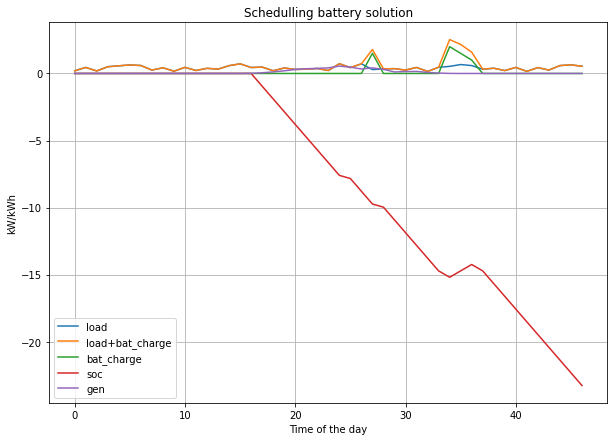

In [16]:
flex.makeplot(48,state_track[:,3],action_track,env.data[:,0],env.data[:,1],env) # O Tempo e o Env não estão a fazer nada
# makeplot(T,soc,sol,gen,load,env): Tempo, SOC, Bat_Charge, Generation, load, env

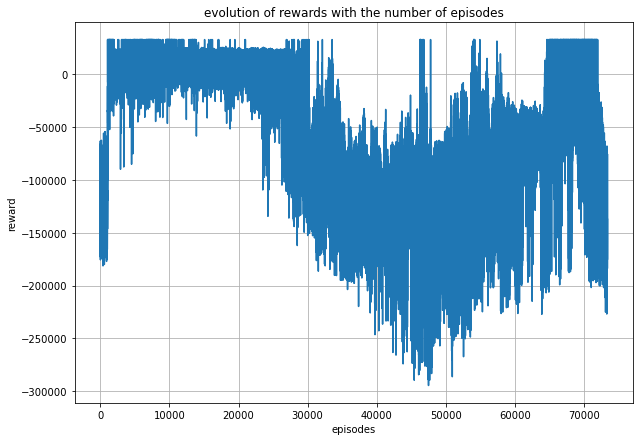

In [17]:
flex.reward_plot(env.R_Total)

In [18]:
evaluate_policy(model,env, n_eval_episodes=10)

/home/acr/anaconda3/lib/python3.9/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


-142939.84999999998
-142939.84999999998
-142939.84999999998
-142939.84999999998
-142939.84999999998
-142939.84999999998
-142939.84999999998
-142939.84999999998
-142939.84999999998
-142939.84999999998


(-142939.85203552246, 0.0)

# Studying the battery

In [19]:
SOC = state_track[:,3]
bat_charge = action_track # Bat_charge
gen = env.data[:,0]
load = env.data[:,1]

In [20]:
state_track

array([[ 0.00000000e+00,  0.00000000e+00,  1.97999999e-01,
         0.00000000e+00,  0.00000000e+00,  1.70000002e-01,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 1.00000000e+00,  0.00000000e+00,  4.49999988e-01,
         0.00000000e+00,  0.00000000e+00,  1.70000002e-01,
         1.17750000e+03,  0.00000000e+00,  1.17750000e+03],
       [ 2.00000000e+00,  0.00000000e+00,  1.86000004e-01,
         0.00000000e+00,  0.00000000e+00,  1.70000002e-01,
         2.36819995e+03,  0.00000000e+00,  1.19069995e+03],
       [ 3.00000000e+00,  0.00000000e+00,  5.04000008e-01,
         0.00000000e+00,  0.00000000e+00,  1.70000002e-01,
         3.34300000e+03,  0.00000000e+00,  9.74799988e+02],
       [ 4.00000000e+00,  0.00000000e+00,  5.69999993e-01,
         0.00000000e+00,  0.00000000e+00,  1.70000002e-01,
         4.31450000e+03,  0.00000000e+00,  9.71500000e+02],
       [ 5.00000000e+00,  0.00000000e+00,  6.35999978e-01,
         0.00000000e+00,  0.00000000e+00,  1.700000

In [21]:
def myplot(x):
    plt.figure(figsize=(10,6))
    plt.plot(x)

In [22]:
env.data

array([[0.0, 0.198],
       [0.0, 0.44999999999999996],
       [0.0, 0.186],
       [0.0, 0.504],
       [0.0, 0.5700000000000001],
       [0.0, 0.636],
       [0.0, 0.5940000000000001],
       [0.0, 0.252],
       [0.0, 0.42599999999999993],
       [0.0, 0.168],
       [0.0, 0.45599999999999996],
       [0.0, 0.22199999999999998],
       [0.0, 0.384],
       [0.0, 0.324],
       [0.0, 0.5820000000000001],
       [0.0, 0.72],
       [0.012, 0.44399999999999995],
       [0.05, 0.474],
       [0.115, 0.20400000000000001],
       [0.1975, 0.40800000000000003],
       [0.298, 0.30000000000000004],
       [0.3535, 0.318],
       [0.379, 0.372],
       [0.419, 0.22199999999999998],
       [0.551, 0.726],
       [0.4715, 0.43799999999999994],
       [0.3345, 0.72],
       [0.4165, 0.28800000000000003],
       [0.3045, 0.342],
       [0.1135, 0.36],
       [0.141, 0.252],
       [0.1525, 0.44999999999999996],
       [0.076, 0.15000000000000002],
       [0.029, 0.46199999999999997],
       [0.0

Text(0, 0.5, 'gen')

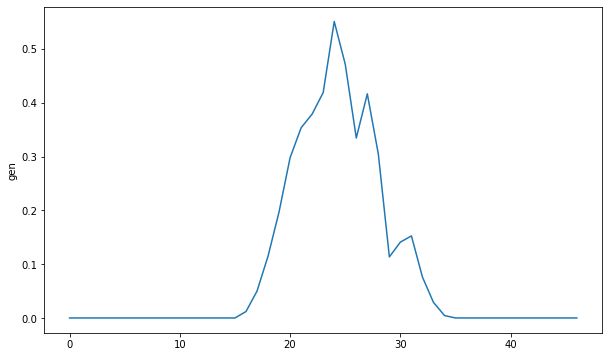

In [23]:
myplot(gen)
plt.ylabel('gen')

In [24]:
gen

array([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
       0.0, 0.0, 0.0, 0.012, 0.05, 0.115, 0.1975, 0.298, 0.3535, 0.379,
       0.419, 0.551, 0.4715, 0.3345, 0.4165, 0.3045, 0.1135, 0.141,
       0.1525, 0.076, 0.029, 0.0045, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
       0.0, 0.0, 0.0, 0.0, 0.0], dtype=object)

Text(0, 0.5, 'load')

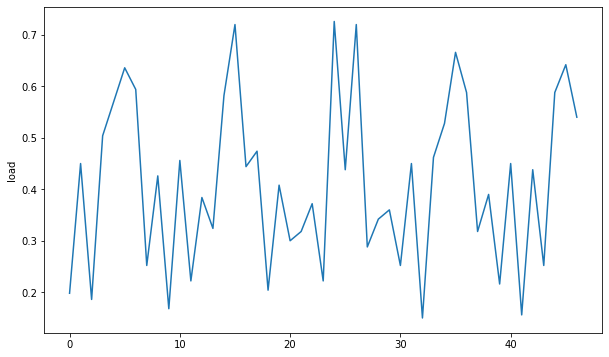

In [25]:
myplot(load)
plt.ylabel('load')

Text(0, 0.5, 'SOC')

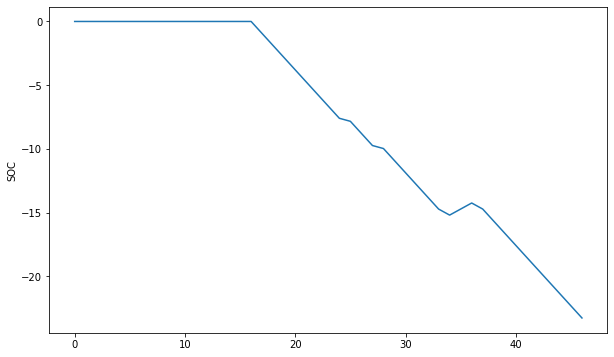

In [26]:
myplot(SOC)
plt.ylabel('SOC')

Text(0, 0.5, 'Battery Charge')

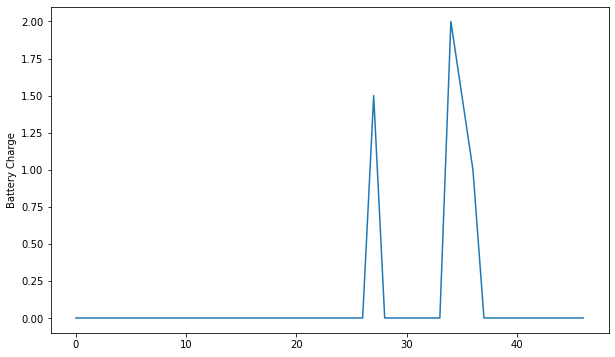

In [27]:
myplot(bat_charge)
plt.ylabel('Battery Charge')

Text(0, 0.5, 'Rewards track')

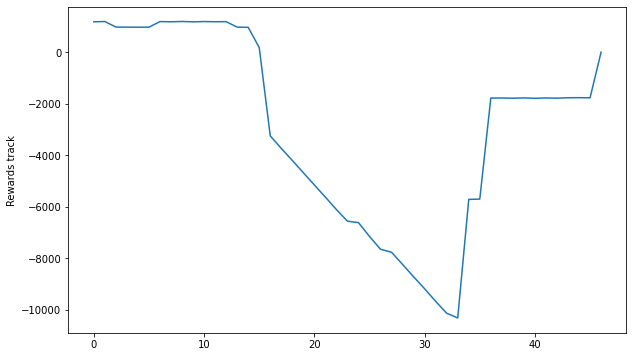

In [28]:
myplot(rewards_track)
plt.ylabel('Rewards track')

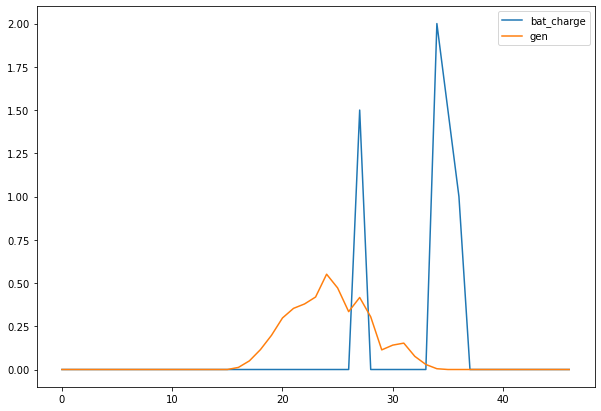

In [29]:
plt.figure(figsize=(10,7))
plt.legend
plt.plot(bat_charge,label='bat_charge')
plt.plot(gen,label='gen')
plt.legend()
plt.show()

In [30]:
eta = 0.95
dh=30*(1/60)

In [31]:
SOC

array([  0.    ,   0.    ,   0.    ,   0.    ,   0.    ,   0.    ,
         0.    ,   0.    ,   0.    ,   0.    ,   0.    ,   0.    ,
         0.    ,   0.    ,   0.    ,   0.    ,   0.    ,  -0.95  ,
        -1.9   ,  -2.85  ,  -3.8   ,  -4.75  ,  -5.7   ,  -6.65  ,
        -7.6   ,  -7.8375,  -8.7875,  -9.7375,  -9.975 , -10.925 ,
       -11.875 , -12.825 , -13.775 , -14.725 , -15.2   , -14.725 ,
       -14.25  , -14.725 , -15.675 , -16.625 , -17.575 , -18.525 ,
       -19.475 , -20.425 , -21.375 , -22.325 , -23.275 ], dtype=float32)

In [32]:
gen

array([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
       0.0, 0.0, 0.0, 0.012, 0.05, 0.115, 0.1975, 0.298, 0.3535, 0.379,
       0.419, 0.551, 0.4715, 0.3345, 0.4165, 0.3045, 0.1135, 0.141,
       0.1525, 0.076, 0.029, 0.0045, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
       0.0, 0.0, 0.0, 0.0, 0.0], dtype=object)

In [33]:
C=np.array(bat_charge)*eta*dh
Sum=[]
Sumi = 0
for i in range(len(np.array(bat_charge)*eta*dh)):
    Sumi+= C[i]
    Sum.append(Sumi)
Sum

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.7124999999999999,
 0.7124999999999999,
 0.7124999999999999,
 0.7124999999999999,
 0.7124999999999999,
 0.7124999999999999,
 0.7124999999999999,
 1.6624999999999999,
 2.375,
 2.85,
 2.85,
 2.85,
 2.85,
 2.85,
 2.85,
 2.85,
 2.85,
 2.85,
 2.85,
 2.85]